# Imports

In [6]:
# Standard library imports
import os
import itertools

# Third-party library imports
import anndata
import decoupler as dc
import gseapy as gp
import liana as ln
import matplotlib.pyplot as plt
import numpy as np
import omicverse as ov
import pandas as pd
import scanpy as sc
import scipy
import seaborn as sns
import umap
from gseapy.plot import gseaplot
from matplotlib.patches import Ellipse, Polygon
from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import pdist, squareform
from scipy.stats import linregress
from sklearn.cluster import KMeans
from sklearn.compose import ColumnTransformer
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    davies_bouldin_score,
    calinski_harabasz_score,
    make_scorer,
    roc_auc_score,
    silhouette_score,
)
from sklearn.mixture import BayesianGaussianMixture, GaussianMixture
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.tree import plot_tree
from statsmodels.nonparametric.smoothers_lowess import lowess
from tqdm import tqdm

# Set up plotting parameters
ov.ov_plot_set()

# Set global rcParams for consistent formatting
plt.rcParams.update({
    'figure.facecolor': 'white',
    'axes.facecolor': 'white',
    'savefig.facecolor': 'white',
    'legend.frameon': True,
    'legend.edgecolor': 'black',
    'legend.labelcolor': 'black',
    'legend.fontsize': 12,
    'axes.labelcolor': 'black',
    'xtick.color': 'black',
    'ytick.color': 'black',
    'text.color': 'black',
})

Dependency error: (gseapy 1.1.3 (/mnt/work/RO_src/venv/bulk_rna/lib/python3.10/site-packages), Requirement.parse('gseapy==0.10.8'))


# Read adata

In [4]:
def revert_from_string(adata):
    conversion_info = adata.uns.get('conversion_info', {})

    for key, original_type in conversion_info.items():
        df_name, col = key.split(':')
        df = getattr(adata, df_name)

        if 'datetime' in original_type.lower():
            df[col] = pd.to_datetime(df[col])
        elif 'timedelta' in original_type.lower():
            df[col] = pd.to_timedelta(df[col])
        elif original_type == 'category':
            df[col] = df[col].astype('category')
        elif 'int' in original_type.lower():
            df[col] = df[col].astype(int)
        elif 'float' in original_type.lower():
            df[col] = df[col].astype(float)
        elif 'bool' in original_type.lower():
            df[col] = df[col].astype(bool)
        # Add more type conversions as needed

    return adata

adata = anndata.read_h5ad("/mnt/work/RO_src/Projects/THORA/DataProcessing/data/processed/bulk_adata.h5ad")
adata = revert_from_string(adata)

# QC and Normalization

In [255]:
# Save the current adata to raw
adata.raw = adata.copy()

# Filter by RPM > 1. NOTE: This has to be done on the raw counts, not log normalized first. 
genes = dc.filter_by_expr(adata,lib_size=1e6, min_count=1)
len(genes)

# Subset adata with the filtered genes
adata = adata[:, genes].copy()

# Save the raw counts as a layer
adata.layers["raw_counts"] = adata.X.copy()

# Normalizing to median total counts
sc.pp.normalize_total(adata, target_sum=10e6) 
adata.layers["normalized_counts"] = adata.X.copy()
# Logarithmize the data
sc.pp.log1p(adata)
adata.layers["lognormalized_counts"] = adata.X.copy()

# NOTE: Not needed, but required for the 2nd use case for the GARD score.
# sc.pp.scale(adata, zero_center=True, max_value=None)
# adata.layers["scaled_lognormalized_counts"] = adata.X.copy()

# Revert back adata.X to the raw counts
adata.X = adata.layers["raw_counts"].copy()


normalizing counts per cell
    finished (0:00:00)


# Count matrix

In [22]:
count_matrix_raw = pd.DataFrame(adata.X, adata.obs.index, adata.var_names).T
count_matrix_raw.index.name = None
count_matrix_raw.to_excel(r"/mnt/work/RO_src/Projects/THORA/DataProcessing/data/count_matrix_raw.xlsx")

In [230]:
count_matrix_unt = pd.DataFrame(adata.X, adata.obs.index, adata.var_names)


In [228]:
adata.X = adata.layers["normalized_counts"].copy()
count_matrix_rpm = pd.DataFrame(adata.X, adata.obs.index, adata.var_names).T
adata.X = adata.layers["raw_counts"].copy()
#count_matrix_rpm.to_excel(r"/mnt/work/RO_src/Projects/THORA/DataProcessing/data/count_matrix_rpm.xlsx")

In [232]:
adata.X = adata.layers["lognormalized_counts"].copy()
count_matrix_log_rpm = pd.DataFrame(adata.X, adata.obs.index, adata.var_names).T
adata.X = adata.layers["raw_counts"].copy()
#count_matrix_log_rpm.to_excel(r"/mnt/work/RO_src/Projects/THORA/DataProcessing/data/count_matrix_log_rpm.xlsx")

In [91]:
adata.obs.to_excel("/mnt/work/RO_src/Projects/THORA/DataProcessing/data/temp.xlsx")

In [233]:
count_matrix_log_rpm_unt = count_matrix_log_rpm.T

# Preprocessing and Clustering


## Highly variable genes

In [256]:
sc.pp.highly_variable_genes(adata, n_top_genes=5000, layer="raw_counts",flavor="seurat_v3")


extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


In [257]:
adata.X = adata.layers["lognormalized_counts"].copy()
sc.tl.pca(adata, svd_solver="arpack",n_comps=30)
sc.pp.neighbors(adata,n_neighbors=15)
sc.tl.umap(adata)


computing PCA
    with n_comps=30
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)


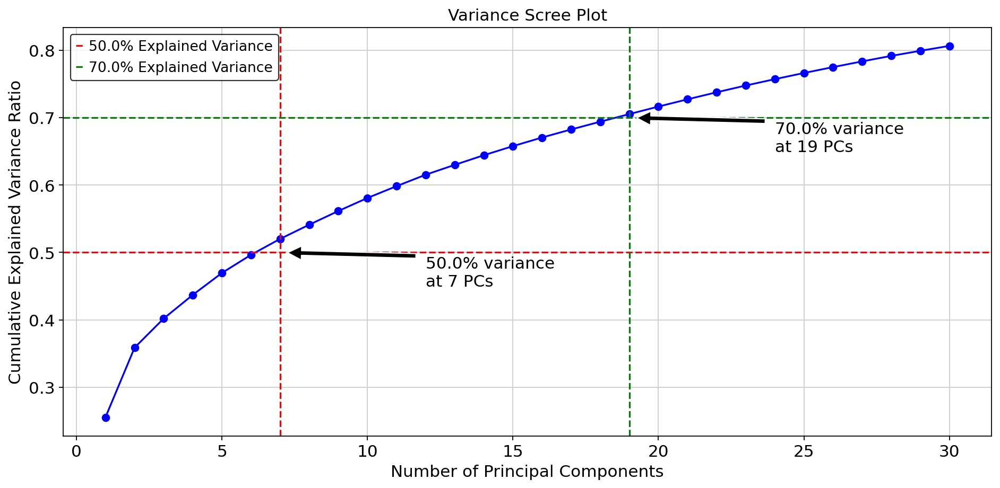

Maximum cumulative explained variance: 0.8066
Number of PCs: 30
Variance explained with 5 PCs: 0.4695
Variance explained with 10 PCs: 0.5808
Variance explained with 20 PCs: 0.7165
Cannot calculate for 50 PCs, max PCs is 30
Cannot calculate for 100 PCs, max PCs is 30


In [258]:


# Ensure PCA has been computed
if 'X_pca' not in adata.obsm.keys():
    sc.pp.pca(adata)

# Get the explained variance ratio
explained_variance_ratio = adata.uns['pca']['variance_ratio']

# Calculate the cumulative explained variance ratio
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)

# Create the plot
plt.figure(figsize=(12, 6))
plt.plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio, 'bo-')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Variance Scree Plot')

# Add lines for different thresholds
thresholds = [0.5, 0.7, 0.9]
colors = ['r', 'g', 'y']
for threshold, color in zip(thresholds, colors):
    if max(cumulative_variance_ratio) >= threshold:
        n_pcs = np.where(cumulative_variance_ratio >= threshold)[0][0] + 1
        plt.axhline(y=threshold, color=color, linestyle='--', label=f'{threshold*100}% Explained Variance')
        plt.axvline(x=n_pcs, color=color, linestyle='--')
        plt.annotate(f'{threshold*100}% variance\nat {n_pcs} PCs', 
                     xy=(n_pcs, threshold), 
                     xytext=(n_pcs+5, threshold-0.05),
                     arrowprops=dict(facecolor='black', shrink=0.05))

plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Print the maximum explained variance
max_variance = cumulative_variance_ratio[-1]
print(f"Maximum cumulative explained variance: {max_variance:.4f}")
print(f"Number of PCs: {len(cumulative_variance_ratio)}")

# Print variance explained at different numbers of PCs
pcs_to_check = [5, 10, 20, 50, 100]
for n_pcs in pcs_to_check:
    if n_pcs <= len(cumulative_variance_ratio):
        print(f"Variance explained with {n_pcs} PCs: {cumulative_variance_ratio[n_pcs-1]:.4f}")
    else:
        print(f"Cannot calculate for {n_pcs} PCs, max PCs is {len(cumulative_variance_ratio)}")

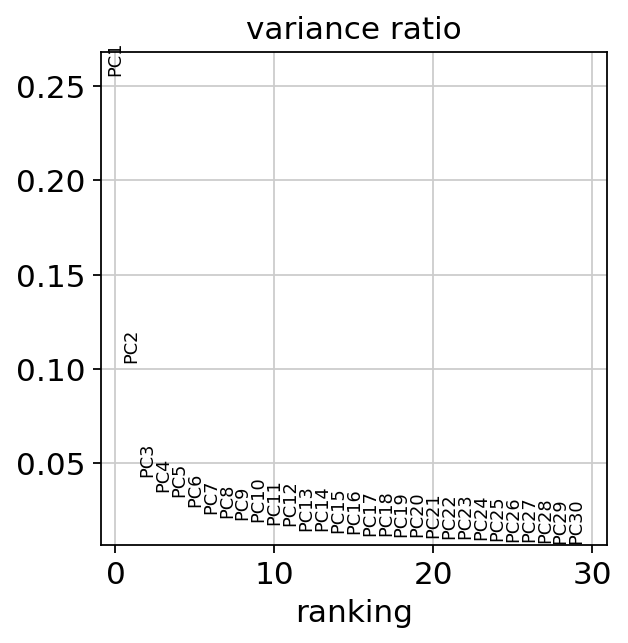

In [71]:
# Assuming you've already run PCA
sc.pl.pca_variance_ratio(adata, log=False)
plt.show()

In [ ]:


silhouette_scores = []
for n_pcs in range(5, 51, 5):
    adata_copy = adata.copy()
    sc.pp.neighbors(adata_copy, n_pcs=n_pcs)
    sc.tl.umap(adata_copy)
    
    # Filter out NaN values
    mask = ~adata_copy.obs['Arm'].isna()
    umap_coords = adata_copy.obsm['X_umap'][mask]
    labels = adata_copy.obs['Arm'][mask]
    
    if len(np.unique(labels)) > 1:  # Ensure we have at least 2 clusters
        score = silhouette_score(umap_coords, labels)
        silhouette_scores.append((n_pcs, score))
    else:
        print(f"Skipping n_pcs={n_pcs} due to insufficient unique labels")

if silhouette_scores:
    best_n_pcs = max(silhouette_scores, key=lambda x: x[1])[0]
    print(f"Best n_pcs based on silhouette score: {best_n_pcs}")
else:
    print("No valid silhouette scores calculated")

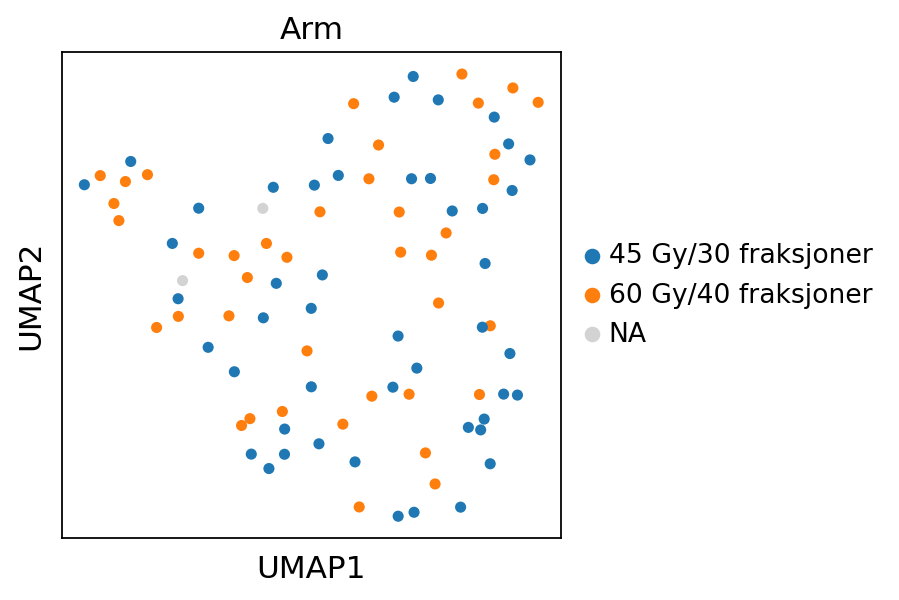

In [77]:
sc.pl.umap(
    adata,
    color="Arm",
    # Setting a smaller point size to get prevent overlap
    size=100,
)

# GARD score

In [259]:
manual_sets = {
	"Negative Radiation Sensitivity (RS)": {
		"AR": {"rank": ...},
		"PRKCB": {"rank": ...},
		"RELA": {"rank": ...},
		"SUMO1": {"rank": ...},
		"PAK2": {"rank": ...},
		"IRF1": {"rank": ...},
		"HDAC1": {"rank": ...}
	},
	"Positive Radiation Sensitivity (RR)": {
		"JUN": {"rank": ...},
		"STAT1": {"rank": ...},
		"ABL1": {"rank": ...}
	}
}

In [260]:
gene_lengths = adata.var["length"].copy()
gene_lengths.drop_duplicates(inplace=True)
set1 = set(adata.var_names.tolist())
set2 = set(gene_lengths.index)

common_genes = set1.intersection(set2)
gene_lengths = gene_lengths[gene_lengths.index.isin(common_genes)]
gene_lengths = gene_lengths[gene_lengths.index.isin(list(common_genes))]
adata = adata[:, list(gene_lengths.index)].copy()


## Regressing out

### LinReg

In [261]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import linregress
import itertools

# Step 1: Compute the average expression of each gene across all samples (mean expression)
#TODO: should we do log1p of the normalized_counts or log1p of lognormalized_counts?
mean_expression = adata.layers["normalized_counts"].mean(axis=0)

# Step 2: Compute log mean expression and log gene lengths
log_mean_expression = np.log1p(mean_expression)  # log transform of mean RPM expression
log_gene_lengths = np.log1p(gene_lengths.values)  # log transform of gene lengths

# Step 3: Fit a linear model based on the log mean expression and log gene lengths
slope, intercept, _, _, _ = linregress(log_gene_lengths, log_mean_expression)
fitted_values = intercept + slope * log_gene_lengths  # Predicted fitted values (based on the mean)

# Step 4: Prepare to store ranked sets for each sample with sample identifiers
ranked_sets_per_sample = {}

# Get log-normalized expression data for each sample (90 samples in total)
lognorm_data = adata.layers["lognormalized_counts"]

# Get sample names from adata.obs.index
sample_names = adata.obs.index

# Genes of interest (from manual_sets)
genes_of_interest = list(itertools.chain(*[list(gard_type_dict.keys()) for gard_type_dict in manual_sets.values()]))

# Iterate over each sample (axis 0 corresponds to samples)
for sample_idx in range(lognorm_data.shape[0]):
    # Step 5: Get the log-normalized expression for the current sample
    sample_expression = lognorm_data[sample_idx, :]

    # Apply log transformation to sample expression
    log_sample_expression = np.log1p(sample_expression)

    # Step 6: Subtract the precomputed fitted values (from the mean expression of all samples) for gene length - regressing out
    length_adjusted_expression = log_sample_expression - fitted_values

    # Step 7: Rank the genes by length-adjusted expression for this sample
    ranked_genes = np.argsort(length_adjusted_expression)[::-1]  # Reverse for descending order

    # Create a DataFrame to store the ranked genes for this sample
    ranked_genes_df = pd.DataFrame({
        "gene_name": adata.var_names[ranked_genes],
        "length_adjusted_expression": length_adjusted_expression[ranked_genes]
    })

    # Step 8: Filter ranked_genes_df to keep only the genes in manual_sets (genes of interest)
    filtered_ranked_genes_df = ranked_genes_df[ranked_genes_df["gene_name"].isin(genes_of_interest)]

    # Step 9: Re-rank the genes of interest relatively (from 1 to N where N is the number of genes of interest)
    filtered_ranked_genes_df["relative_rank"] = np.arange(len(filtered_ranked_genes_df), 0, -1)

    # Step 10: Prepare a ranked set for this sample
    ranked_set = {gard_type: {} for gard_type in manual_sets.keys()}  # Initialize empty ranked set

    # Update ranks in the manual_sets dictionary for this sample based on the relative rank
    for gard_type, gard_type_dict in manual_sets.items():
        for gene_name in gard_type_dict.keys():
            subset_ranked_df = filtered_ranked_genes_df.loc[filtered_ranked_genes_df["gene_name"] == gene_name]
            if not subset_ranked_df.empty:
                # Store the relative rank in the sample's ranked set
                ranked_set[gard_type][gene_name] = subset_ranked_df["relative_rank"].values[0]
            else:
                # If the gene is not found, it can be skipped or set to a default value (e.g., None)
                ranked_set[gard_type][gene_name] = None

    # Step 11: Map the ranked set to the sample name
    sample_name = sample_names[sample_idx]
    ranked_sets_per_sample[sample_name] = ranked_set

# After the loop, ranked_sets_per_sample will contain a dictionary
# where each key is a sample name and the value is the ranked set for that sample.


# ranked_sets_per_sample will be a dictionary, each sample name corresponding to its ranked set.


In [ ]:
ranked_genes_df

,gene_name,length_adjusted_expression
0,SNORA73B,-1.975921
1,MT-CO3,-2.067694
2,MT-ND3,-2.071017
3,MT-ATP6,-2.102729
4,MT-CO1,-2.125376
...,...,...
17057,ADAMTSL1,-6.327258
17058,PTPRN2,-6.338941
17059,CADM2,-6.355594
17060,DCC,-6.374370


In [ ]:
filtered_ranked_genes_df

,gene_name,length_adjusted_expression,relative_rank
563,JUN,-2.971419,10
750,RELA,-3.014011,9
6298,STAT1,-3.518834,8
6391,IRF1,-3.523439,7
6873,PAK2,-3.553110,6
7454,HDAC1,-3.589471,5
9247,SUMO1,-3.702575,4
11625,ABL1,-3.884571,3
13420,PRKCB,-4.119604,2
13856,AR,-4.198904,1


In [ ]:
# Example output for first sample:
print("Relative ranked set for sample 1 (by sample name):")
first_sample_name = sample_names[0]
print(f"{first_sample_name}: {ranked_sets_per_sample[first_sample_name]}")

Relative ranked set for sample 1 (by sample name):
R1_79: {'Negative Radiation Sensitivity (RS)': {'AR': 1, 'PRKCB': 2, 'RELA': 9, 'SUMO1': 8, 'PAK2': 6, 'IRF1': 5, 'HDAC1': 7}, 'Positive Radiation Sensitivity (RR)': {'JUN': 10, 'STAT1': 4, 'ABL1': 3}}


### Lowess

[5.13423085 5.40393209 5.6345758  ... 5.48373832 4.55529582 5.54751605]
['AR', 'PRKCB', 'RELA', 'SUMO1', 'PAK2', 'IRF1', 'HDAC1', 'JUN', 'STAT1', 'ABL1']


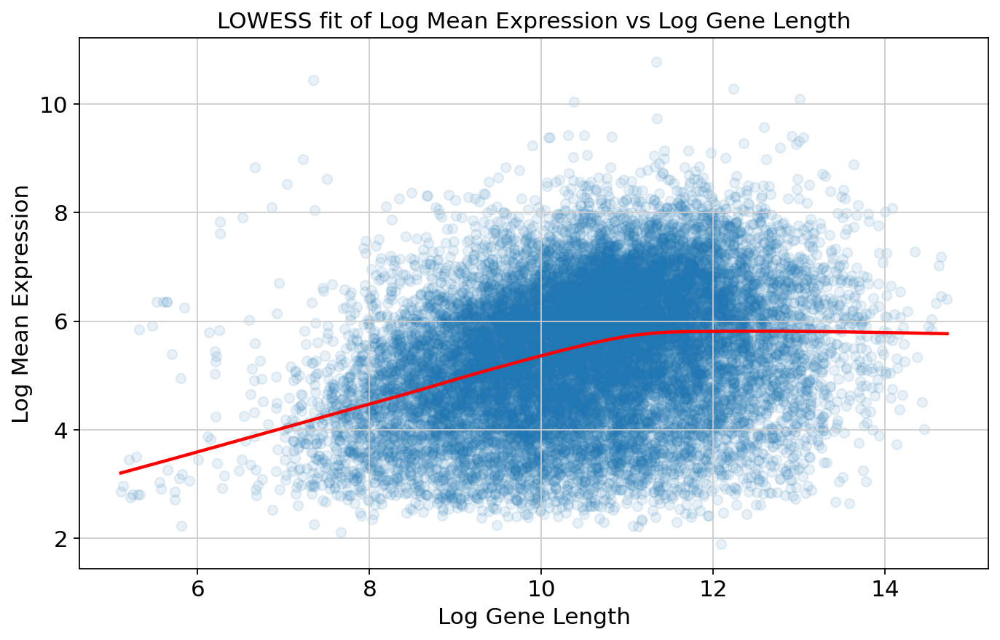

In [262]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.nonparametric.smoothers_lowess import lowess
import itertools

# Step 1: Compute the average expression of each gene across all samples (mean expression)
mean_expression = adata.layers["normalized_counts"].mean(axis=0)

# Step 2: Compute log mean expression and log gene lengths
log_mean_expression = np.log1p(mean_expression)  # log transform of mean RPM expression
log_gene_lengths = np.log1p(gene_lengths.values)  # log transform of gene lengths

# Step 3: Fit a LOWESS model based on the log mean expression and log gene lengths
lowess_result = lowess(log_mean_expression, log_gene_lengths, frac=0.7, it=5)
smoothed_log_lengths = lowess_result[:, 0]
smoothed_log_expression = lowess_result[:, 1]

# Interpolate the fitted values for all gene lengths
fitted_values = np.interp(log_gene_lengths, smoothed_log_lengths, smoothed_log_expression)
print(fitted_values)
# Step 4: Prepare to store ranked sets for each sample with sample identifiers
ranked_sets_per_sample = {}

# Get log-normalized expression data for each sample (90 samples in total)
lognorm_data = adata.layers["lognormalized_counts"]

# Get sample names from adata.obs.index
sample_names = adata.obs.index

# Genes of interest (from manual_sets)
genes_of_interest = list(itertools.chain(*[list(gard_type_dict.keys()) for gard_type_dict in manual_sets.values()]))
print(genes_of_interest)
# Iterate over each sample (axis 0 corresponds to samples)
for sample_idx in range(lognorm_data.shape[0]):
    # Step 5: Get the log-normalized expression for the current sample
    sample_expression = lognorm_data[sample_idx, :]

    # Apply log transformation to sample expression
    log_sample_expression = np.log1p(sample_expression)

    # Step 6: Subtract the precomputed fitted values (from the LOWESS fit) for gene length - regressing out
    length_adjusted_expression = log_sample_expression - fitted_values

    # Step 7: Rank the genes by length-adjusted expression for this sample
    ranked_genes = np.argsort(length_adjusted_expression)[::-1]  # Reverse for descending order

    # Create a DataFrame to store the ranked genes for this sample
    ranked_genes_df = pd.DataFrame({
        "gene_name": adata.var_names[ranked_genes],
        "length_adjusted_expression": length_adjusted_expression[ranked_genes]
    })

    # Step 8: Filter ranked_genes_df to keep only the genes in manual_sets (genes of interest)
    filtered_ranked_genes_df = ranked_genes_df[ranked_genes_df["gene_name"].isin(genes_of_interest)]

    # Step 9: Re-rank the genes of interest relatively (from 1 to N where N is the number of genes of interest)
    filtered_ranked_genes_df["relative_rank"] = np.arange(len(filtered_ranked_genes_df), 0, -1)

    # Step 10: Prepare a ranked set for this sample
    ranked_set = {gard_type: {} for gard_type in manual_sets.keys()}  # Initialize empty ranked set

    # Update ranks in the manual_sets dictionary for this sample based on the relative rank
    for gard_type, gard_type_dict in manual_sets.items():
        for gene_name in gard_type_dict.keys():
            subset_ranked_df = filtered_ranked_genes_df.loc[filtered_ranked_genes_df["gene_name"] == gene_name]
            if not subset_ranked_df.empty:
                # Store the relative rank in the sample's ranked set
                ranked_set[gard_type][gene_name] = subset_ranked_df["relative_rank"].values[0]
            else:
                # If the gene is not found, it can be skipped or set to a default value (e.g., None)
                ranked_set[gard_type][gene_name] = None

    # Step 11: Map the ranked set to the sample name
    sample_name = sample_names[sample_idx]
    ranked_sets_per_sample[sample_name] = ranked_set

# After the loop, ranked_sets_per_sample will contain a dictionary
# where each key is a sample name and the value is the ranked set for that sample.

# Visualize the LOWESS fit
plt.figure(figsize=(10, 6))
plt.scatter(log_gene_lengths, log_mean_expression, alpha=0.1)
plt.plot(smoothed_log_lengths, smoothed_log_expression, color='red', linewidth=2)
plt.xlabel('Log Gene Length')
plt.ylabel('Log Mean Expression')
plt.title('LOWESS fit of Log Mean Expression vs Log Gene Length')
plt.show()

## Ranking

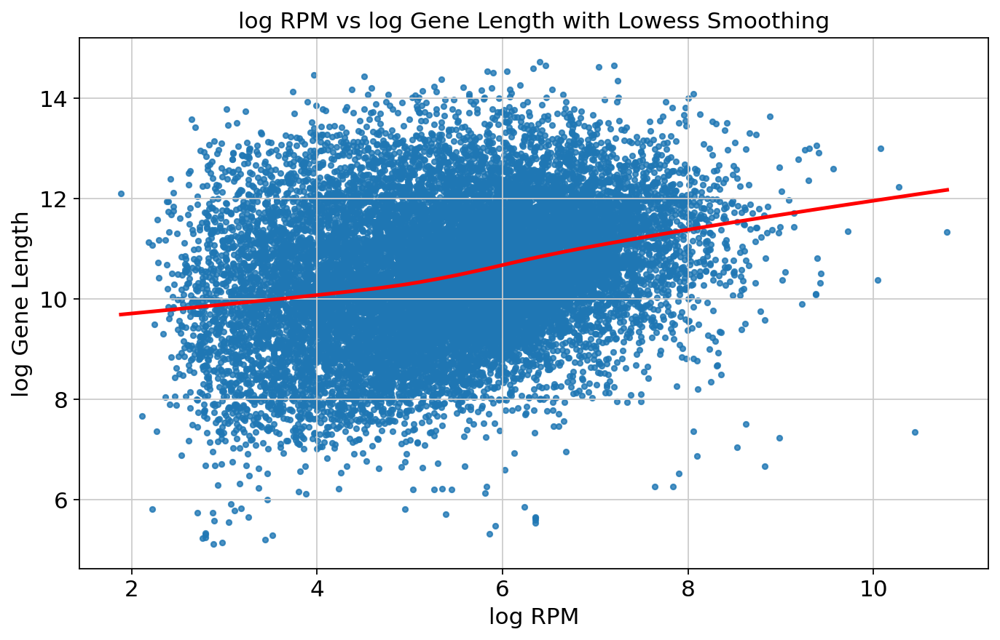

In [216]:
# Get the RPM counts
adata.X = adata.layers["normalized_counts"].copy()
# Step 4: Compute the average expression of each gene across all samples
mean_expression = adata.X.mean(axis=0)
# Step 5: Plot log RPM (mean_expression) vs log (gene length)
log_rpm = np.log1p(mean_expression)
# Step 6: Calculate log length
log_length = np.log1p(gene_lengths.values)

# Define a threshold for filtering
min_expression_threshold = 1

# Filter out genes with mean expression below the threshold
filtered_idx = mean_expression > min_expression_threshold
filtered_log_rpm = log_rpm[filtered_idx]
filtered_log_length = log_length[filtered_idx]

# Replot with filtered data
plt.figure(figsize=(10, 6))
sns.regplot(x=filtered_log_rpm, y=filtered_log_length, lowess=True,  line_kws={'color': 'red'},scatter_kws={'s':10})
plt.xlabel('log RPM')
plt.ylabel('log Gene Length')
plt.title('log RPM vs log Gene Length with Lowess Smoothing')
plt.show()


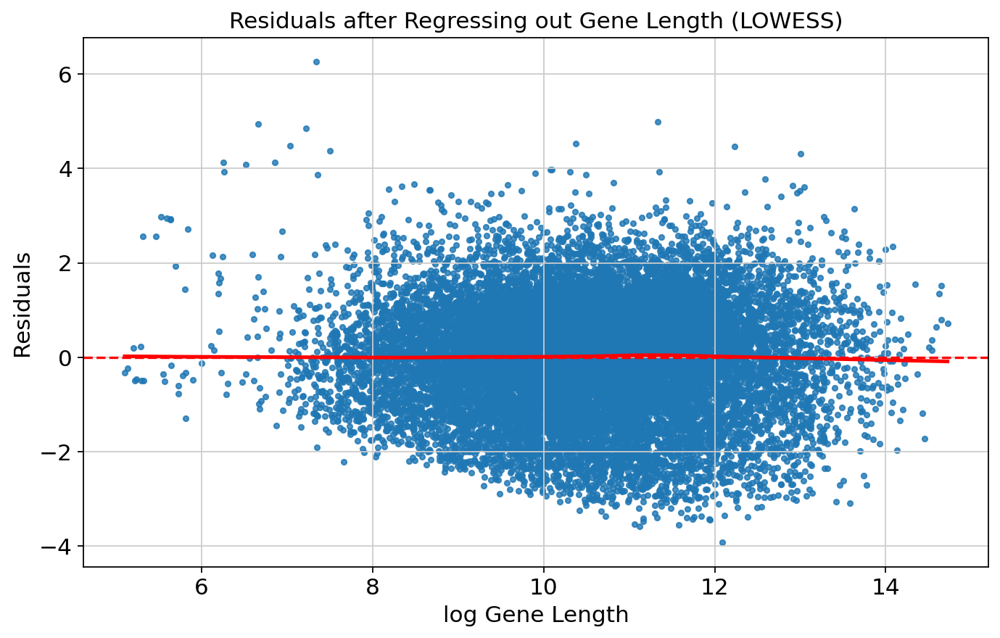

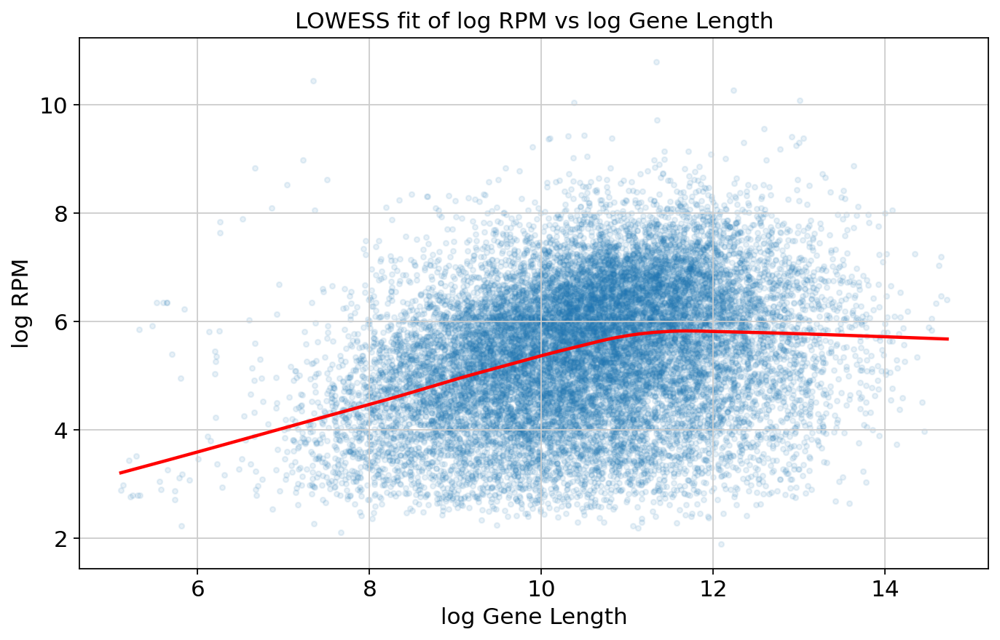

In [218]:


# Step 7: Fit a LOWESS model and use it to regress out the effect of gene length
lowess_result = lowess(log_rpm, log_length, frac=0.6, it=5)
smoothed_log_lengths = lowess_result[:, 0]
smoothed_log_rpm = lowess_result[:, 1]

# Interpolate the fitted values for all gene lengths
fitted_values = np.interp(log_length, smoothed_log_lengths, smoothed_log_rpm)

# Regress out the gene length effect
residuals = log_rpm - fitted_values

# Plot the residuals to check if they are centered around a horizontal line
plt.figure(figsize=(10, 6))
sns.regplot(x=log_length, y=residuals, lowess=True, line_kws={'color': 'red'}, scatter_kws={'s':10})
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('log Gene Length')
plt.ylabel('Residuals')
plt.title('Residuals after Regressing out Gene Length (LOWESS)')
plt.show()

# Optional: Plot the LOWESS fit
plt.figure(figsize=(10, 6))
plt.scatter(log_length, log_rpm, alpha=0.1, s=10)
plt.plot(smoothed_log_lengths, smoothed_log_rpm, color='red', linewidth=2)
plt.xlabel('log Gene Length')
plt.ylabel('log RPM')
plt.title('LOWESS fit of log RPM vs log Gene Length')
plt.show()

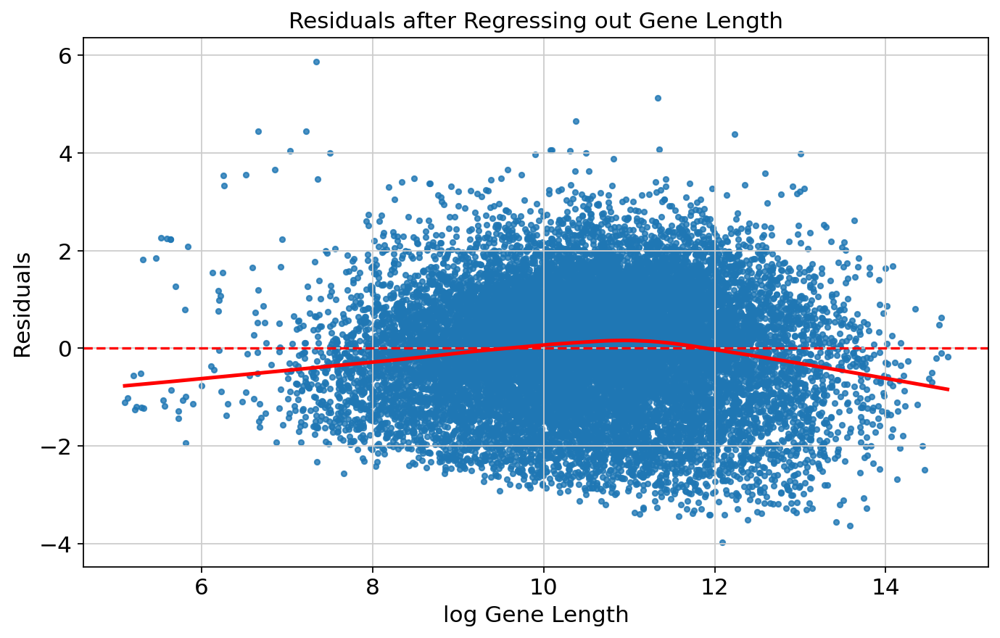

In [ ]:

# Step 7: Fit a linear model and use it to regress out the effect of gene length
slope, intercept, r_value, p_value, std_err = linregress(log_length, log_rpm)
fitted_values = intercept + slope * log_length

# Regress out the gene length effect
residuals = log_rpm - fitted_values
# Plot the residuals to check if they are centered around a horizontal line
plt.figure(figsize=(10, 6))
sns.regplot(x=log_length, y=residuals, lowess=True, line_kws={'color': 'red'},scatter_kws={'s':10})
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('log Gene Length')
plt.ylabel('Residuals')
plt.title('Residuals after Regressing out Gene Length')
plt.show()


In [263]:

# Step 7: Subtract the predicted length from the gene length (alternative method)
length_adjusted_expression = log_rpm - fitted_values

# Step 8: Rank the genes by highest and lowest mean-adjusted expression
ranked_genes = np.argsort(length_adjusted_expression)[::-1]

# Create a DataFrame to store the ranked genes
ranked_genes_df = pd.DataFrame({
    "gene_name": adata.var_names[ranked_genes],
    "length_adjusted_expression": length_adjusted_expression[ranked_genes]
})

# Display the top and bottom ranked genes
top_genes = ranked_genes_df.head(10)
bottom_genes = ranked_genes_df.tail(10)

print("Top 10 genes by length-adjusted expression:")
print(top_genes)

print("\nBottom 10 genes by length-adjusted expression:")
print(bottom_genes)

Top 10 genes by length-adjusted expression:
   gene_name  length_adjusted_expression
0     MT-CO1                    6.258122
1  MIR663AHG                    5.010692
2     MT-CO3                    4.942969
3     MT-ND4                    4.849401
4       XIST                    4.532259
5     MT-CYB                    4.476692
6    HELLPAR                    4.455144
7     MT-ND5                    4.368192
8       XACT                    4.268405
9       IGKC                    4.132711

Bottom 10 genes by length-adjusted expression:
             gene_name  length_adjusted_expression
17052        D21S2088E                   -3.392460
17053          COP1-DT                   -3.393824
17054          SLC12A1                   -3.409152
17055  ENSG00000289601                   -3.417105
17056  ENSG00000285826                   -3.433580
17057        LINC02877                   -3.463554
17058            WNT7A                   -3.514511
17059  ENSG00000236948                   -3.52874

Logarithm of p-value (logp):

result['logp'] = -np.log10(result['pvalue'])
This transforms the p-value into a more manageable scale. The negative log transformation makes small p-values (indicating high significance) larger and more positive. This is a common transformation in statistical analysis.
Sign of log2 fold change (fcsign):

result['fcsign'] = np.sign(result['log2FoldChange'])
This captures the direction of the effect: +1 for upregulated genes, -1 for downregulated genes, and 0 for no change.
Metric (metric):

result['metric'] = result['logp'] / result['fcsign']
The metric divides the signed log fold change into the log p-value, which adjusts the p-value by the direction of the fold change.
Interpretation:
Positive metric values correspond to significant upregulated genes.
Negative metric values correspond to significant downregulated genes.
High absolute values (both positive and negative) indicate genes with a strong signal, whether upregulated or downregulated.

In [264]:

def convert_column(df, column):
    if df[column].dtype == "object":
        try:
            df[column] = df[column].astype(int)
        except ValueError:
            try:
                df[column] = df[column].astype(float)
            except ValueError:
                df[column] = df[column].astype(str)


In [ ]:
sc.tl.rank_genes_groups(adata, layer="lognormalized_counts", groupby="Sample-Biosource",groups="all",method="wilcoxon",key_added="wilcoxon")

## Calculate GARD

In [265]:
ranked_sets_per_sample

{'R1_79': {'Negative Radiation Sensitivity (RS)': {'AR': 1,
   'PRKCB': 2,
   'RELA': 9,
   'SUMO1': 8,
   'PAK2': 6,
   'IRF1': 4,
   'HDAC1': 7},
  'Positive Radiation Sensitivity (RR)': {'JUN': 10, 'STAT1': 5, 'ABL1': 3}},
 'R2_07': {'Negative Radiation Sensitivity (RS)': {'AR': 2,
   'PRKCB': 1,
   'RELA': 9,
   'SUMO1': 6,
   'PAK2': 4,
   'IRF1': 5,
   'HDAC1': 7},
  'Positive Radiation Sensitivity (RR)': {'JUN': 10, 'STAT1': 8, 'ABL1': 3}},
 'R2_22': {'Negative Radiation Sensitivity (RS)': {'AR': 1,
   'PRKCB': 2,
   'RELA': 9,
   'SUMO1': 8,
   'PAK2': 6,
   'IRF1': 3,
   'HDAC1': 5},
  'Positive Radiation Sensitivity (RR)': {'JUN': 10, 'STAT1': 7, 'ABL1': 4}},
 'R1_74': {'Negative Radiation Sensitivity (RS)': {'AR': 1,
   'PRKCB': 2,
   'RELA': 9,
   'SUMO1': 5,
   'PAK2': 6,
   'IRF1': 4,
   'HDAC1': 8},
  'Positive Radiation Sensitivity (RR)': {'JUN': 10, 'STAT1': 7, 'ABL1': 3}},
 'R1_19': {'Negative Radiation Sensitivity (RS)': {'AR': 1,
   'PRKCB': 2,
   'RELA': 10,
   'SU

In [266]:

def GARD(adata, rank_dictionary):
    RSI_list = []
    
    for sample_name, rank_dict in rank_dictionary.items():
        # Initialize RSI score for the sample
        RSI = 0
        
        # Safely retrieve ranks and assign 0 if missing
        AR_rank = rank_dict["Negative Radiation Sensitivity (RS)"].get("AR", 0)
        JUN_rank = rank_dict["Positive Radiation Sensitivity (RR)"].get("JUN", 0)
        STAT1_rank = rank_dict["Positive Radiation Sensitivity (RR)"].get("STAT1", 0)
        PRKCB_rank = rank_dict["Negative Radiation Sensitivity (RS)"].get("PRKCB", 0)
        RELA_rank = rank_dict["Negative Radiation Sensitivity (RS)"].get("RELA", 0)
        ABL1_rank = rank_dict["Positive Radiation Sensitivity (RR)"].get("ABL1", 0)
        SUMO1_rank = rank_dict["Negative Radiation Sensitivity (RS)"].get("SUMO1", 0)
        PAK2_rank = rank_dict["Negative Radiation Sensitivity (RS)"].get("PAK2", 0)
        HDAC1_rank = rank_dict["Negative Radiation Sensitivity (RS)"].get("HDAC1", 0)
        IRF1_rank = rank_dict["Negative Radiation Sensitivity (RS)"].get("IRF1", 0)

        # Calculate RSI score based on ranks and predefined coefficients
        RSI = (
            (-0.0098009 * AR_rank)
            + (0.0128283 * JUN_rank)
            + (0.0254552 * STAT1_rank)
            + (-0.0017589 * PRKCB_rank)
            + (-0.0038171 * RELA_rank)
            + (-0.1070213 * ABL1_rank)
            + (-0.0002509 * SUMO1_rank)
            + (-0.0092431 * PAK2_rank)
            + (-0.0204469 * HDAC1_rank)
            + (0.0441683 * IRF1_rank)
        )

        # Append RSI score for the current sample
        RSI_list.append(RSI)

    # Assign the calculated RSI scores back to the adata.obs DataFrame
    adata.obs["RSI"] = RSI_list

    return adata.obs

# Execute the GARD function to calculate RSI scores and add them to adata.obs
GARD_final_df = GARD(adata, rank_dictionary=ranked_sets_per_sample)

# Print the updated adata.obs DataFrame to confirm the RSI score column
print(adata.obs.head())


       ID_Sample StudyID External_ID       Organ  SampleType Diagnosis Stage  \
R1_79   SFH31/22   TH093       TB-49  Lymph Node  Metastasis      SCLC    LD   
R2_07  SFH182/20   TH157       TB-32  Lymph Node  Metastasis       NaN    LD   
R2_22   SFH62/21   TH041       TB-75        Lung     Primary      SCLC    LD   
R1_74   SFH61/21   TH028       TB-74        Lung         NaN      SCLC    LD   
R1_19  SFH263/19   TH165       TB-46        Lung     Primary       NaN    LD   

       AnyPlasma                  Arm    Project_ID  ... middle_strale  \
R1_79       True  45 Gy/30 fraksjoner  GCF-2024-926  ...            No   
R2_07      False  60 Gy/40 fraksjoner  GCF-2024-926  ...            No   
R2_22      False  60 Gy/40 fraksjoner  GCF-2024-926  ...            No   
R1_74      False                  NaN  GCF-2024-926  ...           NaN   
R1_19       True  60 Gy/40 fraksjoner  GCF-2024-926  ...            No   

      time_since_t0  rt_dosage  chemo_dosage chemo_radiotherapy  \
R1_79  

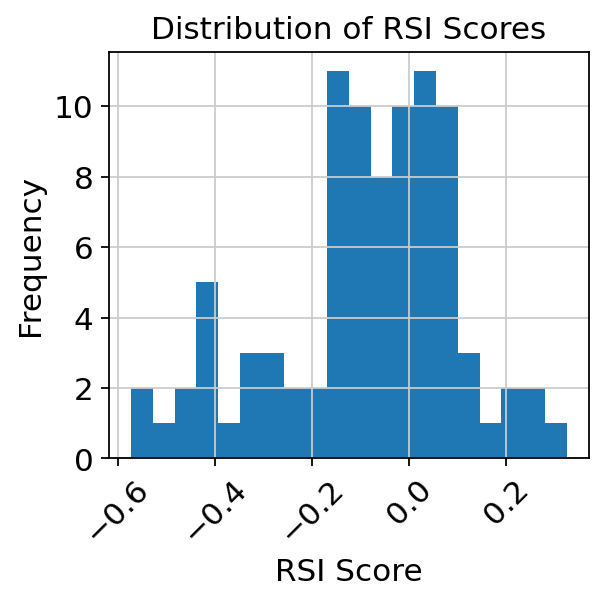

In [267]:
# Plot distribution histogram of RSI scores
adata.obs["RSI"].hist(bins=20)

# Add title and labels
plt.title("Distribution of RSI Scores")
plt.xlabel("RSI Score")
plt.ylabel("Frequency")

# Rotate x-axis tick labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()
plt.show()

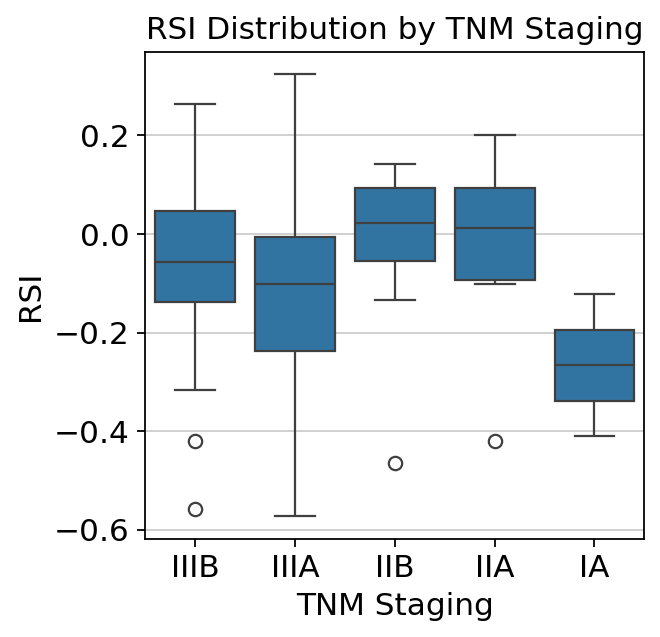

In [268]:
sns.boxplot(x='tnm_staging', y='RSI', data=adata.obs)
plt.title('RSI Distribution by TNM Staging')
plt.xlabel('TNM Staging')
plt.ylabel('RSI')
plt.show()


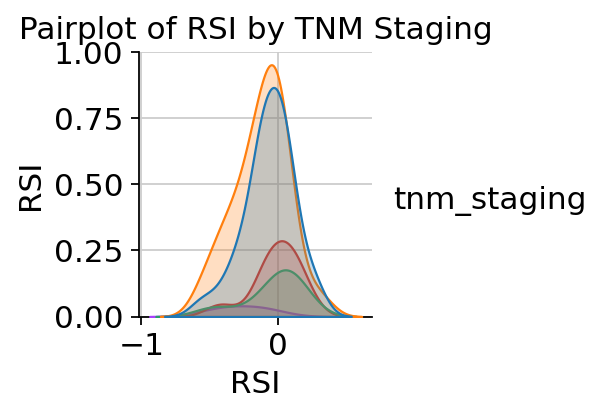

In [269]:
sns.pairplot(adata.obs, hue='tnm_staging', vars=['RSI'])
plt.title('Pairplot of RSI by TNM Staging')
plt.show()


In [298]:
count_matrix_log_rpm_unt

gene_name,TSPAN6,DPM1,SCYL3,C1ORF112,FGR,CFH,FUCA2,GCLC,NFYA,STPG1,...,ENSG00000291234,ENSG00000291242,ENSG00000291250,ENSG00000291264,ENSG00000291265,ENSG00000291267,ENSG00000291275,ENSG00000291282,ENSG00000291290,ENSG00000291299
R1_79,5.806788,6.828614,5.952981,6.637234,3.976872,5.548815,4.388186,5.702409,6.701214,5.734256,...,5.178624,5.906585,4.564404,2.804032,5.156528,4.859552,5.563795,4.203529,3.525214,6.173587
R2_07,5.923755,6.883206,6.567620,7.121682,2.880790,5.212339,5.068449,5.967789,7.042315,5.312912,...,5.650709,5.519627,3.135768,2.429738,4.830479,0.000000,4.365253,3.467850,4.261304,5.806306
R2_22,4.852170,6.576639,5.703854,6.377505,3.638819,5.881197,4.695874,6.087389,6.779399,5.561943,...,4.809950,5.183444,5.431859,3.098724,4.892680,2.190381,4.719754,4.481021,4.386842,5.843564
R1_19,4.429828,6.024129,5.030532,6.575509,6.910664,6.474219,3.988516,5.305207,6.972985,3.899307,...,2.840407,0.000000,6.325051,0.000000,2.323661,0.000000,5.015365,2.966612,5.547755,5.720406
R2_29,5.024414,6.485680,4.388461,5.904749,3.885881,6.180843,4.284479,5.748642,6.452806,5.107966,...,4.037094,5.798085,3.989186,2.191836,5.336300,0.000000,5.348978,0.000000,0.000000,6.652811
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
R2_56,6.368212,7.206511,6.249771,5.763505,5.359609,5.378568,5.215758,7.262286,6.388939,4.671153,...,3.627809,5.259013,6.217831,0.000000,6.318111,5.359609,6.088055,0.000000,5.502082,5.433381
R2_12,5.397824,6.103710,6.147417,6.065769,5.081067,6.280681,4.899987,5.869899,6.483277,4.924498,...,4.948422,0.000000,4.849085,3.433658,5.016942,3.319901,3.863900,3.191521,3.433658,5.841271
R2_33,6.182613,6.646982,5.942894,6.606595,3.372483,5.990973,4.690535,6.383789,6.182613,5.715781,...,5.715781,6.694550,5.121335,1.207736,5.288548,5.462093,5.462093,3.651552,2.984024,6.211265
R2_36,6.071373,6.416010,5.771231,6.598059,4.046053,6.771795,5.340370,5.926023,6.270085,5.408262,...,4.371363,3.327356,4.870901,4.541217,5.995273,3.749927,4.730416,4.274229,3.022270,6.466623


In [299]:
adata.obs

,ID_Sample,StudyID,External_ID,Organ,SampleType,Diagnosis,Stage,AnyPlasma,Arm,Project_ID,...,chemo_radiotherapy,after_progression,age_at_sample,before_after_progression,batch,RSI,leiden-2,NE Type,leiden-4,Subtype
R1_79,SFH31/22,TH093,TB-49,Lymph Node,Metastasis,SCLC,LD,True,45 Gy/30 fraksjoner,GCF-2024-926,...,Baseline,-4.566360,68.0,0.0,mRNA,-0.137098,0,NE,3,P
R2_07,SFH182/20,TH157,TB-32,Lymph Node,Metastasis,NaN,LD,False,60 Gy/40 fraksjoner,GCF-2024-926,...,Baseline,-10.512484,72.0,0.0,mRNA,-0.005619,0,NE,1,A
R2_22,SFH62/21,TH041,TB-75,Lung,Primary,SCLC,LD,False,60 Gy/40 fraksjoner,GCF-2024-926,...,Baseline,NaN,71.0,0.0,mRNA,-0.196484,0,NE,2,N
R1_19,SFH263/19,TH165,TB-46,Lung,Primary,NaN,LD,True,60 Gy/40 fraksjoner,GCF-2024-926,...,Baseline,NaN,71.0,0.0,mRNA,0.085820,1,Non-NE,0,Y
R2_29,SFH9/23,TH104,TB-96,Lung,Primary,SCLC,LD,True,45 Gy/30 fraksjoner,GCF-2024-926,...,Baseline,-11.727989,71.0,0.0,mRNA,-0.409561,0,NE,2,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
R2_56,SFH257/19,TH130,TB-40,Lymph Node,Metastasis,NaN,LD,True,45 Gy/30 fraksjoner,GCF-2024-926,...,Baseline,-18.659658,77.0,0.0,mRNA,0.078759,0,NE,1,A
R2_12,SFH78/21,TH115,TB-93,Lung,Primary,SCLC,LD,False,45 Gy/30 fraksjoner,GCF-2024-926,...,Baseline,NaN,66.0,0.0,mRNA,0.220832,1,Non-NE,0,Y
R2_33,SFH26/23.1,TH006,TB-43,Lung,Primary,SCLC,LD,False,60 Gy/40 fraksjoner,GCF-2024-926,...,Baseline,-14.717477,71.0,0.0,mRNA,-0.165336,0,NE,2,N
R2_36,SFH33/23,TH088,TB-53,Lung,Primary,SCLC,LD,False,60 Gy/40 fraksjoner,GCF-2024-926,...,Baseline,-30.584757,64.0,0.0,mRNA,-0.027630,1,Non-NE,0,Y


In [302]:
# Save adata for ggplot2 visualizations
adata.obs.to_excel("/mnt/work/RO_src/Projects/THORA/DataProcessing/data/processed/adata_obs_rpm_for_ggplot4.xlsx")
# Merge the count data with the clinical data using the count_matrix_log_rpm and the adata.obs by using the columns on the count_matrix_log_rpm matching with the indices in the adata.obs dataframe
merged_df_with_clinical = adata.obs.merge(
	right=count_matrix_log_rpm_unt,
	left_index=True,
	right_index=True,
	how="left")
gene_names = pd.DataFrame(adata.var_names, columns=["Genes"])

#Put the gene_names in an excel with the col "Genes" using adata.var_names to populate the values of this column
gene_names.to_excel(r"/mnt/work/RO_src/Projects/THORA/DataProcessing/data/gene_names_v2.xlsx")
merged_df_with_clinical.to_csv("/mnt/work/RO_src/Projects/THORA/DataProcessing/data/adata_sample_counts_and_clinical_rpm_v2.csv")

In [303]:
merged_df_with_clinical

,ID_Sample,StudyID,External_ID,Organ,SampleType,Diagnosis,Stage,AnyPlasma,Arm,Project_ID,...,ENSG00000291234,ENSG00000291242,ENSG00000291250,ENSG00000291264,ENSG00000291265,ENSG00000291267,ENSG00000291275,ENSG00000291282,ENSG00000291290,ENSG00000291299
R1_79,SFH31/22,TH093,TB-49,Lymph Node,Metastasis,SCLC,LD,True,45 Gy/30 fraksjoner,GCF-2024-926,...,5.178624,5.906585,4.564404,2.804032,5.156528,4.859552,5.563795,4.203529,3.525214,6.173587
R2_07,SFH182/20,TH157,TB-32,Lymph Node,Metastasis,NaN,LD,False,60 Gy/40 fraksjoner,GCF-2024-926,...,5.650709,5.519627,3.135768,2.429738,4.830479,0.000000,4.365253,3.467850,4.261304,5.806306
R2_22,SFH62/21,TH041,TB-75,Lung,Primary,SCLC,LD,False,60 Gy/40 fraksjoner,GCF-2024-926,...,4.809950,5.183444,5.431859,3.098724,4.892680,2.190381,4.719754,4.481021,4.386842,5.843564
R1_19,SFH263/19,TH165,TB-46,Lung,Primary,NaN,LD,True,60 Gy/40 fraksjoner,GCF-2024-926,...,2.840407,0.000000,6.325051,0.000000,2.323661,0.000000,5.015365,2.966612,5.547755,5.720406
R2_29,SFH9/23,TH104,TB-96,Lung,Primary,SCLC,LD,True,45 Gy/30 fraksjoner,GCF-2024-926,...,4.037094,5.798085,3.989186,2.191836,5.336300,0.000000,5.348978,0.000000,0.000000,6.652811
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
R2_56,SFH257/19,TH130,TB-40,Lymph Node,Metastasis,NaN,LD,True,45 Gy/30 fraksjoner,GCF-2024-926,...,3.627809,5.259013,6.217831,0.000000,6.318111,5.359609,6.088055,0.000000,5.502082,5.433381
R2_12,SFH78/21,TH115,TB-93,Lung,Primary,SCLC,LD,False,45 Gy/30 fraksjoner,GCF-2024-926,...,4.948422,0.000000,4.849085,3.433658,5.016942,3.319901,3.863900,3.191521,3.433658,5.841271
R2_33,SFH26/23.1,TH006,TB-43,Lung,Primary,SCLC,LD,False,60 Gy/40 fraksjoner,GCF-2024-926,...,5.715781,6.694550,5.121335,1.207736,5.288548,5.462093,5.462093,3.651552,2.984024,6.211265
R2_36,SFH33/23,TH088,TB-53,Lung,Primary,SCLC,LD,False,60 Gy/40 fraksjoner,GCF-2024-926,...,4.371363,3.327356,4.870901,4.541217,5.995273,3.749927,4.730416,4.274229,3.022270,6.466623


# Clustering

###  NE vs non-NE

In [270]:
sc.tl.leiden(adata,resolution=.4, key_added="leiden_2")
sc.tl.dendrogram(adata, groupby = "leiden_2")

temp_count_matrix = pd.DataFrame(adata.layers["lognormalized_counts"], adata.obs.index, adata.var_names)
# Add on index 1 the "leiden" variable from adata.obs to the temp_count_matrix
temp_count_matrix.insert(loc=0, column="leiden", value=adata.obs["leiden_2"])
grapher_cm = temp_count_matrix.groupby("leiden").median()[["ASCL1","NEUROD1","POU2F3","YAP1","RB1","TP53","MYC","BCL2","TTF1","SLFN11","KRAS", "CHGA","SYP","NCAM1","DLL3","IGFBP5","INSM1","SOX2","AURKA","IGF1R","SOX9","GFI1B","HES6","NFIB","CREBBP","EZH2","RET","AJUBA","CDK4"]]


running Leiden clustering
    finished: found 2 clusters and added
    'leiden_2', the cluster labels (adata.obs, categorical) (0:00:00)
    using 'X_pca' with n_pcs = 30
Storing dendrogram info using `.uns['dendrogram_leiden_2']`


In [308]:
adata_temp = adata.copy()
adata_temp = adata_temp[:,["ASCL1","NEUROD1","POU2F3","YAP1","RB1","TP53","MYC","BCL2","TTF1","SLFN11","KRAS", "CHGA","SYP","NCAM1","DLL3","IGFBP5","INSM1","SOX2","AURKA","IGF1R","SOX9","GFI1B","HES6","NFIB","CREBBP","EZH2","RET","AJUBA","CDK4"]]

In [309]:
adata_temp

View of AnnData object with n_obs × n_vars = 88 × 29
    obs: 'ID_Sample', 'StudyID', 'External_ID', 'Organ', 'SampleType', 'Diagnosis', 'Stage', 'AnyPlasma', 'Arm', 'Project_ID', 'Organism', 'Sample_Biosource', 'RIN', 'Concentration', 'Flowcell_Name', 'Flowcell_ID', 'R1', 'R1_md5sum', 'R2', 'R2_md5sum', 'Elution.volume..uL.', 'RNA.con.ng.uL', 'Isolation.kit', 'BiopsyVsBehstart', 'pasnr', 'hospital', 'birth_date', 'radio_arm', 'tnm_staging', 'start_date', 'death_date', 'death_date_v2', 'ink_1', 'sex', 'age', 'pf', 'age70', 'actualrandarm', 'randarm', 'age65', 'status', 'brain-metastasis', 'chemo_1', 'chemo_2', 'chemo_3', 'chemo_4', 'no_chemo', 'trt', 'radio_dose', 'royk', 'performance_status', 'performance_status_2023', 'overall_survival', 'progression_status', 'progression', 'progression_date', 'updated_pfs', 'status_pfs', 'status_ttp', 'status_os', 'ttp_05_24', 'pfs_2023', 'start_strale', 'end_strale', 'ttp_2023_taha', 'pfs_date', 'ttp_date', 'os_date', 'pfs_corr', 'ttp_corr', 'os_co

In [319]:
sc.tl.pca(adata_temp, svd_solver="arpack",n_comps=10)


computing PCA
    with n_comps=10
    finished (0:00:00)


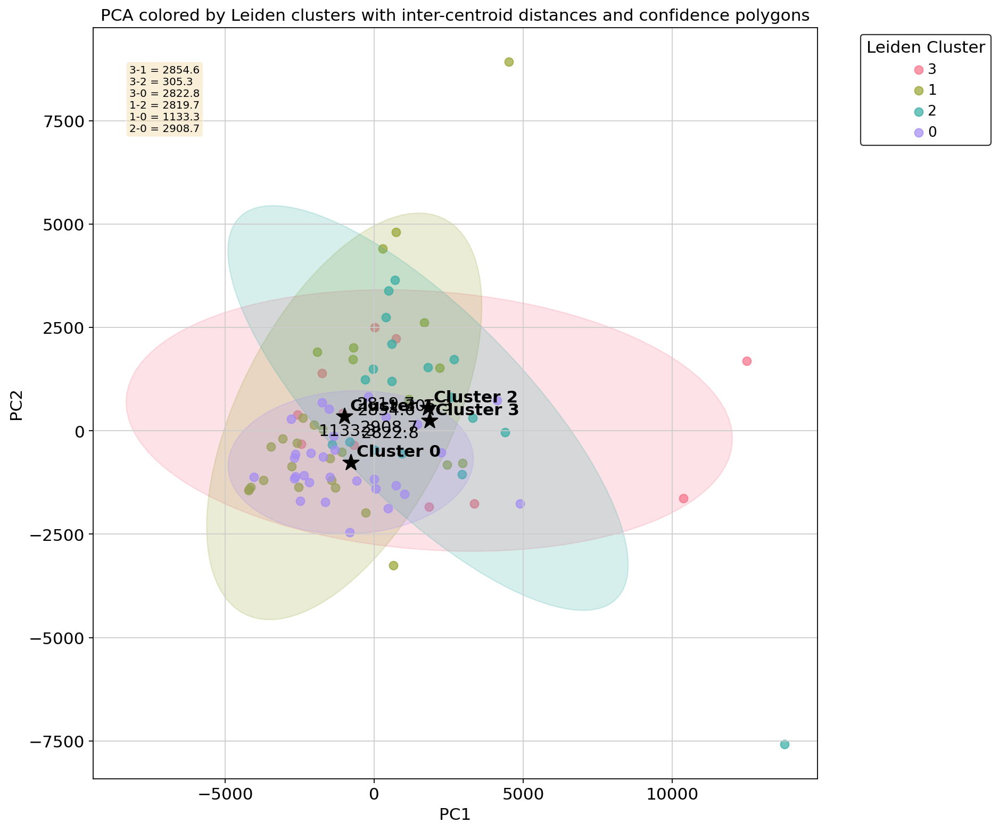

In [320]:


def confidence_polygon(x, y, ax, n_std=2.0, **kwargs):
    """
    Create a polygon approximation of the confidence ellipse of *x* and *y*.
    """
    if x.size != y.size:
        raise ValueError("x and y must be the same size")

    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    
    scale_x = np.sqrt(cov[0, 0]) * n_std
    scale_y = np.sqrt(cov[1, 1]) * n_std
    
    # Generate points on a circle
    theta = np.linspace(0, 2*np.pi, 100)
    circle = np.array([np.cos(theta), np.sin(theta)])
    
    # Transform circle to ellipse
    ellipse = np.array([ell_radius_x*circle[0], ell_radius_y*circle[1]])
    
    # Rotate and scale the ellipse
    rotation_matrix = np.array([[np.cos(np.pi/4), -np.sin(np.pi/4)],
                                [np.sin(np.pi/4), np.cos(np.pi/4)]])
    ellipse = np.dot(rotation_matrix, ellipse)
    ellipse[0] *= scale_x
    ellipse[1] *= scale_y
    
    # Move to center
    ellipse[0] += np.mean(x)
    ellipse[1] += np.mean(y)
    
    # Create polygon
    polygon = Polygon(ellipse.T, **kwargs)
    return ax.add_patch(polygon)

# Ensure PCA has been computed
if 'X_pca' not in adata_temp.obsm:
    sc.pp.pca(adata_temp)

# Calculate centroids for each cluster
pca_coords = adata_temp.obsm['X_pca'][:, :2]  # Use first two PCs
leiden_clusters = adata_temp.obs['leiden-4']
centroids = {cluster: pca_coords[leiden_clusters == cluster].mean(axis=0) 
             for cluster in leiden_clusters.unique()}

# Calculate inter-centroid distances
centroid_points = np.array(list(centroids.values()))
distances = pdist(centroid_points)
dist_matrix = squareform(distances)

# Create a color palette
n_clusters = len(leiden_clusters.unique())
color_palette = sns.color_palette("husl", n_colors=n_clusters)

# Create the plot
fig, ax = plt.subplots(figsize=(12, 10))

# Plot each Leiden cluster and its confidence polygon
for idx, cluster in enumerate(leiden_clusters.unique()):
    mask = leiden_clusters == cluster
    cluster_pca = pca_coords[mask]
    color = color_palette[idx]
    ax.scatter(cluster_pca[:, 0], cluster_pca[:, 1], 
               label=cluster, s=50, alpha=0.7, color=color)
    confidence_polygon(cluster_pca[:, 0], cluster_pca[:, 1], ax, n_std=2.0, 
                       facecolor=color, edgecolor=color, alpha=0.2)

# Plot centroids and connect them
for cluster, (x, y) in centroids.items():
    ax.scatter(x, y, s=200, c='black', marker='*')
    ax.annotate(f'Cluster {cluster}', (x, y), xytext=(5, 5), 
                textcoords='offset points', fontweight='bold')

# Add distance annotations
clusters = list(centroids.keys())
for i in range(len(clusters)):
    for j in range(i+1, len(clusters)):
        ci, cj = clusters[i], clusters[j]
        mid_x = (centroids[ci][0] + centroids[cj][0]) / 2
        mid_y = (centroids[ci][1] + centroids[cj][1]) / 2
        ax.annotate(f'{dist_matrix[i,j]:.1f}', (mid_x, mid_y), 
                    xytext=(0, 3), textcoords='offset points', ha='center')

# Customize the plot
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_title('PCA colored by Leiden clusters with inter-centroid distances and confidence polygons')
ax.legend(title='Leiden Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')

# Add a text box with distance information
textstr = '\n'.join([f'{clusters[i]}-{clusters[j]} = {dist_matrix[i,j]:.1f}' 
                     for i in range(len(clusters)) 
                     for j in range(i+1, len(clusters))])
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=9,
        verticalalignment='top', bbox=props)

plt.tight_layout()
plt.show()

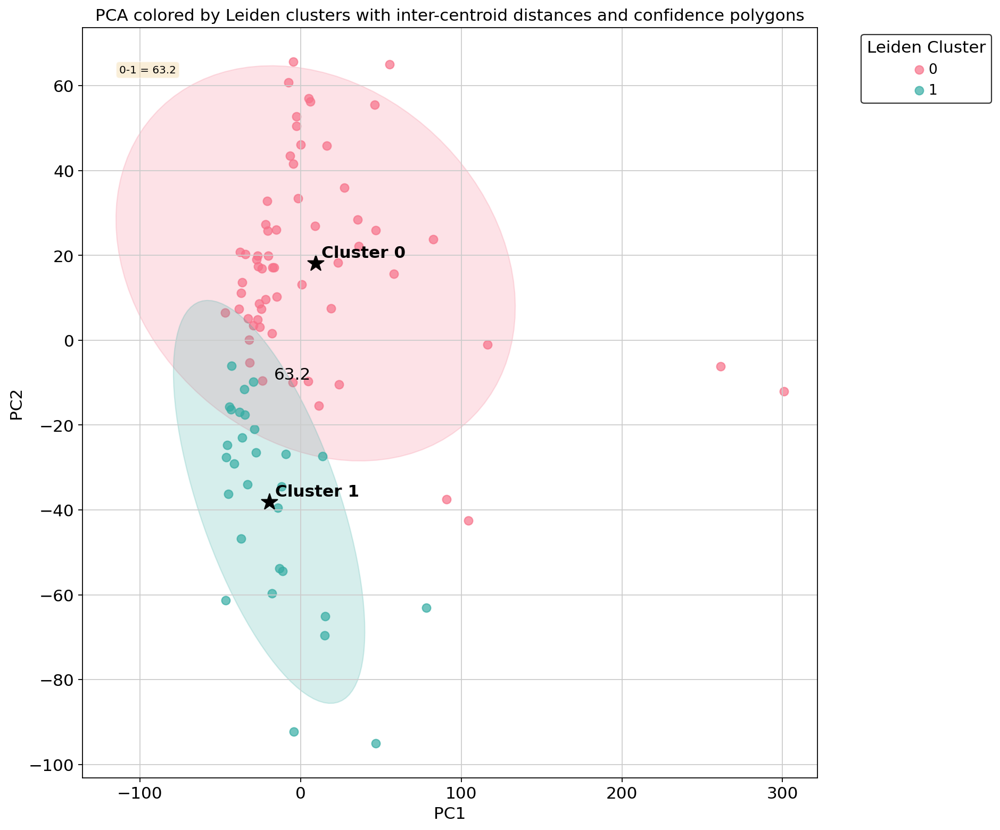

In [271]:


def confidence_polygon(x, y, ax, n_std=2.0, **kwargs):
    """
    Create a polygon approximation of the confidence ellipse of *x* and *y*.
    """
    if x.size != y.size:
        raise ValueError("x and y must be the same size")

    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    
    scale_x = np.sqrt(cov[0, 0]) * n_std
    scale_y = np.sqrt(cov[1, 1]) * n_std
    
    # Generate points on a circle
    theta = np.linspace(0, 2*np.pi, 100)
    circle = np.array([np.cos(theta), np.sin(theta)])
    
    # Transform circle to ellipse
    ellipse = np.array([ell_radius_x*circle[0], ell_radius_y*circle[1]])
    
    # Rotate and scale the ellipse
    rotation_matrix = np.array([[np.cos(np.pi/4), -np.sin(np.pi/4)],
                                [np.sin(np.pi/4), np.cos(np.pi/4)]])
    ellipse = np.dot(rotation_matrix, ellipse)
    ellipse[0] *= scale_x
    ellipse[1] *= scale_y
    
    # Move to center
    ellipse[0] += np.mean(x)
    ellipse[1] += np.mean(y)
    
    # Create polygon
    polygon = Polygon(ellipse.T, **kwargs)
    return ax.add_patch(polygon)

# Ensure PCA has been computed
if 'X_pca' not in adata.obsm:
    sc.pp.pca(adata)

# Calculate centroids for each cluster
pca_coords = adata.obsm['X_pca'][:, :2]  # Use first two PCs
leiden_clusters = adata.obs['leiden_2']
centroids = {cluster: pca_coords[leiden_clusters == cluster].mean(axis=0) 
             for cluster in leiden_clusters.unique()}

# Calculate inter-centroid distances
centroid_points = np.array(list(centroids.values()))
distances = pdist(centroid_points)
dist_matrix = squareform(distances)

# Create a color palette
n_clusters = len(leiden_clusters.unique())
color_palette = sns.color_palette("husl", n_colors=n_clusters)

# Create the plot
fig, ax = plt.subplots(figsize=(12, 10))

# Plot each Leiden cluster and its confidence polygon
for idx, cluster in enumerate(leiden_clusters.unique()):
    mask = leiden_clusters == cluster
    cluster_pca = pca_coords[mask]
    color = color_palette[idx]
    ax.scatter(cluster_pca[:, 0], cluster_pca[:, 1], 
               label=cluster, s=50, alpha=0.7, color=color)
    confidence_polygon(cluster_pca[:, 0], cluster_pca[:, 1], ax, n_std=2.0, 
                       facecolor=color, edgecolor=color, alpha=0.2)

# Plot centroids and connect them
for cluster, (x, y) in centroids.items():
    ax.scatter(x, y, s=200, c='black', marker='*')
    ax.annotate(f'Cluster {cluster}', (x, y), xytext=(5, 5), 
                textcoords='offset points', fontweight='bold')

# Add distance annotations
clusters = list(centroids.keys())
for i in range(len(clusters)):
    for j in range(i+1, len(clusters)):
        ci, cj = clusters[i], clusters[j]
        mid_x = (centroids[ci][0] + centroids[cj][0]) / 2
        mid_y = (centroids[ci][1] + centroids[cj][1]) / 2
        ax.annotate(f'{dist_matrix[i,j]:.1f}', (mid_x, mid_y), 
                    xytext=(0, 3), textcoords='offset points', ha='center')

# Customize the plot
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_title('PCA colored by Leiden clusters with inter-centroid distances and confidence polygons')
ax.legend(title='Leiden Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')

# Add a text box with distance information
textstr = '\n'.join([f'{clusters[i]}-{clusters[j]} = {dist_matrix[i,j]:.1f}' 
                     for i in range(len(clusters)) 
                     for j in range(i+1, len(clusters))])
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=9,
        verticalalignment='top', bbox=props)

plt.tight_layout()
plt.show()

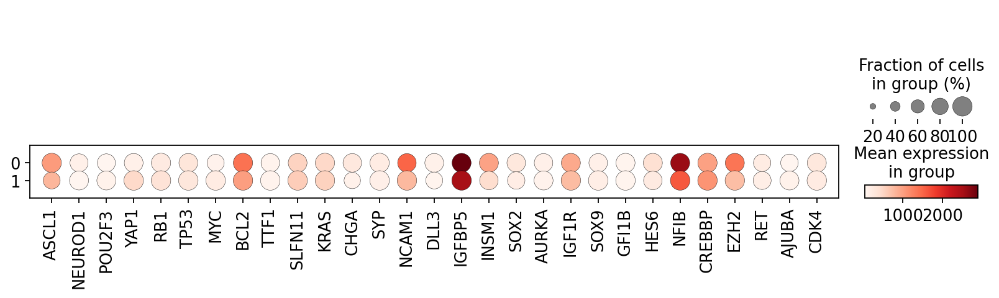

In [272]:
sc.pl.dotplot(adata, ["ASCL1","NEUROD1","POU2F3","YAP1","RB1","TP53","MYC","BCL2","TTF1","SLFN11","KRAS", "CHGA","SYP","NCAM1","DLL3","IGFBP5","INSM1","SOX2","AURKA","IGF1R","SOX9","GFI1B","HES6","NFIB","CREBBP","EZH2","RET","AJUBA","CDK4"], groupby='leiden_2', dendrogram=True)


NE SCLC is marked by a high expression of neuroendocrine markers such as Chromogranin-A (CHGA), CD56, TTF-1 and Synaptophysin (SYP), as well as cell adhesion markers like NCAM1 [3, 45] and it’s subtypes are centered on key transcription factors such as ASCL1 and NEUROD1 [46]. 

non-NE SCLC shows low levels of both ASCL1 and NEUROD1, and instead these show levels of POU2F3 [47] and other key markers that characterize non-NE SCLC subtypes, such as higher C-MYC expression [45]. 

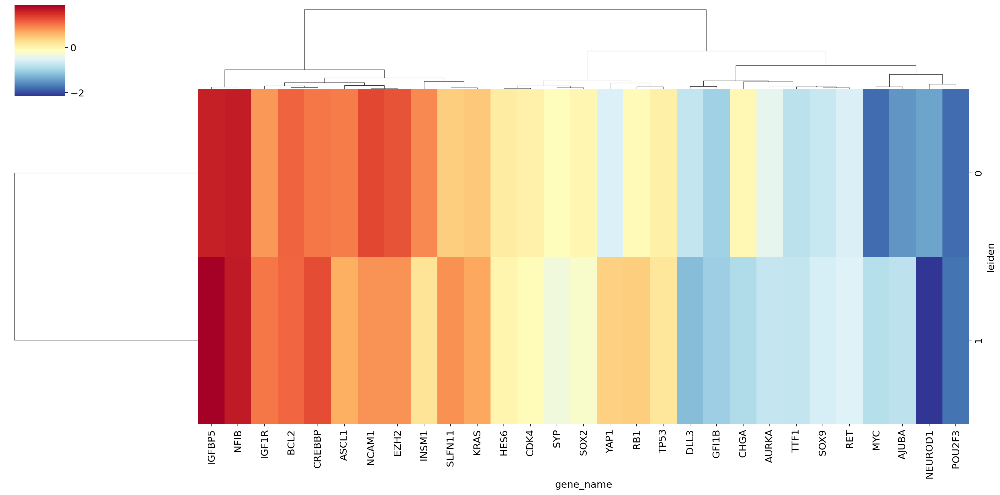

In [238]:
sns.clustermap(grapher_cm, z_score=0, method="ward",cmap="RdYlBu_r",col_cluster=True, figsize=(20,10))

In [273]:
subtype_mapping = {
	"0":"NE", # A, N
	"1":"Non-NE", # P, I

}

In [274]:
#Map to molecular type
adata.obs["NE Type"] = adata.obs["leiden_2"].map(subtype_mapping)

In [275]:
adata.obs["NE Type"].value_counts()

NE        61
Non-NE    29
Name: NE Type, dtype: int64

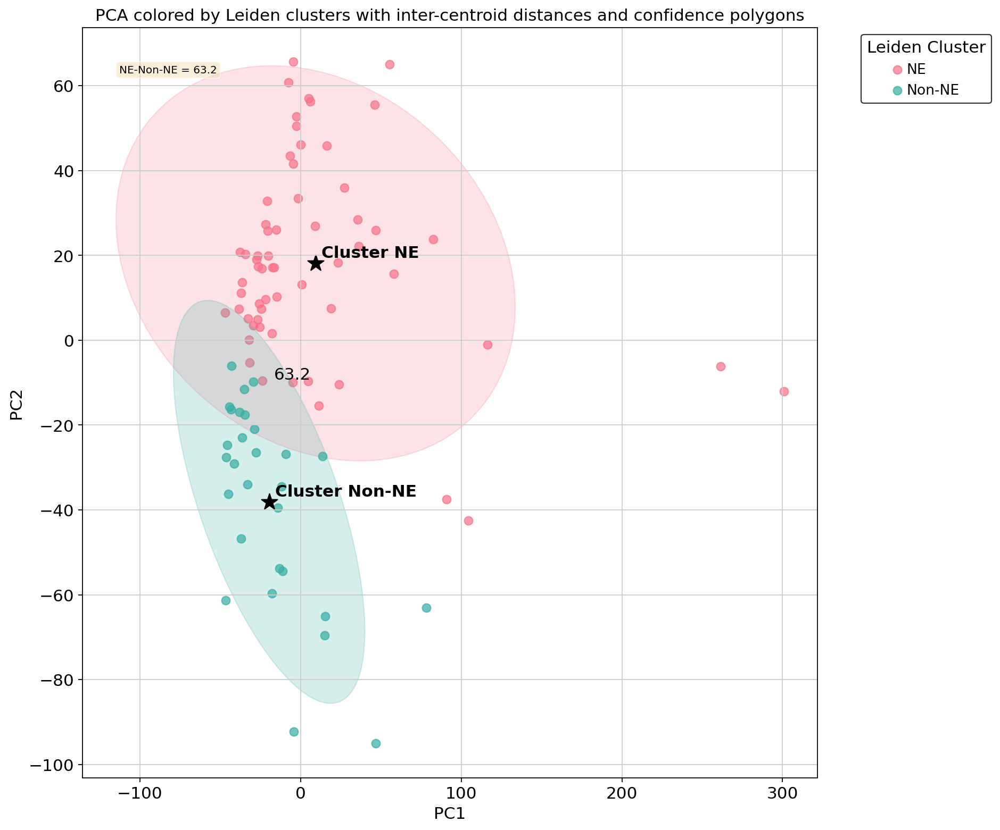

In [276]:


def confidence_polygon(x, y, ax, n_std=2.0, **kwargs):
    """
    Create a polygon approximation of the confidence ellipse of *x* and *y*.
    """
    if x.size != y.size:
        raise ValueError("x and y must be the same size")

    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    
    scale_x = np.sqrt(cov[0, 0]) * n_std
    scale_y = np.sqrt(cov[1, 1]) * n_std
    
    # Generate points on a circle
    theta = np.linspace(0, 2*np.pi, 100)
    circle = np.array([np.cos(theta), np.sin(theta)])
    
    # Transform circle to ellipse
    ellipse = np.array([ell_radius_x*circle[0], ell_radius_y*circle[1]])
    
    # Rotate and scale the ellipse
    rotation_matrix = np.array([[np.cos(np.pi/4), -np.sin(np.pi/4)],
                                [np.sin(np.pi/4), np.cos(np.pi/4)]])
    ellipse = np.dot(rotation_matrix, ellipse)
    ellipse[0] *= scale_x
    ellipse[1] *= scale_y
    
    # Move to center
    ellipse[0] += np.mean(x)
    ellipse[1] += np.mean(y)
    
    # Create polygon
    polygon = Polygon(ellipse.T, **kwargs)
    return ax.add_patch(polygon)

# Ensure PCA has been computed
if 'X_pca' not in adata.obsm:
    sc.pp.pca(adata)

# Calculate centroids for each cluster
pca_coords = adata.obsm['X_pca'][:, :2]  # Use first two PCs
leiden_clusters = adata.obs['NE Type']
centroids = {cluster: pca_coords[leiden_clusters == cluster].mean(axis=0) 
             for cluster in leiden_clusters.unique()}

# Calculate inter-centroid distances
centroid_points = np.array(list(centroids.values()))
distances = pdist(centroid_points)
dist_matrix = squareform(distances)

# Create a color palette
n_clusters = len(leiden_clusters.unique())
color_palette = sns.color_palette("husl", n_colors=n_clusters)

# Create the plot
fig, ax = plt.subplots(figsize=(12, 10))

# Plot each Leiden cluster and its confidence polygon
for idx, cluster in enumerate(leiden_clusters.unique()):
    mask = leiden_clusters == cluster
    cluster_pca = pca_coords[mask]
    color = color_palette[idx]
    ax.scatter(cluster_pca[:, 0], cluster_pca[:, 1], 
               label=cluster, s=50, alpha=0.7, color=color)
    confidence_polygon(cluster_pca[:, 0], cluster_pca[:, 1], ax, n_std=2.0, 
                       facecolor=color, edgecolor=color, alpha=0.2)

# Plot centroids and connect them
for cluster, (x, y) in centroids.items():
    ax.scatter(x, y, s=200, c='black', marker='*')
    ax.annotate(f'Cluster {cluster}', (x, y), xytext=(5, 5), 
                textcoords='offset points', fontweight='bold')

# Add distance annotations
clusters = list(centroids.keys())
for i in range(len(clusters)):
    for j in range(i+1, len(clusters)):
        ci, cj = clusters[i], clusters[j]
        mid_x = (centroids[ci][0] + centroids[cj][0]) / 2
        mid_y = (centroids[ci][1] + centroids[cj][1]) / 2
        ax.annotate(f'{dist_matrix[i,j]:.1f}', (mid_x, mid_y), 
                    xytext=(0, 3), textcoords='offset points', ha='center')

# Customize the plot
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_title('PCA colored by Leiden clusters with inter-centroid distances and confidence polygons')
ax.legend(title='Leiden Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')

# Add a text box with distance information
textstr = '\n'.join([f'{clusters[i]}-{clusters[j]} = {dist_matrix[i,j]:.1f}' 
                     for i in range(len(clusters)) 
                     for j in range(i+1, len(clusters))])
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=9,
        verticalalignment='top', bbox=props)

plt.tight_layout()
plt.show()

### Overclustering for 4 subtypes (A,N,P,I)

In [277]:
sc.tl.leiden(adata,resolution=1, key_added="leiden_4", n_iterations=-1)
temp_count_matrix = pd.DataFrame(adata.layers["lognormalized_counts"], adata.obs.index, adata.var_names)
# Add on index 1 the "leiden" variable from adata.obs to the temp_count_matrix
temp_count_matrix.insert(loc=0, column="leiden", value=adata.obs["leiden_4"])
grapher_cm = temp_count_matrix.groupby("leiden").median()[["ASCL1","NEUROD1","POU2F3","YAP1","RB1","TP53","MYC","BCL2","TTF1","SLFN11","KRAS", "CHGA","SYP","NCAM1","DLL3","IGFBP5","INSM1","SOX2","AURKA","IGF1R","SOX9","GFI1B","HES6","NFIB","CREBBP","EZH2","RET","AJUBA","CDK4"]]


running Leiden clustering
    finished: found 4 clusters and added
    'leiden_4', the cluster labels (adata.obs, categorical) (0:00:00)


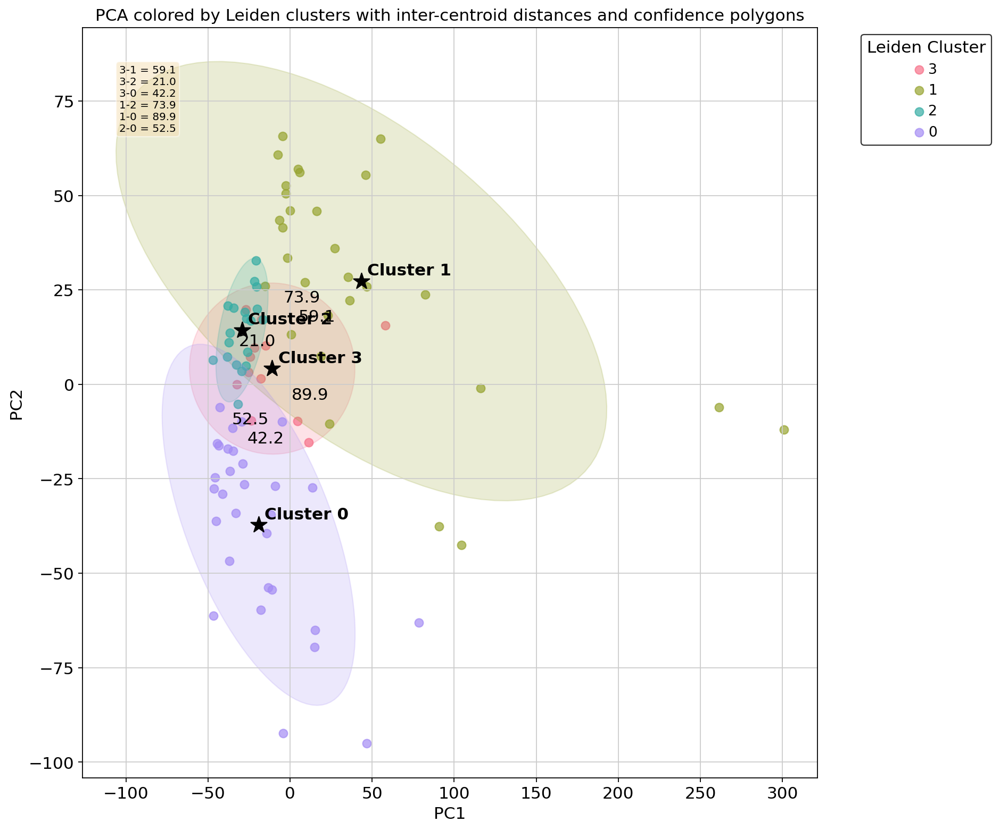

In [278]:


def confidence_polygon(x, y, ax, n_std=2.0, **kwargs):
    """
    Create a polygon approximation of the confidence ellipse of *x* and *y*.
    """
    if x.size != y.size:
        raise ValueError("x and y must be the same size")

    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    
    scale_x = np.sqrt(cov[0, 0]) * n_std
    scale_y = np.sqrt(cov[1, 1]) * n_std
    
    # Generate points on a circle
    theta = np.linspace(0, 2*np.pi, 100)
    circle = np.array([np.cos(theta), np.sin(theta)])
    
    # Transform circle to ellipse
    ellipse = np.array([ell_radius_x*circle[0], ell_radius_y*circle[1]])
    
    # Rotate and scale the ellipse
    rotation_matrix = np.array([[np.cos(np.pi/4), -np.sin(np.pi/4)],
                                [np.sin(np.pi/4), np.cos(np.pi/4)]])
    ellipse = np.dot(rotation_matrix, ellipse)
    ellipse[0] *= scale_x
    ellipse[1] *= scale_y
    
    # Move to center
    ellipse[0] += np.mean(x)
    ellipse[1] += np.mean(y)
    
    # Create polygon
    polygon = Polygon(ellipse.T, **kwargs)
    return ax.add_patch(polygon)

# Ensure PCA has been computed
if 'X_pca' not in adata.obsm:
    sc.pp.pca(adata)

# Calculate centroids for each cluster
pca_coords = adata.obsm['X_pca'][:, :2]  # Use first two PCs
leiden_clusters = adata.obs['leiden_4']
centroids = {cluster: pca_coords[leiden_clusters == cluster].mean(axis=0) 
             for cluster in leiden_clusters.unique()}

# Calculate inter-centroid distances
centroid_points = np.array(list(centroids.values()))
distances = pdist(centroid_points)
dist_matrix = squareform(distances)

# Create a color palette
n_clusters = len(leiden_clusters.unique())
color_palette = sns.color_palette("husl", n_colors=n_clusters)

# Create the plot
fig, ax = plt.subplots(figsize=(12, 10))

# Plot each Leiden cluster and its confidence polygon
for idx, cluster in enumerate(leiden_clusters.unique()):
    mask = leiden_clusters == cluster
    cluster_pca = pca_coords[mask]
    color = color_palette[idx]
    ax.scatter(cluster_pca[:, 0], cluster_pca[:, 1], 
               label=cluster, s=50, alpha=0.7, color=color)
    confidence_polygon(cluster_pca[:, 0], cluster_pca[:, 1], ax, n_std=2.0, 
                       facecolor=color, edgecolor=color, alpha=0.2)

# Plot centroids and connect them
for cluster, (x, y) in centroids.items():
    ax.scatter(x, y, s=200, c='black', marker='*')
    ax.annotate(f'Cluster {cluster}', (x, y), xytext=(5, 5), 
                textcoords='offset points', fontweight='bold')

# Add distance annotations
clusters = list(centroids.keys())
for i in range(len(clusters)):
    for j in range(i+1, len(clusters)):
        ci, cj = clusters[i], clusters[j]
        mid_x = (centroids[ci][0] + centroids[cj][0]) / 2
        mid_y = (centroids[ci][1] + centroids[cj][1]) / 2
        ax.annotate(f'{dist_matrix[i,j]:.1f}', (mid_x, mid_y), 
                    xytext=(0, 3), textcoords='offset points', ha='center')

# Customize the plot
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_title('PCA colored by Leiden clusters with inter-centroid distances and confidence polygons')
ax.legend(title='Leiden Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')

# Add a text box with distance information
textstr = '\n'.join([f'{clusters[i]}-{clusters[j]} = {dist_matrix[i,j]:.1f}' 
                     for i in range(len(clusters)) 
                     for j in range(i+1, len(clusters))])
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=9,
        verticalalignment='top', bbox=props)

plt.tight_layout()
plt.show()

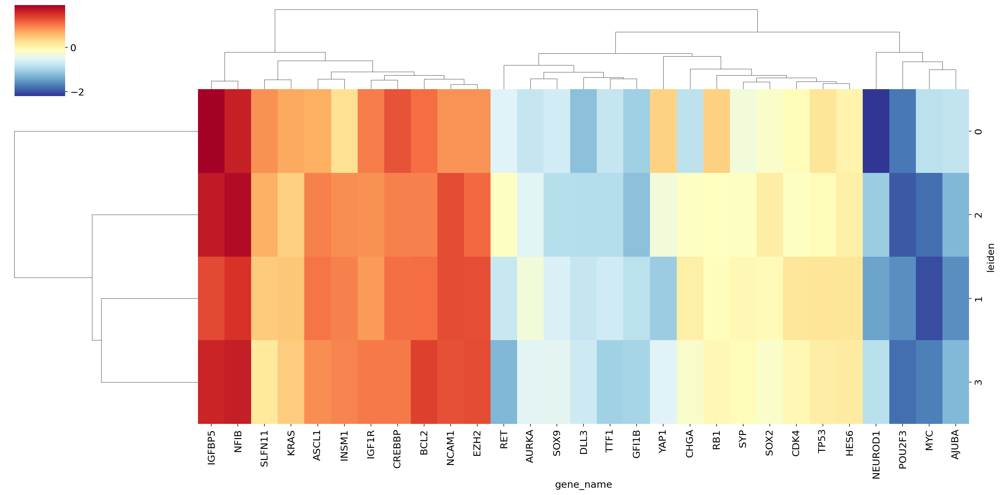

In [279]:
sns.clustermap(grapher_cm, z_score=0, cmap="RdYlBu_r",col_cluster=True,figsize=(20,10))

In [280]:
subtype_mapping_overclustering = {
	"0":"Y", # High YAP1, RB1, AJUBA, Low MYC, INSM1 = Y
	"1":"A", # High AURKA, ASCL1; Low MYC, RET
	"2":"N", # High 
	"3":"P" # HighNEUROD1, AURKA, 
}	

In [149]:
#subtype_mapping_overclustering = {
#	"0":"Y/I", # High YAP1, RB1, AJUBA, Low MYC, INSM1 = Y
#	"1":"A", # High AURKA, ASCL1; Low MYC, RET
#	"2":"P", # High 
#	"3":"N" # HighNEUROD1, AURKA, 
#}	

In [150]:
#subtype_mapping_overclustering = {
#	"0":"P",
#	"1":"A",
#	"2":"N",
#	"3":"I"
#}

In [281]:
adata.obs["Subtype"] = adata.obs["leiden_4"].map(subtype_mapping_overclustering)

In [282]:
adata.obs["Subtype"].value_counts()

Y    30
A    29
N    19
P    12
Name: Subtype, dtype: int64

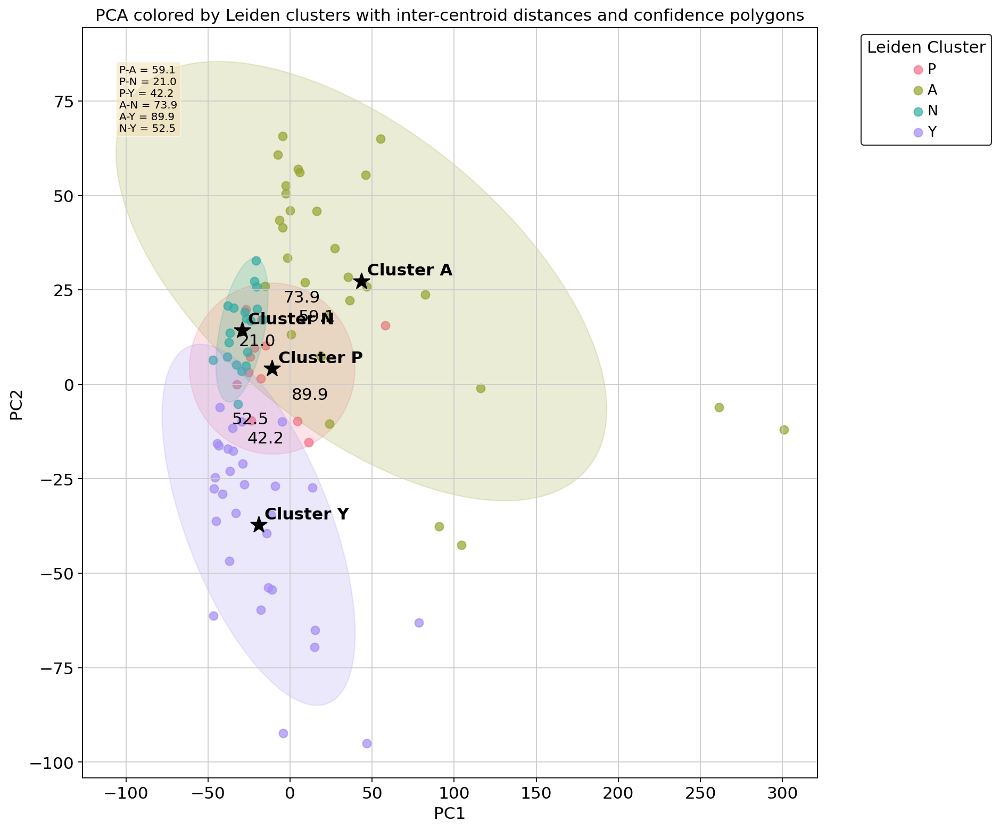

In [283]:


def confidence_polygon(x, y, ax, n_std=2.0, **kwargs):
    """
    Create a polygon approximation of the confidence ellipse of *x* and *y*.
    """
    if x.size != y.size:
        raise ValueError("x and y must be the same size")

    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    
    scale_x = np.sqrt(cov[0, 0]) * n_std
    scale_y = np.sqrt(cov[1, 1]) * n_std
    
    # Generate points on a circle
    theta = np.linspace(0, 2*np.pi, 100)
    circle = np.array([np.cos(theta), np.sin(theta)])
    
    # Transform circle to ellipse
    ellipse = np.array([ell_radius_x*circle[0], ell_radius_y*circle[1]])
    
    # Rotate and scale the ellipse
    rotation_matrix = np.array([[np.cos(np.pi/4), -np.sin(np.pi/4)],
                                [np.sin(np.pi/4), np.cos(np.pi/4)]])
    ellipse = np.dot(rotation_matrix, ellipse)
    ellipse[0] *= scale_x
    ellipse[1] *= scale_y
    
    # Move to center
    ellipse[0] += np.mean(x)
    ellipse[1] += np.mean(y)
    
    # Create polygon
    polygon = Polygon(ellipse.T, **kwargs)
    return ax.add_patch(polygon)

# Ensure PCA has been computed
if 'X_pca' not in adata.obsm:
    sc.pp.pca(adata)

# Calculate centroids for each cluster
pca_coords = adata.obsm['X_pca'][:, :2]  # Use first two PCs
leiden_clusters = adata.obs['Subtype']
centroids = {cluster: pca_coords[leiden_clusters == cluster].mean(axis=0) 
             for cluster in leiden_clusters.unique()}

# Calculate inter-centroid distances
centroid_points = np.array(list(centroids.values()))
distances = pdist(centroid_points)
dist_matrix = squareform(distances)

# Create a color palette
n_clusters = len(leiden_clusters.unique())
color_palette = sns.color_palette("husl", n_colors=n_clusters)

# Create the plot
fig, ax = plt.subplots(figsize=(12, 10))

# Plot each Leiden cluster and its confidence polygon
for idx, cluster in enumerate(leiden_clusters.unique()):
    mask = leiden_clusters == cluster
    cluster_pca = pca_coords[mask]
    color = color_palette[idx]
    ax.scatter(cluster_pca[:, 0], cluster_pca[:, 1], 
               label=cluster, s=50, alpha=0.7, color=color)
    confidence_polygon(cluster_pca[:, 0], cluster_pca[:, 1], ax, n_std=2.0, 
                       facecolor=color, edgecolor=color, alpha=0.2)

# Plot centroids and connect them
for cluster, (x, y) in centroids.items():
    ax.scatter(x, y, s=200, c='black', marker='*')
    ax.annotate(f'Cluster {cluster}', (x, y), xytext=(5, 5), 
                textcoords='offset points', fontweight='bold')

# Add distance annotations
clusters = list(centroids.keys())
for i in range(len(clusters)):
    for j in range(i+1, len(clusters)):
        ci, cj = clusters[i], clusters[j]
        mid_x = (centroids[ci][0] + centroids[cj][0]) / 2
        mid_y = (centroids[ci][1] + centroids[cj][1]) / 2
        ax.annotate(f'{dist_matrix[i,j]:.1f}', (mid_x, mid_y), 
                    xytext=(0, 3), textcoords='offset points', ha='center')

# Customize the plot
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_title('PCA colored by Leiden clusters with inter-centroid distances and confidence polygons')
ax.legend(title='Leiden Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')

# Add a text box with distance information
textstr = '\n'.join([f'{clusters[i]}-{clusters[j]} = {dist_matrix[i,j]:.1f}' 
                     for i in range(len(clusters)) 
                     for j in range(i+1, len(clusters))])
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=9,
        verticalalignment='top', bbox=props)

plt.tight_layout()
plt.show()

## DEG between clusters to differentiate between NE and Non-NE + each subtype

### 2 clusters

In [284]:
adata.obs_names_make_unique()
adata.var_names_make_unique()

In [286]:
adata.X= adata.layers["raw_counts"].copy()
adata = adata[~adata.obs["Arm"].isna()].copy()
dds = DeseqDataSet(
    adata=adata,
    design_factors='leiden_2',
    refit_cooks=True,
)

# Compute LFCs
dds.deseq2()

# Extract contrast between Lung and Lymph node  
results_df = DeseqStats(
    dds,
    contrast=["leiden-2", "0" ,"1"],
)


# Compute the wald test
results_df.summary()

Fitting size factors...
... done in 0.02 seconds.

10876.37s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
10876.58s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
10876.78s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
10876.98s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
10877.19s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
10877.39s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
10877.60s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
10877.82s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
10878.02s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
10878.23s - pydevd: Sending message related to process being replaced timed-out after

Log2 fold change & Wald test p-value: leiden-2 0 vs 1


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_name,,,,,,
TSPAN6,149.327090,-0.223797,0.190000,-1.177875,0.238847,0.427753
DPM1,355.810507,0.131933,0.098721,1.336420,0.181412,0.356895
SCYL3,151.541052,-0.117241,0.138723,-0.845148,0.398028,0.596744
C1ORF112,205.199931,0.450595,0.215550,2.090443,0.036578,0.113640
FGR,41.769076,-1.926770,0.413372,-4.661110,0.000003,0.000052
...,...,...,...,...,...,...
ENSG00000291267,26.850027,-0.420235,0.482555,-0.870854,0.383834,0.582886
ENSG00000291275,62.655249,0.013534,0.254338,0.053211,0.957564,0.977644
ENSG00000291282,26.405213,0.052973,0.305191,0.173573,0.862201,0.926144


In [306]:
results_temp = results_df.results_df
significant_genes = results_temp[results_temp['padj'] < 0.05].sort_values("log2FoldChange", ascending=False).index


In [307]:
len(significant_genes)

2466

In [289]:


# Create a directory to save the plots
os.makedirs("clustermap_plots", exist_ok=True)

# Function to create and save clustermap
def create_clustermap(dds_sub, comparison_name, colors, cluster1, cluster2):
    if dds_sub.shape[1] < 2 or dds_sub.shape[0] < 2:
        print(f"Not enough data to plot for {comparison_name}. Skipping this comparison.")
        print(f"Number of genes: {dds_sub.shape[1]}, Number of samples: {dds_sub.shape[0]}")
        return

    # Create the grapher DataFrame
    grapher = pd.DataFrame(dds_sub.layers["lognormalized_counts"].T, index=dds_sub.var_names, columns=dds_sub.obs_names)
    
    # Create a Series with colors for each sample based on their leiden_2 group
    col_colors_leiden = dds_sub.obs['leiden-2'].map(colors)

    # Create a color map for RSI
    rsi_cmap = plt.cm.YlOrRd  # You can change this to any colormap you prefer
    col_colors_rsi = dds_sub.obs['RSI'].map(lambda x: rsi_cmap(x))
    
    # Combine the two color series
    col_colors = pd.DataFrame({'Leiden': col_colors_leiden, 'RSI': col_colors_rsi})
    
    try:
        # Create the clustermap with grouped columns
        g = sns.clustermap(grapher, 
                           z_score=0, 
                           cmap="RdYlBu_r",
                           col_cluster=False, 
                           row_cluster=True,
                           figsize=(15,7),  # Increased figure size
                           col_colors=col_colors)
        
        # Add a legend for Leiden clusters
        for label in [cluster1, cluster2]:
            g.ax_col_dendrogram.bar(0, 0, color=colors[label], label=label, linewidth=0)
        g.ax_col_dendrogram.legend(title='Leiden Clusters', loc="center", ncol=2)
        
        # Add a colorbar for RSI
        sm = plt.cm.ScalarMappable(cmap=rsi_cmap, norm=plt.Normalize(vmin=dds_sub.obs['RSI'].min(), vmax=dds_sub.obs['RSI'].max()))
        sm._A = []  # This line is necessary for the colorbar to work correctly
        cbar_ax = g.fig.add_axes([0.95, 0.15, 0.02, 0.3])  # [left, bottom, width, height]
        cbar = g.fig.colorbar(sm, cax=cbar_ax)
        cbar.set_label('RSI', rotation=270, labelpad=15)
        
        # Set title
        plt.suptitle(f"Clustermap for {comparison_name}", fontsize=16)
        
        # Adjust layout to show all labels
        plt.tight_layout()
        
        # Save the plot
        plt.savefig(f"clustermap_plots/clustermap_{comparison_name}_large_marker_v2.png", dpi=300, bbox_inches='tight')
        plt.close()
    except Exception as e:
        print(f"Error creating clustermap for {comparison_name}: {str(e)}")
        plt.close()

# Color mapping for leiden_2 clusters
colors = {'0': '#1f77b4', '1': '#ff7f0e'}

# Define your marker list here
marker_list = ["ASCL1", "NEUROD1", "POU2F3", "YAP1", "RB1", "TP53", "MYC", "BCL2", "TTF1", "SLFN11", "KRAS", 
               "CHGA", "SYP", "NCAM1", "DLL3", "IGFBP5", "INSM1", "SOX2", "AURKA", "IGF1R", "SOX9", "GFI1B", 
               "HES6", "NFIB", "CREBBP", "EZH2", "RET", "AJUBA", "CDK4"]
marker_list = None

# Extract cluster numbers from comparison name
cluster1 = "0"
cluster2 = "1"
# Get significant genes
results_dff = results_df.results_df
significant_genes = results_dff[results_dff['padj'] < 0.05].sort_values("log2FoldChange", ascending=False).index

# If marker_list is provided, subset significant_genes
if marker_list is not None:
    marker_genes = [gene for gene in marker_list if gene in significant_genes]
    if not marker_genes:
        print(f"No genes from the marker list are present in the significant genes for 0_vs_1. Skipping this comparison.")
    significant_genes = marker_genes

# Subset dds with significant genes and only the samples from the two clusters being compared
dds_sub = dds[dds.obs['leiden-2'].isin([cluster1, cluster2]), significant_genes]

if dds_sub.shape[1] < 2 or dds_sub.shape[0] < 2:
    print(f"Not enough data to plot for 0_vs_1. Skipping this comparison.")
    print(f"Number of genes: {dds_sub.shape[1]}, Number of samples: {dds_sub.shape[0]}")
else:
    # Sort samples by leiden-2
    dds_sub = dds_sub[dds_sub.obs["leiden-2"].argsort()]

    # Create and save clustermap
    create_clustermap(dds_sub, "0_vs_1", colors, cluster1, cluster2)

    print("Clustermap has been created and saved in the 'clustermap_plots' directory.")

Clustermap has been created and saved in the 'clustermap_plots' directory.


### 4 clusters

In [290]:

# Prepare the AnnData object
adata.X = adata.layers["raw_counts"].copy()
adata = adata[~adata.obs["Arm"].isna()].copy()

# Create DeseqDataSet
dds_4 = DeseqDataSet(
    adata=adata,
    design_factors='leiden_4',
    refit_cooks=True,
)

# Compute LFCs
dds_4.deseq2()

# Get all unique values in the 'leiden_4' column
leiden_values = adata.obs['leiden-4'].unique().tolist()

# Generate all pairwise combinations
combinations = list(itertools.combinations(leiden_values, 2))

# Dictionary to store results
results_dict = {}

# Perform pairwise comparisons
for combo in combinations:
    cluster1, cluster2 = combo
    comparison_name = f"{cluster1}_vs_{cluster2}"
    
    # Extract contrast between clusters
    results_df = DeseqStats(
        dds_4,
        contrast=["leiden-4", cluster1, cluster2],
    )
    
    # Compute the Wald test
    results_df.summary()
    
    # Store the results in the dictionary
    results_dict[comparison_name] = results_df

# Now you can access results for any comparison
# For example:
# results_dict['0_vs_1'].results_df
# results_dict['0_vs_2'].results_df
# results_dict['1_vs_2'].results_df
# ... and so on for all combinations

# Print out the keys in the results dictionary
print("Available comparisons:")
for key in results_dict.keys():
    print(key)

Fitting size factors...
... done in 0.02 seconds.

Fitting dispersions...
... done in 3.28 seconds.

Fitting dispersion trend curve...
... done in 11.32 seconds.

Fitting MAP dispersions...
... done in 3.78 seconds.

Fitting LFCs...
... done in 3.11 seconds.

Refitting 496 outliers.

Fitting dispersions...
... done in 0.69 seconds.

Fitting MAP dispersions...
... done in 0.64 seconds.

Fitting LFCs...
... done in 0.69 seconds.

Running Wald tests...
... done in 3.05 seconds.



Log2 fold change & Wald test p-value: leiden-4 3 vs 1


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_name,,,,,,
TSPAN6,149.327090,0.303279,0.299630,1.012179,0.311453,0.685556
DPM1,355.810507,-0.383315,0.145392,-2.636425,0.008378,0.150732
SCYL3,151.541052,0.094384,0.219201,0.430583,0.666772,0.886055
C1ORF112,205.199931,0.576266,0.329928,1.746641,0.080700,0.416180
FGR,41.769076,-0.714249,0.644865,-1.107594,0.268037,0.645596
...,...,...,...,...,...,...
ENSG00000291267,26.850027,0.611591,0.759174,0.805601,0.420473,0.756689
ENSG00000291275,62.655249,-0.050065,0.401291,-0.124759,0.900715,0.970852
ENSG00000291282,31.821422,-1.280070,0.521116,-2.456402,0.014034,0.189964


Running Wald tests...
... done in 3.25 seconds.



Log2 fold change & Wald test p-value: leiden-4 3 vs 2


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_name,,,,,,
TSPAN6,149.327090,0.169427,0.322207,0.525832,0.599005,0.999101
DPM1,355.810507,-0.030477,0.156341,-0.194942,0.845438,0.999101
SCYL3,151.541052,0.201319,0.235469,0.854971,0.392567,0.999101
C1ORF112,205.199931,0.090802,0.355193,0.255643,0.798227,0.999101
FGR,41.769076,0.644619,0.696592,0.925389,0.354763,0.999101
...,...,...,...,...,...,...
ENSG00000291267,26.850027,0.181123,0.815995,0.221966,0.824340,0.999101
ENSG00000291275,62.655249,-0.034122,0.431390,-0.079099,0.936954,0.999101
ENSG00000291282,31.821422,-0.150930,0.561849,-0.268631,0.788214,0.999101


Running Wald tests...
... done in 3.26 seconds.



Log2 fold change & Wald test p-value: leiden-4 3 vs 0


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_name,,,,,,
TSPAN6,149.327090,0.015210,0.296854,0.051238,0.959136,0.984729
DPM1,355.810507,-0.059173,0.144175,-0.410422,0.681497,0.851498
SCYL3,151.541052,0.029604,0.216985,0.136436,0.891477,0.957761
C1ORF112,205.199931,0.794244,0.327491,2.425242,0.015298,0.103759
FGR,41.769076,-2.110009,0.638206,-3.306157,0.000946,0.018143
...,...,...,...,...,...,...
ENSG00000291267,26.850027,-0.009853,0.751705,-0.013107,0.989542,0.996346
ENSG00000291275,62.655249,0.032176,0.397750,0.080894,0.935526,0.974818
ENSG00000291282,31.821422,-0.340992,0.518005,-0.658280,0.510358,0.749720


Running Wald tests...
... done in 5.77 seconds.



Log2 fold change & Wald test p-value: leiden-4 1 vs 2


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_name,,,,,,
TSPAN6,149.327090,-0.133852,0.254377,-0.526196,0.598752,0.877268
DPM1,355.810507,0.352837,0.123218,2.863520,0.004190,0.104325
SCYL3,151.541052,0.106935,0.186206,0.574284,0.565776,0.863486
C1ORF112,205.199931,-0.485464,0.279945,-1.734143,0.082893,0.460931
FGR,41.769076,1.358868,0.548945,2.475417,0.013308,0.199156
...,...,...,...,...,...,...
ENSG00000291267,26.850027,-0.430468,0.644668,-0.667735,0.504303,0.840833
ENSG00000291275,62.655249,0.015942,0.340323,0.046844,0.962637,0.991579
ENSG00000291282,31.821422,1.129140,0.440490,2.563375,0.010366,0.173058


Running Wald tests...
... done in 3.15 seconds.



Log2 fold change & Wald test p-value: leiden-4 1 vs 0


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_name,,,,,,
TSPAN6,149.327090,-0.288069,0.221388,-1.301195,0.193192,0.382128
DPM1,355.810507,0.324142,0.107363,3.019131,0.002535,0.015235
SCYL3,151.541052,-0.064779,0.162202,-0.399374,0.689618,0.821002
C1ORF112,205.199931,0.217977,0.243838,0.893944,0.371352,0.573861
FGR,41.769076,-1.395760,0.472659,-2.952994,0.003147,0.018159
...,...,...,...,...,...,...
ENSG00000291267,26.850027,-0.621444,0.561079,-1.107586,0.268040,0.470795
ENSG00000291275,62.655249,0.082240,0.296527,0.277345,0.781515,0.879681
ENSG00000291282,31.821422,0.939077,0.382996,2.451923,0.014210,0.059046


Running Wald tests...
... done in 3.14 seconds.



Log2 fold change & Wald test p-value: leiden-4 2 vs 0


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_name,,,,,,
TSPAN6,149.327090,-0.154217,0.251101,-0.614161,5.391089e-01,0.770011
DPM1,355.810507,-0.028695,0.121780,-0.235631,8.137189e-01,0.924038
SCYL3,151.541052,-0.171715,0.183593,-0.935301,3.496334e-01,0.627138
C1ORF112,205.199931,0.703441,0.277067,2.538883,1.112072e-02,0.068697
FGR,41.769076,-2.754628,0.541107,-5.090732,3.566848e-07,0.000035
...,...,...,...,...,...,...
ENSG00000291267,26.850027,-0.190976,0.635856,-0.300345,7.639140e-01,0.902187
ENSG00000291275,62.655249,0.066298,0.336141,0.197233,8.436453e-01,0.937149
ENSG00000291282,31.821422,-0.190063,0.436805,-0.435120,6.634751e-01,0.848059


Available comparisons:
3_vs_1
3_vs_2
3_vs_0
1_vs_2
1_vs_0
2_vs_0


In [292]:


# Create a directory to save the plots
os.makedirs("clustermap_plots", exist_ok=True)

# Function to create and save clustermap
def create_clustermap(dds_sub, comparison_name, colors, cluster1, cluster2):
    if dds_sub.shape[1] < 2 or dds_sub.shape[0] < 2:
        print(f"Not enough data to plot for {comparison_name}. Skipping this comparison.")
        print(f"Number of genes: {dds_sub.shape[1]}, Number of samples: {dds_sub.shape[0]}")
        return

    # Create the grapher DataFrame
    grapher = pd.DataFrame(dds_sub.layers["lognormalized_counts"].T, index=dds_sub.var_names, columns=dds_sub.obs_names)
    
    # Create a Series with colors for each sample based on their leiden_4 group
    col_colors_leiden = dds_sub.obs['leiden-4'].map(colors)
    
    # Create a color map for RSI
    rsi_cmap = plt.cm.YlOrRd  # You can change this to any colormap you prefer
    col_colors_rsi = dds_sub.obs['RSI'].map(lambda x: rsi_cmap(x))
    
    # Combine the two color series
    col_colors = pd.DataFrame({'Leiden': col_colors_leiden, 'RSI': col_colors_rsi})
    
    try:
        # Create the clustermap with grouped columns
        g = sns.clustermap(grapher, 
                           z_score=0, 
                           cmap="RdYlBu_r",
                           col_cluster=False, 
                           row_cluster=True,
                           figsize=(15,7),
                           col_colors=col_colors)
        
        # Add a legend for Leiden clusters
        for label in [cluster1, cluster2]:
            g.ax_col_dendrogram.bar(0, 0, color=colors[label], label=label, linewidth=0)
        g.ax_col_dendrogram.legend(title='Leiden Clusters', loc="center", ncol=2)
        
        # Add a colorbar for RSI
        sm = plt.cm.ScalarMappable(cmap=rsi_cmap, norm=plt.Normalize(vmin=dds_sub.obs['RSI'].min(), vmax=dds_sub.obs['RSI'].max()))
        sm._A = []  # This line is necessary for the colorbar to work correctly
        cbar_ax = g.fig.add_axes([0.95, 0.15, 0.02, 0.3])  # [left, bottom, width, height]
        cbar = g.fig.colorbar(sm, cax=cbar_ax)
        cbar.set_label('RSI', rotation=270, labelpad=15)
        
        # Set title
        plt.suptitle(f"Clustermap for {comparison_name}", fontsize=16)
        
        # Save the plot
        plt.savefig(f"clustermap_plots/clustermap_{comparison_name}_markers_v2.png", dpi=300, bbox_inches='tight')
        plt.close()
    except Exception as e:
        print(f"Error creating clustermap for {comparison_name}: {str(e)}")
        plt.close()

# Color mapping for leiden_4 clusters
colors = {'0': '#1f77b4', '1': '#ff7f0e', '2': '#2ca02c', '3': '#d62728'}

# Define your marker list here
marker_list = ["ASCL1", "NEUROD1", "POU2F3", "YAP1", "RB1", "TP53", "MYC", "BCL2", "TTF1", "SLFN11", "KRAS", 
               "CHGA", "SYP", "NCAM1", "DLL3", "IGFBP5", "INSM1", "SOX2", "AURKA", "IGF1R", "SOX9", "GFI1B", 
               "HES6", "NFIB", "CREBBP", "EZH2", "RET", "AJUBA", "CDK4"]
#marker_list = None
# Loop through all comparisons in results_dict
for comparison_name, results_df in results_dict.items():
    print(f"Processing {comparison_name}...")
    
    # Extract cluster numbers from comparison name
    cluster1, cluster2 = comparison_name.split('_vs_')
    
    # Get significant genes
    results_dff = results_df.results_df
    significant_genes = results_dff[results_dff['padj'] < 0.05].sort_values("log2FoldChange", ascending=False).index
    
    # If marker_list is provided, subset significant_genes
    if marker_list is not None:
        marker_genes = [gene for gene in marker_list if gene in significant_genes]
        if not marker_genes:
            print(f"No genes from the marker list are present in the significant genes for {comparison_name}. Skipping this comparison.")
            continue
        significant_genes = marker_genes
    
    # Subset dds_4 with significant genes and only the samples from the two clusters being compared
    dds_sub = dds_4[dds_4.obs['leiden-4'].isin([cluster1, cluster2]), significant_genes]
    
    if dds_sub.shape[1] < 2 or dds_sub.shape[0] < 2:
        print(f"Not enough data to plot for {comparison_name}. Skipping this comparison.")
        print(f"Number of genes: {dds_sub.shape[1]}, Number of samples: {dds_sub.shape[0]}")
        continue
    
    # Sort samples by leiden_4
    dds_sub = dds_sub[dds_sub.obs["leiden-4"].argsort()]
    
    # Create and save clustermap
    create_clustermap(dds_sub, comparison_name, colors, cluster1, cluster2)

print("All clustermaps have been created and saved in the 'clustermap_plots' directory.")

Processing 3_vs_1...
No genes from the marker list are present in the significant genes for 3_vs_1. Skipping this comparison.
Processing 3_vs_2...
No genes from the marker list are present in the significant genes for 3_vs_2. Skipping this comparison.
Processing 3_vs_0...
Processing 1_vs_2...
Not enough data to plot for 1_vs_2. Skipping this comparison.
Number of genes: 1, Number of samples: 47
Processing 1_vs_0...
Processing 2_vs_0...
All clustermaps have been created and saved in the 'clustermap_plots' directory.


# Differential Expression Analysis

## Establish groups/conditions

In [ ]:
# ctrl=adata.obs[adata.obs["stage_tnm7_taha"].isin(["IIIA","IIIB"])].index
# trt=adata.obs[adata.obs["stage_tnm7_taha"].isin(["IIA","IIB"])].index

# ctrl=adata.obs[adata.obs["stage_tnm7_taha"].isin(["45 Gy/30 fraksjoner"])].index
# trt=adata.obs[adata.obs["stage_tnm7_taha"].isin(["60 Gy/40 fraksjoner"])].index


In [108]:
ctrl=adata.obs[adata.obs["Arm"].isin(["45 Gy/30 fraksjoner"])].index
trt=adata.obs[adata.obs["Arm"].isin(["60 Gy/40 fraksjoner"])].index

In [ ]:
trt=adata.obs[adata.obs["Organ"].isin(values=["Lung"])].index


In [ ]:
ctrl=adata.obs[adata.obs["Organ"].isin(values=["Lymph Node"])].index


## pyDESeq2

In [164]:
adata.obs["brain_metastasis"] = adata.obs["brain_metastasis"].map({0:"No",1:"Yes"})


In [ ]:
adata.X= adata.layers["raw_counts"].copy()
adata = adata[~adata.obs["Arm"].isna()].copy()
dds = DeseqDataSet(
    adata=adata,
    design_factors='Arm',
    refit_cooks=True,
)

# Compute LFCs
dds.deseq2()

# Extract contrast between Lung and Lymph node  
results_df = DeseqStats(
    dds,
    contrast=["Arm", "45 Gy/30 fraksjoner" ,"60 Gy/40 fraksjoner"],
)


# Compute the wald test
results_df.summary()

In [166]:
adata.X= adata.layers["raw_counts"].copy()
adata = adata[~adata.obs["Arm"].isna()].copy()
dds = DeseqDataSet(
    adata=adata,
    design_factors='brain_metastasis',
    refit_cooks=True,
)

# Compute LFCs
dds.deseq2()

# Extract contrast between Lung and Lymph node  
results_df = DeseqStats(
    dds,
    contrast=["brain-metastasis", "No" ,"Yes"],
)


# Compute the wald test
results_df.summary()

Fitting size factors...
... done in 0.02 seconds.



19636.18s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
19636.41s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
19636.79s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
19637.03s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
19637.29s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
19637.56s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
19637.80s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
19638.10s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
19638.40s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
19638.68s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
19638.97s - pydevd: Sending message rela

Log2 fold change & Wald test p-value: brain-metastasis No vs Yes


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_name,,,,,,
TSPAN6,149.366236,0.232892,0.240400,0.968767,0.332662,0.906804
DPM1,355.733628,-0.069195,0.126458,-0.547181,0.584254,0.957283
SCYL3,151.282673,0.440450,0.169324,2.601228,0.009289,0.491019
C1ORF112,205.516050,-0.194075,0.277396,-0.699631,0.484158,0.942403
FGR,35.740071,0.183512,0.544843,0.336817,0.736255,0.972643
...,...,...,...,...,...,...
ENSG00000291283,8.135646,-0.282139,0.556474,-0.507011,0.612147,0.961298
ENSG00000291288,11.536974,-0.552669,0.439229,-1.258272,0.208294,0.874491
ENSG00000291290,19.140861,0.184014,0.504596,0.364675,0.715354,0.971756


### Heatmap 

#### Brain Metastasis 

In [295]:
adata.X= adata.layers["raw_counts"].copy()
adata = adata[~adata.obs["Arm"].isna()].copy()
dds = DeseqDataSet(
    adata=adata,
    design_factors='brain_metastasis',
    refit_cooks=True,
)

# Compute LFCs
dds.deseq2()

# Extract contrast between Lung and Lymph node  
results_df = DeseqStats(
    dds,
    contrast=["brain-metastasis", "0" ,"1"],
)


# Compute the wald test
results_df.summary()

Fitting size factors...
... done in 0.02 seconds.

Fitting dispersions...
... done in 6.22 seconds.

Fitting dispersion trend curve...
... done in 11.67 seconds.

Fitting MAP dispersions...
... done in 3.67 seconds.

Fitting LFCs...
... done in 3.06 seconds.

Refitting 467 outliers.

Fitting dispersions...
... done in 0.67 seconds.

Fitting MAP dispersions...
... done in 0.69 seconds.

Fitting LFCs...
... done in 0.68 seconds.



KeyError: "The tested level ('0') should correspond to one of the levels of 'brain-metastasis'"

In [293]:

results_dff = results_df.results_df
significant_genes = results_dff[results_dff['padj'] < 0.05].index
dds_sub = dds[:,significant_genes]

# Create the grapher DataFrame
grapher = pd.DataFrame(dds_sub.layers["lognormalized_counts"].T, index=dds_sub.var_names, columns=dds_sub.obs_names)

# Create a color mapping for the Arm groups
colors = {'No': '#1f77b4', 'Yes': '#ff7f0e'}

# Create a Series with colors for each sample based on their Arm group
col_colors = dds_sub.obs['brain-metastasis'].map(colors)

# Create the clustermap with grouped columns
g = sns.clustermap(grapher, 
                   z_score=0, 
                   cmap="RdYlBu_r",
                   col_cluster=True, 
                   row_cluster=True,
                   figsize=(20,15),
                   col_colors=col_colors)

# Add a legend
for label in colors:
    g.ax_col_dendrogram.bar(0, 0, color=colors[label], label=label, linewidth=0)
g.ax_col_dendrogram.legend(title='Mets', loc="center", ncol=2)

plt.show()

KeyError: 'brain-metastasis'

#### Treatment Arm

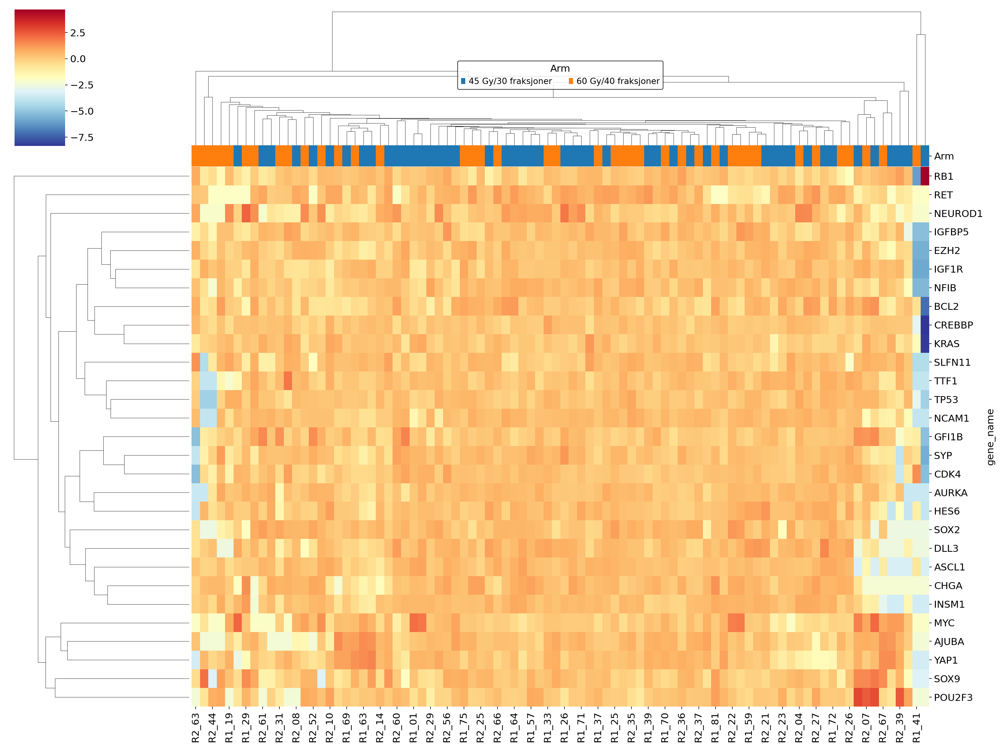

In [131]:


# Create the grapher DataFrame
grapher = pd.DataFrame(dds_sub.layers["lognormalized_counts"].T, index=dds_sub.var_names, columns=dds_sub.obs_names)

# Create a color mapping for the Arm groups
arm_colors = {'45 Gy/30 fraksjoner': '#1f77b4', '60 Gy/40 fraksjoner': '#ff7f0e'}

# Create a Series with colors for each sample based on their Arm group
col_colors = dds_sub.obs['Arm'].map(arm_colors)

# Create the clustermap with grouped columns
g = sns.clustermap(grapher, 
                   z_score=0, 
                   cmap="RdYlBu_r",
                   col_cluster=True, 
                   row_cluster=True,
                   figsize=(20,15),
                   col_colors=col_colors)

# Add a legend
for label in arm_colors:
    g.ax_col_dendrogram.bar(0, 0, color=arm_colors[label], label=label, linewidth=0)
g.ax_col_dendrogram.legend(title='Arm', loc="center", ncol=2)

plt.show()

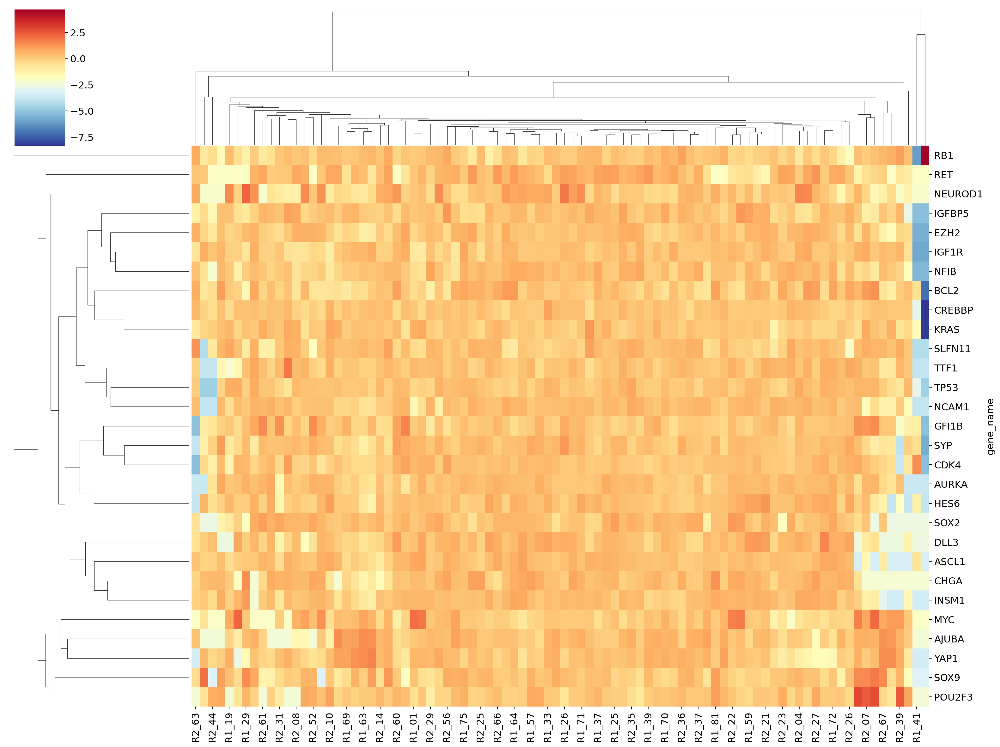

In [128]:

grapher = pd.DataFrame(dds_sub.layers["lognormalized_counts"].T, index=dds_sub.var_names, columns=dds_sub.obs_names)
sns.clustermap(grapher, z_score=0, cmap="RdYlBu_r",col_cluster=True, figsize=(20,15))

## DEG for Subtype/Clusters

In [197]:

# Create DeseqDataSet
dds = DeseqDataSet(
    adata=adata,
    design_factors='leiden-4',
    refit_cooks=True,
)

# Compute LFCs
dds.deseq2()

# Get unique subtypes
subtypes = adata.obs['leiden-4'].unique().tolist()

# Generate all pairwise combinations
subtype_pairs = list(itertools.combinations(subtypes, 2))

# Dictionary to store results
results = {}

# Perform pairwise comparisons
for subtype1, subtype2 in subtype_pairs:
    comparison_name = f"{subtype1}_vs_{subtype2}"
    res = DeseqStats(
        dds,
        contrast=["leiden-4", subtype1, subtype2],
    )
    
    # Compute the Wald test
    res.summary()
    
    # Store the results
    results[comparison_name] = res

# Now you can access results for any comparison
# For example:
# results['A_vs_N'].results_df
# results['A_vs_P'].results_df
# results['N_vs_I'].results_df

Fitting size factors...
... done in 0.02 seconds.



8154.43s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
8154.62s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
8154.82s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
8155.05s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
8155.25s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
8155.44s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
8155.63s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
8155.83s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
8156.02s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
8156.22s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
8156.42s - pydevd: Sending message related to proc

Log2 fold change & Wald test p-value: leiden-4 3 vs 1


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_name,,,,,,
TSPAN6,149.327090,0.303279,0.299630,1.012179,0.311453,0.685556
DPM1,355.810507,-0.383315,0.145392,-2.636425,0.008378,0.150732
SCYL3,151.541052,0.094384,0.219201,0.430583,0.666772,0.886055
C1ORF112,205.199931,0.576266,0.329928,1.746641,0.080700,0.416180
FGR,41.769076,-0.714249,0.644865,-1.107594,0.268037,0.645596
...,...,...,...,...,...,...
ENSG00000291267,26.850027,0.611591,0.759174,0.805601,0.420473,0.756689
ENSG00000291275,62.655249,-0.050065,0.401291,-0.124759,0.900715,0.970852
ENSG00000291282,31.821422,-1.280070,0.521116,-2.456402,0.014034,0.189964


Running Wald tests...
... done in 3.25 seconds.



Log2 fold change & Wald test p-value: leiden-4 3 vs 2


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_name,,,,,,
TSPAN6,149.327090,0.169427,0.322207,0.525832,0.599005,0.999101
DPM1,355.810507,-0.030477,0.156341,-0.194942,0.845438,0.999101
SCYL3,151.541052,0.201319,0.235469,0.854971,0.392567,0.999101
C1ORF112,205.199931,0.090802,0.355193,0.255643,0.798227,0.999101
FGR,41.769076,0.644619,0.696592,0.925389,0.354763,0.999101
...,...,...,...,...,...,...
ENSG00000291267,26.850027,0.181123,0.815995,0.221966,0.824340,0.999101
ENSG00000291275,62.655249,-0.034122,0.431390,-0.079099,0.936954,0.999101
ENSG00000291282,31.821422,-0.150930,0.561849,-0.268631,0.788214,0.999101


Running Wald tests...
... done in 3.17 seconds.



Log2 fold change & Wald test p-value: leiden-4 3 vs 0


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_name,,,,,,
TSPAN6,149.327090,0.015210,0.296854,0.051238,0.959136,0.984729
DPM1,355.810507,-0.059173,0.144175,-0.410422,0.681497,0.851498
SCYL3,151.541052,0.029604,0.216985,0.136436,0.891477,0.957761
C1ORF112,205.199931,0.794244,0.327491,2.425242,0.015298,0.103759
FGR,41.769076,-2.110009,0.638206,-3.306157,0.000946,0.018143
...,...,...,...,...,...,...
ENSG00000291267,26.850027,-0.009853,0.751705,-0.013107,0.989542,0.996346
ENSG00000291275,62.655249,0.032176,0.397750,0.080894,0.935526,0.974818
ENSG00000291282,31.821422,-0.340992,0.518005,-0.658280,0.510358,0.749720


Running Wald tests...
... done in 3.24 seconds.



Log2 fold change & Wald test p-value: leiden-4 1 vs 2


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_name,,,,,,
TSPAN6,149.327090,-0.133852,0.254377,-0.526196,0.598752,0.877268
DPM1,355.810507,0.352837,0.123218,2.863520,0.004190,0.104325
SCYL3,151.541052,0.106935,0.186206,0.574284,0.565776,0.863486
C1ORF112,205.199931,-0.485464,0.279945,-1.734143,0.082893,0.460931
FGR,41.769076,1.358868,0.548945,2.475417,0.013308,0.199156
...,...,...,...,...,...,...
ENSG00000291267,26.850027,-0.430468,0.644668,-0.667735,0.504303,0.840833
ENSG00000291275,62.655249,0.015942,0.340323,0.046844,0.962637,0.991579
ENSG00000291282,31.821422,1.129140,0.440490,2.563375,0.010366,0.173058


Running Wald tests...
... done in 3.21 seconds.



Log2 fold change & Wald test p-value: leiden-4 1 vs 0


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_name,,,,,,
TSPAN6,149.327090,-0.288069,0.221388,-1.301195,0.193192,0.382128
DPM1,355.810507,0.324142,0.107363,3.019131,0.002535,0.015235
SCYL3,151.541052,-0.064779,0.162202,-0.399374,0.689618,0.821002
C1ORF112,205.199931,0.217977,0.243838,0.893944,0.371352,0.573861
FGR,41.769076,-1.395760,0.472659,-2.952994,0.003147,0.018159
...,...,...,...,...,...,...
ENSG00000291267,26.850027,-0.621444,0.561079,-1.107586,0.268040,0.470795
ENSG00000291275,62.655249,0.082240,0.296527,0.277345,0.781515,0.879681
ENSG00000291282,31.821422,0.939077,0.382996,2.451923,0.014210,0.059046


Running Wald tests...
... done in 3.19 seconds.



Log2 fold change & Wald test p-value: leiden-4 2 vs 0


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
gene_name,,,,,,
TSPAN6,149.327090,-0.154217,0.251101,-0.614161,5.391089e-01,0.770011
DPM1,355.810507,-0.028695,0.121780,-0.235631,8.137189e-01,0.924038
SCYL3,151.541052,-0.171715,0.183593,-0.935301,3.496334e-01,0.627138
C1ORF112,205.199931,0.703441,0.277067,2.538883,1.112072e-02,0.068697
FGR,41.769076,-2.754628,0.541107,-5.090732,3.566848e-07,0.000035
...,...,...,...,...,...,...
ENSG00000291267,26.850027,-0.190976,0.635856,-0.300345,7.639140e-01,0.902187
ENSG00000291275,62.655249,0.066298,0.336141,0.197233,8.436453e-01,0.937149
ENSG00000291282,31.821422,-0.190063,0.436805,-0.435120,6.634751e-01,0.848059


### Add Log2FC_pval and sort by it

In [198]:
# Add a new col called Log2FC_pval based on the formula signed fold change * -log10pvalue, for all the keys in results. Save the results as the ascending from highest to lowest of this Log2FC_pval
for key in results:
    results[key].results_df["Log2FC_pval"] = results[key].results_df["log2FoldChange"] * -np.log10(results[key].results_df["pvalue"])
    # Sort values by Log2FC_pval in descending order
    results[key].results_df = results[key].results_df.sort_values("Log2FC_pval", ascending=False)
    


### GSEA + ORA Analysis for all Subtype Contrasts

In [199]:

# Set up msigdb at the beginning
msigdb = dc.get_resource('MSigDB')

# List of collections to analyze
collections = [
    'immunesigdb', 'go_biological_process', 'cell_type_signatures',
    'go_molecular_function', 'go_cellular_component', 'reactome_pathways',
    'cancer_modules', 'cancer_gene_neighborhoods', 'oncogenic_signatures',
    'kegg_pathways', 'hallmark'
]

databases = ["DisGeNET", "DSigDB", "MSigDB_Hallmark_2020", "KEGG_2021_Human", 
                   "GO_Molecular_Function_2023", "GO_Biological_Process_2023", "Reactome_2022"]

# Generate all pairwise combinations
subtype_pairs = list(itertools.combinations(subtypes, 2))

# Dictionary to store enrichment results
enrichment_results = {}

for subtype1, subtype2 in subtype_pairs:
    comparison_name = f"{subtype1}_vs_{subtype2}"
    
    # Get the DESeq2 results for this comparison
    deseq_results = results[comparison_name].results_df
    
    # Filter for significant genes
    sig_genes = deseq_results[deseq_results["padj"] < 0.05].copy()
    sig_genes["Symbol"] = sig_genes.index.str.upper()
    
    # Prepare gene list for enrichment analysis
    gene_list_df = sig_genes[["Symbol", "log2FoldChange"]].copy()

    # Check if the columns are already named correctly
    if set(gene_list_df.columns) != set(["gene_name", "prerank"]):
        gene_list_df.columns = ["gene_name", "prerank"]  # Rename columns to match expected format

    gene_list = sig_genes['Symbol'].tolist()

    # Ensure gene_name is the index
    gene_list_df = gene_list_df.set_index("gene_name")
    
    try:
    # Run prerank analysis
        pre_res = gp.prerank(
            rnk=gene_list_df, 
            gene_sets=databases, 
            seed=6, 
            permutation_num=100,
            min_size=1,
            max_size=10000,
            verbose=True
        )

        # Filter pre_res to have results only if Adjusted P-value < 0.05
        pre_res.res2d = pre_res.res2d[pre_res.res2d["FDR q-val"] < 0.05]
    except Exception as e:
        print(f"Error in prerank analysis for {comparison_name}: {e}")
        pre_res = None
    try:

        # Run enrichr analysis
        enrich_res = gp.enrichr(
            gene_list=gene_list,
            gene_sets=databases,
            organism='Human',
            outdir=f'enrichr_output_{comparison_name}',
    )
        enrich_res.results = enrich_res.results[enrich_res.results["Adjusted P-value"] < 0.05]
    except Exception as e:
        print(f"Error in prerank analysis for {comparison_name}: {e}")
        enrich_res = None

    # Run ORA analysis for each collection
    ora_results = {}
    for collection in collections:
        msigdb_collection = msigdb[msigdb["collection"] == collection]
        msigdb_collection_unique = msigdb_collection.drop_duplicates(subset=['geneset', 'genesymbol'])
        
        enr_pvals = dc.get_ora_df(
            df=sig_genes,
            net=msigdb_collection_unique,
            source='geneset',
            target='genesymbol'
        )
        
        ora_results[collection] = enr_pvals
        
        # Generate and save ORA plot
        #dc.plot_dotplot(
        #    enr_pvals.sort_values('Combined score', ascending=False).head(15),
        #    x='Combined score',
        #    y='Term',
        #    s='Odds ratio',
        #    c='FDR p-value',
        #    scale=0.7,
        #    title=f"ORA Analysis ({collection}): {comparison_name}"
        #)
        #plt.savefig(f"ora_plot_{comparison_name}_{collection}.png")
        #plt.close()
    
    # Store results
    enrichment_results[comparison_name] = {
        "deg_df": deseq_results,
        'prerank': pre_res,
        'enrichr_ora': enrich_res,
        'dc_ora': ora_results
    }

    # Generate plots for PreRank and Enrichr
    #pre_res.plot(top_term=20, title=f"PreRank Analysis: {comparison_name}")
    #plt.savefig(f"prerank_plot_{comparison_name}.png")
    #plt.close()
    
    #gp.plot.dotplot(enrich_res.results["DisGeNET"], title=f"Enrichr Analysis (DisGeNET): {comparison_name}")
    #plt.savefig(f"enrichr_plot_{comparison_name}.png")
    #plt.close()

# Now enrichment_results contains all the enrichment analyses for each comparison

2024-09-30 10:53:49,082 [WARNING] Duplicated values found in preranked stats: 0.50% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-09-30 10:53:49,085 [INFO] Parsing data files for GSEA.............................
2024-09-30 10:53:49,086 [INFO] Enrichr library gene sets already downloaded in: /home/rafaed/.cache/gseapy, use local file
2024-09-30 10:53:49,324 [INFO] Enrichr library gene sets already downloaded in: /home/rafaed/.cache/gseapy, use local file
2024-09-30 10:53:49,505 [INFO] Enrichr library gene sets already downloaded in: /home/rafaed/.cache/gseapy, use local file
2024-09-30 10:53:49,511 [INFO] Enrichr library gene sets already downloaded in: /home/rafaed/.cache/gseapy, use local file
2024-09-30 10:53:49,527 [INFO] Enrichr library gene sets already downloaded in: /home/rafaed/.cache/gseapy, use local file
2024-09-30 10:53:49,547 [INFO] Enrichr library gene sets already downloaded in: /home/rafaed/.cache/gseapy, use local file

Error in prerank analysis for 3_vs_2: Warning: No enrich terms when cutoff = 0.05


2024-09-30 10:54:37,637 [WARNING] Duplicated values found in preranked stats: 0.26% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-09-30 10:54:37,639 [INFO] Parsing data files for GSEA.............................
2024-09-30 10:54:37,640 [INFO] Enrichr library gene sets already downloaded in: /home/rafaed/.cache/gseapy, use local file
2024-09-30 10:54:37,929 [INFO] Enrichr library gene sets already downloaded in: /home/rafaed/.cache/gseapy, use local file
2024-09-30 10:54:38,132 [INFO] Enrichr library gene sets already downloaded in: /home/rafaed/.cache/gseapy, use local file
2024-09-30 10:54:38,138 [INFO] Enrichr library gene sets already downloaded in: /home/rafaed/.cache/gseapy, use local file
2024-09-30 10:54:38,154 [INFO] Enrichr library gene sets already downloaded in: /home/rafaed/.cache/gseapy, use local file
2024-09-30 10:54:38,180 [INFO] Enrichr library gene sets already downloaded in: /home/rafaed/.cache/gseapy, use local file

In [201]:
enrichment_results.keys()

dict_keys(['3_vs_1', '3_vs_2', '3_vs_0', '1_vs_2', '1_vs_0', '2_vs_0'])

### Volcano Plots

In [209]:


# Function to create and save volcano plot
def create_volcano_plot(deg_df, comparison_name):
    with plt.rc_context():
        plot_func = dc.plot_volcano_df(
            deg_df,
            x='log2FoldChange',
            y='padj',
            top=35
        )
        fig = plt.gcf()  # Get the current figure
        fig.set_size_inches(12, 12)  # Set the figure size manually
        
        ax = plt.gca()  # Get the current axis
        ax.legend(loc='best')  # Customize the legend (rcParams will handle color)
        
        # Add title with comparison information
        plt.title(f"Volcano Plot: {comparison_name}", fontsize=16)
        
        # Add text annotation explaining the comparison
        cluster1, cluster2 = comparison_name.split('_vs_')
        plt.text(0.05, 0.95, f"Positive log2FC: Upregulated in Cluster {cluster1}\nNegative log2FC: Upregulated in Cluster {cluster2}", 
                 transform=ax.transAxes, fontsize=10, verticalalignment='top',
                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
        
        # Use tight_layout to adjust layout
        plt.tight_layout()

        # Save the figure
        plt.savefig(f'volcano_plot_{comparison_name}.png', dpi=300, bbox_inches='tight')
        plt.close()  # Close the figure to free up memory

# Create volcano plots for all comparisons
for comparison_name, results in enrichment_results.items():
    print(f"Creating volcano plot for {comparison_name}...")
    create_volcano_plot(results["deg_df"], comparison_name)

print("All volcano plots have been created and saved.")

Creating volcano plot for 3_vs_1...


Creating volcano plot for 3_vs_2...


Creating volcano plot for 3_vs_0...


Creating volcano plot for 1_vs_2...


Creating volcano plot for 1_vs_0...


Creating volcano plot for 2_vs_0...


All volcano plots have been created and saved.


### Pathways from ORA

In [101]:
enrichment_results["A_vs_Y/I"]["dc_ora"]["kegg_pathways"].sort_values("Combined score", ascending=False).head(5)

,Term,Set size,Overlap ratio,p-value,FDR p-value,Odds ratio,Combined score,Features
21,KEGG_FOCAL_ADHESION,199,0.311558,6.831806e-17,1.181902e-14,3.231819,120.295939,ACTN1;ACTN2;AKT3;BCAR1;BCL2;CAPN2;CAV2;CCND1;C...
57,KEGG_ECM_RECEPTOR_INTERACTION,84,0.392857,8.890969e-13,7.690688e-11,4.052292,112.445303,AGRN;CD44;COL1A1;COL5A3;COL6A1;COL6A2;COL6A3;F...
7,KEGG_PATHWAYS_IN_CANCER,325,0.200000,2.715213e-08,1.565773e-06,2.065890,35.991550,AKT3;AR;BCL2;CCND1;CCNE2;CSF2RA;CSF3R;CTNNA2;C...
31,KEGG_LEUKOCYTE_TRANSENDOTHELIAL_MIGRATION,116,0.250000,2.115146e-06,9.148006e-05,2.578812,33.695758,ACTN1;ACTN2;BCAR1;CD99;CLDN7;CTNNA2;CTNND1;CYB...
32,KEGG_COMPLEMENT_AND_COAGULATION_CASCADES,69,0.275362,2.753885e-05,7.940370e-04,2.849575,29.920291,A2M;C1R;C1S;C3;C5AR1;C7;CD55;CD59;CFH;F13A1;F3...


In [96]:
enrichment_results["A_vs_Y/I"]["enrichr_ora"].results["Gene_set"].value_counts()

DisGeNET                      1209
DSigDB                         972
GO_Biological_Process_2023     193
Reactome_2022                   95
KEGG_2021_Human                 92
MSigDB_Hallmark_2020            27
GO_Molecular_Function_2023      15
Name: Gene_set, dtype: int64

In [102]:
enrichment_results["A_vs_Y/I"]["enrichr_ora"].results[enrichment_results["A_vs_Y/I"]["enrichr_ora"].results["Gene_set"] == "KEGG_2021_Human"].sort_values("Combined Score", ascending=False).head(5)

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
12257,KEGG_2021_Human,ECM-receptor interaction,33/88,4.087168e-12,6.232932e-10,0,0,5.533060,145.094354,LAMA5;TNXB;ITGB5;SDC4;ITGB4;LAMC3;LAMA1;ITGB3;...
12256,KEGG_2021_Human,Focal adhesion,61/201,4.869508e-16,1.485200e-13,0,0,4.057362,143.055977,ITGB5;ITGB4;LAMC3;ITGB3;TNC;ILK;LAMC2;LAMC1;MY...
12259,KEGG_2021_Human,AGE-RAGE signaling pathway in diabetic complic...,30/100,1.763649e-08,1.344783e-06,0,0,3.942813,70.392210,CXCL8;THBD;MAPK8;CCND1;AKT3;PLCG2;CCL2;MAPK3;S...
12262,KEGG_2021_Human,Toxoplasmosis,31/112,8.150814e-08,3.551426e-06,0,0,3.520595,57.465135,LAMA5;CIITA;LAMC3;LAMA1;LAMA4;LAMC2;LAMC1;PIK3...
12331,KEGG_2021_Human,Riboflavin metabolism,4/8,4.841527e-03,1.942372e-02,0,0,9.112291,48.573298,ACP5;BLVRB;ACP2;ENPP3


In [211]:
enrichment_results["3_vs_0"]["dc_ora"].keys()

dict_keys(['immunesigdb', 'go_biological_process', 'cell_type_signatures', 'go_molecular_function', 'go_cellular_component', 'reactome_pathways', 'cancer_modules', 'cancer_gene_neighborhoods', 'oncogenic_signatures', 'kegg_pathways', 'hallmark'])

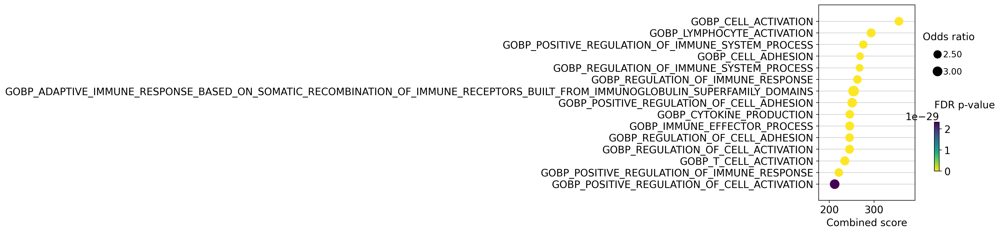

In [214]:
dc.plot_dotplot(
    enrichment_results["2_vs_0"]["dc_ora"]["go_biological_process"].sort_values('Combined score', ascending=False).head(15),
    x='Combined score',
    y='Term',
    s='Odds ratio',
    c='FDR p-value',
    scale=0.7,
)

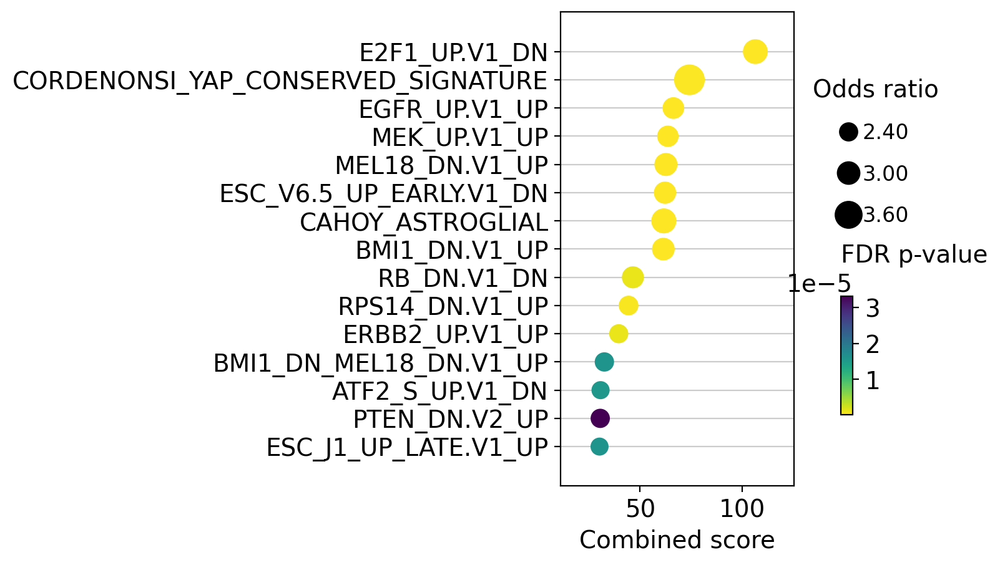

In [91]:
dc.plot_dotplot(
    enrichment_results["3_vs_0"]["dc_ora"]["oncogenic_signatures"].sort_values('Combined score', ascending=False).head(15),
    x='Combined score',
    y='Term',
    s='Odds ratio',
    c='FDR p-value',
    scale=0.7,
)

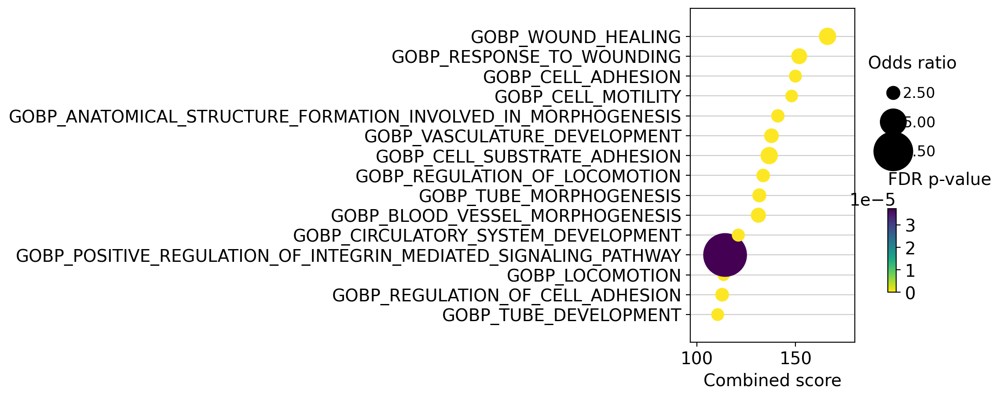

In [210]:
dc.plot_dotplot(
    enrichment_results["3_vs_0"]["dc_ora"]["go_biological_process"].sort_values('Combined score', ascending=False).head(15),
    x='Combined score',
    y='Term',
    s='Odds ratio',
    c='FDR p-value',
    scale=0.7,
)

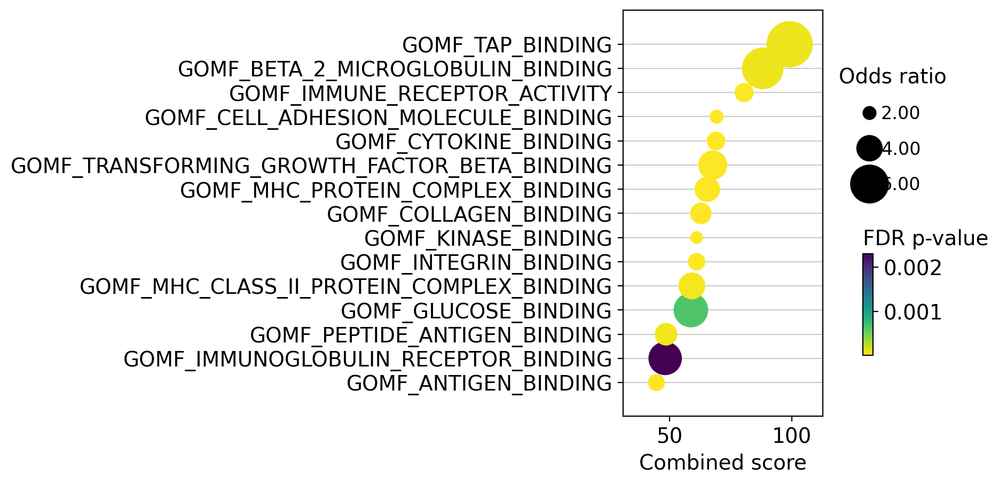

In [107]:
dc.plot_dotplot(
    enrichment_results["N_vs_Y/I"]["dc_ora"]["go_molecular_function"].sort_values('Combined score', ascending=False).head(15),
    x='Combined score',
    y='Term',
    s='Odds ratio',
    c='FDR p-value',
    scale=0.7,
)

## DEG for Organ

In [ ]:
grapher = pd.DataFrame(dds_sig.layers["lognormalized_counts"].T, index=dds_sig.var_names, columns=dds_sig.obs_names)

In [ ]:
lung_columns = [col for col in grapher.columns if col.endswith('_Lung')]
lymph_node_columns = [col for col in grapher.columns if col.endswith('_Lymph Node')]
sorted_columns = lung_columns + lymph_node_columns

# Reorder the DataFrame
grapher_sorted = grapher[sorted_columns]

In [ ]:
grapher

,R1_79,R1_19,R2_29,R1_81,R2_35,R1_67,R2_53,R1_68,R1_60,R1_07,...,R1_71,R1_05,R1_59,R1_70,R1_64,R2_47,R2_31,R2_08,R2_56,R1_62
LASP1,6.703149,7.394491,6.729467,6.488073,6.367259,7.158772,0.000000,6.825207,7.151823,6.708773,...,6.870850,6.976720,6.234179,7.011420,6.771742,6.907537,7.001483,6.691534,6.633095,7.638171
TFPI,6.406413,6.901136,6.478047,6.899625,6.701017,6.593556,0.000000,6.540071,8.151983,6.085427,...,6.350417,6.664052,6.625259,7.237502,6.085491,7.065538,6.603767,7.138254,6.622527,6.763700
PLXND1,6.726432,7.860242,7.834568,6.570539,7.253323,7.130976,0.000000,7.097070,7.274894,6.741886,...,7.652460,7.732161,7.010562,7.869298,7.435006,7.678030,7.421192,7.466423,7.460675,7.683935
RBM6,5.779248,6.696362,6.880311,6.412555,6.319525,6.082035,0.000000,5.935139,6.702130,6.727304,...,6.490487,6.568310,6.590506,6.644674,6.204295,6.829908,6.568257,6.408654,5.636819,6.797950
LAMP2,6.508751,6.782335,6.819245,6.934077,6.528354,7.337760,8.075949,6.873883,7.296112,7.173160,...,6.643196,6.839616,6.506217,7.179836,7.525926,6.985345,7.498964,6.713295,6.363213,6.494301
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NPEPPSP1-2,5.679490,6.058977,5.833547,5.365776,6.151316,5.831946,0.000000,5.892694,5.572546,6.524449,...,5.803126,5.704986,6.103329,5.820737,6.026441,5.569730,5.181657,6.194638,4.109358,4.954331
ENSG00000291089,5.028208,4.720963,5.591789,4.809659,4.950702,5.225671,0.000000,5.408909,5.373590,5.038829,...,5.824205,5.129510,4.827099,5.254767,5.461015,5.183769,6.245803,5.162903,3.365808,2.041763
SVIL-AS1-1,5.802706,6.650435,5.942443,5.937820,6.899692,6.097999,0.000000,6.678430,6.177667,5.859359,...,6.536548,5.819693,6.385641,6.173949,6.020339,5.900012,5.975255,5.757143,5.340801,5.607709
ENSG00000291149,3.515583,5.232271,4.071325,4.315928,0.000000,4.955416,0.000000,3.969746,5.952899,3.632029,...,3.736211,3.981003,4.151626,4.840571,3.889269,4.194806,4.511932,3.851762,0.000000,5.678916


In [ ]:
sns.clustermap(grapher_sorted, z_score=0, cmap="RdYlBu_r",col_cluster=False, row_cluster=True)

In [ ]:
sns.clustermap(grapher_sorted, z_score=0, cmap="RdYlBu_r",col_cluster=True, row_cluster=True)

In [ ]:
results_df

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
TSPAN6,146.674774,0.114409,0.224153,0.510409,0.609765,0.856587
DPM1,346.873559,-0.389263,0.116197,-3.350035,0.000808,0.016314
SCYL3,147.033076,-0.126942,0.175449,-0.723524,0.469358,0.771370
C1orf112,192.452222,0.249136,0.246210,1.011882,0.311595,0.652558
FGR,37.267476,1.210276,0.518415,2.334571,0.019566,0.153292
...,...,...,...,...,...,...
ENSG00000291288,11.240830,-1.023261,0.429015,-2.385142,0.017073,0.140770
ENSG00000291290,18.969014,-0.979190,0.466265,-2.100072,0.035723,0.220646
ENSG00000291299,186.061476,0.004276,0.158382,0.026996,0.978463,0.995528
ENSG00000291313,10.088910,-0.838987,1.117065,-0.751064,0.452614,0.761548


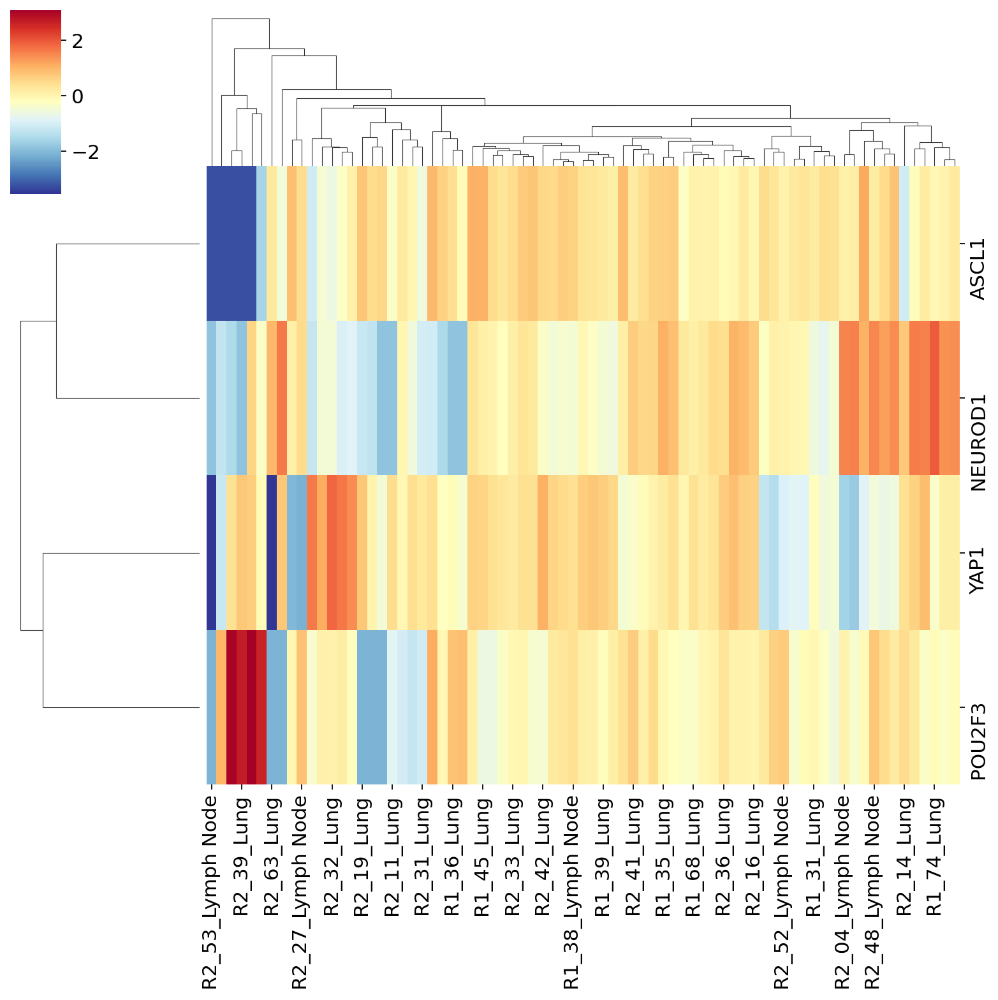

In [ ]:
dds_sub = dds[:, results_df[results_df.index.isin(["ASCL1","NEUROD1","POU2F3","YAP1","RB1","TP53","MYC","BCL2","TTF1","SLFN11","KRAS", "CHGA","SYP","NCAM1","DLL3","IGFBP5","INSM1","SOX2","AURKA","IGF1R","SOX9","GFI1B","HES6","NFIB","CREBBP","EZH2","RET","AJUBA","CDK4"])].index]
grapher = pd.DataFrame(dds_sub.layers["log1p"].T, index=dds_sub.var_names, columns=dds_sub.obs_names)
grapher_sorted = grapher[sorted_columns]
sns.clustermap(grapher_sorted, z_score=0, cmap="RdYlBu_r",col_cluster=True)

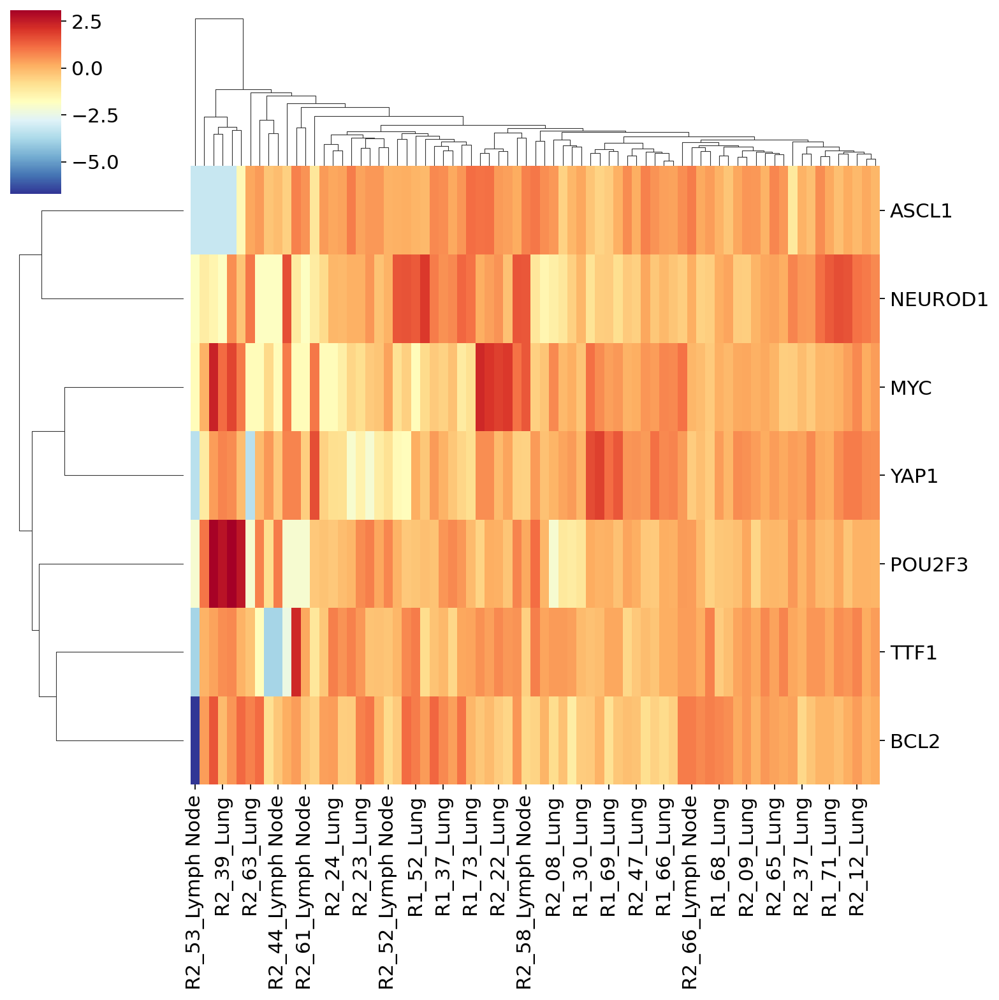

In [ ]:
sns.clustermap(grapher_sorted, z_score=0, cmap="RdYlBu_r",col_cluster=True)

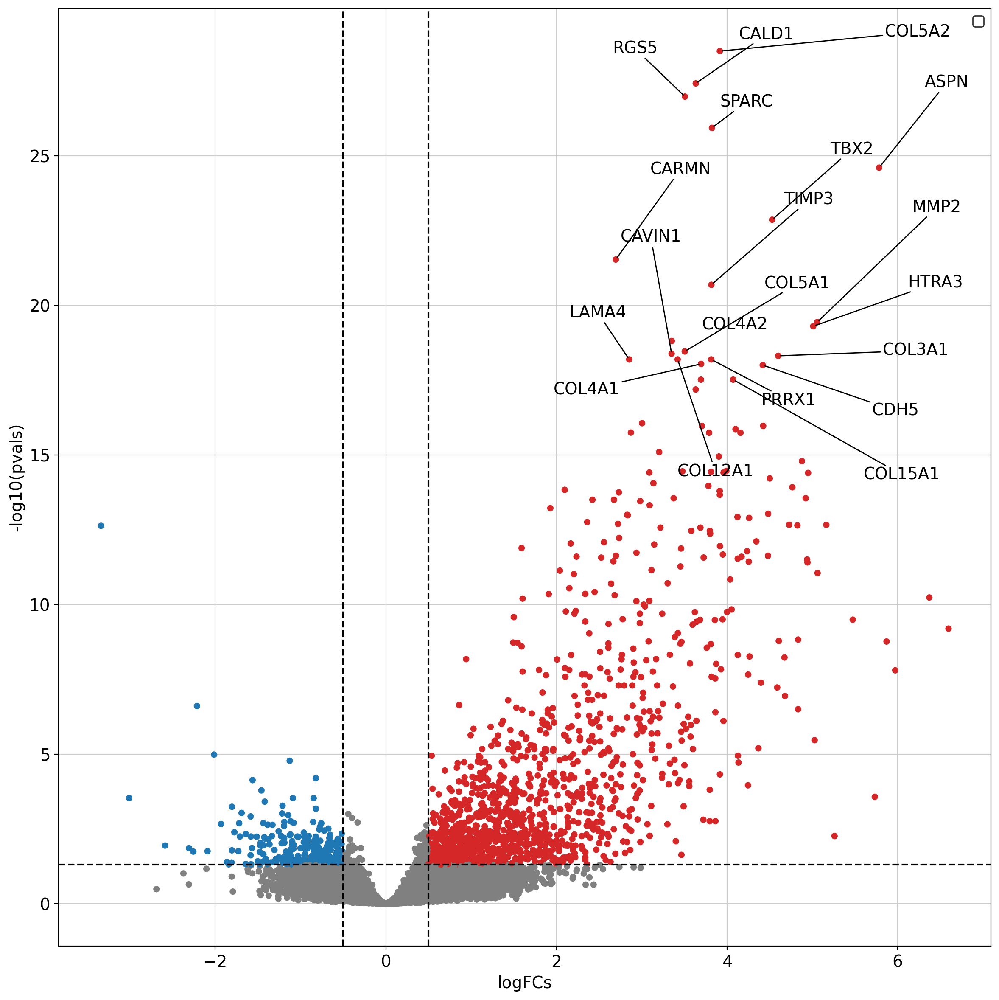

In [ ]:
# Use rc_context to temporarily set the figure size
with plt.rc_context():
    plot_func = dc.plot_volcano_df(
        results_df,
        x='log2FoldChange',
        y='padj',
        top=20,
    )
    fig = plt.gcf()  # Get the current figure
    fig.set_size_inches(12, 12)  # Set the figure size manually
    
    ax = plt.gca()  # Get the current axis
    ax.legend(loc='best')  # Customize the legend (rcParams will handle color)
    
    # Use tight_layout to adjust layout
    plt.tight_layout()

    # Save the figure, ensuring no elements are cut off
    # fig.savefig('/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/your_figure_name.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

After performing DEA, we can use the obtained gene level statistics to perform enrichment analysis. Any statistic can be used,
but we recommend using the t-values instead of logFCs since t-values incorporate the significance of change in their value.
We will transform the obtained t-values stored in `stats` to a wide matrix so that it can be used by `decoupler`:

In [ ]:
mat = results_df[['stat']].T.rename(index={'stat': 'Lung.vs.LymphNode'})
mat

,TSPAN6,DPM1,SCYL3,C1orf112,FGR,CFH,FUCA2,GCLC,NFYA,STPG1,...,ENSG00000291275,ENSG00000291276,ANKRD20A11P-1,ENSG00000291282,ENSG00000291283,ENSG00000291288,ENSG00000291290,ENSG00000291299,ENSG00000291313,TMEM276
Lung.vs.LymphNode,0.510409,-3.350035,-0.723524,1.011882,2.334571,3.566941,1.592982,0.769151,2.009626,0.492182,...,-1.499804,-2.070219,0.400443,1.448278,-1.255188,-2.385142,-2.100072,0.026996,-0.751064,0.276315


# Transcription factor activity inference

The first functional analysis we can perform is to infer transcription factor (TF) activities from our transcriptomics data. We will need a gene regulatory network (GRN) and a statistical method.

### CollecTRI network
[CollecTRI](https://github.com/saezlab/CollecTRI) is a comprehensive resource
containing a curated collection of TFs and their transcriptional targets
compiled from 12 different resources. This collection provides an increased
coverage of transcription factors and a superior performance in identifying
perturbed TFs compared to our previous
[DoRothEA](https://saezlab.github.io/dorothea/) network and other literature
based GRNs. Similar to DoRothEA, interactions are weighted by their mode of
regulation (activation or inhibition).

For this example we will use the human version (mouse and rat are also
available). We can use `decoupler` to retrieve it from `omnipath`. The argument
`split_complexes` keeps complexes or splits them into subunits, by default we
recommend to keep complexes together.

<div class="alert alert-info">

**Note**

In this tutorial we use the network CollecTRI, but we could use any other GRN coming from an inference method such as [CellOracle](https://morris-lab.github.io/CellOracle.documentation/), [pySCENIC](https://pyscenic.readthedocs.io/en/latest/) or [SCENIC+](https://scenicplus.readthedocs.io/en/latest/). 

</div> 

In [ ]:
# Retrieve CollecTRI gene regulatory network
collectri = dc.get_collectri(organism='human', split_complexes=False)
collectri

,source,target,weight,PMID
0,MYC,TERT,1,10022128;10491298;10606235;10637317;10723141;1...
1,SPI1,BGLAP,1,10022617
2,SMAD3,JUN,1,10022869;12374795
3,SMAD4,JUN,1,10022869;12374795
4,STAT5A,IL2,1,10022878;11435608;17182565;17911616;22854263;2...
...,...,...,...,...
43173,NFKB,hsa-miR-143-3p,1,19472311
43174,AP1,hsa-miR-206,1,19721712
43175,NFKB,hsa-miR-21-5p,1,20813833;22387281
43176,NFKB,hsa-miR-224-5p,1,23474441;23988648


### Activity inference with Univariate Linear Model (ULM)

To infer TF enrichment scores we will run the Univariate Linear Model (`ulm`) method. For each sample in our dataset (`mat`) and each TF in our network (`net`), it fits a linear model that predicts the observed gene expression
based solely on the TF's TF-Gene interaction weights. Once fitted, the obtained t-value of the slope is the score. If it is positive, we interpret that the TF is active and if it is negative we interpret that it is inactive.

<img src="../ulm.png" />

We can run `ulm` with a one-liner:

In [ ]:
# Infer TF activities with ulm
tf_acts, tf_pvals = dc.run_ulm(mat=mat, net=collectri, verbose=True)
tf_acts 	

Running ulm on mat with 1 samples and 23219 targets for 701 sources.


,ABL1,AHR,AHRR,AIP,AIRE,AP1,APEX1,AR,ARID1A,ARID3A,...,ZNF362,ZNF382,ZNF384,ZNF395,ZNF436,ZNF699,ZNF76,ZNF804A,ZNF91,ZXDC
Lung.vs.LymphNode,-0.272535,4.693959,-1.958587,0.412649,1.851745,11.203584,1.173592,7.515489,0.836594,-0.849808,...,2.957221,-1.170319,4.424486,0.289466,-2.052598,2.176449,0.231242,-0.275438,4.088609,2.218354


In [ ]:
tf_acts

,ABL1,AHR,AHRR,AIP,AIRE,AP1,APEX1,AR,ARID1A,ARID3A,...,ZNF362,ZNF382,ZNF384,ZNF395,ZNF436,ZNF699,ZNF76,ZNF804A,ZNF91,ZXDC
Lung.vs.LymphNode,-0.272535,4.693959,-1.958587,0.412649,1.851745,11.203584,1.173592,7.515489,0.836594,-0.849808,...,2.957221,-1.170319,4.424486,0.289466,-2.052598,2.176449,0.231242,-0.275438,4.088609,2.218354


Let us plot the obtained scores for the top active/inactive transcription factors:

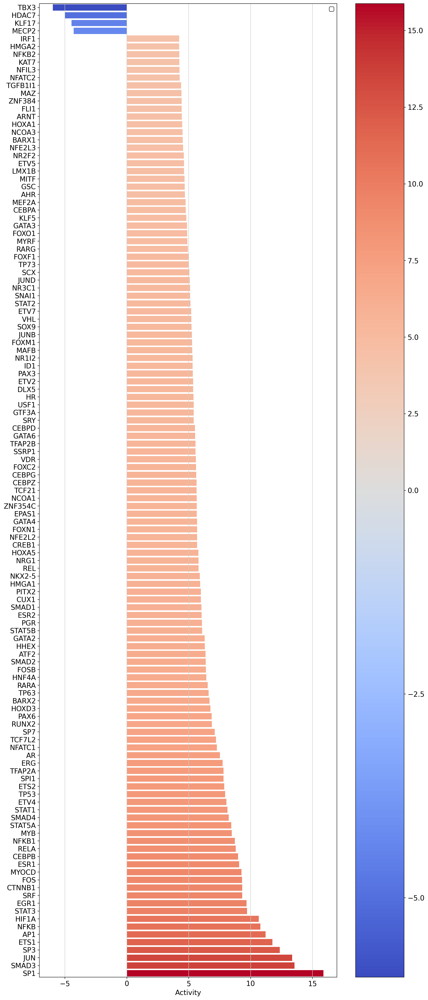

In [ ]:
# Use rc_context to temporarily set the figure size
with plt.rc_context():
    plot_func = dc.plot_barplot(
		acts=tf_acts,
		contrast='Lung.vs.LymphNode',
		top=125,
		vertical=True,
	)
		
    fig = plt.gcf()  # Get the current figure
    fig.set_size_inches(12, 28)  # Set the figure size manually
    
    ax = plt.gca()  # Get the current axis
    ax.legend(loc='best')  # Customize the legend (rcParams will handle color)
    
    # Use tight_layout to adjust layout
    plt.tight_layout()

    # Save the figure, ensuring no elements are cut off
    # fig.savefig('/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/your_figure_name.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

MYOCD SRF and JUNB seem to be the most activated in this treatment while IRF1, KLF11 AND ARID1A seem to be inactivated.

We can also plot the network of interesting TFs (top and bottom by activity) and color the nodes by activity and target gene expression:

In [ ]:
collectri

,source,target,weight,PMID
0,MYC,TERT,1,10022128;10491298;10606235;10637317;10723141;1...
1,SPI1,BGLAP,1,10022617
2,SMAD3,JUN,1,10022869;12374795
3,SMAD4,JUN,1,10022869;12374795
4,STAT5A,IL2,1,10022878;11435608;17182565;17911616;22854263;2...
...,...,...,...,...
43173,NFKB,hsa-miR-143-3p,1,19472311
43174,AP1,hsa-miR-206,1,19721712
43175,NFKB,hsa-miR-21-5p,1,20813833;22387281
43176,NFKB,hsa-miR-224-5p,1,23474441;23988648


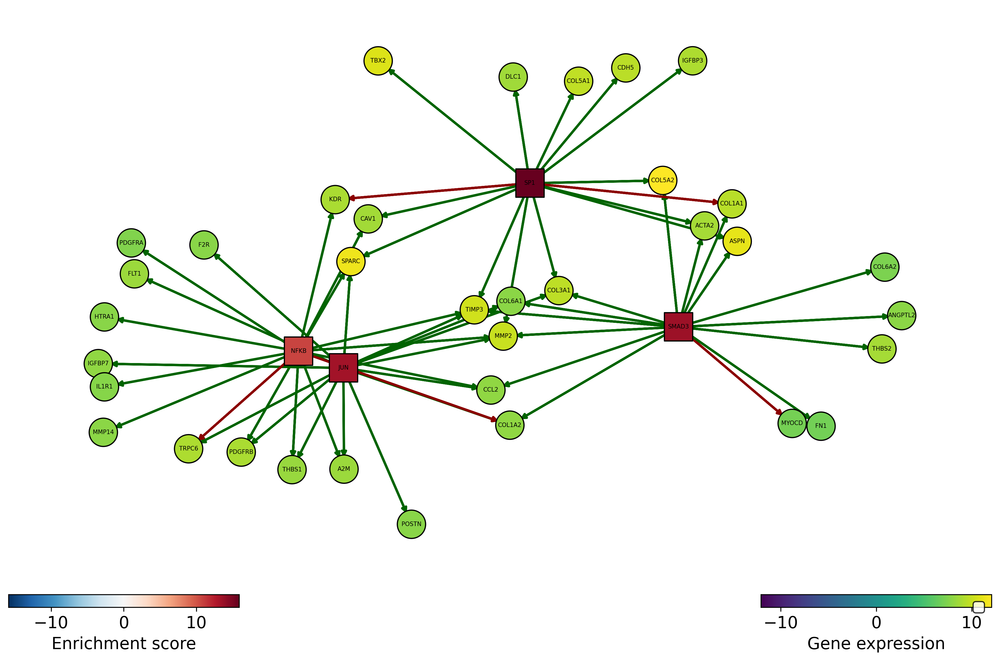

In [ ]:
# Use rc_context to temporarily set the figure size
with plt.rc_context():
    plot_func = dc.plot_network(
		net=collectri,
		obs=mat,
		act=tf_acts,
		n_sources=['SP1', 'SMAD3', 'JUN', 'NFKB'],
		n_targets=15,
		node_size=100,
		figsize=(10, 10),
		c_pos_w='darkgreen',
		c_neg_w='darkred',
		vcenter=True
	)
    
    fig = plt.gcf()  # Get the current figure
    fig.set_size_inches(12, 8)  # Set the figure size manually
    
    ax = plt.gca()  # Get the current axis
    ax.legend(loc='best')  # Customize the legend (rcParams will handle color)
    
    # Use tight_layout to adjust layout
    plt.tight_layout()

    # Save the figure, ensuring no elements are cut off
    # fig.savefig('/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/your_figure_name.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

SRF seems to be active in treated cells since their positive targets are up-regulated.

If needed, we can also look at a volcano plot of the target genes:

In [ ]:
# Extract logFCs and pvals
logFCs = results_df[['log2FoldChange']].T.rename(index={'log2FoldChange': 'Lung.vs.LymphNode'})
pvals = results_df[['padj']].T.rename(index={'padj': 'Lung.vs.LymphNode'})

# Plot


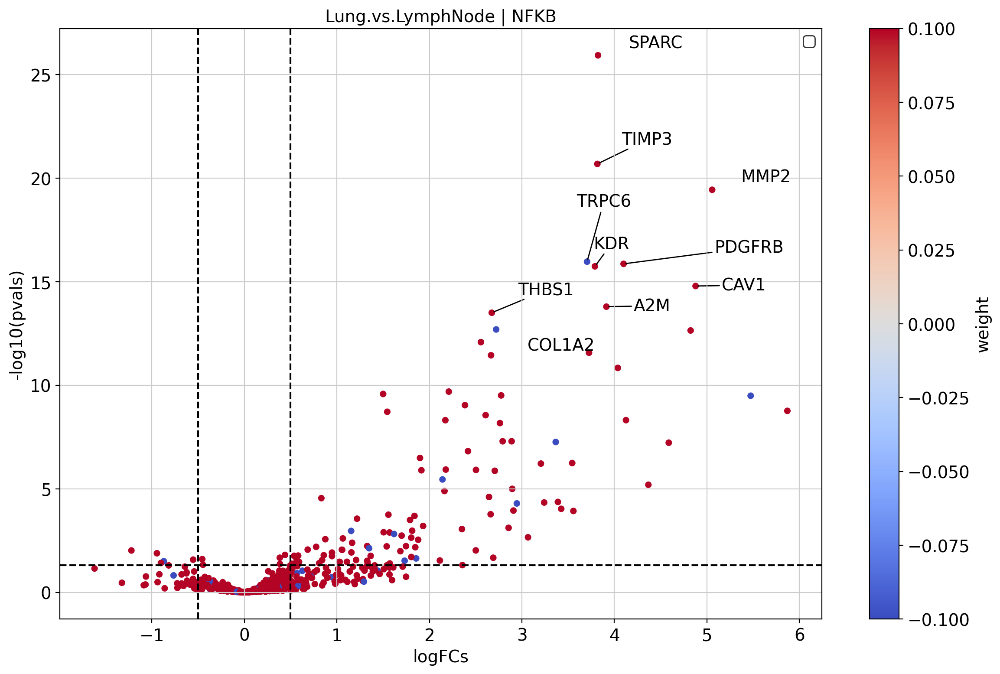

In [ ]:
# Use rc_context to temporarily set the figure size
with plt.rc_context():
    plot_func = dc.plot_volcano(
        logFCs,
        pvals,
        'Lung.vs.LymphNode',
        name='NFKB',
        net=collectri,
        top=10,
        sign_thr=0.05,
        lFCs_thr=0.5
    )
    
    fig = plt.gcf()  # Get the current figure
    fig.set_size_inches(12, 8)  # Set the figure size manually
    
    ax = plt.gca()  # Get the current axis
    ax.legend(loc='best')  # Customize the legend (rcParams will handle color)
    
    # Use tight_layout to adjust layout
    plt.tight_layout()

    # Save the figure, ensuring no elements are cut off
    # fig.savefig('/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/your_figure_name.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

# Pathway activity inference

Another analysis we can perform is to infer pathway activities from our transcriptomics data.

### PROGENy model

[PROGENy](https://saezlab.github.io/progeny/) is a comprehensive resource containing a curated collection of pathways and their target genes, with weights for each interaction.
For this example we will use the human weights (other organisms are available) and we will use the top 500 responsive genes ranked by p-value. Here is a brief description of each pathway:

- **Androgen**: involved in the growth and development of the male reproductive organs.
- **EGFR**: regulates growth, survival, migration, apoptosis, proliferation, and differentiation in mammalian cells
- **Estrogen**: promotes the growth and development of the female reproductive organs.
- **Hypoxia**: promotes angiogenesis and metabolic reprogramming when O2 levels are low.
- **JAK-STAT**: involved in immunity, cell division, cell death, and tumor formation.
- **MAPK**: integrates external signals and promotes cell growth and proliferation.
- **NFkB**: regulates immune response, cytokine production and cell survival.
- **p53**: regulates cell cycle, apoptosis, DNA repair and tumor suppression.
- **PI3K**: promotes growth and proliferation.
- **TGFb**: involved in development, homeostasis, and repair of most tissues.
- **TNFa**: mediates haematopoiesis, immune surveillance, tumour regression and protection from infection.
- **Trail**: induces apoptosis.
- **VEGF**: mediates angiogenesis, vascular permeability, and cell migration.
- **WNT**: regulates organ morphogenesis during development and tissue repair.

To access it we can use `decoupler`.

In [ ]:
# Retrieve PROGENy model weights
progeny = dc.get_progeny(top=500)
progeny

,source,target,weight,p_value
0,Androgen,TMPRSS2,11.490631,0.000000e+00
1,Androgen,NKX3-1,10.622551,2.242078e-44
2,Androgen,MBOAT2,10.472733,4.624285e-44
3,Androgen,KLK2,10.176186,1.944414e-40
4,Androgen,SARG,11.386852,2.790209e-40
...,...,...,...,...
6995,p53,ZMYM4,-2.325752,1.522388e-06
6996,p53,CFDP1,-1.628168,1.526045e-06
6997,p53,VPS37D,2.309503,1.537098e-06
6998,p53,TEDC1,-2.274823,1.547037e-06


### Activity inference with Multivariate Linear Model (MLM)

To infer pathway enrichment scores we will run the Multivariate Linear Model (`mlm`) method. For each sample in our dataset (`adata`), it fits a linear model that predicts the observed gene expression based on all pathways' Pathway-Gene interactions weights.
Once fitted, the obtained t-values of the slopes are the scores. If it is positive, we interpret that the pathway is active and if it is negative we interpret that it is inactive.

<img src="../mlm.png" />
     
We can run `mlm` with a one-liner:

In [ ]:
# Infer pathway activities with mlm
pathway_acts, pathway_pvals = dc.run_mlm(mat=mat, net=progeny, verbose=True)
pathway_acts

Running mlm on mat with 1 samples and 23219 targets for 14 sources.


,Androgen,EGFR,Estrogen,Hypoxia,JAK-STAT,MAPK,NFkB,PI3K,TGFb,TNFa,Trail,VEGF,WNT,p53
Lung.vs.LymphNode,4.885453,0.500617,1.154012,0.13278,6.6437,0.982684,0.369918,1.468549,14.149863,4.829954,0.73279,1.755929,2.536787,2.829577


Let us plot the obtained scores:

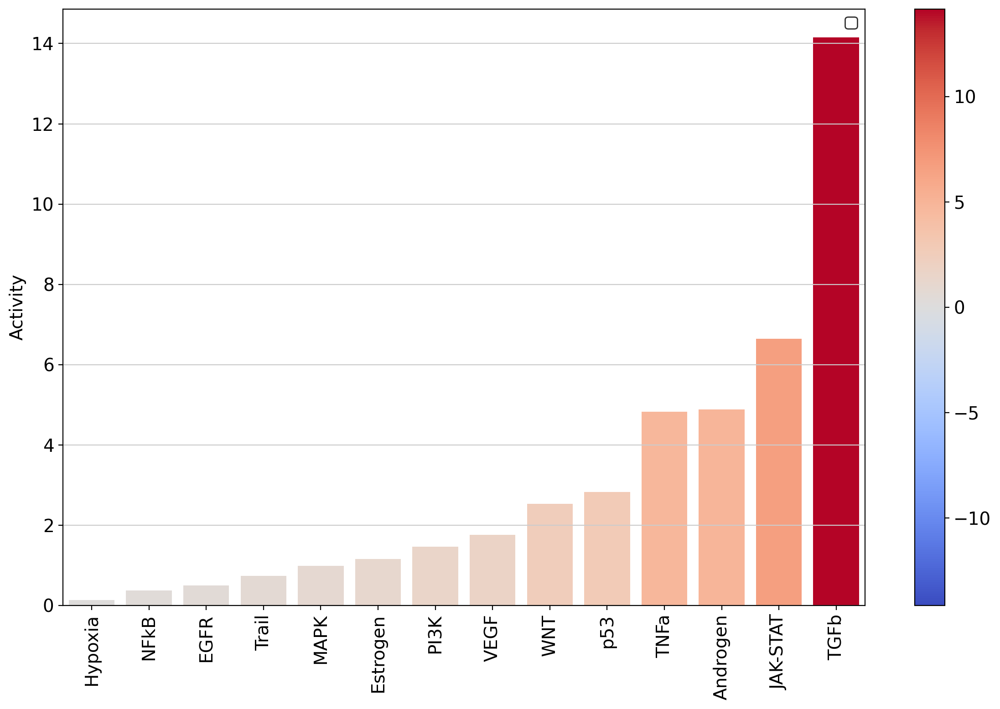

In [ ]:
# Use rc_context to temporarily set the figure size
with plt.rc_context():
    plot_func = dc.plot_barplot(
		pathway_acts,
		'Lung.vs.LymphNode',
		top=25,
		vertical=False,
	)
    
    fig = plt.gcf()  # Get the current figure
    fig.set_size_inches(12, 8)  # Set the figure size manually
    
    ax = plt.gca()  # Get the current axis
    ax.legend(loc='best')  # Customize the legend (rcParams will handle color)
    
    # Use tight_layout to adjust layout
    plt.tight_layout()

    # Save the figure, ensuring no elements are cut off
    # fig.savefig('/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/your_figure_name.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

As expected, after treating cells with the cytokine TGFb we see an increase of activity for this pathway.

On the other hand, it seems that this treatment has decreased the activity of other pathways like JAK-STAT or TNFa.

We can visualize the targets of TFGb in a scatter plot:

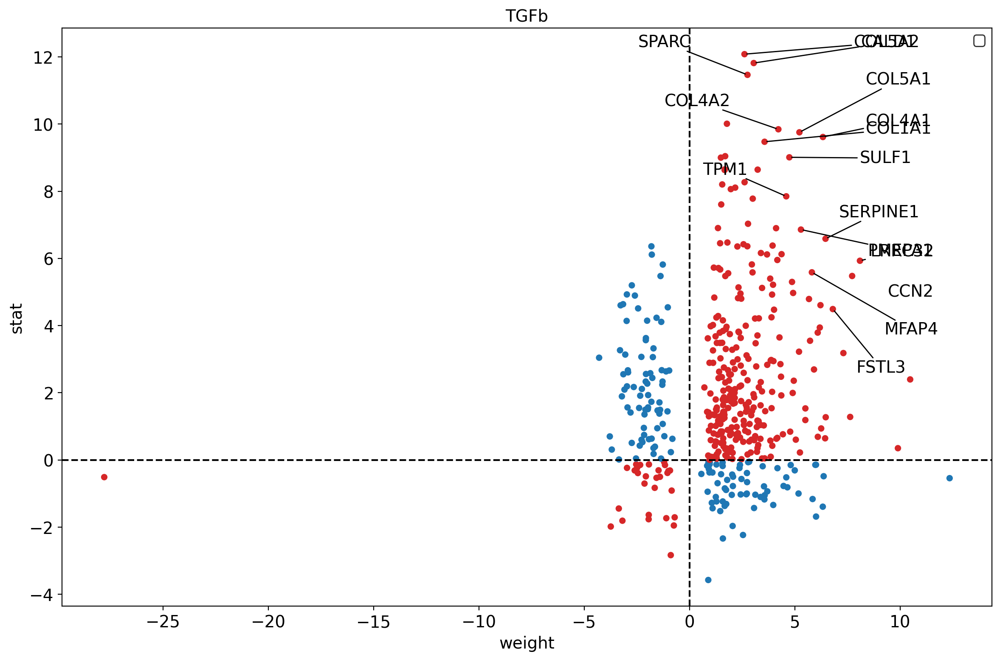

In [ ]:
# Use rc_context to temporarily set the figure size
with plt.rc_context():
    plot_func = dc.plot_targets(results_df, stat='stat', source_name='TGFb', net=progeny, top=15)
    
    fig = plt.gcf()  # Get the current figure
    fig.set_size_inches(12, 8)  # Set the figure size manually
    
    ax = plt.gca()  # Get the current axis
    ax.legend(loc='best')  # Customize the legend (rcParams will handle color)
    
    # Use tight_layout to adjust layout
    plt.tight_layout()

    # Save the figure, ensuring no elements are cut off
    # fig.savefig('/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/your_figure_name.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

The observed activation of TGFb is due to the fact that majority of its target genes with positive weights have positive
t-values (1st quadrant), and the majority of the ones with negative weights have negative t-values (3d quadrant).

# Functional enrichment of biological terms

Finally, we can also infer activities for general biological terms or processes.

### MSigDB gene sets

The Molecular Signatures Database ([MSigDB](http://www.gsea-msigdb.org/gsea/msigdb/)) is a resource containing a collection of gene sets annotated to different biological processes.

In [ ]:
msigdb = dc.get_resource('MSigDB')
msigdb

,genesymbol,collection,geneset
0,MAFF,chemical_and_genetic_perturbations,BOYAULT_LIVER_CANCER_SUBCLASS_G56_DN
1,MAFF,chemical_and_genetic_perturbations,ELVIDGE_HYPOXIA_UP
2,MAFF,chemical_and_genetic_perturbations,NUYTTEN_NIPP1_TARGETS_DN
3,MAFF,immunesigdb,GSE17721_POLYIC_VS_GARDIQUIMOD_4H_BMDC_DN
4,MAFF,chemical_and_genetic_perturbations,SCHAEFFER_PROSTATE_DEVELOPMENT_12HR_UP
...,...,...,...
3838543,PRAMEF22,go_biological_process,GOBP_POSITIVE_REGULATION_OF_CELL_POPULATION_PR...
3838544,PRAMEF22,go_biological_process,GOBP_APOPTOTIC_PROCESS
3838545,PRAMEF22,go_biological_process,GOBP_REGULATION_OF_CELL_DEATH
3838546,PRAMEF22,go_biological_process,GOBP_NEGATIVE_REGULATION_OF_DEVELOPMENTAL_PROCESS


As an example, we will use the hallmark gene sets, but we could have used any other. 

<div class="alert alert-info">

**Note**
    
To see what other collections are available in MSigDB, type: `msigdb['collection'].unique()`.

</div>  

We can filter by for `hallmark`:

In [ ]:
progeny = dc.get_progeny(organism='human', top=500)
progeny

,source,target,weight,p_value
0,Androgen,TMPRSS2,11.490631,0.000000e+00
1,Androgen,NKX3-1,10.622551,2.242078e-44
2,Androgen,MBOAT2,10.472733,4.624285e-44
3,Androgen,KLK2,10.176186,1.944414e-40
4,Androgen,SARG,11.386852,2.790209e-40
...,...,...,...,...
6995,p53,ZMYM4,-2.325752,1.522388e-06
6996,p53,CFDP1,-1.628168,1.526045e-06
6997,p53,VPS37D,2.309503,1.537098e-06
6998,p53,TEDC1,-2.274823,1.547037e-06


In [ ]:
adata.raw = adata.copy()

In [ ]:
dc.run_mlm(
    mat=adata,
    net=progeny,
    source='source',
    target='target',
    weight='weight',
    verbose=True
)

Running mlm on mat with 75 samples and 23219 targets for 14 sources.


In [ ]:
adata.obsm['progeny_mlm_estimate'] = adata.obsm['mlm_estimate'].copy()
adata.obsm['progeny_mlm_pvals'] = adata.obsm['mlm_pvals'].copy()
adata

AnnData object with n_obs × n_vars = 75 × 23219
    obs: 'External_ID', 'Project_ID', 'Organism', 'Sample-Biosource', 'RIN', 'Concentration', 'Flowcell_Name', 'Flowcell_ID', 'R1', 'R1_md5sum', 'R2', 'R2_md5sum', 'batch', 'leiden', 'group', 'Negative Radiation Sensitivity (RS)', 'RSI'
    var: 'ENSG', 'chrom', 'source', 'start', 'end', 'strand', 'gene_version', 'gene_source', 'gene_biotype', 'gc_content', 'length', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'Sample_Biosource_colors', 'leiden', 'dendrogram_leiden', 'trend_coeffs', '_squared_logres', 'prior_disp_var', 'wilcoxon'
    obsm: 'X_pca', 'X_umap', 'design_matrix', 'size_factors', 'replaceable', 'mlm_estimate', 'mlm_pvals', 'progeny_mlm_estimate', 'progeny_mlm_pvals'
    varm: 'PCs', 'non_zero', '_rough_dispersions', 'genewise_dispersions', '_genewise_converged', '_normed_means', 'fitted_dispersions', 'MAP_dispe

In [ ]:
acts = dc.get_acts(adata, obsm_key='mlm_estimate')
acts

AnnData object with n_obs × n_vars = 75 × 14
    obs: 'External_ID', 'Project_ID', 'Organism', 'Sample-Biosource', 'RIN', 'Concentration', 'Flowcell_Name', 'Flowcell_ID', 'R1', 'R1_md5sum', 'R2', 'R2_md5sum', 'batch', 'leiden', 'group', 'Negative Radiation Sensitivity (RS)', 'RSI'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'Sample_Biosource_colors', 'leiden', 'dendrogram_leiden', 'trend_coeffs', '_squared_logres', 'prior_disp_var', 'wilcoxon'
    obsm: 'X_pca', 'X_umap', 'design_matrix', 'size_factors', 'replaceable', 'mlm_estimate', 'mlm_pvals', 'progeny_mlm_estimate', 'progeny_mlm_pvals'

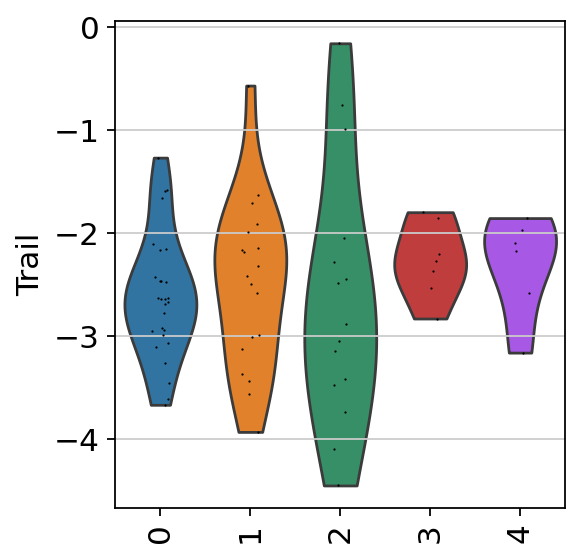

In [ ]:
sc.pl.violin(acts, keys=['Trail'], groupby='leiden', rotation=90)

In [ ]:
# Filter by hallmark
msigdb = msigdb[msigdb['collection']=='hallmark']

# Remove duplicated entries
msigdb = msigdb[~msigdb.duplicated(['geneset', 'genesymbol'])]

# Rename
msigdb.loc[:, 'geneset'] = [name.split('HALLMARK_')[1] for name in msigdb['geneset']]

msigdb

,genesymbol,collection,geneset
233,MAFF,hallmark,IL2_STAT5_SIGNALING
250,MAFF,hallmark,COAGULATION
270,MAFF,hallmark,HYPOXIA
373,MAFF,hallmark,TNFA_SIGNALING_VIA_NFKB
377,MAFF,hallmark,COMPLEMENT
...,...,...,...
1449668,STXBP1,hallmark,PANCREAS_BETA_CELLS
1450315,ELP4,hallmark,PANCREAS_BETA_CELLS
1450526,GCG,hallmark,PANCREAS_BETA_CELLS
1450731,PCSK2,hallmark,PANCREAS_BETA_CELLS


### Enrichment with Over Representation Analysis (ORA)

To infer functional enrichment scores we will run the Over Representation Analysis (`ora`) method.
As input data it accepts an expression matrix (`decoupler.run_ora`) or the results of differential expression analysis (`decoupler.run_ora_df`).
For the former, by default the top 5% of expressed genes by sample are selected as the set of interest (S*), and for the latter a user-defined
significance filtering can be used.
Once we have S*, it builds a contingency table using set operations for each set stored in the gene set resource being used (`net`).
Using the contingency table, `ora` performs a one-sided Fisher exact test to test for significance of overlap between sets.
The final score is obtained by log-transforming the obtained p-values, meaning that higher values are more significant.

<img src="../ora.png" />
     
We can run `ora` with a simple one-liner:

In [238]:
# Infer enrichment with ora using significant deg
top_genes = results_df[results_df['padj'] < 0.05]

# Run ora
enr_pvals = dc.get_ora_df(
    df=top_genes,
    net=msigdb,
    source='geneset',
    target='genesymbol'
)

enr_pvals.head()


NameError: name 'results_df' is not defined

Then we can visualize the most enriched terms:

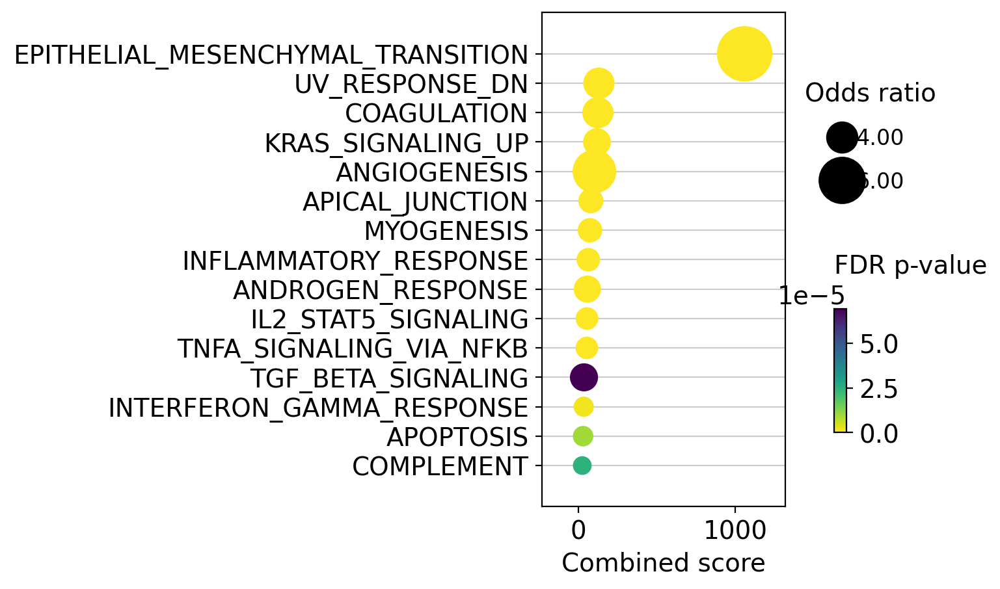

In [ ]:
dc.plot_dotplot(
    enr_pvals.sort_values('Combined score', ascending=False).head(15),
    x='Combined score',
    y='Term',
    s='Odds ratio',
    c='FDR p-value',
    scale=0.7,
)

TNFa and interferons response (JAK-STAT) processes seem to be enriched. We previously observed a similar result with the PROGENy pathways, were they were significantly downregulated. Therefore, one of the limitations of using a prior knowledge resource without weights is that it doesn't provide direction.

We can also plot the running score for a given gene set:

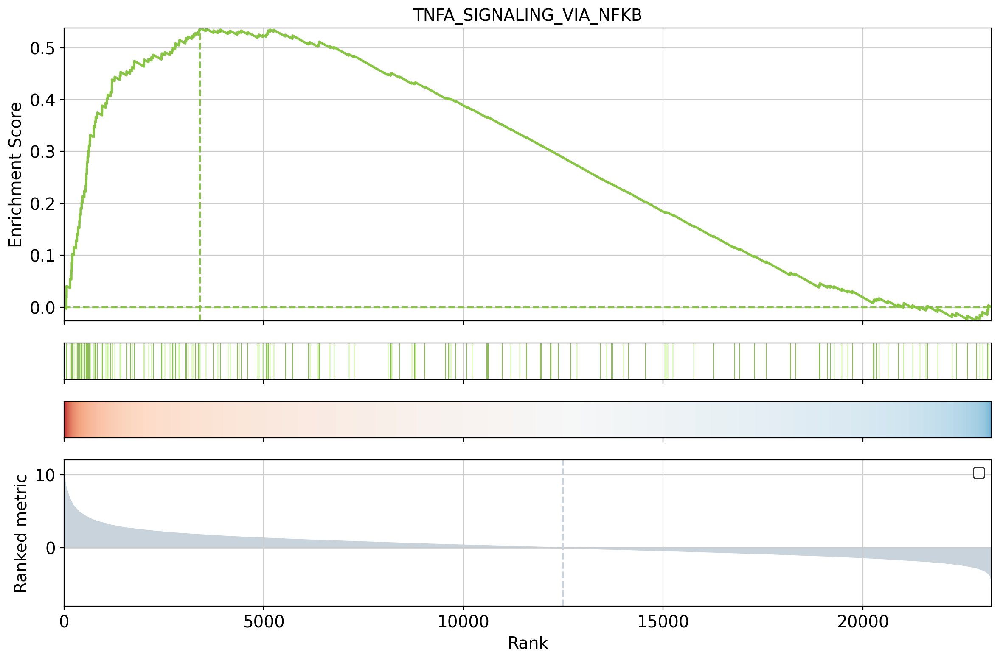

In [ ]:
# Use rc_context to temporarily set the figure size
with plt.rc_context():
    plot_func = dc.plot_running_score(
		df=results_df,
		stat='stat',
		net=msigdb,
		source='geneset',
		target='genesymbol',
		set_name='TNFA_SIGNALING_VIA_NFKB'
	)
    
    fig = plt.gcf()  # Get the current figure
    fig.set_size_inches(12, 8)  # Set the figure size manually
    
    ax = plt.gca()  # Get the current axis
    ax.legend(loc='best')  # Customize the legend (rcParams will handle color)
    
    # Use tight_layout to adjust layout
    plt.tight_layout()

    # Save the figure, ensuring no elements are cut off
    # fig.savefig('/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/your_figure_name.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

## Enrichment of ligand-receptor interactions

Recently, study of interactions between ligands and receptors have gained significant traction, notably pushed by the democratization of single cell sequencing technologies. While most methods (such as the one described in LIANA) are developed for single cell datasets, they rely on a relatively simple assumption of co-expression or co-regulation of two (or more in the context of complexes) genes acting as ligand and receptors to propose hypothetical ligand-receptor interaction events. This concept can seamlessly be applied to a bulk RNA dataset, where the assumption is that sender and receiver cells are convoluted in a single dataset, but the observation of significant co-regulation of ligand and receptors should still correspond to hypothetical ligand-receptor interaction events.

At the core, most current ligand-receptor interaction methods rely on averaging the measurements obtained for ligand and receptor and standardizing them against a background distribution.  Thus, an enrichment method based on a weighted mean can emulate this, where the sets are simply the members of a ligand receptor pair (or more in the context of complexes).

Thus, we can extract ligand-receptor interaction ressources from the LIANA package (available both in [R](https://saezlab.github.io/liana/) and [python](https://liana-py.readthedocs.io/en/latest/)), and use it as a prior knowledge network with decoupler to find the most significant pairs of ligand-receptors in a given bulk dataset.

While more work is required to fully understand the functional relevance of the highlighted ligand-receptor interactions with such an approach, this represents a very straightforward and intuitive approach to embed a bulk RNA dataset with ligand-receptor interaction prior knowledge.


First, we extract ligand-receptor interactions from liana, and decomplexify them to format them into an appropriate decoupleR input.

In [ ]:

liana_lr = ln.resource.select_resource()
liana_lr = ln.resource.explode_complexes(liana_lr)

# Create two new DataFrames, each containing one of the pairs of columns to be concatenated
df1 = liana_lr[['interaction', 'ligand']]
df2 = liana_lr[['interaction', 'receptor']]

# Rename the columns in each new DataFrame
df1.columns = ['interaction', 'genes']
df2.columns = ['interaction', 'genes']

# Concatenate the two new DataFrames
liana_lr = pd.concat([df1, df2], axis=0)
liana_lr['weight'] = 1

# Find duplicated rows
duplicates = liana_lr.duplicated()

# Remove duplicated rows
liana_lr = liana_lr[~duplicates]

liana_lr

,interaction,genes,weight
0,LGALS9&PTPRC,LGALS9,1
1,LGALS9&MET,LGALS9,1
2,LGALS9&CD44,LGALS9,1
3,LGALS9&LRP1,LGALS9,1
4,LGALS9&CD47,LGALS9,1
...,...,...,...
5775,BMP2&ACTR2,ACTR2,1
5776,BMP15&ACTR2,ACTR2,1
5777,CSF1&CSF3R,CSF3R,1
5778,IL36G&IFNAR1,IFNAR1,1


Then we can use `ulm` to find the significant co-regulated pairs of ligand and receptors.

In [ ]:
mat

,TSPAN6,DPM1,SCYL3,C1orf112,FGR,CFH,FUCA2,GCLC,NFYA,STPG1,...,ENSG00000291275,ENSG00000291276,ANKRD20A11P-1,ENSG00000291282,ENSG00000291283,ENSG00000291288,ENSG00000291290,ENSG00000291299,ENSG00000291313,TMEM276
Lung.vs.LymphNode,0.510409,-3.350035,-0.723524,1.011882,2.334571,3.566941,1.592982,0.769151,2.009626,0.492182,...,-1.499804,-2.070219,0.400443,1.448278,-1.255188,-2.385142,-2.100072,0.026996,-0.751064,0.276315


In [ ]:
# Infer lr activities with ulm
lr_score, lr_pvalue = dc.run_ulm(
    mat=mat,
    net=liana_lr,
    source='interaction',
    target='genes',
    min_n=2,
    verbose=True
)

Running ulm on mat with 1 samples and 23219 targets for 3082 sources.


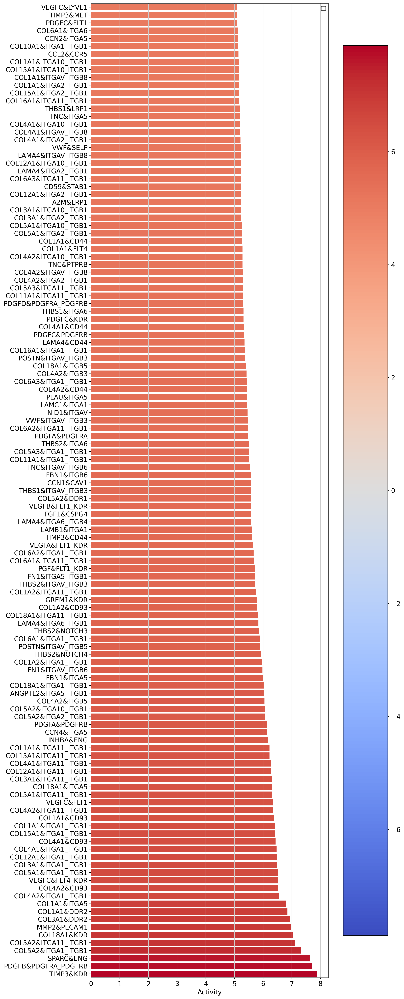

In [ ]:
# Use rc_context to temporarily set the figure size
with plt.rc_context():
    plot_func = dc.plot_barplot(acts=lr_score, contrast='Lung.vs.LymphNode', top=125, vertical=True,figsize=(12,30))
    
    fig = plt.gcf()  # Get the current figure
    fig.set_size_inches(12, 30)  # Set the figure size manually
    
    ax = plt.gca()  # Get the current axis
    ax.legend(loc='best')  # Customize the legend (rcParams will handle color)
    
    # Use tight_layout to adjust layout
    plt.tight_layout()

    # Save the figure, ensuring no elements are cut off
    # fig.savefig('/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/your_figure_name.png', dpi=300, bbox_inches='tight', pad_inches=0.1)


Interactions between colagens and the ITG_ITG complexes seems to be quite enrichned. That is especially relevant since the EMT pathway was significantly enriched in the functional pathway analysis.

# TCGA

In [ ]:
gdc_sample_sheep='/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/gdc_sample_sheet.2024-08-22.tsv'
gdc_download_files='/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/gdc_download_20240822_145832.884522'
clinical_cart='/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/clinical.cart.2024-08-22'
sclc_tcga=ov.bulk.pyTCGA(gdc_sample_sheep,gdc_download_files,clinical_cart)
sclc_tcga.adata_init()


tcga module init success
...index init


... expression matrix init
...anndata construct


In [ ]:
sclc_tcga.adata_meta_init()


...anndata meta init ['gene_name', 'gene_type'] ['Case ID', 'Sample Type']


AnnData object with n_obs × n_vars = 95 × 60664
    obs: 'Case ID', 'Sample Type'
    var: 'gene_name', 'gene_type', 'gene_id'
    layers: 'tpm', 'fpkm', 'deseq_normalize'

In [ ]:
sclc_tcga.adata

AnnData object with n_obs × n_vars = 95 × 60664
    obs: 'Case ID', 'Sample Type', 'vital_status', 'days'
    var: 'gene_name', 'gene_type', 'gene_id'
    layers: 'tpm', 'fpkm', 'deseq_normalize'

In [ ]:
sclc_tcga.adata.obs["days"]

TCGA-49-6744-01A    1683.0
TCGA-05-4410-01A       0.0
TCGA-78-7148-01A       626
TCGA-05-4432-01A     761.0
TCGA-78-7149-01A    3940.0
                     ...  
TCGA-78-7159-01A    1974.0
TCGA-50-6593-01A       336
TCGA-62-8394-01A       139
TCGA-95-7043-01A       503
TCGA-69-7974-01A     184.0
Name: days, Length: 95, dtype: object

In [ ]:
sclc_tcga.survial_init()


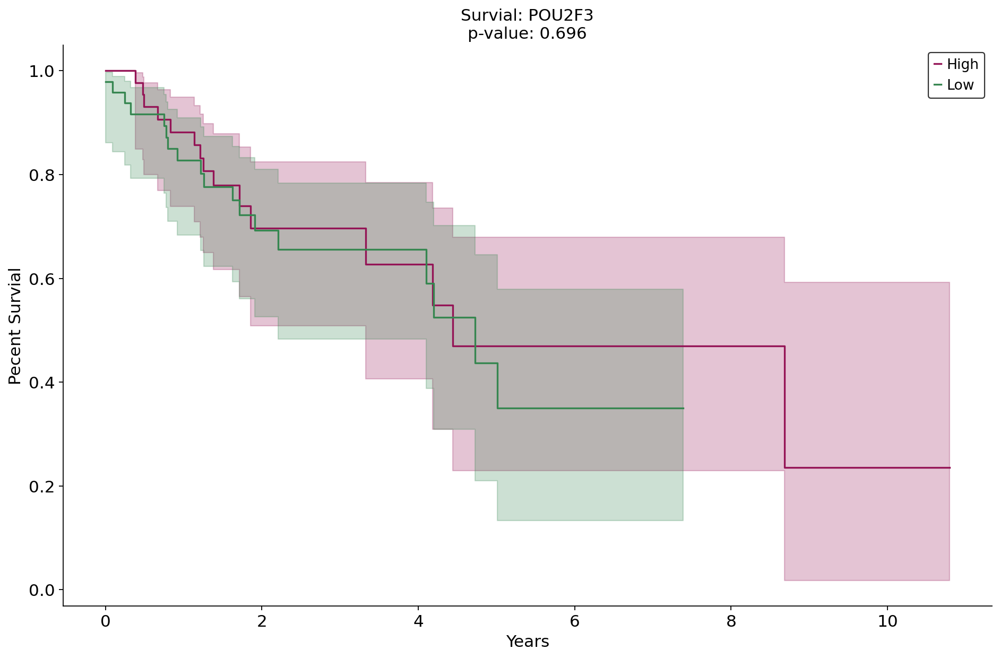

In [ ]:

# Use rc_context to temporarily set the figure size
with plt.rc_context({'figure.figsize': (12, 8)}):
    plot_func = sclc_tcga.survival_analysis('POU2F3', layer='deseq_normalize', plot=True)
    
    fig = plt.gcf()  # Get the current figure
    fig.set_size_inches(12, 8)  # Set the figure size manually
    
    ax = plt.gca()  # Get the current axis
    ax.legend(loc='best')  # Customize the legend (rcParams will handle color)
    
    # Use tight_layout to adjust layout
    plt.tight_layout()

    # Save the figure, ensuring no elements are cut off
    # fig.savefig(fname='/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/your_figure_name.png', dpi=300, bbox_inches='tight', pad_inches=0.1)


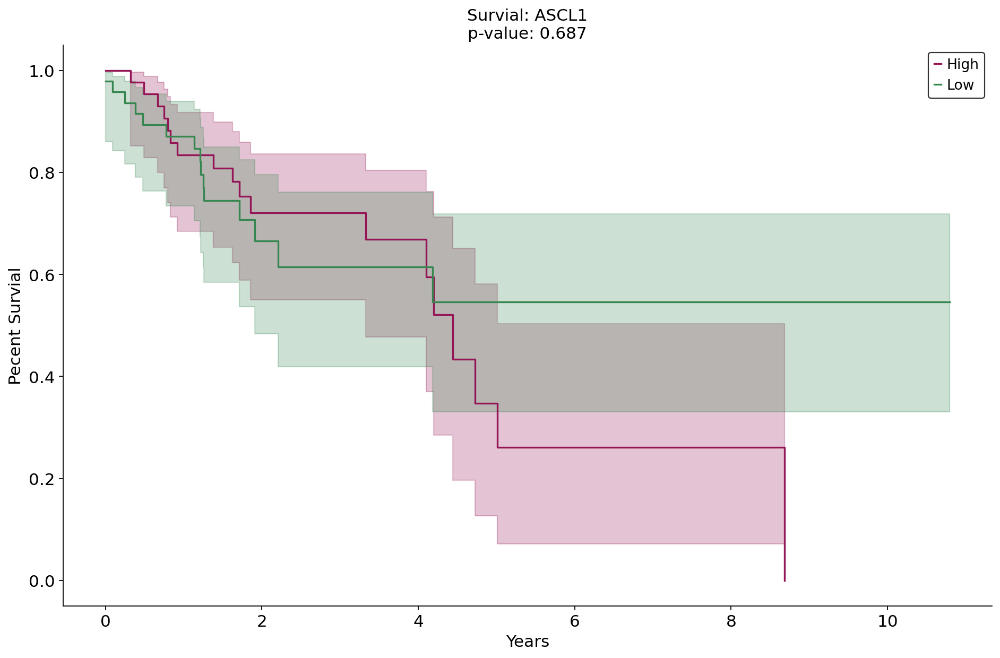

In [ ]:

# Use rc_context to temporarily set the figure size
with plt.rc_context({'figure.figsize': (12, 8)}):
    plot_func = sclc_tcga.survival_analysis('ASCL1', layer='deseq_normalize', plot=True)
    
    fig = plt.gcf()  # Get the current figure
    fig.set_size_inches(12, 8)  # Set the figure size manually
    
    ax = plt.gca()  # Get the current axis
    ax.legend(loc='best')  # Customize the legend (rcParams will handle color)
    
    # Use tight_layout to adjust layout
    plt.tight_layout()

    # Save the figure, ensuring no elements are cut off
    # fig.savefig('/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/your_figure_name.png', dpi=300, bbox_inches='tight', pad_inches=0.1)


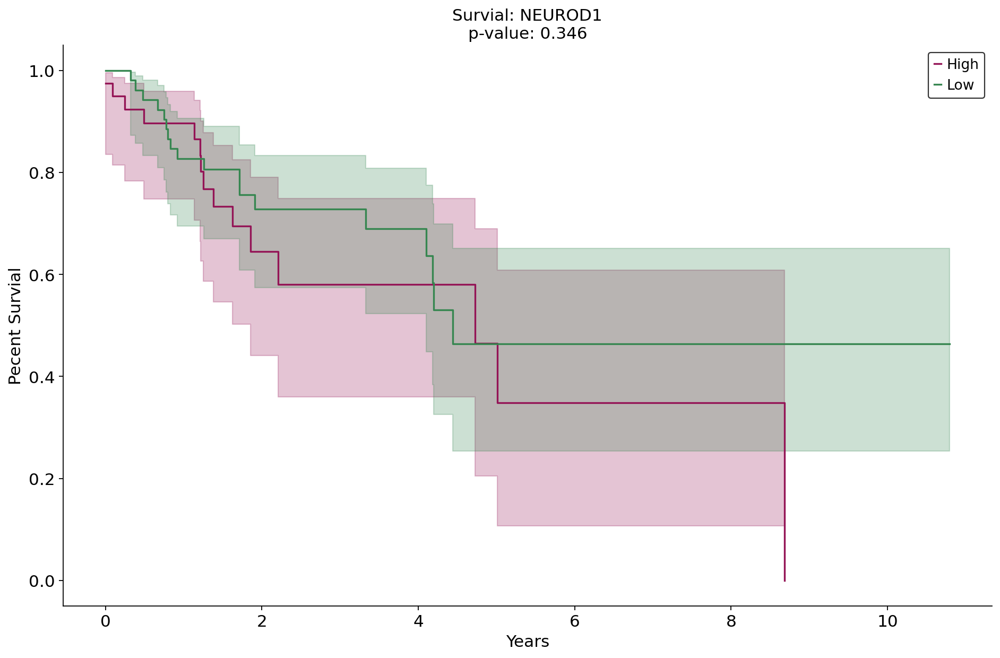

In [ ]:

# Use rc_context to temporarily set the figure size
with plt.rc_context({'figure.figsize': (12, 8)}):
    plot_func = sclc_tcga.survival_analysis('NEUROD1', layer='deseq_normalize', plot=True)
    
    fig = plt.gcf()  # Get the current figure
    fig.set_size_inches(12, 8)  # Set the figure size manually
    
    ax = plt.gca()  # Get the current axis
    ax.legend(loc='best')  # Customize the legend (rcParams will handle color)
    
    # Use tight_layout to adjust layout
    plt.tight_layout()

    # Save the figure, ensuring no elements are cut off
    fig.savefig('/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/your_figure_name.png', dpi=300, bbox_inches='tight', pad_inches=0.1)


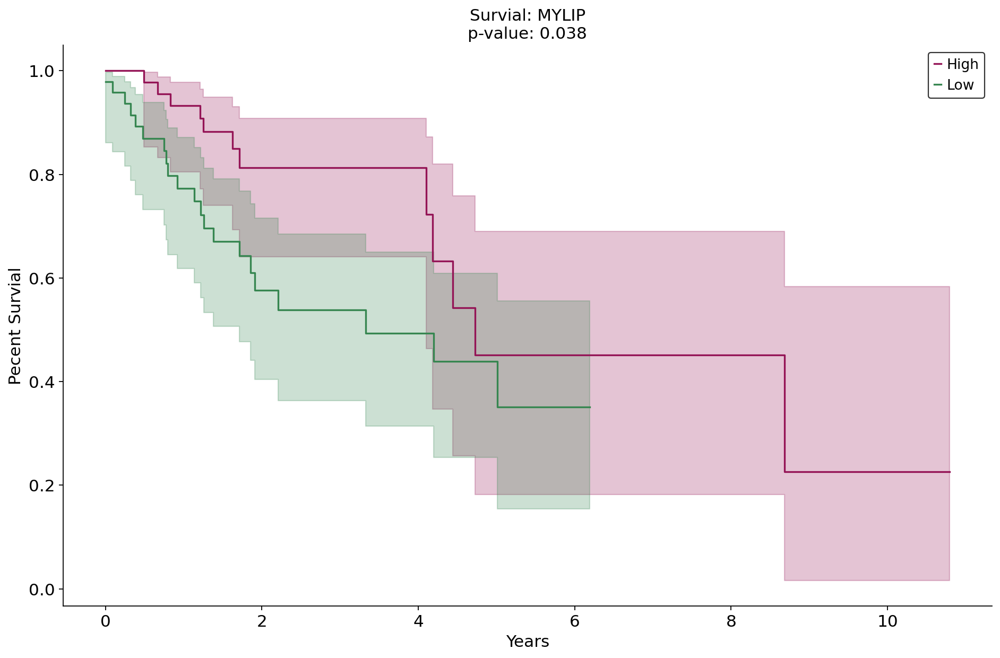

In [ ]:

# Use rc_context to temporarily set the figure size
with plt.rc_context({'figure.figsize': (12, 8)}):
    plot_func = sclc_tcga.survival_analysis('MYLIP', layer='deseq_normalize', plot=True)
    
    fig = plt.gcf()  # Get the current figure
    fig.set_size_inches(12, 8)  # Set the figure size manually
    
    ax = plt.gca()  # Get the current axis
    ax.legend(loc='best')  # Customize the legend (rcParams will handle color)
    
    # Use tight_layout to adjust layout
    plt.tight_layout()
    # https://www.ncbi.nlm.nih.gov/pmc/articles/PMC8797692/
    # Save the figure, ensuring no elements are cut off
    # fig.savefig('/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/your_figure_name.png', dpi=300, bbox_inches='tight', pad_inches=0.1)


In [ ]:
sclc_tcga.survial_analysis_all()

100%|██████████| 60664/60664 [1:09:24<00:00, 14.57it/s]


In [ ]:
sclc_tcga.adata

AnnData object with n_obs × n_vars = 95 × 60664
    obs: 'Case ID', 'Sample Type', 'vital_status', 'days'
    var: 'gene_name', 'gene_type', 'gene_id', 'survial_test_statistic', 'survial_p'
    layers: 'tpm', 'fpkm', 'deseq_normalize'

In [ ]:
sclc_tcga.adata.var.loc[:,["gene_name","survial_p"]].sort_values(by="survial_p", ascending=True)[400:450]

,gene_name,survial_p
TMPRSS11F,TMPRSS11F,0.002523
AC108704.2,AC108704.2,0.002535
AC104640.2,AC104640.2,0.002559
AC005066.1,AC005066.1,0.002559
AC112492.1,AC112492.1,0.002559
RN7SL691P,RN7SL691P,0.002559
DEFB125,DEFB125,0.002559
OR7E156P,OR7E156P,0.002559
AC114501.3,AC114501.3,0.002559
AC091912.2,AC091912.2,0.002559


In [ ]:
sclc_tcga.adata.write_h5ad('/mnt/archive2/RO_src/data/ov_tcga_survial_all.h5ad')

# Bulk 2 Single

In [ ]:
# import pandas as pd
# import seaborn as sns
# import matplotlib.pyplot as plt
# from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
# from sklearn.preprocessing import StandardScaler

# # Step 1: Load the data
# # Replace `data.csv` with your actual file path or data loading method

# # Step 2: Preprocess the data (normalize and transpose)
# # Normalize the data
# scaler = StandardScaler()
# scaled_data = scaler.fit_transform(count_matrix.T)

# # Step 3: Perform hierarchical clustering
# linked = linkage(scaled_data, method='ward')

# # Step 4: Plot the dendrogram
# plt.figure(figsize=(10, 7))
# dendrogram(linked, labels=count_matrix.columns, orientation='top', distance_sort='descending', show_leaf_counts=True)
# plt.show()

# # Step 5: Optionally, create a heatmap for better visualization
# sns.clustermap(data=count_matrix.T, method='ward', cmap='vlag', standard_scale=1, figsize=(10, 10))
# plt.show()

# # Step 6: (Optional) Cut the dendrogram to find clusters
# # This step assumes you have some knowledge of the number of clusters
# clusters = fcluster(linked, t=2, criterion='maxclust')

# # Map the clusters to lung/lymph node (requires prior knowledge or additional metadata)
# df['Cluster'] = clusters

In [ ]:
sc_adata = sc.read_h5ad(r"/mnt/work/RO_src/data/raw/scRNA/SCLC/SCLC_Annotated_pp.h5ad") #on archive2

## Bulk 2 Single by sample

In [ ]:
model=ov.bulk2single.Bulk2Single(bulk_data=count_matrix,single_data=sc_adata,
                celltype_key='cell_type_fine',
                 top_marker_num=200,ratio_num=1,gpu=0, max_single_cells=5000)

......random select 5000 single cells


Reading single-cell dataset, this may take 1 min
Reading dataset is done
Normalizing raw single cell data with scanpy.pp.normalize_total
Generating cell fractions using Dirichlet distribution without prior info (actually random)
RANDOM cell fractions is generated
You set sparse as True, some cell's fraction will be zero, the probability is 0.5
Sampling cells to compose pseudo-bulk data


5000it [00:28, 174.04it/s]


Sampling is done
Reading training data
Reading is done
Reading test data
Reading test data is done
Using counts data to train model
Cutting variance...
Finding intersected genes...
Intersected gene number is  14992
Scaling...


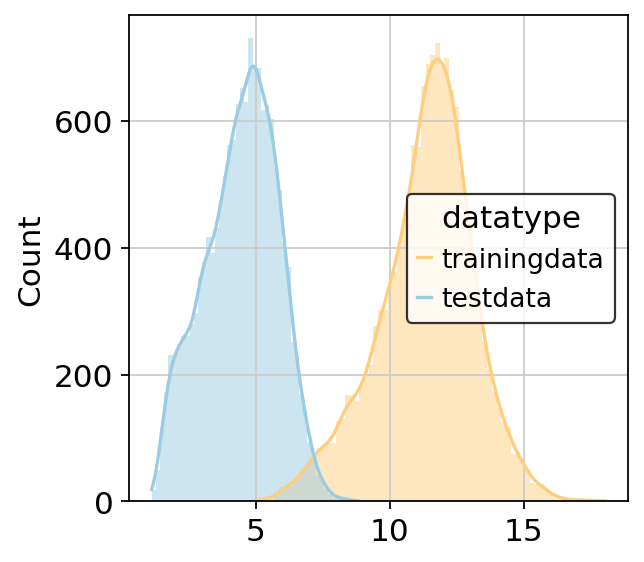

Using minmax scaler...


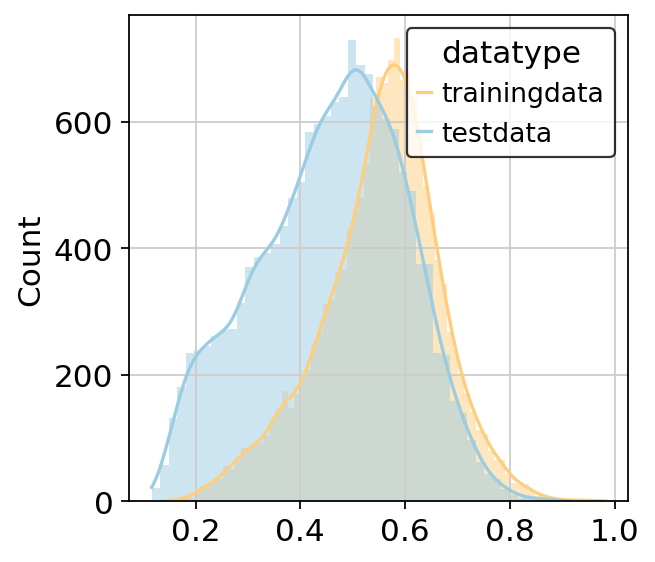

training data shape is  (5000, 14992) 
test data shape is  (75, 14992)
train model256 now


100%|██████████| 128/128 [02:02<00:00,  1.05it/s]


train model512 now


100%|██████████| 128/128 [03:31<00:00,  1.65s/it]


train model1024 now


100%|██████████| 128/128 [05:27<00:00,  2.56s/it]


Training of Scaden is done
Predicted Total Cell Num: 715.6592136950803


In [ ]:
CellFractionPrediction=model.predicted_fraction()

In [ ]:
CellFractionPrediction.head()

,AE1,AEP,B cell,Basal,Ciliated,Club,DC,Endothelial,Fibroblast,Ionocyte,...,Mast,Mucinous,NSCLC,Neuroendocrine,Neutrophil,Plasma cell,SCLC-A,SCLC-N,SCLC-P,T cell
R2_07_Lymph Node,0.040049,0.037934,0.049370,0.045328,0.036413,0.037500,0.043665,0.036117,0.034068,0.040476,...,0.042025,0.041954,0.040748,0.044376,0.046227,0.045610,0.062465,0.064690,0.041509,0.126804
R2_22_Lung,0.049190,0.049379,0.045599,0.048501,0.046068,0.043992,0.044490,0.045296,0.062368,0.046576,...,0.047676,0.050754,0.047896,0.047088,0.048837,0.046714,0.042655,0.059201,0.047599,0.044389
R1_74_Lung,0.048401,0.048481,0.044944,0.048918,0.045499,0.044103,0.046735,0.045748,0.052541,0.047853,...,0.047527,0.050106,0.047198,0.047502,0.049700,0.047751,0.039590,0.067286,0.048092,0.042996
R1_19_Lung,0.049396,0.047441,0.048472,0.049108,0.045177,0.044565,0.053362,0.049935,0.052899,0.048447,...,0.050694,0.051386,0.046414,0.046766,0.049563,0.047439,0.033632,0.042839,0.049300,0.053664
R2_29_Lung,0.047089,0.050342,0.042798,0.046506,0.045511,0.044140,0.041091,0.044709,0.066492,0.046328,...,0.047226,0.050445,0.046366,0.047344,0.049077,0.046095,0.043278,0.078149,0.047546,0.035961


In [ ]:
lung_columns = [col for col in count_matrix.columns if col.endswith('_Lung')]
lymph_node_columns = [col for col in count_matrix.columns if col.endswith('_Lymph Node')]
sorted_columns = lung_columns + lymph_node_columns

In [ ]:
CellFractionPrediction_sorted = CellFractionPrediction.T[sorted_columns].T


In [ ]:
CellFractionPrediction_sorted

,AE1,AEP,B cell,Basal,Ciliated,Club,DC,Endothelial,Fibroblast,Ionocyte,...,Mast,Mucinous,NSCLC,Neuroendocrine,Neutrophil,Plasma cell,SCLC-A,SCLC-N,SCLC-P,T cell
R2_22_Lung,0.049190,0.049379,0.045599,0.048501,0.046068,0.043992,0.044490,0.045296,0.062368,0.046576,...,0.047676,0.050754,0.047896,0.047088,0.048837,0.046714,0.042655,0.059201,0.047599,0.044389
R1_74_Lung,0.048401,0.048481,0.044944,0.048918,0.045499,0.044103,0.046735,0.045748,0.052541,0.047853,...,0.047527,0.050106,0.047198,0.047502,0.049700,0.047751,0.039590,0.067286,0.048092,0.042996
R1_19_Lung,0.049396,0.047441,0.048472,0.049108,0.045177,0.044565,0.053362,0.049935,0.052899,0.048447,...,0.050694,0.051386,0.046414,0.046766,0.049563,0.047439,0.033632,0.042839,0.049300,0.053664
R2_29_Lung,0.047089,0.050342,0.042798,0.046506,0.045511,0.044140,0.041091,0.044709,0.066492,0.046328,...,0.047226,0.050445,0.046366,0.047344,0.049077,0.046095,0.043278,0.078149,0.047546,0.035961
R2_60_Lung,0.048541,0.044407,0.047599,0.047537,0.041666,0.042313,0.045549,0.041597,0.049096,0.043514,...,0.047439,0.048505,0.046653,0.047909,0.046632,0.047382,0.037764,0.047217,0.045336,0.098311
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
R2_28_Lymph Node,0.043253,0.042155,0.048463,0.047671,0.039676,0.040228,0.046596,0.039714,0.035840,0.043546,...,0.045237,0.045150,0.043926,0.047204,0.048275,0.046500,0.062586,0.075235,0.045084,0.062821
R2_66_Lymph Node,0.039710,0.038913,0.050775,0.045104,0.037253,0.037529,0.043651,0.036756,0.033834,0.041193,...,0.042532,0.042660,0.041161,0.046224,0.046124,0.045934,0.091446,0.062859,0.042623,0.088153
R2_26_Lymph Node,0.040181,0.039833,0.049139,0.046237,0.036719,0.037568,0.044311,0.036837,0.033844,0.041174,...,0.043457,0.042567,0.041761,0.045312,0.046453,0.044337,0.073026,0.095667,0.042906,0.069315
R2_02_Lymph Node,0.035138,0.033476,0.040013,0.037904,0.032996,0.034173,0.041269,0.033323,0.032631,0.033808,...,0.035200,0.036459,0.033264,0.038393,0.040548,0.039478,0.032951,0.032173,0.037033,0.286331


In [ ]:
import pandas as pd
import numpy as np
import scipy.stats as stats

from statsmodels.stats.proportion import proportions_ztest


# 1. Separate samples into Lung and Lymph Node groups
lung_samples = CellFractionPrediction_sorted.filter(regex='_Lung$', axis=0)
lymph_node_samples = CellFractionPrediction_sorted.filter(regex='_Lymph Node$', axis=0)

# 2. Calculate the mean and variance for each group
lung_mean = lung_samples.mean()
lymph_node_mean = lymph_node_samples.mean()

lung_var = lung_samples.var()
lymph_node_var = lymph_node_samples.var()

print("Mean per cell type for Lung samples:")
print(lung_mean)

print("\nVariance per cell type for Lung samples:")
print(lung_var)

print("\nMean per cell type for Lymph Node samples:")
print(lymph_node_mean)

print("\nVariance per cell type for Lymph Node samples:")
print(lymph_node_var)

# 3. Perform proportion tests for each cell type between Lung and Lymph Node groups
results = {}
for cell_type in lung_samples.columns:
    count_lung = lung_samples[cell_type].sum()
    count_lymph = lymph_node_samples[cell_type].sum()
    
    nobs_lung = len(lung_samples)
    nobs_lymph = len(lymph_node_samples)
    
    # Perform the proportion test using statsmodels
    stat, pval = proportions_ztest([count_lung, count_lymph], [nobs_lung, nobs_lymph])
    results[cell_type] = {'Z-statistic': stat, 'p-value': pval}


# Display results
print("\nProportion test results between Lung and Lymph Node samples:")
for cell_type, result in results.items():
    print(f"{cell_type}: Z-statistic = {result['Z-statistic']:.4f}, p-value = {result['p-value']:.4e}")


Mean per cell type for Lung samples:
AE1               0.049296
AEP               0.048605
B cell            0.045556
Basal             0.047310
Ciliated          0.047927
Club              0.044118
DC                0.045223
Endothelial       0.045276
Fibroblast        0.065804
Ionocyte          0.047806
Macrophage        0.036244
Mast              0.049029
Mucinous          0.050370
NSCLC             0.046883
Neuroendocrine    0.046978
Neutrophil        0.047815
Plasma cell       0.045658
SCLC-A            0.042218
SCLC-N            0.052265
SCLC-P            0.047610
T cell            0.048008
dtype: float32

Variance per cell type for Lung samples:
AE1               5.030932e-06
AEP               5.392678e-06
B cell            2.609661e-06
Basal             1.580829e-06
Ciliated          2.368357e-05
Club              2.867703e-06
DC                5.356744e-06
Endothelial       6.889661e-06
Fibroblast        2.537472e-04
Ionocyte          7.578739e-06
Macrophage        1.067606e-0

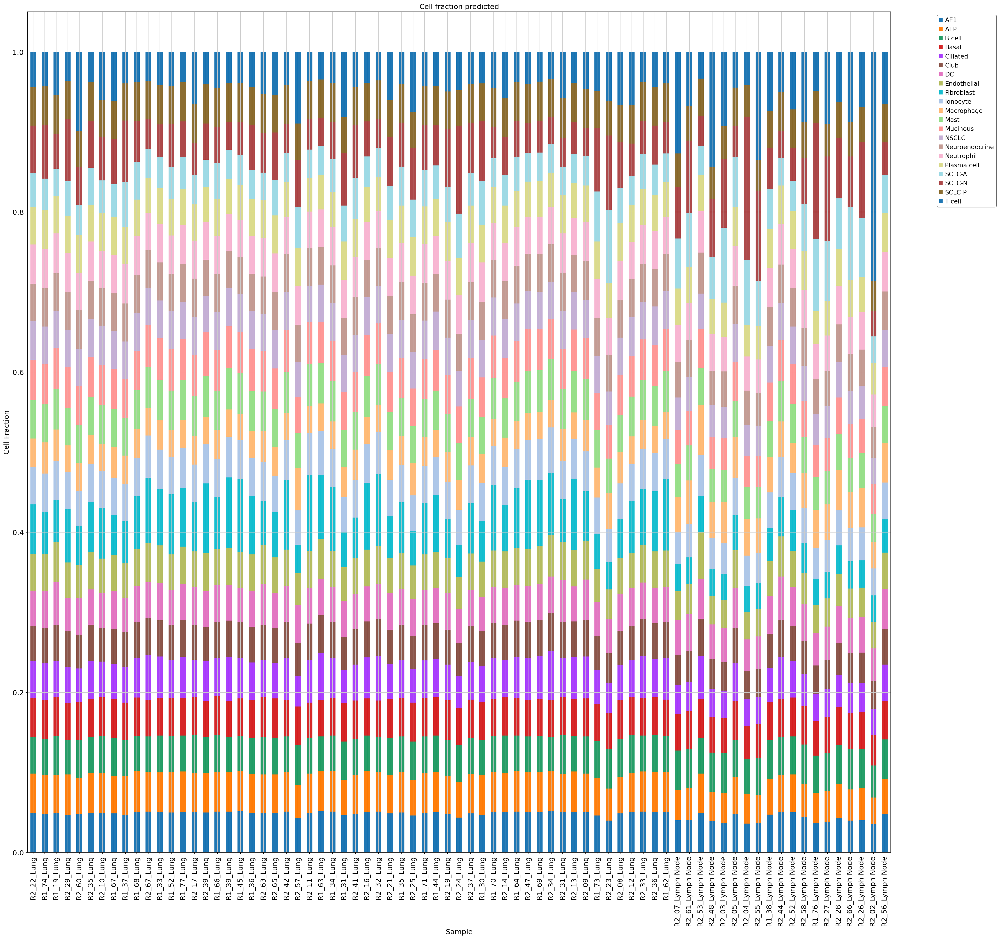

In [ ]:
ax = CellFractionPrediction_sorted.plot(kind='bar', stacked=True, figsize=(30, 30))
ax.set_xlabel('Sample')
ax.set_ylabel('Cell Fraction')
ax.set_title('Cell fraction predicted')
plt.legend(bbox_to_anchor=(1.05, 1),ncol=1,)
plt.show()

# TODO: check between lymph node vs lung
# TODO: mean and var per cell type for each sample and then do a prop test

## Bulk2single training - cell number for each sample


In [ ]:
# model.bulk_preprocess_lazy()
# model.single_preprocess_lazy()
# model.prepare_input()

......drop duplicates index in bulk data
......deseq2 normalize the bulk data
......log10 the bulk data
......calculate the mean of each group
......normalize the single data
normalizing counts per cell
    finished (0:00:00)
......log1p the single data
......prepare the input of bulk2single
...loading data


### Training the VAE model 

In [ ]:
# vae_net=model.train(
#     batch_size=512,
#     learning_rate=1e-4,
#     hidden_size=256,
#     epoch_num=25,
#     vae_save_dir='/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/data/bulk2single/save_model',
#     vae_save_name='dg_vae',
#     generate_save_dir='/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/data/bulk2single/output',
#     generate_save_name='dg')

In [ ]:
model.load_fraction('/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/data/bulk2single/save_model/dg_vae_cell_target_num.pkl')



In [ ]:
model.bulk_preprocess_lazy()
model.single_preprocess_lazy()
model.prepare_input()

......drop duplicates index in bulk data
......deseq2 normalize the bulk data
......log10 the bulk data
......calculate the mean of each group
......normalize the single data
normalizing counts per cell
    finished (0:00:00)
......log1p the single data
......prepare the input of bulk2single
...loading data


In [ ]:
vae_net=model.load(vae_load_dir='/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/data/bulk2single/save_model/dg_vae.pth')


loading model from /mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/data/bulk2single/save_model/dg_vae.pth


(<Figure size 320x320 with 1 Axes>,
 <AxesSubplot: title={'center': 'Beta-VAE'}, xlabel='Epochs', ylabel='Loss'>)

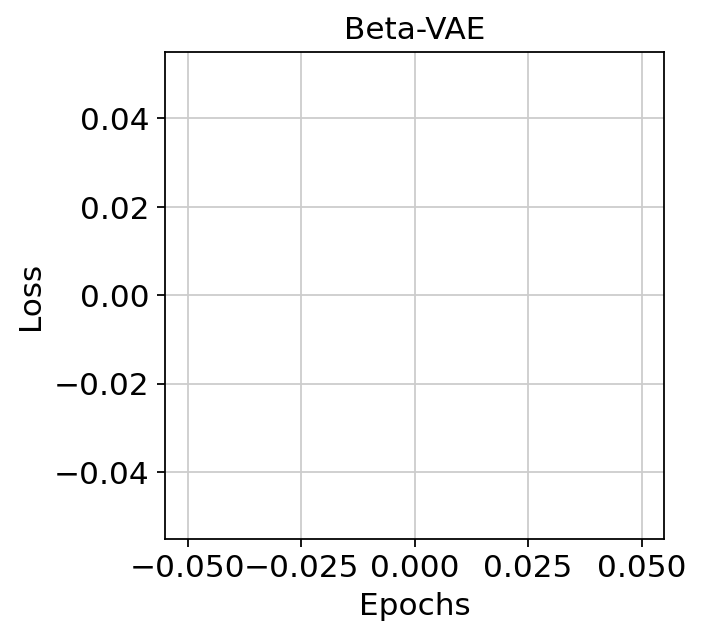

In [ ]:
model.plot_loss()

In [ ]:
generate_adata=model.generate()
generate_adata

...generating


generating:   0%|          | 0/1417 [00:00<?, ?it/s]

generating: 100%|██████████| 1417/1417 [00:01<00:00, 928.19it/s] 

generated done!


AnnData object with n_obs × n_vars = 1417 × 15138
    obs: 'cell_type_fine'

In [ ]:
generate_adata=model.filtered(generate_adata,leiden_size=5)
generate_adata

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.`
    with n_comps=100
    finished (0:00:01)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:20)
running Leiden clustering
    finished: found 32 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)
The filter leiden is  ['24', '25', '26', '27', '28', '29', '30', '31']


View of AnnData object with n_obs × n_vars = 1296 × 2739
    obs: 'cell_type_fine', 'leiden'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'pca', 'neighbors', 'leiden'
    obsm: 'X_pca'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [ ]:
generate_adata.write_h5ad(r"/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/deconvolution_bulk2single.h5ad")

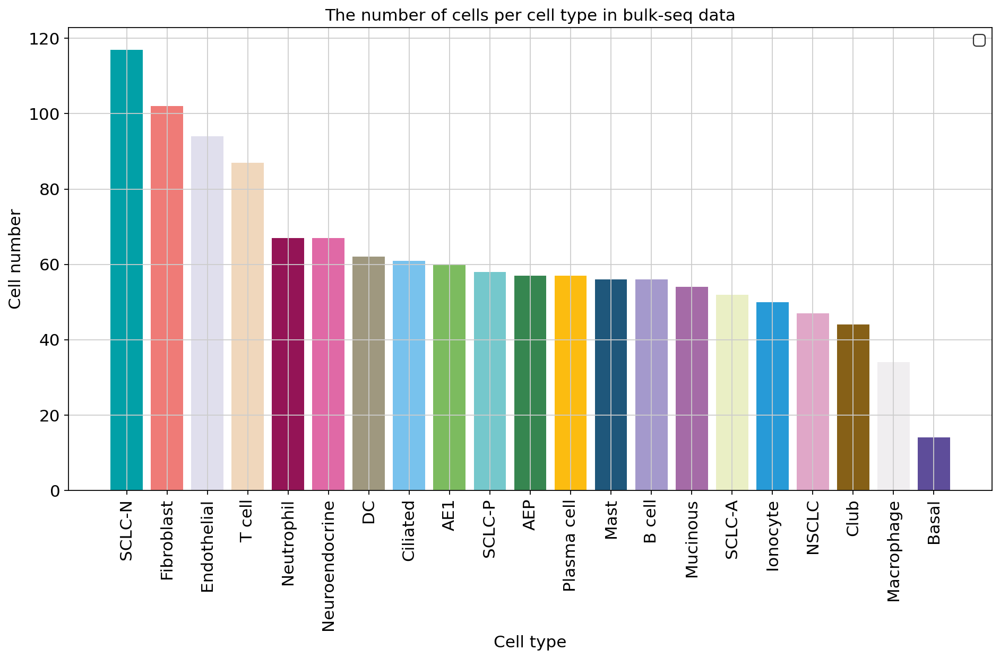

In [ ]:

# Use rc_context to temporarily set the figure size
with plt.rc_context({'figure.figsize': (12, 8)}):
    plot_func = ov.bulk2single.bulk2single_plot_cellprop(generate_adata,celltype_key='cell_type_fine')

    
    fig = plt.gcf()  # Get the current figure
    fig.set_size_inches(12, 8)  # Set the figure size manually
    
    ax = plt.gca()  # Get the current axis
    ax.legend(loc='best')  # Customize the legend (rcParams will handle color)
    
    # Use tight_layout to adjust layout
    plt.tight_layout()

    # Save the figure, ensuring no elements are cut off
    # fig.savefig('/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/your_figure_name.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

# TODO: compare lung vs lymph node to see if estimates match up with the original sclc

In [ ]:
sc_adata.obs["cell_type_fine"].value_counts()

SCLC-A            23782
T cell            12757
SCLC-N             6165
Macrophage         3424
DC                 1372
B cell              347
Fibroblast          314
Endothelial         250
AE1                 249
Mast                219
AEP                 185
Ciliated            165
Ionocyte             81
NSCLC                69
Mucinous             60
Basal                55
SCLC-P               42
Club                 41
Neutrophil           39
Neuroendocrine       14
Plasma cell          14
Name: cell_type_fine, dtype: int64

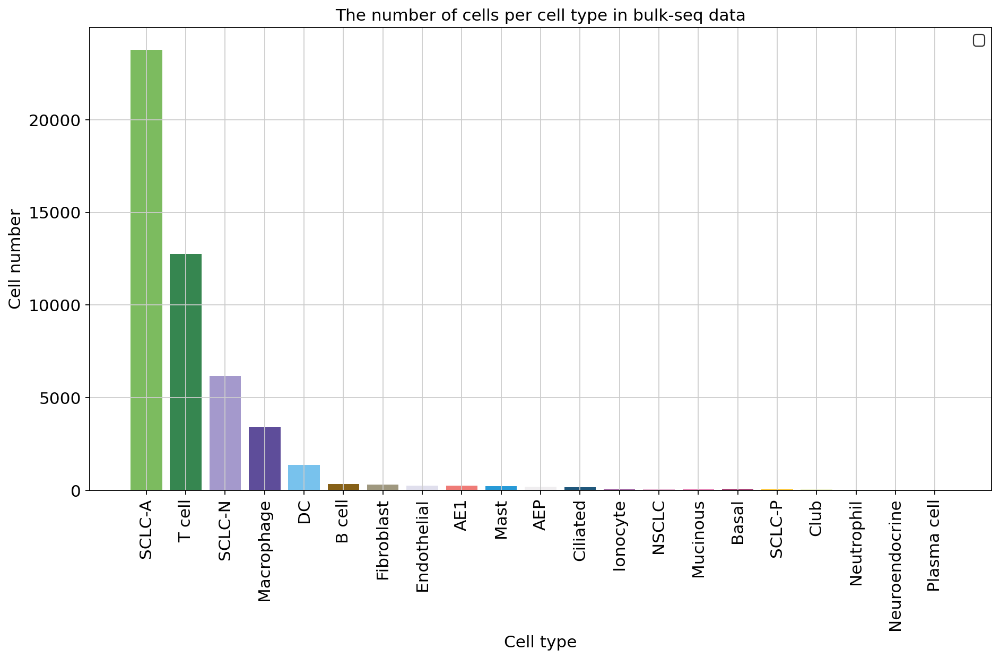

In [ ]:

# Use rc_context to temporarily set the figure size
with plt.rc_context({'figure.figsize': (12, 8)}):
    plot_func = ov.bulk2single.bulk2single_plot_cellprop(sc_adata,celltype_key='cell_type_fine')


    fig = plt.gcf()  # Get the current figure
    fig.set_size_inches(12, 8)  # Set the figure size manually
    
    ax = plt.gca()  # Get the current axis
    ax.legend(loc='best')  # Customize the legend (rcParams will handle color)
    
    # Use tight_layout to adjust layout
    plt.tight_layout()

    # Save the figure, ensuring no elements are cut off
    # fig.savefig('/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/your_figure_name.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

In [ ]:
sc_adata.X = sc_adata.layers["lognorm_counts"].copy()
sc_adata.raw = sc_adata

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:03:02)


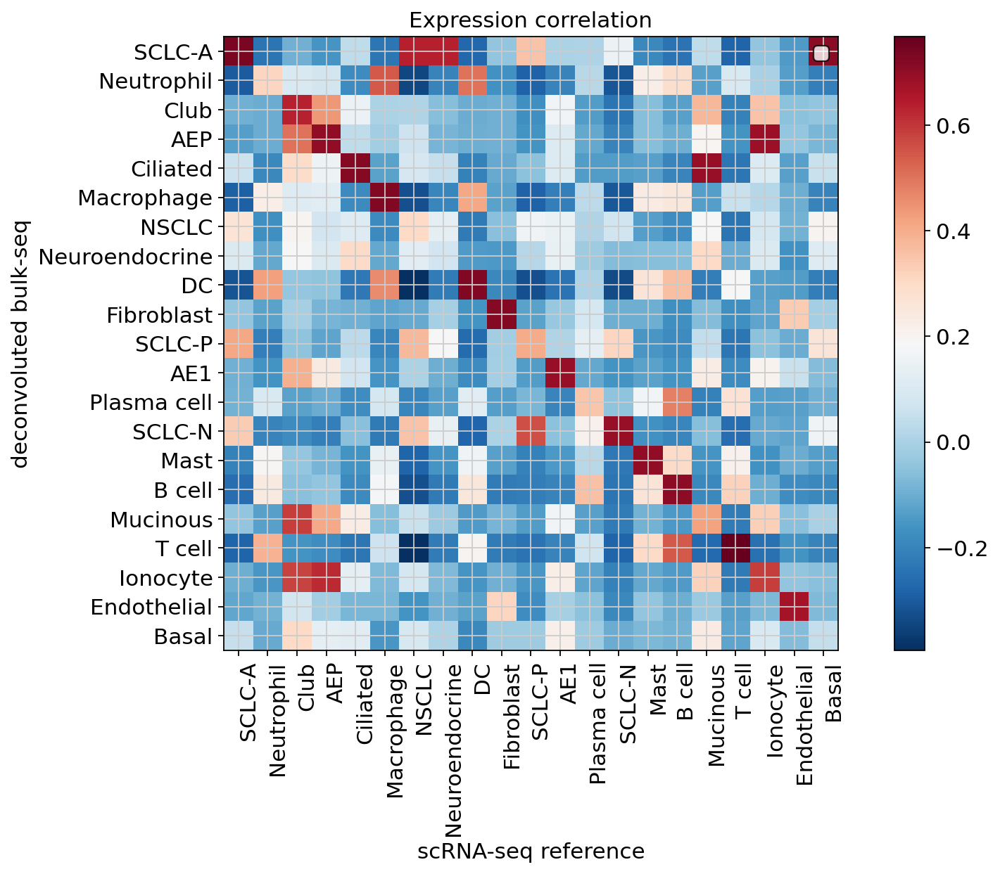

In [ ]:

# Use rc_context to temporarily set the figure size
with plt.rc_context({'figure.figsize': (12, 8)}):

    plot_func = ov.bulk2single.bulk2single_plot_correlation(sc_adata,generate_adata,celltype_key='cell_type_fine')

    fig = plt.gcf()  # Get the current figure
    fig.set_size_inches(12, 8)  # Set the figure size manually
    
    ax = plt.gca()  # Get the current axis
    ax.legend(loc='best')  # Customize the legend (rcParams will handle color)
    
    # Use tight_layout to adjust layout
    plt.tight_layout()

    # Save the figure, ensuring no elements are cut off
    # fig.savefig('/mnt/work/RO_src/STAnalysis/notebooks/downstream/Bulk RNA/your_figure_name.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

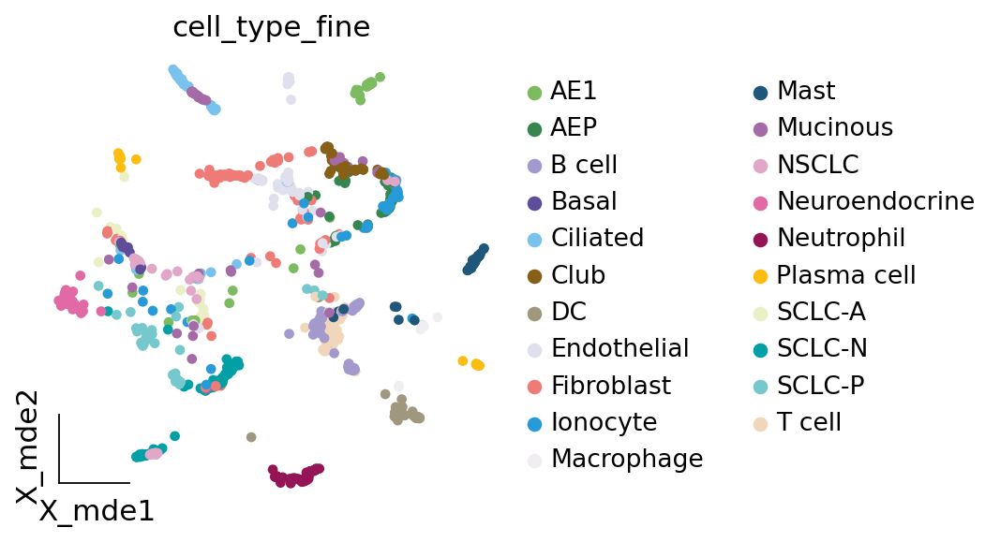

In [ ]:
generate_adata.obsm["X_mde"] = ov.utils.mde(generate_adata.obsm["X_pca"])
ov.utils.embedding(generate_adata,basis='X_mde',color=['cell_type_fine'],wspace=0.4,
          palette=ov.utils.pyomic_palette(),frameon='small')


# Unsupervised RF Algorithm

In [6]:
data_adata = pd.read_csv("~/work/workbench/rafaed/work/RO_src/Projects/THORA/DataProcessing/data/adata_sample_counts_and_clinical.csv")


In [7]:

# Read the Excel file with headers as columns
normalized_data_adata = pd.read_excel("/mnt/work/RO_src/Projects/THORA/DataProcessing/data/count_matrix_rpm.xlsx", header=0)

# Transpose the DataFrame
normalized_data_adata_T = normalized_data_adata.T

# Set the first row as the column names
normalized_data_adata_T.columns = normalized_data_adata_T.iloc[0]

# Drop the first row
normalized_data_adata_T = normalized_data_adata_T.drop(normalized_data_adata_T.index[0]).reset_index(drop=True)

normalized_data_adata_T.index.name = None

In [28]:

clinical_data = data_adata.iloc[:,:95].copy()
expr_data = data_adata.iloc[:,95:].copy()

In [29]:
expr_data.index.name = None

In [30]:

clinical_data.rename(columns={"Unnamed: 0":"Sample_ID"},inplace=True)
clinical_data = clinical_data[["Sample_ID","Organ","Arm","tnm_staging","RSI","age","brain_metastasis","os_corr","ttp_corr","performance_status_2023","stad_bin","ps_bin","progression_status","status_ttp","status_os"]]

In [10]:

expr_data = expr_data[["ASCL1","NEUROD1","POU2F3","YAP1","BCL2","MYC","KRAS","TTF1","SLFN11","TP53","RB1"]]

In [11]:
clinical_data

,Sample_ID,Organ,Arm,tnm_staging,RSI,age,brain_metastasis,os_corr,ttp_corr
0,R1_79,Lymph Node,45 Gy/30 fraksjoner,IIIB,-0.118385,68.0,0.0,5.277267,4.032852
1,R2_07,Lymph Node,60 Gy/40 fraksjoner,IIIA,-0.051521,72.0,0.0,17.689882,10.262812
2,R2_22,Lung,60 Gy/40 fraksjoner,IIIB,-0.048989,71.0,0.0,96.427070,60.525624
3,R1_74,Lung,NaN,NaN,-0.148622,NaN,NaN,NaN,NaN
4,R1_19,Lung,60 Gy/40 fraksjoner,IIIA,0.077778,71.0,0.0,18.657030,17.427070
...,...,...,...,...,...,...,...,...,...
85,R2_56,Lymph Node,45 Gy/30 fraksjoner,IIIB,0.078759,77.0,0.0,33.229961,18.262812
86,R2_12,Lung,45 Gy/30 fraksjoner,IIIA,0.123612,66.0,0.0,73.408673,41.000000
87,R2_33,Lung,60 Gy/40 fraksjoner,IIIA,-0.146623,61.0,0.0,33.886991,14.229961
88,R2_36,Lung,60 Gy/40 fraksjoner,IIIB,-0.145140,64.0,1.0,36.770039,29.901445


In [12]:


def get_feature_names(column_transformer):
    """Get feature names from all transformers."""
    output_features = []

    for name, pipe, features in column_transformer.transformers_:
        if name != 'remainder':
            if hasattr(pipe, 'get_feature_names_out'):
                if isinstance(features, slice):
                    feature_names = pipe.get_feature_names_out()
                else:
                    feature_names = pipe.get_feature_names_out(features)
            elif hasattr(pipe, 'get_feature_names'):
                feature_names = pipe.get_feature_names()
            else:
                feature_names = features
            output_features.extend(feature_names)
    return output_features

## Random Forest Unsupervised with KMeans

In [ ]:


def unsupervised_sclc_classification(clinical_data, expression_data, class_names):
    """
    Perform unsupervised classification of SCLC subtypes using clinical and expression data.
    
    Parameters:
    clinical_data (pd.DataFrame): DataFrame containing clinical variables.
    expression_data (pd.DataFrame): DataFrame containing gene expression data.
    class_names (list): List of SCLC subtypes.
    
    Returns:
    dict: Dictionary containing the model, predictions, and other relevant information.
    """
    # Combine clinical and expression data
    combined_data = pd.concat([clinical_data, expression_data], axis=1)
    
    exclude_cols = ["os_corr","ttp_corr", "Cluster", "KRAS","MYC","BCL2"]
    combined_data = combined_data[[col for col in combined_data.columns if col not in exclude_cols]]

    # Store Sample_ID separately and remove it from combined_data
    sample_ids = combined_data['Sample_ID'].copy()
    combined_data_for_model = combined_data.drop('Sample_ID', axis=1)
    
    # Remove rows with NaN values
    original_row_count = combined_data_for_model.shape[0]
    combined_data_for_model = combined_data_for_model.dropna()
    removed_row_count = original_row_count - combined_data_for_model.shape[0]
    
    print(f"Rows removed due to NaN values: {removed_row_count}")
    
    # Update expression_data, sample_ids, and combined_data to match combined_data_for_model
    expression_data = expression_data.loc[combined_data_for_model.index]
    sample_ids = sample_ids.loc[combined_data_for_model.index]
    combined_data = combined_data.loc[combined_data_for_model.index]
    
    # Convert object-type columns to category
    for col in combined_data_for_model.select_dtypes(include=['object']):
        combined_data_for_model[col] = combined_data_for_model[col].astype('category')
    
    # Identify numeric and categorical columns
    numeric_columns = combined_data_for_model.select_dtypes(include=['int64', 'float64']).columns
    categorical_columns = combined_data_for_model.select_dtypes(include=['category']).columns
    
    # Create preprocessing steps
    preprocessor = ColumnTransformer(
        transformers=[
            ("num", "passthrough", numeric_columns),
            ("cat", OneHotEncoder(handle_unknown="ignore"), categorical_columns),
        ]
    )
    
    # Preprocess the data
    combined_data_preprocessed = preprocessor.fit_transform(combined_data_for_model)
    
    # Initialize KMeans centroids based on the expression levels of key genes
    initial_centroids = np.zeros((len(class_names), combined_data_preprocessed.shape[1]))
    
    for i, gene in enumerate(class_names):
        gene_index = combined_data_for_model.columns.get_loc(gene)
        initial_centroids[i, gene_index] = combined_data_for_model[gene].median()
    
    # Create a pipeline with preprocessing and KMeans
    kmeans_pipeline = Pipeline([
        ('preprocessor', preprocessor),
        ('kmeans', KMeans(n_clusters=len(class_names), init=initial_centroids, n_init=1, random_state=42))
    ])
    
    # Fit KMeans and get cluster labels
    cluster_labels = kmeans_pipeline.fit_predict(combined_data_for_model)
    
    # Extract final centroids
    final_centroids = kmeans_pipeline.named_steps['kmeans'].cluster_centers_
    
    # Create a pipeline with preprocessing and RandomForest
    rf_pipeline = Pipeline([
        ('preprocessor', preprocessor),
        ('rf', RandomForestClassifier(n_estimators=100, random_state=42))
    ])
    
    # Fit RandomForest
    rf_pipeline.fit(combined_data_for_model, cluster_labels)
    
    # Get feature names after preprocessing
    feature_names = get_feature_names(rf_pipeline.named_steps['preprocessor'])
    
    # Get feature importances
    feature_importance = rf_pipeline.named_steps['rf'].feature_importances_
    
    # Plot feature importance
    sorted_idx = np.argsort(feature_importance)
    pos = np.arange(sorted_idx.shape[0]) + .5
    
    plt.figure(figsize=(12, 8))
    plt.barh(pos, feature_importance[sorted_idx], align='center')
    plt.yticks(pos, np.array(feature_names)[sorted_idx])
    plt.title('Feature Importance for SCLC Subtype Classification')
    plt.tight_layout()
    plt.show()
    
    # Assign class names to clusters based on the most important features
    cluster_profiles = {}
    for i in range(len(class_names)):
        cluster_data = expression_data.iloc[cluster_labels == i]
        if len(cluster_data) > 0:
            cluster_profiles[i] = cluster_data.mean()
    
    cluster_to_class = {}
    remaining_clusters = set(range(len(class_names)))
    remaining_classes = set(class_names)
    
    for i in range(len(class_names)):
        if len(remaining_clusters) > 0 and len(remaining_classes) > 0:
            best_cluster = max(remaining_clusters, key=lambda x: cluster_profiles.get(x, pd.Series(0, index=expression_data.columns))[expression_data.columns[min(i, len(expression_data.columns)-1)]])
            class_name = remaining_classes.pop()
            cluster_to_class[best_cluster] = class_name
            remaining_clusters.remove(best_cluster)
    
    # Map cluster labels to class names, using a default class for unassigned clusters
    default_class = class_names[-1]
    predicted_classes = [cluster_to_class.get(label, default_class) for label in cluster_labels]
    
    # Add cluster labels and predicted classes to combined_data
    combined_data['Cluster'] = cluster_labels
    combined_data['Predicted_Class'] = predicted_classes
    
    # Plot decision trees for the first 3 predictions
    for i in range(min(3, len(rf_pipeline.named_steps['rf'].estimators_))):
        plt.figure(figsize=(20, 10))
        plot_tree(rf_pipeline.named_steps['rf'].estimators_[i], 
                  feature_names=feature_names, 
                  class_names=class_names, 
                  filled=True, 
                  rounded=True, 
                  fontsize=10)
        plt.title(f"Decision Tree for Sample {sample_ids.iloc[i]} ({predicted_classes[i]})")
        plt.show()
    
    # Create a pair plot to visualize the clusters
    #pairplot_data = combined_data_for_model.copy()
    #pairplot_data['Cluster'] = cluster_labels
    
    #sns.pairplot(pairplot_data, hue='Cluster', palette='viridis', diag_kind='kde', plot_kws={'alpha':0.6})
    #plt.suptitle('KMeans Clustering Results', y=1.02)
    #plt.show()
    
    # Plot the initial centroids for the key genes
    plt.figure(figsize=(12, 8))
    for i, gene in enumerate(class_names):
        gene_index = combined_data_for_model.columns.get_loc(gene)
        plt.scatter(gene_index, initial_centroids[i, gene_index], label=f'Initial Centroid for {gene}', edgecolors='black')
    plt.legend()
    plt.title('Initial Centroids Based on Key Gene Expression')
    plt.xlabel('Feature Index')
    plt.ylabel('Value')
    plt.show()
    

    return {
        'model': rf_pipeline,
        'predictions': predicted_classes,
        'cluster_labels': cluster_labels,
        'feature_importance': feature_importance,
        'cluster_to_class': cluster_to_class,
        'feature_names': feature_names,
        'sample_ids': sample_ids,
        'tagged_data': combined_data
    }

class_names = ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3']

result = unsupervised_sclc_classification(clinical_data, expr_data, class_names)

# Print the predictions
print("Predicted SCLC subtypes:")
print(pd.Series(result['predictions'], index=result['sample_ids']).value_counts())

# Print the first few rows of the tagged data
print("\nFirst few rows of tagged data:")
print(result['tagged_data'].head())

# Print the cluster to class mapping
print("\nCluster to Class mapping:")
print(result['cluster_to_class'])

# Bayesian EM semi-supervised learning with RF

In [31]:
expression_data = expr_data.copy()
expression_data = expression_data.astype(float)
combined_data = pd.concat([clinical_data, expression_data], axis=1)

In [32]:
combined_data.to_csv("~/work/workbench/rafaed/work/RO_src/Projects/THORA/DataProcessing/data/combined_data_log_rpm.csv")


In [13]:

sample_ids = combined_data['Sample_ID'].copy()

combined_data_for_model = combined_data.drop('Sample_ID', axis=1)

combined_data_for_model = combined_data_for_model.dropna()

numeric_columns = combined_data_for_model.select_dtypes(include=['int64', 'float64']).columns
categorical_columns = combined_data_for_model.select_dtypes(include=['object', 'category']).columns

preprocessor = ColumnTransformer(
	transformers=[
		("num", "passthrough", numeric_columns),
		("cat", OneHotEncoder(handle_unknown="ignore"), categorical_columns),
	]
)

combined_data_preprocessed = preprocessor.fit_transform(combined_data_for_model)

In [14]:
# Get feature names
feature_names = get_feature_names(preprocessor)
# Convert to DataFrame with preserved column names
combined_data_preprocessed_df = pd.DataFrame(
    combined_data_preprocessed.toarray() if isinstance(combined_data_preprocessed, scipy.sparse.csr_matrix) 
    else combined_data_preprocessed,
    columns=feature_names,
    index=combined_data_for_model.index
)

In [23]:
# Custom scoring function that ignores y_true
def combined_score_scorer(estimator, X):
    try:
        cluster_labels = estimator.predict(X)
        silhouette_avg = silhouette_score(X, cluster_labels)
        db_score = davies_bouldin_score(X, cluster_labels)
        ch_score = calinski_harabasz_score(X, cluster_labels)
        return silhouette_avg - db_score + ch_score
    except ValueError as e:
        # Handle the case where the number of labels is not valid
        if "Number of labels is 1" in str(e):
            return -np.inf  # Return a very low score
        else:
            raise e

# Step 2: Unsupervised Clustering
def create_mixture_model(model_type, n_components, covariance_type, weight_concentration_prior_type=None, weight_concentration_prior=None):
    if model_type == 'bayesian':
        return BayesianGaussianMixture(
            n_components=n_components,
            covariance_type=covariance_type,
            weight_concentration_prior_type=weight_concentration_prior_type,
            weight_concentration_prior=weight_concentration_prior,
            max_iter=500,
            random_state=42
        )
    elif model_type == 'gaussian':
        return GaussianMixture(
            n_components=n_components,
            covariance_type=covariance_type,
            init_params='k-means++',
            max_iter=500,
            random_state=42
        )
    else:
        raise ValueError("Invalid model_type. Choose 'bayesian' or 'gaussian'.")

# Step 3: Hyperparameter Optimization
param_grid = {
    'n_components': [4],
    'covariance_type': ['full', 'tied', 'diag', 'spherical'],
    "weight_concentration_prior_type": ["dirichlet_process", "dirichlet_distribution"],
    "weight_concentration_prior": [0.1, 0.5, 1.0, 1e3, 1e4, 1e5,1e6]
}  

#TODO: add more of the markers here and the clinical variables

# Stepwise variable selection
mandatory_vars = ["ASCL1", "NEUROD1", "YAP1", "POU2F3"]
optional_vars = ['RSI', 'age', 'brain_metastasis','BCL2', 'MYC', 'KRAS', 'TTF1',"SLFN11","TP53","RB1",
                #'Arm_45 Gy/30 fraksjoner',
                #'Arm_60 Gy/40 fraksjoner' ,
                'tnm_staging_IA', 'tnm_staging_IIA',
                #'tnm_staging_IIB', 'tnm_staging_IIIA', 
                'tnm_staging_IIIA'
                ]

best_score = -np.inf
best_model = None
best_vars = None

for i in tqdm(range(1, len(optional_vars) + 1), desc="Variable Selection Progress"):
    for vars_combination in tqdm(itertools.combinations(optional_vars, i), desc=f"Combination {i}", leave=False):
        current_vars = mandatory_vars + list(vars_combination)
        X = combined_data_preprocessed_df[current_vars]
        
        gmm = create_mixture_model(model_type = "gaussian",n_components=4, covariance_type='full')
        #grid_search = GridSearchCV(gmm, param_grid, cv=5, scoring=combined_scorer,verbose=0)
        gmm.fit(X)
        
        combined_score = combined_score_scorer(gmm, X)
        print("#######################################################################################")

        print(f"The combined score is {combined_score} using the variables {current_vars}")

        print("#######################################################################################")
        # if combined_score is NaN, skip
        if np.isnan(combined_score):
            print("NaN score")
            continue
  
        if combined_score > best_score:
            best_score = combined_score
            best_model = gmm
            best_vars = current_vars



Variable Selection Progress:   0%|          | 0/13 [00:00<?, ?it/s]

#######################################################################################
The combined score is 0.015745166085860234 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI']
#######################################################################################
#######################################################################################
The combined score is 0.01430188874714989 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age']
#######################################################################################
#######################################################################################
The combined score is 0.03754934921878222 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis']
#######################################################################################
#######################################################################################
The combined score is 0.11734229894250148 usin

Variable Selection Progress:   8%|▊         | 1/13 [00:00<00:03,  3.06it/s]

#######################################################################################
The combined score is 0.33670821806840184 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'TP53']
#######################################################################################
#######################################################################################
The combined score is -0.01609487876401393 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.29283461297961166 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.09631939631569439 using


Combination 2: 4it [00:00, 32.37it/s]

#######################################################################################
The combined score is 0.01573315904360406 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age']
#######################################################################################
#######################################################################################
The combined score is -0.010354618839289773 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis']
#######################################################################################
#######################################################################################
The combined score is 0.14128344229045162 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2']
#######################################################################################
#######################################################################################
The combined score is 0

#######################################################################################
The combined score is 0.3268145025805386 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS']
#######################################################################################
#######################################################################################
The combined score is 0.03277056518619926 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'TTF1']
#######################################################################################
#######################################################################################
The combined score is 0.11658722462846761 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is 0.32121165818

#######################################################################################
The combined score is -0.016094878544928148 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.2909035130726875 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.1555160776514011 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined sco

#######################################################################################
The combined score is 0.08652499894406668 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2']
#######################################################################################
#######################################################################################
The combined score is 0.06522810754009392 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC']
#######################################################################################
#######################################################################################
The combined score is 0.3352934279299469 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS']
#######################################################################################
#######################################################################################
The combined score is 0.32691258296468

#######################################################################################
The combined score is 0.32236127047425467 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 9.618121687567472e-05 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.29280209666106694 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.0

Combination 2: 23it [00:00, 41.66it/s]

#######################################################################################
The combined score is -0.026387354766993155 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2']
#######################################################################################
#######################################################################################
The combined score is -0.03276042145329144 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC']
#######################################################################################


#######################################################################################
The combined score is -0.0006605588292007439 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS']
#######################################################################################
#######################################################################################
The combined score is -0.08247343256556977 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'TTF1']
#######################################################################################
#######################################################################################
The combined score is -0.06429383291200962 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'SLFN11']
#######################################################################################
##############################################################################

#######################################################################################
The combined score is 0.009217524655330484 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.0929784130918616 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is -0.062086001545132614 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'tnm_staging_IIIA']
#######################################################################################


#######################################################################################
The combined score is 0.07243215255788443 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC']
#######################################################################################
#######################################################################################
The combined score is 0.09885583971544093 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS']
#######################################################################################
#######################################################################################
The combined score is 0.07674373024936991 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'TTF1']
#######################################################################################
#######################################################################################
The combined score is 0.1270499407

#######################################################################################
The combined score is -0.012178631227488817 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.13438697301861352 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3185540818507024 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS']
#######################################################################################


#######################################################################################
The combined score is 0.27072851147908 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'TTF1']
#######################################################################################
#######################################################################################
The combined score is 0.03187096369421243 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is 0.08319344012933273 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.2294025671408

#######################################################################################
The combined score is 0.283809747045853 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'TTF1']
#######################################################################################
#######################################################################################
The combined score is 0.05938785146938808 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is 0.31022793545357186 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'TP53']
#######################################################################################


#######################################################################################
The combined score is 0.007108633426643606 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.24919156345869622 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.33806440776149843 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined

#######################################################################################
The combined score is 0.017571447654104712 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'TTF1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.16741928486324834 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'SLFN11', 'TP53']
#######################################################################################


#######################################################################################
The combined score is 0.11234046932753185 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.29337984090642216 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.1316670208673694 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The comb

#######################################################################################
The combined score is 0.23039227758411238 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.00864430182476235 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2460120630648391 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################


Variable Selection Progress:  15%|█▌        | 2/13 [00:02<00:13,  1.21s/it]

#######################################################################################
The combined score is 0.29283449317420945 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.19366118706942423 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################


#######################################################################################
The combined score is 0.014814225269667552 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis']
#######################################################################################
#######################################################################################
The combined score is 0.14648722423535848 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2']
#######################################################################################
#######################################################################################
The combined score is 0.13620529585643656 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC']
#######################################################################################
#######################################################################################
The

Combination 3: 6it [00:00, 53.59it/s]

#######################################################################################
The combined score is 0.304427593775559 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'TP53']
#######################################################################################
#######################################################################################
The combined score is -0.01610028238794332 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.2598938743649388 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The comb

#######################################################################################
The combined score is -0.04197982254635221 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2']
#######################################################################################
#######################################################################################
The combined score is 0.12708180897852953 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC']
#######################################################################################
#######################################################################################
The combined score is 0.04445703685633248 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS']
#######################################################################################
################################################################

#######################################################################################
The combined score is 0.05716199511322388 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'TP53']
#######################################################################################
#######################################################################################
The combined score is -0.09913303890505118 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.009217524692847277 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'tnm_staging_IA']
#######################################################################################
#####################################################

#######################################################################################
The combined score is -0.08227300163996482 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1408732977612777 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC']
#######################################################################################
#######################################################################################
The combined score is 0.10321511843135145 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS']
#######################################################################################
#############################################################################

#######################################################################################
The combined score is 0.03337143136382792 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.3259213934048953 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.048483200527418384 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'tnm_staging_IIA']
#######################################################################################
################################################################################

#######################################################################################
The combined score is 0.29820207341272964 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'TTF1']
#######################################################################################
#######################################################################################
The combined score is 0.054225688359354235 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is 0.08524073839920181 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'TP53']
#######################################################################################
#######################################################################################
The combined

#######################################################################################
The combined score is 0.1784598333047345 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2838097423759912 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'TTF1']
#######################################################################################
#######################################################################################
The combined score is 0.02206225399901028 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'SLFN11']
#######################################################################################
#######################################################################################
T

#######################################################################################
The combined score is 0.27476155066909874 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.33506702632079494 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3379560086925965 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'tnm_staging_IIIA']
#######################################################################################
####################################################################

#######################################################################################
The combined score is 0.26883850133436654 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'TTF1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.13306972424376023 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'TTF1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.1253584677728215 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'TTF1', 'tnm_staging_IIIA']
#######################################################################################
####################################################################

#######################################################################################
The combined score is 0.06439267500682423 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.29845614170805385 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.13197241798912934 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
##########################################################################

#######################################################################################
The combined score is 0.3219040894440628 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3254321474693394 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.2303922749516435 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'RB1', 'tnm_staging_IIA']
#######################################################################################
########################################################################

#######################################################################################
The combined score is 0.24895012335852676 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.19366118318298617 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.13483233300708425 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2']
#######################################################################################
###########################################

#######################################################################################
The combined score is -0.019219188534300012 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is 0.036865372266010325 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'TP53']
#######################################################################################
#######################################################################################
The combined score is -0.07371237020591365 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'RB1']
#######################################################################################
###########################################################

#######################################################################################
The combined score is 0.03272309058506298 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.060779303740573824 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC']
#######################################################################################
#######################################################################################
The combined score is 0.11905133211939602 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS']
#######################################################################################
############################################################################

#######################################################################################
The combined score is 0.3185240501591539 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS']
#######################################################################################
#######################################################################################
The combined score is 0.2815981208379566 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'TTF1']
#######################################################################################
#######################################################################################
The combined score is 0.04304530324456974 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'SLFN11']
#######################################################################################


#######################################################################################
The combined score is 0.06634285349356181 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.2315502733383326 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.27364570859791576 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The com

#######################################################################################
The combined score is 0.29739166400934397 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'TTF1']
#######################################################################################
#######################################################################################
The combined score is 0.08080878187390182 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is 0.2972544958814963 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'TP53']
#######################################################################################
#######################################################################################
The combine

#######################################################################################
The combined score is 0.3291492633379824 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.11866240211952907 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'TTF1', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is 0.3059367117344936 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'TTF1', 'TP53']
#######################################################################################
#######################################################################################


#######################################################################################
The combined score is 0.13306047659216144 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'TTF1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3269124655357743 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'TTF1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1309510497843201 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'SLFN11', 'TP53']
#######################################################################################
#############################################################################

#######################################################################################
The combined score is 0.13032062276131995 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.012097877282003705 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.26416638578383655 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'TP53', 'tnm_staging_IA']
#######################################################################################
############################################################################

#######################################################################################
The combined score is 0.3259339153663075 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.23037843754366485 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.0030132262612496685 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#####################################################################

#######################################################################################
The combined score is -0.006722647430387643 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC']
#######################################################################################
#######################################################################################
The combined score is 0.09845210587421604 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS']
#######################################################################################
#######################################################################################
The combined score is 0.071162520319242 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'TTF1']
#######################################################################################
##############################################################

#######################################################################################
The combined score is -0.00823455806525361 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.004290800830211375 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.011768800200023048 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'tnm_staging_IIA']
#######################################################################################
######################################

#######################################################################################
The combined score is 0.04629540549567821 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'TTF1']
#######################################################################################
#######################################################################################
The combined score is -0.05182603683231846 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is 0.007374938584098254 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'TP53']
#######################################################################################
############################################################

#######################################################################################
The combined score is 0.18965300849850292 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.007240290513156442 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is -6.332252594216936e-05 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'TTF1']
#######################################################################################
####################################


Combination 3: 146it [00:03, 45.85it/s]

#######################################################################################
The combined score is -0.0930705387362672 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.0063445594698580245 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.03976024675957926 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'tnm_staging_IIA']
#######################################################################################
#######################################

#######################################################################################
The combined score is 0.014186877242063156 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'TTF1', 'TP53']
#######################################################################################
#######################################################################################
The combined score is -0.16184772068262546 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'TTF1', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.0226804696321248 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'TTF1', 'tnm_staging_IA']
#######################################################################################
###################################################

#######################################################################################
The combined score is -0.007447032689808489 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'SLFN11', 'TP53']
#######################################################################################
#######################################################################################
The combined score is -0.03697940640293465 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is -0.0065873593165603535 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
########################################

#######################################################################################
The combined score is 0.2272812233774637 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is -0.007610922536479342 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.16531957043467982 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'TP53', 'tnm_staging_IIA']
#######################################################################################
########################################

#######################################################################################
The combined score is -0.2237355925241159 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.19468963774371204 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.00921753477579763 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######

#######################################################################################
The combined score is 0.06842903449638071 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'TTF1']
#######################################################################################
#######################################################################################
The combined score is 0.09664347831821503 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is 0.0750556293382766 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'TP53']
#######################################################################################
#######################################################################################
The combine

#######################################################################################
The combined score is 0.13111190975149742 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is 0.11638686767251626 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.022724783604190585 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'RB1']
#######################################################################################
#######################################################################################
The com

#######################################################################################
The combined score is 0.13145451852949822 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'TTF1', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is 0.041795318595305324 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'TTF1', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.05554774634329522 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'TTF1', 'RB1']
#######################################################################################
#######################################################################################
The com

#######################################################################################
The combined score is 0.06323331023045148 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.06538770270249014 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.13181712314319044 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
##########################################################

#######################################################################################
The combined score is 0.09879589573459108 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2107863229331046 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.06277176849476199 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'RB1', 'tnm_staging_IIA']
#######################################################################################
###################################################################

#######################################################################################
The combined score is 0.05134097425208736 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is 0.08477431413076753 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.22870124768800848 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'RB1']
#######################################################################################
#######################################################################################
The combine

#######################################################################################
The combined score is 0.011662446696159977 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'TTF1', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is 0.04305755302506143 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'TTF1', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.2721144012902776 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'TTF1', 'RB1']
#######################################################################################
#######################################################################################
The combine

#######################################################################################
The combined score is 0.18425623597722177 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.05157714900547463 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2833469193325405 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'RB1', 'tnm_staging_IA']
#######################################################################################
#####################################################################

#######################################################################################
The combined score is 0.08076857984950657 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.2723832696100061 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.026753164927079565 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
#######################################################################

#######################################################################################
The combined score is 0.3055648032837575 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.24916498350655916 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.025965985163097328 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
###################################################################


Combination 3: 260it [00:04, 67.86it/s]

#######################################################################################
The combined score is 0.04201397757329494 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'TTF1', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.30406349009388306 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'TTF1', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.1307774004969333 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'TTF1', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
########################################################################

#######################################################################################
The combined score is 0.3225829764789469 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'TTF1', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.23368004950291424 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'TTF1', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2688357893686018 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'TTF1', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#####################################################################

#######################################################################################
The combined score is 0.07033320764134597 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.17863349688531516 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.20938919166933853 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'SLFN11', 'RB1', 'tnm_staging_IA']
#######################################################################################
###########################################################

#######################################################################################
The combined score is 0.12782982511888677 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3410099191577906 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.23393256757355765 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
######################################################

Variable Selection Progress:  23%|██▎       | 3/13 [00:07<00:30,  3.06s/it]

#######################################################################################
The combined score is 0.3254320750057285 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2613055118906734 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2762490237592176 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################


#######################################################################################
The combined score is 0.11598180387029865 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2']
#######################################################################################
#######################################################################################
The combined score is 0.05345140926067544 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC']
#######################################################################################


#######################################################################################
The combined score is 0.3061162272832521 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS']
#######################################################################################
#######################################################################################
The combined score is 0.2432232096841083 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'TTF1']
#######################################################################################
#######################################################################################
The combined score is 0.15230396543973065 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'SLFN11']
#######################################################################################
###########################################

#######################################################################################
The combined score is 0.03541570661032137 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.13959861608794275 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC']
#######################################################################################
#######################################################################################
The combined score is 0.1190513318571207 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS']
#######################################################################################
#########################################################

#######################################################################################
The combined score is 0.3024349477345576 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.060101094225879774 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.13489725911348316 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'tnm_staging_IIIA']
#######################################################################################
##############################################

#######################################################################################
The combined score is 0.3322455245746563 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.2798144594456808 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.19121231781699796 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'tnm_staging_IIA']
#######################################################################################
################################################################

#######################################################################################
The combined score is 0.12405313737426119 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.3052524147655929 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.3253080992748789 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'tnm_staging_IIA']
#######################################################################################
#############################################################

#######################################################################################
The combined score is 0.28020339864273686 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'TTF1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.2135736466342963 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'TTF1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3269124593837413 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'TTF1', 'tnm_staging_IIIA']
#######################################################################################
################################################

#######################################################################################
The combined score is 0.13156505732582738 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.12952897505178515 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.26416638083829375 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'TP53', 'tnm_staging_IA']
#######################################################################################
########################################################

#######################################################################################
The combined score is 0.02702885743497195 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.28567784444346916 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.24891817172290231 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#########################

#######################################################################################
The combined score is 0.13104935397662507 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is -0.07080112031342659 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.008908806906823583 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'RB1']
#######################################################################################
#####################################

#######################################################################################
The combined score is 0.053938649297433215 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'TTF1']
#######################################################################################
#######################################################################################
The combined score is 0.01644232279150599 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is 0.0047971840705527515 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'TP53']
#######################################################################################
######################################

#######################################################################################
The combined score is 0.051514600481939184 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.04293070052621964 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'TTF1']
#######################################################################################
#######################################################################################
The combined score is -0.07108279274733144 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'SLFN11']
#######################################################################################
#########################

#######################################################################################
The combined score is 0.18565684184895856 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'TTF1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is -0.04477020540467331 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'TTF1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is -0.008731947177343493 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'SLFN11', 'TP53']
#######################################################################################
############

#######################################################################################
The combined score is 0.09416589999391466 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.23542213147096075 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'RB1', 'tnm_staging_IIA']
#######################################################################################


#######################################################################################
The combined score is -0.15372053641306763 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.19468963304803585 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is -0.0019209823793776358 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'tnm_staging_IA', 'tnm_staging_IIIA']
######################################################################

#######################################################################################
The combined score is 0.09820818894535294 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'TTF1']
#######################################################################################
#######################################################################################
The combined score is 0.12970089052077952 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'SLFN11']
#######################################################################################


#######################################################################################
The combined score is 0.10829798488408668 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.05219275543757056 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.35160708221421344 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'tnm_staging_IA']
#######################################################################################
###################################################################

#######################################################################################
The combined score is 0.056664335722935326 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.08576562336722957 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'SLFN11', 'tnm_staging_IA']
#######################################################################################


#######################################################################################
The combined score is 0.06285863129660997 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.13525794809383868 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.09766743773952374 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'TP53', 'RB1']
#######################################################################################
##################################################

#######################################################################################
The combined score is 0.06010345605110859 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2845252078444901 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'TTF1']
#######################################################################################
#######################################################################################
The combined score is 0.02921940144226169 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'SLFN11']
#######################################################################################
######################################################

#######################################################################################
The combined score is 0.09297035661412817 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'SLFN11', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.031941088201856434 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.25033440511576766 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
###############################################################

#######################################################################################
The combined score is 0.13596238795628796 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'TTF1', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is 0.2721103780720436 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'TTF1', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.282536561831861 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'TTF1', 'RB1']
#######################################################################################
##############################################################################

#######################################################################################
The combined score is 0.005279487529268356 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.10388585113228789 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0042819867861739885 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'TP53', 'RB1']
#######################################################################################
###############################################

#######################################################################################
The combined score is 0.29720827354408486 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.341860806849443 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.22298605977770827 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'RB1', 'tnm_staging_IIA']
#######################################################################################
###############################################

#######################################################################################
The combined score is 0.27812584864235984 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'TTF1', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.12634351036215283 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'TTF1', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.12076859412020911 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'TTF1', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
#####################################

#######################################################################################
The combined score is 0.21072998068880408 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'TTF1', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.30537288313781397 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'TTF1', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.34356584602386375 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'TTF1', 'RB1', 'tnm_staging_IA']
#######################################################################################
############################################

#######################################################################################
The combined score is 0.2255532502185863 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.029824342530162126 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.17863349636360226 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#####################################

#######################################################################################
The combined score is 0.2093579231320254 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.28552517316706627 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.13157186070954985 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#####

#######################################################################################
The combined score is 0.28617915873382177 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.34751666904632367 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.23039221942382088 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#############

#######################################################################################
The combined score is 0.12280597673028346 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'TTF1']
#######################################################################################
#######################################################################################
The combined score is 0.14857105442488142 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is -0.02588246668856231 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'TP53']
#######################################################################################
#####################################

#######################################################################################
The combined score is 0.05408089898801904 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'TTF1']
#######################################################################################
#######################################################################################
The combined score is -0.06645314017297928 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is -0.04589390032773211 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'TP53']
#######################################################################################
#######################################

#######################################################################################
The combined score is 0.20687599908384166 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.03994039249830378 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.28994794167627114 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'KRAS', 'TTF1']
#######################################################################################
###################

#######################################################################################
The combined score is -0.028974458974140915 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'TTF1', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is 0.03571042449494371 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'TTF1', 'TP53']
#######################################################################################
#######################################################################################
The combined score is -0.1873686859066412 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'TTF1', 'RB1']
#######################################################################################


#######################################################################################
The combined score is 0.003892080076285195 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'TTF1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.18962192013679277 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'TTF1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.06026104756429896 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'TTF1', 'tnm_staging_IIIA']
#######################################################################################
######

#######################################################################################
The combined score is 0.20220071619595303 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.036865374912178756 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0945909074707769 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'RB1', 'tnm_staging_IA']
#######################################################################################


#######################################################################################
The combined score is 0.23540446767030854 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is -0.05504311084397349 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1946707655852831 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'tnm_staging_IA', 'tnm_staging_IIA']
######################################################################################

#######################################################################################
The combined score is 0.03630221144264285 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.076758523326054 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.09333498463133609 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'TTF1']
#######################################################################################
#########################################################

#######################################################################################
The combined score is 0.30594671303192544 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.1025791729233141 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.11905132035742402 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'tnm_staging_IIIA']
#######################################################################################
############################################

#######################################################################################
The combined score is 0.040172406263737186 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'TTF1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.12155065537702871 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'TTF1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.14018995759318634 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'SLFN11', 'TP53']
#######################################################################################
##################################################

#######################################################################################
The combined score is 0.046649268473039955 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.19172834511995518 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.09280862028745088 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################

#######################################################################################
The combined score is 0.05553098891191117 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.036978488270922344 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.15807172350847407 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#####################

#######################################################################################
The combined score is 0.28706892430783076 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.30060339883415277 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.29895501941428543 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'tnm_staging_IIA']
#######################################################################################
###########################################################

#######################################################################################
The combined score is 0.24434114465487947 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'TTF1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.19658536857025563 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'TTF1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3088587089590966 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'TTF1', 'tnm_staging_IIIA']
#######################################################################################
###############################################

#######################################################################################
The combined score is 0.32334430900641925 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.2783612481727212 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.182578797897207 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'TP53', 'tnm_staging_IIA']
#######################################################################################
##############################################################

#######################################################################################
The combined score is 0.2815017416865148 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2727157308430306 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.26628238748111577 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
###########################

#######################################################################################
The combined score is 0.2992258450963419 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'TTF1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1077978823040231 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'SLFN11', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.12077989396639595 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'SLFN11', 'RB1']
#######################################################################################
###############################################################

#######################################################################################
The combined score is 0.0006002708942054344 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.26763955333569134 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.30126766554040396 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'TP53', 'tnm_staging_IIA']
#######################################################################################
######################################################

#######################################################################################
The combined score is 0.3291492599600026 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3269238319408676 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.14524477523700752 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'TTF1', 'SLFN11', 'TP53']
#######################################################################################
###############################

#######################################################################################
The combined score is 0.12298742805381319 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'TTF1', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.16598944804399982 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'TTF1', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.25948571418234917 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'TTF1', 'TP53', 'tnm_staging_IA']
#######################################################################################
#####################################################

#######################################################################################
The combined score is 0.2786938101106868 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.18110430343518868 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'TTF1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07455350661936257 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'SLFN11', 'TP53', 'RB1']
#######################################################################################
###############################

#######################################################################################
The combined score is 0.2159289699111899 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'SLFN11', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.18113759028344284 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'SLFN11', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.10116961212870303 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'SLFN11', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#########################################

#######################################################################################
The combined score is 0.2836226118952535 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.27574793803506936 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3407702477192499 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
############

#######################################################################################
The combined score is 0.2958571106936496 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is -0.0013567873889931434 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS']
#######################################################################################
#######################################################################################
The combined score is -0.004056474500150918 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1']
#######################################################################################
###############

#######################################################################################
The combined score is 0.04324511024728129 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.14315172391382217 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.09779323186277714 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1']
#######################################################################################
################

#######################################################################################
The combined score is 0.04271914934750303 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.0029881406065793373 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.10098217494318443 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'tnm_staging_IIIA']
#######################################################################################
##

#######################################################################################
The combined score is 0.00909684328372052 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'TTF1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is -0.008127605785830085 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'TTF1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.11437633223209742 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'TTF1', 'tnm_staging_IIIA']
#######################################################################################
##

#######################################################################################
The combined score is 0.14715830421352322 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is -0.04188990795585438 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is -0.006423425467455223 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'TP53', 'tnm_staging_IA']
#######################################################################################
###########


Combination 4: 422it [00:06, 62.95it/s]

#######################################################################################
The combined score is -0.022138814062838463 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.016721524828365943 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is -0.004688834444550493 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'tnm_staging_IA', 'tnm_staging_IIA']
##############################################################################

#######################################################################################
The combined score is -0.06062131389595888 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is 0.020087682212609537 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.07816811408767341 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'RB1']
#######################################################################################
#####################################

#######################################################################################
The combined score is 0.056145646204905426 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is -0.055705868900455764 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'TTF1', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is 0.05585287555259136 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'TTF1', 'TP53']
#######################################################################################
#######################

#######################################################################################
The combined score is -0.04039386048765566 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'SLFN11', 'TP53']
#######################################################################################
#######################################################################################
The combined score is -0.046496182019177025 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is -0.0018449390732749114 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
###################

#######################################################################################
The combined score is -0.029848146913348153 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.1982233073118755 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.02264452436604668 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
######

#######################################################################################
The combined score is -0.010907467312363433 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.20161238722291286 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is -0.002518231472475756 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'TTF1', 'SLFN11']
############################################################################

#######################################################################################
The combined score is 0.0382233204336418 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'TTF1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0021767903572736734 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'SLFN11', 'TP53']
#######################################################################################
#######################################################################################
The combined score is -0.010709003251405119 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'SLFN11', 'RB1']
#######################################################################################
###################

#######################################################################################
The combined score is -0.059327190067280204 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.27363615253142454 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.2878611337827826 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'TP53', 'tnm_staging_IIA']
#######################################################################################
################

#######################################################################################
The combined score is 0.02905875189499059 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.04874663596775264 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.01158291976275017 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'TTF1', 'SLFN11', 'TP53']
##############################################################################

#######################################################################################
The combined score is 0.1665238816216443 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'TTF1', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is -0.08241792777010291 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'TTF1', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.22434330842542416 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'TTF1', 'TP53', 'RB1']
#######################################################################################
###########

#######################################################################################
The combined score is 0.23820000288074378 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'TTF1', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is -0.19463137658812146 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'TTF1', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.21579624769256756 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIA']
##################################################################################

#######################################################################################
The combined score is 0.0064003726254660085 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'SLFN11', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is -0.006142001453306751 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is -0.03819514582688919 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
######

#######################################################################################
The combined score is 0.01236095502141259 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.12867525376526662 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.34068655165850426 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'TP53', 'RB1', 'tnm_staging_IA']
###################################################################

#######################################################################################
The combined score is 0.03437852887266097 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.24852630441197948 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0715808030400251 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#############################################################

#######################################################################################
The combined score is 0.049296966499837884 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is 0.1338820132245073 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.03099053765137553 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'RB1']
#######################################################################################
###########################################################################

#######################################################################################
The combined score is 0.08032843407245847 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'TTF1', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is 0.07166182331201632 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'TTF1', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.045124955861477724 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'TTF1', 'RB1']
#######################################################################################
##########################################################################

#######################################################################################
The combined score is 0.03155763383551819 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.08676088831273604 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07094384432434152 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'TP53', 'RB1']
#######################################################################################
##################################################

#######################################################################################
The combined score is 0.21463192674508924 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.0465120373494992 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.03418560101609348 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
###############################################

#######################################################################################
The combined score is 0.13086945446404286 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'TTF1', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.05843607201780418 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'TTF1', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.3220251530049405 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'TTF1', 'tnm_staging_IA']
#######################################################################################
#################################################################

#######################################################################################
The combined score is 0.08310025348785968 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.09172138215404764 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.13537253934375618 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
##################################

#######################################################################################
The combined score is 0.20943447601480542 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.0760012856629021 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.07626780067776137 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
############################################

#######################################################################################
The combined score is 0.06188680536753453 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'TTF1', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.08132334747033165 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'TTF1', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.06368542520748267 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'TTF1', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
###############################################

#######################################################################################
The combined score is 0.09603452463848372 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'TTF1', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1863182355283821 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'TTF1', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.048516267477149794 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'TTF1', 'RB1', 'tnm_staging_IIA']
#######################################################################################
##########################################

#######################################################################################
The combined score is 0.06500839555895371 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'SLFN11', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.06733302490152009 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.06366992810367576 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
###############################################

#######################################################################################
The combined score is 0.025668982439139735 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.09707387044505382 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08651574512044663 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################


#######################################################################################
The combined score is 0.09579407593297465 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.15596731373034312 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.10511156265936038 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######

#######################################################################################
The combined score is 0.025822534539773942 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'TTF1', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is 0.18121960688910238 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'TTF1', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.23714935155935854 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'TTF1', 'RB1']
#######################################################################################
##########################################################################

#######################################################################################
The combined score is 0.24401952994824952 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.2171718614005324 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.060038249254625926 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
#####################################

#######################################################################################
The combined score is 0.0869506316976751 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3131037686330236 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.27381353503629763 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IIA']
#######################################################################################
###############################################

#######################################################################################
The combined score is 0.019848533427914768 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'TTF1', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.24704471349845747 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'TTF1', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.2225310549989805 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'TTF1', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
##################################################

#######################################################################################
The combined score is 0.28894456467581014 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'TTF1', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2941129836789054 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'TTF1', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2949056864324552 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IA']
#######################################################################################
##############################################

#######################################################################################
The combined score is 0.23491963458574316 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.187348716221745 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.09049821530958886 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################

#######################################################################################
The combined score is 0.026867264955164952 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'SLFN11', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.09315390663692308 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.25033436100809253 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
###############

#######################################################################################
The combined score is 0.21729206593117495 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3000014973636041 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.26954613442186537 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
##############

#######################################################################################
The combined score is 0.07158070257724464 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'TTF1', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.2313475449834737 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.11027128016064873 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
################################################

#######################################################################################
The combined score is 0.2347368849951753 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2424939834450737 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.26294729975396886 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#################################

#######################################################################################
The combined score is 0.28011967122440007 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.058125734347374454 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.10399110755228348 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#################################

#######################################################################################
The combined score is 0.104077823334107 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3390150839691727 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.24563107902852097 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
################################

#######################################################################################
The combined score is 0.2946190765086605 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3103967484998221 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.22952153298735609 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
##########

#######################################################################################
The combined score is 0.1981095938591272 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.11770469974043062 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.08713490050933646 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
######################################

#######################################################################################
The combined score is 0.2781258037310417 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.12634349046746196 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'TTF1', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3231046037386621 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#################

#######################################################################################
The combined score is 0.2447553428325043 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'TTF1', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2538813142384127 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.23284294878517892 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#########

#######################################################################################
The combined score is 0.09735146090616542 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.1818542676877379 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1493151862982583 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'SLFN11', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
###

Variable Selection Progress:  31%|███       | 4/13 [00:18<00:56,  6.32s/it]

#######################################################################################
The combined score is 0.23410584560131936 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3125290365328491 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.22380532532484043 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
###########################################################################

#######################################################################################
The combined score is 0.13959859746840333 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC']
#######################################################################################


#######################################################################################
The combined score is 0.11109568678301325 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS']
#######################################################################################
#######################################################################################
The combined score is 0.13379044018792954 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'TTF1']
#######################################################################################
#######################################################################################
The combined score is 0.14251747137178972 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'SLFN11']
#######################################################################################
#################

#######################################################################################
The combined score is 0.26394560275054235 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'RB1']
#######################################################################################


#######################################################################################
The combined score is 0.10675997155885461 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.2156527292268234 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.14307522161720823 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'tnm_staging_IIIA']
##############################################################################

#######################################################################################
The combined score is -0.06888190910067138 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'TTF1', 'RB1']
#######################################################################################


#######################################################################################
The combined score is 0.03072263879282007 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'TTF1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.2012935606098029 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'TTF1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.25850759759166997 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'TTF1', 'tnm_staging_IIIA']
###########################################################################

#######################################################################################
The combined score is -0.1435731601998331 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.23412107024182013 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.01509768139277647 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'tnm_staging_IA', 'tnm_staging_IIIA']
#####################################################

#######################################################################################
The combined score is 0.09333498421367142 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'TTF1']
#######################################################################################
#######################################################################################
The combined score is 0.1368863551494667 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'SLFN11']
#######################################################################################


#######################################################################################
The combined score is 0.13434734771180445 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.03341875683046894 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.30764001867963453 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'tnm_staging_IA']
#######################################################################################
##############################################


Combination 5: 69it [00:01, 62.81it/s]

#######################################################################################
The combined score is 0.06471558889322061 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.09873357394042466 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'SLFN11', 'tnm_staging_IA']
#######################################################################################


#######################################################################################
The combined score is 0.07106311864376841 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.1330388349961786 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.06554670029385289 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'TP53', 'RB1']
#######################################################################################
##############################

#######################################################################################
The combined score is 0.10788757481559638 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.055530989279067765 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.05516698965756322 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
############

#######################################################################################
The combined score is 0.041971731469927394 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is 0.0768857430048802 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.3334141310574048 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'RB1']
#######################################################################################
##########################################################

#######################################################################################
The combined score is 0.2576694662696697 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.20615440301302568 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.04232674192177704 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
####################

#######################################################################################
The combined score is 0.22554124295371336 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'TTF1', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.2614929255145823 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'TTF1', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.2837781750428857 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'TTF1', 'tnm_staging_IA']
#######################################################################################
################################################

#######################################################################################
The combined score is 0.3500195661382656 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.3133017758261883 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.012894289767909245 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
##########################

#######################################################################################
The combined score is 0.27131570917784037 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'TTF1', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.12633725389082426 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'TTF1', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.12298742737374911 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'TTF1', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
################

#######################################################################################
The combined score is 0.23200124416578483 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'TTF1', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.28309251970890953 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'TTF1', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.37436253515307205 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'TTF1', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################

#######################################################################################
The combined score is 0.12077208775474045 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'SLFN11', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.19081884196728385 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.23692094152221943 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
###################################################################################

#######################################################################################
The combined score is 0.12516421308437428 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS']
#######################################################################################
#######################################################################################
The combined score is 0.13719164919619933 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1']
#######################################################################################
#######################################################################################
The combined score is 0.12800675694197022 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'SLFN11']
#######################################################################################
#################

#######################################################################################
The combined score is 0.13276830193403122 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is -0.031276038101257404 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'TTF1', 'TP53']
#######################################################################################
#######################################################################################
The combined score is -0.05825496407668731 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'TTF1', 'RB1']
#######################################################################################
############

#######################################################################################
The combined score is 0.019132293714449477 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is -0.002698330243820575 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.13525793492682095 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'SLFN11', 'tnm_staging_IIIA']
##############################################################

#######################################################################################
The combined score is 0.13343443333723967 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is -0.04112607465273715 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.09800611099996762 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'RB1', 'tnm_staging_IA']
#######################################################################

#######################################################################################
The combined score is -0.01890129340022692 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.025205566361335564 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1']
#######################################################################################
#######################################################################################
The combined score is -0.03639393593265477 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11']
##############################################################################

#######################################################################################
The combined score is 0.014004069365665374 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.03056244977175708 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.03459957709893587 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'tnm_staging_IIIA']
#########################################################################

#######################################################################################
The combined score is -0.0525868671685589 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is -0.0018449388990933507 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'SLFN11', 'tnm_staging_IA']
#######################################################################################


#######################################################################################
The combined score is 0.19155896467476624 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.01610434961451211 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.28017458513185023 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'TP53', 'RB1']
#################################################################################

#######################################################################################
The combined score is 0.18812539142461945 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################


#######################################################################################
The combined score is 0.005994219985423107 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'TTF1', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is 0.04949342514330584 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'TTF1', 'TP53']
#######################################################################################
#######################################################################################
The combined score is -0.043982458290636794 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'TTF1', 'RB1']
#######################################################################################
############

#######################################################################################
The combined score is 0.10179333899709654 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0117757038579265 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'TP53', 'RB1']
#######################################################################################


#######################################################################################
The combined score is 0.28341870043075224 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.28786112933800245 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.291064080397024 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'TP53', 'tnm_staging_IIIA']
#########################################################################

#######################################################################################
The combined score is 0.12076858231121883 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'TTF1', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.1229944153443304 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'TTF1', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.16687441299247946 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'TTF1', 'TP53', 'RB1']
###############################################################################

#######################################################################################
The combined score is 0.0735358946505448 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'SLFN11', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is -0.006983277854986794 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.0011383302663815096 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'SLFN11', 'TP53', 'tnm_staging_IIA']
###########################################################################

#######################################################################################
The combined score is 0.23195347605472003 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.27036256843722073 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.30874339750724905 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
######################################

#######################################################################################
The combined score is 0.1324690697377048 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'KRAS', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.12704621927787677 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'TTF1', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is 0.07166182346677975 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'TTF1', 'TP53']
#######################################################################################
##########################################

#######################################################################################
The combined score is 0.1280067609761573 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07426139721864794 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.05552169734131695 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'TP53', 'tnm_staging_IA']
#######################################################################################


#######################################################################################
The combined score is 0.047411767870098716 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.1279460842024232 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2134082140192447 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'RB1', 'tnm_staging_IA']
#######################################################################################
########################

#######################################################################################
The combined score is 0.33846110512822003 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'TTF1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.10630804520587542 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'TTF1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.09438341359217625 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'TTF1', 'tnm_staging_IIIA']
#######################################################################################


#######################################################################################
The combined score is 0.1259099212390412 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'SLFN11', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.05272074434599912 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.27573842154106476 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
######################################

#######################################################################################
The combined score is 0.3199891203753429 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.09993253101662682 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.13460761944928917 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'TTF1', 'SLFN11', 'TP53']
#######################################################################################
######

#######################################################################################
The combined score is 0.045707126618855905 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'TTF1', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.03877125853253149 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.36180714035262995 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#####################################################################################

#######################################################################################
The combined score is 0.1346986285770236 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2048200465551422 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.093699930688119 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
############

#######################################################################################
The combined score is 0.31615072848594944 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'TTF1', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.28452520633593376 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'TTF1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.26814386694930137 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'TTF1', 'tnm_staging_IIA']
#######################################################################################
###################################

#######################################################################################
The combined score is 0.33343316580460775 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.26350583056379034 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2804136480661309 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
##

#######################################################################################
The combined score is 0.244982544265651 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3596845583723768 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.22554161290061658 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
################

#######################################################################################
The combined score is 0.2623641897853628 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.21387038476250525 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3529331354522036 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################

#######################################################################################
The combined score is 0.10960828618913852 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.1796540160872724 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.024421949489158403 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'TTF1', 'TP53', 'RB1']
#######################################################################################
##########################


Combination 5: 452it [00:07, 64.44it/s]

#######################################################################################
The combined score is 0.26279987895530404 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.07898175820414302 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.10682351509738273 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#############

#######################################################################################
The combined score is 0.022458391724467355 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.29261552074096436 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2972082715275199 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
######################################################################################

Combination 5: 466it [00:07, 59.17it/s]

#######################################################################################
The combined score is 0.05015618186946227 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.24812283198864338 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.28512736832630176 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
################################################################################

#######################################################################################
The combined score is 0.23730501167330367 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.08909046999273387 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.06531827502769158 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
################

#######################################################################################
The combined score is 0.2238053225434891 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07725738211641023 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS']
#######################################################################################
#######################################################################################
The combined score is 0.1433822709498974 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1']
#######################################################################################


Combination 5: 508it [00:08, 63.57it/s]

#######################################################################################
The combined score is 0.08985344029182123 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.0940038336287461 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.13149579007981416 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11']
################################################################################

#######################################################################################
The combined score is 0.1945896858394083 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.02106952412898477 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is -0.011596088056090685 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'TP53', 'tnm_staging_IIIA']
######################################################################

#######################################################################################
The combined score is 0.05777096152814953 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.0561360603583044 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.03024329519529332 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'tnm_staging_IIA']
#######################################################################################


#######################################################################################
The combined score is -0.002880166289501937 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.16137698051381805 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.06059934989685689 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'SLFN11', 'tnm_staging_IIIA']
##################################################################

#######################################################################################
The combined score is 0.0019060796957632196 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is 0.04948831982582905 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'TP53']
#######################################################################################
#######################################################################################
The combined score is -0.07112557365695972 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'RB1']
#######################################################################################
############

#######################################################################################
The combined score is 0.28219015974403 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'KRAS', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.28783495599838127 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'KRAS', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.27788727382665673 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'KRAS', 'TP53', 'tnm_staging_IIIA']
##########################################################################

#######################################################################################
The combined score is 0.12298740106542691 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'TTF1', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.00862482364518675 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'TTF1', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.035710417645603384 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'TTF1', 'TP53', 'tnm_staging_IA']
################################################################################

#######################################################################################
The combined score is -0.005368098490217219 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.02260054781511277 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.020107819914725898 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
##############################################################

#######################################################################################
The combined score is 0.036865367384601375 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2665794841507773 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07522898643678665 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################

#######################################################################################
The combined score is 0.1273151797803428 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'TTF1', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is 0.07161357376562102 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'TTF1', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.04967503941222456 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'TTF1', 'RB1']
#######################################################################################
#######################################################

#######################################################################################
The combined score is 0.04740949567425779 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.06374409226032711 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.23857915900905136 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################

#######################################################################################
The combined score is 0.04883154615147131 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.09548097941659259 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.10157647254737734 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
##########################

#######################################################################################
The combined score is 0.06751208374479312 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'TTF1', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.09453627025234507 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'TTF1', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.05968742893318843 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'TTF1', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
##########################

#######################################################################################
The combined score is 0.024527918068330313 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'TTF1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.10147602357423553 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'SLFN11', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.09342569155733366 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
###############

#######################################################################################
The combined score is 0.10114605899970258 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.17170155186363348 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08275678339699268 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
##########################################################################

#######################################################################################
The combined score is 0.027633917673515605 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.23178273020979745 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.20665237002541134 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
############################

#######################################################################################
The combined score is 0.05488034231228594 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'TTF1', 'SLFN11', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.031061674026089378 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'TTF1', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.26106835762506564 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'TTF1', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################

#######################################################################################
The combined score is 0.32470853062524047 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'TTF1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.035358358923335914 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'SLFN11', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.2125935641952988 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
###################

#######################################################################################
The combined score is 0.2344828955347247 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3010349444122775 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3331464248254013 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
################################################################################

#######################################################################################
The combined score is 0.26861023790085964 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2874893970067312 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3031186265450859 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA']
#######################################################################################
######################

#######################################################################################
The combined score is 0.10500714478442524 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1682219784924011 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.18696354844016144 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
#################################################################################

#######################################################################################
The combined score is 0.07779293503060317 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'TTF1', 'SLFN11', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.23850176182486854 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.06340511855406027 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
##########################

#######################################################################################
The combined score is 0.32320735331127237 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'TTF1', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2180014182728132 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.32782676060822363 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#############################################################################

#######################################################################################
The combined score is 0.24177289962413775 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.21498034617456632 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3375433337769081 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#################################################################

#######################################################################################
The combined score is -0.01010678813331817 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.008174684551513538 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.06940385329782334 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'tnm_staging_IA']
#######################################################################################
#####

#######################################################################################
The combined score is -0.03312732486113539 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is -0.0005115307000214865 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.04857273742993158 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'tnm_staging_IA', 'tnm_staging_IIA']
##########################################################

#######################################################################################
The combined score is 0.040752649579241025 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.3289168673072335 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.12657179445200784 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'TP53', 'tnm_staging_IIA']
#################################################################################

#######################################################################################
The combined score is 0.12620089913989052 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is -0.03480070674857792 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'TTF1', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.19951202267049994 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'TTF1', 'TP53', 'tnm_staging_IA']
#############################################################################

#######################################################################################
The combined score is 0.13863308010792902 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.29048632220510573 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'SLFN11', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.0402060501443735 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'SLFN11', 'RB1', 'tnm_staging_IIA']
#################################################################

#######################################################################################
The combined score is 0.046983622448979426 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.00601491148209504 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.03354725305580263 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
########################

#######################################################################################
The combined score is 0.19620331383451176 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is -0.004262517966348053 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.17178918545513833 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'TP53', 'RB1']
############################################################################

#######################################################################################
The combined score is -0.05193488870720997 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'TTF1', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is -0.001483324123895865 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'TTF1', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.11775660075044138 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'TTF1', 'SLFN11', 'tnm_staging_IIA']
###########################################################################

#######################################################################################
The combined score is 0.19814936537437647 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'TTF1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is -0.06870686254546093 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'SLFN11', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is -0.0019897503782443575 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IA']
################################################################

#######################################################################################
The combined score is 0.19871229094273746 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.19228862191344132 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.004344358747822213 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#################################################

#######################################################################################
The combined score is 0.005723037921307164 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'TTF1', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.03666831253019993 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.05506515531079446 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IIA']
################################################################################

#######################################################################################
The combined score is 0.12511078098773568 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.024076273039156826 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.2065392727615716 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IIA']
################################################################

#######################################################################################
The combined score is 0.08507097858035538 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.25696957213273214 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.039760239945900715 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
########################

#######################################################################################
The combined score is 0.23836662910223672 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.25347648290619457 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2520574862028426 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
############################################################

Combination 5: 1024it [00:16, 61.76it/s]

#######################################################################################
The combined score is 0.004211540061227481 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0011383357689315275 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'SLFN11', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.16070972528291927 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
###########################

#######################################################################################
The combined score is 0.06834014676649165 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.05080464967756281 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.13534459980959157 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'tnm_staging_IIIA']
#######################################################################################
###################

#######################################################################################
The combined score is 0.03453953948711596 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.05991737577272304 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.06590069243870324 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'tnm_staging_IA', 'tnm_staging_IIIA']
######################################################################################

#######################################################################################
The combined score is 0.06059727525496305 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.04168507298240262 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.06940385701423744 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIIA']
######################################################################################

#######################################################################################
The combined score is 0.08232960897052952 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.06833527840187627 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.036022848818077303 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#########

#######################################################################################
The combined score is 0.06675855856541979 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.32488124369187993 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.11903436406125625 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#############################

#######################################################################################
The combined score is 0.2742005732063335 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.05594445005016458 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.1131413758042279 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
###############

#######################################################################################
The combined score is 0.1288134904845493 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08837773649068413 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07474288966349353 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'TTF1', 'SLFN11', 'TP53', 'RB1']
##################################################################################

#######################################################################################
The combined score is 0.11527183959989569 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.19471654448230175 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.09879054688708155 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######

#######################################################################################
The combined score is 0.11950384277879679 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'SLFN11', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is -0.006623533314541004 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2837863502563472 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
##################################################################

#######################################################################################
The combined score is 0.04262612959513668 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2890575171185005 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'TTF1', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.17560594965692672 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA']
#######################################################################################
##############################

#######################################################################################
The combined score is 0.30144577489102536 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.2299190941247274 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.034245121767079015 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
################

#######################################################################################
The combined score is 0.26929893168444796 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.29014701794686437 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.03888119122345615 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1']
####################################################################################

#######################################################################################
The combined score is 0.31424227155345286 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.26110983650184405 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.28333401365558647 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
######################################################################################

#######################################################################################
The combined score is 0.28994959751516175 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2102721197122123 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1001169604094371 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
############################################################

#######################################################################################
The combined score is 0.13446067274221374 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.13017846406558792 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.1931560373613835 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
##############################################################################

#######################################################################################
The combined score is 0.2373133290994464 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.22296558101746242 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.09534890702861758 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
##############

#######################################################################################
The combined score is 0.24086870952862832 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.11776757531773009 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.1194263865231021 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
##############

Variable Selection Progress:  38%|███▊      | 5/13 [00:39<01:30, 11.35s/it]

#######################################################################################
The combined score is 0.15878128392007887 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2497943374231282 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.18021640924049687 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#####################################################################

#######################################################################################
The combined score is 0.12899113510014495 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS']
#######################################################################################
#######################################################################################
The combined score is 0.14105764144299568 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1']
#######################################################################################
#######################################################################################
The combined score is 0.13848195985203357 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'SLFN11']
####################################################################################

#######################################################################################
The combined score is 0.10014092733118472 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.1048334764174275 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1458474084892581 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11']
############################################################

#######################################################################################
The combined score is 0.1455011361495833 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'SLFN11', 'TP53']
#######################################################################################
#######################################################################################
The combined score is -0.0078137818708604 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.02887991361309151 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'SLFN11', 'tnm_staging_IA']
#####################################################################

#######################################################################################
The combined score is 0.1479171090171017 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.20689918636402982 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.009182823646666111 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'TP53', 'tnm_staging_IIA']
###############################################################

#######################################################################################
The combined score is 0.3211237175560571 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.009379613036099313 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.02730599449472032 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1']
#######################################

#######################################################################################
The combined score is 0.23286275634414808 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.27955437784285714 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.019599817752434877 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'tnm_staging_IA']
############################################################################

#######################################################################################
The combined score is 0.2993580407449223 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'TTF1', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.15557848795381915 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'TTF1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.20228045524501173 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'TTF1', 'tnm_staging_IIA']
###################################################################

#######################################################################################
The combined score is 0.0014511585400111952 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.003393344103029749 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.13175855901094782 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'SLFN11', 'tnm_staging_IIA']
#########################################################

#######################################################################################
The combined score is 0.07014797787689053 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.2541609327683665 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.23757545129570598 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'RB1', 'tnm_staging_IIIA']
#########################################################

#######################################################################################
The combined score is 0.2449521818117743 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.032370264939725744 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is 0.27092619099246457 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'TP53']
###########################################################

#######################################################################################
The combined score is 0.108745736081975 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'SLFN11', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.10206208780791552 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.0024208049825403307 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'SLFN11', 'tnm_staging_IA']
####################################################################

#######################################################################################
The combined score is 0.09910099513258666 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0028685388954860225 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.2833932887689034 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'TP53', 'tnm_staging_IA']
###########################################################

#######################################################################################
The combined score is 0.29586043368319326 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.30478495801218347 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.19586570802326933 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'TTF1', 'SLFN11', 'TP53']
####################################

#######################################################################################
The combined score is 0.28696491943863367 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'TTF1', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.08606792683226762 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'TTF1', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.11370288689046895 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'TTF1', 'SLFN11', 'tnm_staging_IIIA']
############################################

#######################################################################################
The combined score is -0.10535675370873801 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'TTF1', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.20100183119643225 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.023225537777327245 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIIA']
###########################

#######################################################################################
The combined score is 0.11550943054887931 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'SLFN11', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is -0.00558288144493482 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.022600547608974998 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################

#######################################################################################
The combined score is 0.12396850279232012 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.328477661336847 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.26322081587938745 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'TP53', 'RB1', 'tnm_staging_IIA']
#########################################

#######################################################################################
The combined score is 0.0518132001755895 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.26794053544141294 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07633356899733405 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
###################

#######################################################################################
The combined score is 0.04575458961549533 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is 0.14703007197141757 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.050048437163641955 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'RB1']
#######################################################################################
################################

#######################################################################################
The combined score is 0.13752483996975776 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TTF1', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is 0.08893434308139295 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TTF1', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.05006864596696756 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TTF1', 'RB1']
#######################################################################################
#################################

#######################################################################################
The combined score is 0.32827761531037436 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.14714162716760334 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.13848196400393673 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'SLFN11', 'tnm_staging_IIIA']
###################################################################################

#######################################################################################
The combined score is 0.2758541893972954 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.07568433945487058 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.07131023447312503 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#####

#######################################################################################
The combined score is 0.13177024436972273 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'TTF1', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.09969414848736437 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'TTF1', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.3111603232663169 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'TTF1', 'tnm_staging_IA']
#######################################################################################
#######################

#######################################################################################
The combined score is 0.05271894105493347 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.32974700110763827 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.10068996126857584 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
#####

#######################################################################################
The combined score is 0.18399589033931407 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.12481967579437395 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.07851528056550795 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#

#######################################################################################
The combined score is 0.13919687895148214 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'TTF1', 'SLFN11', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.081199041387455 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'TTF1', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.3310355573733069 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'TTF1', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
###################

#######################################################################################
The combined score is 0.10986472786302977 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'TTF1', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.1624741000218772 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'TTF1', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.13042894954635414 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'TTF1', 'RB1', 'tnm_staging_IA']
#######################################################################################


#######################################################################################
The combined score is 0.05719087790312307 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'TTF1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1067209451402429 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'SLFN11', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.3441748240518557 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'SLFN11', 'TP53', 'tnm_staging_IA']
#####################################################################################

#######################################################################################
The combined score is 0.08812584884132252 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'SLFN11', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.05696896830560692 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.31829062284774956 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
###########################################################

#######################################################################################
The combined score is 0.1745939382008536 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.19162023173492024 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08760282095402383 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
######################################################

#######################################################################################
The combined score is 0.24817920333427737 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'TTF1', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is 0.1260507305593164 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'TTF1', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.31228406859329016 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'TTF1', 'RB1']
#######################################################################################
##################################

#######################################################################################
The combined score is 0.12175281343183629 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.2338655881469502 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.1846854976468855 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
##########

#######################################################################################
The combined score is 0.08077927585815646 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3485136981135278 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.28949421848491586 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IIA']
#######################################################################################
####

#######################################################################################
The combined score is 0.157325324496868 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'TTF1', 'SLFN11', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.0928268408943213 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'TTF1', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.2860730510673155 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'TTF1', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################

#######################################################################################
The combined score is 0.2889117079117676 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'TTF1', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.27811833088670884 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'TTF1', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3427226240002129 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IA']
#######################################################################################
####

#######################################################################################
The combined score is 0.3305444460577396 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'TTF1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1307649361258526 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'SLFN11', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.24408881843349797 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################


#######################################################################################
The combined score is 0.06059257178121664 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'SLFN11', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.23532026267132225 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2765217058942466 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
###############################################################

#######################################################################################
The combined score is 0.26404172423561156 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3287042858011512 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.35688825183059986 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#########################################################

#######################################################################################
The combined score is 0.1406590452862589 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'TTF1', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.21783854195431965 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.12183571375166796 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
######

#######################################################################################
The combined score is 0.26861023429368786 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.22554117622151512 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3277343774564764 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA']
#######################################################################################


#######################################################################################
The combined score is 0.10204066295026169 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'SLFN11', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.2594519909138331 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.07911579868039008 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
######

#######################################################################################
The combined score is 0.13246213757469263 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.09323671364851469 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.20593761675169497 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
###########################################################

#######################################################################################
The combined score is 0.3017464255097666 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3012675740272328 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3194343663004116 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#########################################################

#######################################################################################
The combined score is 0.13057863394287067 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'TTF1', 'SLFN11', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.2199345929139108 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.15997767373885818 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
######

#######################################################################################
The combined score is 0.12076197568344878 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'TTF1', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3601620388109988 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.25032624345501087 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIA']
############################################################################

#######################################################################################
The combined score is 0.3085391204787496 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'TTF1', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.21800141523913677 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3444312258845797 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#########################################################

#######################################################################################
The combined score is 0.058157204230060204 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.1852520101310087 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.20142661494200462 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'SLFN11', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
###############################################

#######################################################################################
The combined score is 0.2438883836690677 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.32969477910449857 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2632208003179142 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
##########################################################

#######################################################################################
The combined score is -0.006626421208163394 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.3158216061580423 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.004162858006497747 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'tnm_staging_IIA']
#############################################################

#######################################################################################
The combined score is 0.009256884224645186 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.06862012480475474 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is -0.0005333447869418217 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'tnm_staging_IIA']
###########################################################

#######################################################################################
The combined score is 0.0020993942615228534 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.03541628485248164 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is -0.005917171476834951 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'TP53', 'tnm_staging_IIA']
###########################################################

#######################################################################################
The combined score is -0.021313112126761645 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.006354045803022443 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.06506625222513268 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'tnm_staging_IA', 'tnm_staging_IIA']
######################################

#######################################################################################
The combined score is 0.3244002968699874 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.12324736877774281 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.09945005086079814 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'tnm_staging_IIIA']
################################################

#######################################################################################
The combined score is 0.3002999435230536 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.0050220066835083696 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.12970087045285014 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'tnm_staging_IIIA']
########################################

#######################################################################################
The combined score is 0.14155827907142404 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3304201294407551 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3225684277075211 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'tnm_staging_IA', 'tnm_staging_IIIA']
############################

#######################################################################################
The combined score is 0.13471333355084106 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.03703287891439326 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.05201060708404647 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11', 'tnm_staging_IA']
#################################################################

#######################################################################################
The combined score is 0.3678469429711109 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.023725256226940175 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'TTF1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.04065074850933538 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'SLFN11', 'TP53', 'RB1']
##################################

#######################################################################################
The combined score is 0.05098760866153582 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.1654523642550936 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.15915905452442813 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'TP53', 'RB1', 'tnm_staging_IIIA']
###################################################

#######################################################################################
The combined score is 0.2432796974101185 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.025205560806871218 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.038193114893061424 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'tnm_staging_IIA']
##############################################################

#######################################################################################
The combined score is 0.2296551923350453 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.11493223415167259 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07408304150345553 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IA']
####################################################

#######################################################################################
The combined score is -0.008955000456503999 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'TTF1', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3146623704388391 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'TTF1', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.07718057702935667 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'TTF1', 'TP53', 'tnm_staging_IA']
###########################################################

#######################################################################################
The combined score is 0.04470050800022797 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.1954715789519528 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.02344238501817045 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#############################################

#######################################################################################
The combined score is 0.025187380284624975 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.24744245999027126 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.14757228259339675 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#################

#######################################################################################
The combined score is 0.04949341942007561 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.05506515560889555 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2569427176146684 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IIIA']
################################################

#######################################################################################
The combined score is -0.04960769350699315 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.11121207788474466 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.22768457863255795 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IA']
#########################################

#######################################################################################
The combined score is 0.030626573377688218 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is -0.013076213588647488 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.275064524079468 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
################

#######################################################################################
The combined score is 0.28512733203974766 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################


#######################################################################################
The combined score is 0.1207685587117849 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'TTF1', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.34960861137058835 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.24344758136170908 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIA']
#####################################

#######################################################################################
The combined score is 0.022601106649443748 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.015920657823883303 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.019066326708565538 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'SLFN11', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#####

#######################################################################################
The combined score is 0.07226826861101923 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.08506332326026142 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.04570125904720992 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'tnm_staging_IIA']
#######################################################################################
###########

#######################################################################################
The combined score is 0.18711737659639932 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.11109682933087633 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.06115250723390024 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#

#######################################################################################
The combined score is 0.1373626662985001 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'TTF1', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2584545879976905 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.055454516177276016 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#

#######################################################################################
The combined score is 0.29306071094798436 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.13612254989540992 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.13766633723255015 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'TP53', 'RB1', 'tnm_staging_IA']
#############################################################

#######################################################################################
The combined score is 0.053055608846014464 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.17423435025375958 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.04701652906395229 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
#

#######################################################################################
The combined score is 0.0815137436408293 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'SLFN11', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.31770101157817127 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.1376836299901543 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
####

#######################################################################################
The combined score is 0.1425054197583739 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.308344057663022 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.29428421122313586 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#################################################################

#######################################################################################
The combined score is 0.14917730690831305 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.13968618878212113 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3149636241073523 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA']
###############################################################################

#######################################################################################
The combined score is 0.059486664893830206 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2299652111095429 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.05114447829487196 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA']
####################################################################

#######################################################################################
The combined score is 0.018715674190456902 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.16086295742140902 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.06555925223293023 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'TTF1', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
####################################################

#######################################################################################
The combined score is 0.030789593362570557 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.20349900433959958 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.061400083015549285 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
##########################################################

#######################################################################################
The combined score is 0.06429065655151608 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.09021764082433713 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.23651843354289712 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
########################################

#######################################################################################
The combined score is 0.09142181553096852 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.14284450943289617 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.049457994878318326 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
############################

#######################################################################################
The combined score is 0.01737192591246979 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.11552782451047137 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3039239132332165 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA']
#######################################################################################


#######################################################################################
The combined score is 0.3164610866656417 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3161506652576204 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.26814386467241236 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIA']
###############################################################################

#######################################################################################
The combined score is 0.08845204383555201 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2308471119328906 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.23959784080782365 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
############################################################

#######################################################################################
The combined score is 0.22371081980532284 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.33505821549471393 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.285301918542693 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IIA']
#############################################################################

#######################################################################################
The combined score is 0.24934613788429313 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.20210403276734154 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################


#######################################################################################
The combined score is 0.06863322279377658 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2511203198976477 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.1983844372851925 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA']
####################################################################################

#######################################################################################
The combined score is 0.3025705632036715 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'TTF1', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2920564617056907 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.32034708554360314 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#########################################################

#######################################################################################
The combined score is 0.24498249713244452 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.29277838668473427 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2782732552269732 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
######################################################

#######################################################################################
The combined score is 0.24751187689175405 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.32650533652896063 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3483279103269023 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
############################################

#######################################################################################
The combined score is 0.1780614724256299 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3004348898301044 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.27528971066843744 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
##################################

#######################################################################################
The combined score is 0.19315603489992555 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.18261655857736753 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3339645444939636 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA']
###########################################################

#######################################################################################
The combined score is 0.2607851165475543 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.03534643677397569 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2686361459791319 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
############################################################################

#######################################################################################
The combined score is 0.10605997521053451 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08837079010772404 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.24096139625868923 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
########################################################

#######################################################################################
The combined score is 0.12457699034828229 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.14063989757486525 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.23007407550057585 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
##############################################

#######################################################################################
The combined score is 0.13043861259607112 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.13193268132489538 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07665726301544183 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
####################################################################

#######################################################################################
The combined score is 0.21392914706292743 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.06788542558035375 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1476292369232994 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
##############################################

#######################################################################################
The combined score is 0.15878128247839374 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.22384670914091617 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.10810687969433562 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
###############################################

#######################################################################################
The combined score is 0.06762952730184052 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1569689110419206 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.23388255143528677 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
################

#######################################################################################
The combined score is 0.06546446395411447 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.009706381321045792 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'RB1']
#######################################################################################


#######################################################################################
The combined score is 0.08693952835301931 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.04067627449334901 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.14048460360094503 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'tnm_staging_IIIA']
##################################################

#######################################################################################
The combined score is 0.31244136408991907 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.09820224837306708 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'RB1', 'tnm_staging_IIA']
#######################################################################################


#######################################################################################
The combined score is 0.08963550962329349 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.056920988816247145 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.07055686407855703 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'tnm_staging_IA', 'tnm_staging_IIIA']
############################

#######################################################################################
The combined score is 0.022431090551483134 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.016604864723422832 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.010976294929470888 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'tnm_staging_IIA']
###################################################

#######################################################################################
The combined score is 0.14130180466920778 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.05621372266993045 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.30080483907755007 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TP53', 'tnm_staging_IA']
#########################################################


Combination 6: 844it [00:13, 63.27it/s]

#######################################################################################
The combined score is 0.12966746372239707 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.013506394050827725 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.032448427292272125 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11', 'tnm_staging_IA']
###############################################################

#######################################################################################
The combined score is 0.01693893769842566 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.1419110032100522 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08179311577410525 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'TP53', 'RB1']
#######################################################

#######################################################################################
The combined score is 0.33297906532784977 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.14762125973612658 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.14018993607483027 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#########################################

#######################################################################################
The combined score is 0.20649807403545004 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.13042476319095864 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.021508989556784198 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
##############

#######################################################################################
The combined score is 0.005698261749623868 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.0017850424783998745 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.16987571372085356 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IIA']
######################################################

#######################################################################################
The combined score is 0.057851887395099964 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2330911516001172 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IIIA']
#######################################################################################


#######################################################################################
The combined score is 0.0302432885609325 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.062385051521147664 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.045748871631034915 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'tnm_staging_IIA', 'tnm_staging_IIIA']
################

#######################################################################################
The combined score is 0.11968568748501673 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'TTF1', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2841026003435843 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'TTF1', 'TP53', 'tnm_staging_IIIA']
#######################################################################################


#######################################################################################
The combined score is 0.06335875285455393 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.24989297366903454 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.016992626043921707 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IIIA']
####################################################

#######################################################################################
The combined score is 0.028474748605911173 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.01428193559704123 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'SLFN11', 'RB1', 'tnm_staging_IA']
#######################################################################################


#######################################################################################
The combined score is 0.002046447271285623 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'SLFN11', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is -0.032023241200062585 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'SLFN11', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1933815927139411 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA']
#################################

#######################################################################################
The combined score is 0.13586884942192778 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.17682907887048102 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################


#######################################################################################
The combined score is 0.054016727365099264 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.25416088190929603 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.27168098331412716 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
######

#######################################################################################
The combined score is 0.26258219065213667 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07856775615419341 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA']
#######################################################################################


#######################################################################################
The combined score is -0.038773312480508276 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is -0.09235368842694697 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.05952526586699516 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIA']
###################################

#######################################################################################
The combined score is 0.2071064769516082 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.06644066013660166 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.010933891740526619 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'KRAS', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA']
################################

#######################################################################################
The combined score is 0.2149180870467003 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'KRAS', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is -0.030875798201241103 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'KRAS', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2614123962731749 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IA']
######################

#######################################################################################
The combined score is 0.027285063491490513 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.02245994380822863 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.019092684368217143 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#######################################

#######################################################################################
The combined score is 0.2705686121356308 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3232072707356137 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'TTF1', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.09618348320058931 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#################

#######################################################################################
The combined score is 0.16352233294260018 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.26176590288540924 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.22777327444000867 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#

#######################################################################################
The combined score is 0.08991820567291081 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.061457830934835075 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.04447491097697041 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'RB1']
#######################################################################################
###############

#######################################################################################
The combined score is 0.11310196035675668 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.052627614004743535 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IIIA']
#######################################################################################



Combination 6: 1032it [00:16, 62.27it/s]

#######################################################################################
The combined score is 0.059914011095253135 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'KRAS', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.08199976949595261 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'KRAS', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0686749702082926 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'KRAS', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#####################################################

#######################################################################################
The combined score is 0.3161640944902765 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.06128434604420974 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IIA']
#######################################################################################



Combination 6: 1047it [00:16, 65.56it/s]

#######################################################################################
The combined score is 0.06434507555022123 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0596223194272757 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.1004830747523889 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIIA']
###################################################################

#######################################################################################
The combined score is 0.04465958277962438 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################


#######################################################################################
The combined score is 0.12235253831575697 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.119897801247718 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.0709416262696199 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
####

#######################################################################################
The combined score is 0.08523285115086478 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.055094822904908 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.3248749295135125 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA']
#######################################################################################
########

#######################################################################################
The combined score is 0.09709814275633777 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################


#######################################################################################
The combined score is 0.08424554352360715 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.13481685448394096 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.29776085955330794 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IA']
##############################################################################

#######################################################################################
The combined score is 0.07510533558114321 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################


#######################################################################################
The combined score is 0.20417000571712504 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0959542261948016 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.05883578151016116 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#########################################

#######################################################################################
The combined score is 0.2454305755323162 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################


#######################################################################################
The combined score is 0.10306103722253437 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.23262199458141566 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0989279025860467 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
###########################################################################

#######################################################################################
The combined score is 0.32505614196650917 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################


#######################################################################################
The combined score is 0.12548831216927483 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'SLFN11', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.048033099776686065 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.26712162351407037 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#############################################

#######################################################################################
The combined score is 0.027136919548361546 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.29004769294400695 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'TTF1', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.14598711417429996 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######

#######################################################################################
The combined score is 0.06501487321495512 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.08360499610771605 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.27414408622919734 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IA']
#################################################################################

#######################################################################################
The combined score is 0.2498690322119482 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3128670941557278 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3485136370596804 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
##########################################################

#######################################################################################
The combined score is 0.2361852553271827 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2729144331229001 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.19353973509361866 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'TTF1', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#################################################

#######################################################################################
The combined score is 0.03766933427540153 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2102138810162337 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2549365814414708 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#############################################################

#######################################################################################
The combined score is 0.26543266012693156 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.06826931539995808 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.10482837962419342 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#############################################################################

#######################################################################################
The combined score is 0.2686101570917824 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3065881984972347 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.34540380220781264 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
######################################################

#######################################################################################
The combined score is 0.3051108100834614 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3567423747621163 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.022651492719240166 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
######################################################

#######################################################################################
The combined score is 0.23472779852244843 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3112813737230351 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2503261964843615 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################

#######################################################################################
The combined score is 0.06834013791072896 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.04336959882827644 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is -0.0008812531149465205 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'tnm_staging_IIIA']
############################################

#######################################################################################
The combined score is 0.0326745507611638 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.0035466740297164763 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07077135146273245 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'tnm_staging_IA', 'tnm_staging_IIA']
#####################################

#######################################################################################
The combined score is 0.2260818748273057 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is -0.02210395148029124 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.015198348669128243 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IIIA']
#################################################

#######################################################################################
The combined score is -0.0008158394145763355 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.27107474410928384 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is -0.016167459468626764 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'TP53', 'RB1', 'tnm_staging_IIA']
###############################

#######################################################################################
The combined score is 0.06683637093925031 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.07031612633953585 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.051620328431830155 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'RB1']
##################################################

#######################################################################################
The combined score is 0.03838776160894054 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is -3.0953553317894886e-05 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.12914394847172403 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
##################################

#######################################################################################
The combined score is 0.13495300783985387 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.28904706536530156 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################


#######################################################################################
The combined score is 0.3149996366174305 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.10864344974520114 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08012624219519511 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#############

#######################################################################################
The combined score is 0.06294587912241124 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.028273482699112604 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.007227253886712998 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
###

#######################################################################################
The combined score is 0.281158742725375 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.06746718914756628 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.057960399587619844 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
##########################################

#######################################################################################
The combined score is 0.002772207675080803 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.005753431697352387 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.06017721027362167 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'RB1']
##########################################

#######################################################################################
The combined score is 0.24296582724419988 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.044704858400405854 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.0633893688371273 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIIA']
##########################

#######################################################################################
The combined score is 0.20283088976339306 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.00735197947832733 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.20983046048806298 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
########

#######################################################################################
The combined score is 0.038762346469247415 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.01799206418850901 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.028301121523937788 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA']
################################

#######################################################################################
The combined score is 0.34668443463200105 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.23532556995875617 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.07938046514693615 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
##########################

#######################################################################################
The combined score is 0.1977725211298991 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.025106543559558492 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.15195431201227555 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
########

#######################################################################################
The combined score is 0.08624845087841167 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.0507544996464115 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is -0.03732362111222606 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIA']
###################################################

#######################################################################################
The combined score is 0.28874779831324787 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.05702815327320003 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.057508442236928387 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
###########

#######################################################################################
The combined score is 0.23871119375055472 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.22406394689208248 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is -0.042934851501693155 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_

#######################################################################################
The combined score is 0.1388498515347685 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.22082873447817805 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0968872252051192 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
##########

#######################################################################################
The combined score is 0.08024876255625493 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.04390652943724472 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.12332047918480406 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#############

#######################################################################################
The combined score is 0.04200159023609495 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.195946024803572 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.05843739312195286 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
####

#######################################################################################
The combined score is 0.29088648477348894 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.12442641648891825 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.05970678493616899 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
###################################################

#######################################################################################
The combined score is 0.08158678695478695 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0547161665798574 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2046797067668504 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA']
############################################################

#######################################################################################
The combined score is 0.045728843796923394 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.08788078105411158 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.05698176718271631 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
###########################################

#######################################################################################
The combined score is 0.027008409074383843 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.0746504869843301 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.31024827294935053 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA']
###########################################################################

#######################################################################################
The combined score is 0.03783377385924165 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.30852395957701195 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08954298054267053 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
##################################################

#######################################################################################
The combined score is 0.07806136958660063 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08045525454031434 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.26924208187284004 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#####################################

#######################################################################################
The combined score is 0.059486662076688776 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.06881408468000548 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.029129507235772175 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
################################

#######################################################################################
The combined score is 0.22667052570033447 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.2066577121209567 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.026644642964073543 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#############################################################################

#######################################################################################
The combined score is 0.3235934693126032 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.30154978956252615 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2618520829203416 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################

#######################################################################################
The combined score is 0.3143881071459776 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3482945600253469 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.19698238079698596 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################

#######################################################################################
The combined score is 0.24623856487481585 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.33545337867782293 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.19048239862999986 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#####################################################

#######################################################################################
The combined score is 0.2401928358656538 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.12585302641719084 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.17395568169193015 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
###########################################

Variable Selection Progress:  46%|████▌     | 6/13 [01:06<01:57, 16.78s/it]

#######################################################################################
The combined score is 0.29128345716309667 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1846884839552181 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.24603166452383227 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#####################################

#######################################################################################
The combined score is 0.14174259353591928 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1']
#######################################################################################
#######################################################################################
The combined score is 0.12157792316988468 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is 0.16089956947898948 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TP53']
############################################################

#######################################################################################
The combined score is 0.15266472784487076 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.14110781163765035 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1407670270019385 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'SLFN11']
######################################

#######################################################################################
The combined score is 0.04404950069653281 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.04573364953615536 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.13090734672674295 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TP53', 'tnm_staging_IIIA']
#############################

#######################################################################################
The combined score is 0.09944689467817204 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.13208300452781582 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.022431090528769793 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'RB1']
###########################################

#######################################################################################
The combined score is 0.3084895958399271 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.10409550284521255 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.14120793809170562 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11', 'TP53']
#############

#######################################################################################
The combined score is 0.06649475137470905 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.35724003560973516 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.17039399484407644 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'tnm_staging_IIA', 'tnm_staging_

#######################################################################################
The combined score is 0.21532529746640544 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.13807114597777148 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.18137163109220358 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#####

#######################################################################################
The combined score is 0.046819425312404434 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.008199516222751686 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is 0.16077922548180193 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'TP53']
########################

#######################################################################################
The combined score is 0.1726952413737449 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2022185618627895 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.023782288258795938 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'TP53']
######################################

#######################################################################################
The combined score is 0.3171671192755614 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.0667459157052105 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.22864077835622618 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TP53', 'tnm_staging_IIA']
############################################

#######################################################################################
The combined score is 0.0699109928114976 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.2520546843287146 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.28007635613153464 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IIIA']
##################################

#######################################################################################
The combined score is 0.2675282355252907 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'TTF1', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.02424685694957941 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'TTF1', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.18591762274679802 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'TTF1', 'SLFN11', 'tnm_staging_IIA']
#####################################

#######################################################################################
The combined score is 0.1196856848100464 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'TTF1', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2747501844752858 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'TTF1', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08961355004992774 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IA']
################################

#######################################################################################
The combined score is 0.20862975301871503 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'TTF1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.14594017912859766 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'SLFN11', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is -0.0036702785351511095 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################

#######################################################################################
The combined score is 0.18130531688014093 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'SLFN11', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.20067337336864777 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.02316037467485785 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
##

#######################################################################################
The combined score is 0.18902888528756237 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.12663656491122763 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.19189652073776822 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'TP53', 'tnm_staging_IIA', 'tnm_staging_III

#######################################################################################
The combined score is 0.24561193483880064 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.27173315093343714 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.10207511273207528 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'SLFN11', 'TP53']
####

#######################################################################################
The combined score is 0.27092618880800107 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.05505942943243658 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.24949150307052712 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IIIA']
##########################

#######################################################################################
The combined score is -0.0734439778078635 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.04938925439620536 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2675470034798509 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIIA']
######

#######################################################################################
The combined score is 0.32345385802141596 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.04289521438344055 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.052501509547399655 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IIIA']
############################

#######################################################################################
The combined score is 0.055986106719113485 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is -0.06947444902173677 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.30478495311072257 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'tnm_staging_IA', 'tnm_staging_IIA', '

#######################################################################################
The combined score is 0.11556479590140739 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2537553841985279 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.12569787128124477 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA']
#######################

#######################################################################################
The combined score is 0.26887950179804326 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.17616934331356682 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.263965319702386 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
###################

#######################################################################################
The combined score is 0.08991024811479675 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.05394189774158519 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.22448770065539894 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'TTF1', 'RB1', 'tnm_staging_IIA', 'tnm_staging_III

#######################################################################################
The combined score is 0.033741201686275826 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.12092811689763558 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.03570369725864803 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'SLFN11', 'TP53', 'tnm_staging_IIA', 'tnm_s

#######################################################################################
The combined score is 0.25890615778138487 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.32847759370864843 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.24915765294352807 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_III

#######################################################################################
The combined score is 0.16973518571274673 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.07317899669512379 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.10991579750840393 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'tnm_staging_IA']
#######################################################################################
#

#######################################################################################
The combined score is 0.024867189728888805 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.14421082516656017 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.06496534204461271 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IIA']
#######################################################################

#######################################################################################
The combined score is 0.14703005646287345 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.30766309697485855 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.11644117293638812 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IIA']
###################################################################

#######################################################################################
The combined score is 0.1358485575415371 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.057493962157168725 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.3341205554880135 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'tnm_staging_IA']
####################################################################################

#######################################################################################
The combined score is 0.13547345574272648 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TTF1', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.27854343941365556 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.04901572948553237 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IIA']
###################################################################

#######################################################################################
The combined score is 0.10505846619361157 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07027204620198209 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TTF1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.04531292643740097 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'SLFN11', 'TP53', 'RB1']
####################################################

#######################################################################################
The combined score is 0.05550053627459268 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'SLFN11', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2660480394462928 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.330722059675225 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
#########################################

#######################################################################################
The combined score is 0.0663488633667943 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.05342447389313453 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.0994544124741648 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
##############################################

#######################################################################################
The combined score is 0.05370059453699247 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0842379259637054 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.2845464261140737 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'RB1']
##############################################################

#######################################################################################
The combined score is 0.2808161927690321 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.13130390593346267 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.13357258597960628 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IIIA']
###############################################################

Combination 7: 279it [00:04, 62.86it/s]

#######################################################################################
The combined score is 0.32705812330808254 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.09944689592357073 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'TTF1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07339125878591891 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'SLFN11', 'TP53', 'RB1']
#################################################

#######################################################################################
The combined score is 0.25674349596862117 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.07176727217480706 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.07500781355452008 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IIIA']
###########################################################

#######################################################################################
The combined score is 0.11944479828432679 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.1750737625111075 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.27007860696782976 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
######################################################

#######################################################################################
The combined score is 0.2186013064556522 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.17644701529920062 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2507619879334752 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#####################

#######################################################################################
The combined score is 0.06707735511975212 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.24312802097785233 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0739008249677414 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA']
################################################

#######################################################################################
The combined score is 0.2577204278292977 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1982924758631589 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.21414599242487337 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
###########################################

#######################################################################################
The combined score is 0.07294203663319619 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.24544237720187406 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.06265777297192031 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################

#######################################################################################
The combined score is 0.04641859280646709 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.25138110890161225 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07112649985147156 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
##########################

#######################################################################################
The combined score is 0.20351156854763852 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07034550255918964 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1516794503661819 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53']
##############################

#######################################################################################
The combined score is 0.27022217436708384 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.287662186908608 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'TTF1', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.13277549330898195 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA']
#############################################################################

#######################################################################################
The combined score is 0.2844644873268614 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2736033571113711 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2820588773651811 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'TTF1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
###################################

#######################################################################################
The combined score is 0.08752150294408237 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.27587197634457133 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.2769732744021511 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IIA']
##############################################################

#######################################################################################
The combined score is 0.3082223073127039 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3582545513600751 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2763302361143097 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
###########################################################

#######################################################################################
The combined score is 0.32161899894433527 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3062866392412126 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1716867514571145 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1']
############################################

#######################################################################################
The combined score is 0.1911635915373216 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2655543349696038 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.29380689760393125 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
########################################

#######################################################################################
The combined score is 0.2974893277366755 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.28891170156996737 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.27811832438081263 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#############################################

#######################################################################################
The combined score is 0.14335044908103292 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.16065706541853733 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2343687734387549 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
###################################################

#######################################################################################
The combined score is 0.252604863915821 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2698088591682088 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2259738140453529 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#################################


Combination 7: 420it [00:06, 64.33it/s]

#######################################################################################
The combined score is 0.19807597700659876 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.1199252774691538 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.12792484852601263 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA']
################################################

#######################################################################################
The combined score is 0.22554117344596938 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.24389556825774816 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.30658819541146226 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
##############################

#######################################################################################
The combined score is 0.2748726681067877 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.234762947669177 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.21601033694139885 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
##########################################

#######################################################################################
The combined score is 0.30126757185468783 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.31943429981650906 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.24664636205040516 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
###################

Combination 7: 448it [00:07, 63.36it/s]

#######################################################################################
The combined score is 0.2355008167180236 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.12138571032342017 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2790874688983097 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
###############

#######################################################################################
The combined score is 0.2503261938232662 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3085391112047625 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.24708746410527785 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
##########

#######################################################################################
The combined score is 0.0964212698712569 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.04651619287432086 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.13645103034348957 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IA']
#############################################

#######################################################################################
The combined score is 0.12613375523735454 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.12798472490321944 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.05480252019275059 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'RB1']
#################################

#######################################################################################
The combined score is 0.055087601953949565 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.01583605518854839 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.04531500870116046 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'SLFN11', 'TP53', 'RB1']
############

#######################################################################################
The combined score is 0.0331381560603993 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0682977033010964 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.045162920907293125 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
######

#######################################################################################
The combined score is 0.2117561027437194 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.3170439918832287 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.10760838131203831 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IIA']
######################################

#######################################################################################
The combined score is 0.33477821843108 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.13686676343768692 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################


#######################################################################################
The combined score is 0.12914394826748826 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.27494940074488117 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.05431333669317587 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IIA']
###################

Combination 7: 548it [00:08, 63.15it/s]

#######################################################################################
The combined score is 0.10781341157388806 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################


#######################################################################################
The combined score is 0.1577975168357842 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2659715333921289 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1356953911495249 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'RB1', 'tnm_staging_IIA', 'tnm_staging_III

#######################################################################################
The combined score is 0.07013831573489683 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.15582639441433618 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.22682187388188113 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIIA']
##########################

#######################################################################################
The combined score is 0.053088989813729205 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################


#######################################################################################
The combined score is 0.07426831829831229 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3157762006761828 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.13479417466142918 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'SLFN11', 'TP53', 'tnm_staging_IIA', 'tnm_


Combination 7: 590it [00:09, 62.41it/s]

#######################################################################################
The combined score is 4.831435937299607e-05 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.21604820782112047 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'RB1']
#######################################################################################


#######################################################################################
The combined score is 0.013543593278502785 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.18745886883223017 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.02438354231490492 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IIIA']
###################

#######################################################################################
The combined score is 0.02993746238349186 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.13086588861452667 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.043089597718292995 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA']
######################

#######################################################################################
The combined score is 0.28914440849089634 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.23680093416788567 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.04717308886393376 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#####

#######################################################################################
The combined score is 0.28658718805351663 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.039678406662406684 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.19499634262104204 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA']
##########

#######################################################################################
The combined score is 0.2531914081690645 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2924999139985289 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.1353797917959211 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
######

#######################################################################################
The combined score is 0.25629638433360397 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2763184326466693 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.10070760629960397 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 

#######################################################################################
The combined score is -0.01165710346410284 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3304313514499605 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.23429621000572176 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIA']
############

#######################################################################################
The combined score is 0.043313616646801285 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.055065150174894946 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.25694271540813995 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']


#######################################################################################
The combined score is 0.06181009891555595 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2330136448002419 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.21373937067115864 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#

Combination 7: 682it [00:10, 60.11it/s]

#######################################################################################
The combined score is 0.24509306190502086 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is -0.04667991997270227 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.14337139708412397 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tn

#######################################################################################
The combined score is 0.2954775225105706 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.31291285557795717 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.25718036941343364 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'TTF1', 'SLFN11', 'TP53', 'RB1',

#######################################################################################
The combined score is 0.03364135106464639 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.03423791379411214 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.02854850284227495 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIA', 'tnm

#######################################################################################
The combined score is 0.28971695071485476 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0768377164368903 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.17459881423561502 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'SLFN11', 'TP53', 'RB1', 'tnm_st

#######################################################################################
The combined score is 0.14442617030982552 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.02260110924353597 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1516087268336562 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tn

#######################################################################################
The combined score is 0.1069866276286215 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.06004252287824636 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.06524198665129873 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIA']
######################################################

#######################################################################################
The combined score is 0.133709890019198 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07170259023191469 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.13805172307068414 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################

#######################################################################################
The combined score is 0.14711627472640273 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.13394887543649464 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.11199512394050797 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA']
#########################################################

#######################################################################################
The combined score is 0.03127527337131226 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3110679450703122 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.05600879564958039 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#################################

#######################################################################################
The combined score is 0.06102178672675345 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2830246759519009 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07388770918856659 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#################################

#######################################################################################
The combined score is 0.1364662734751105 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.06024691825581068 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.30221043974819994 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA']
###################################

#######################################################################################
The combined score is 0.07729842813938309 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07641016518592952 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.293383626809753 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
##################################

Combination 7: 817it [00:12, 63.80it/s]

#######################################################################################
The combined score is 0.2818242787086709 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2550857313047319 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.22735392180868141 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
##################

#######################################################################################
The combined score is 0.07672382731057069 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.28470534447706686 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0653274611419829 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#############################################

#######################################################################################
The combined score is 0.10971027840460847 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.21597220408903553 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.018715678983814554 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
####

#######################################################################################
The combined score is 0.0522642168144654 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3048079753002754 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.05999806115181177 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#########################

#######################################################################################
The combined score is 0.21408172814092213 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.25561030520704553 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2624813393506407 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
####################################

#######################################################################################
The combined score is 0.28213907933267063 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.36944104229019975 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.3006411826244285 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIA']
####################################################

#######################################################################################
The combined score is 0.28195236564434184 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.2588210247797635 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.150218326836763 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
##############################################################

#######################################################################################
The combined score is 0.22833698039498274 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2296291564985024 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1987339373417437 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#########################

#######################################################################################
The combined score is 0.2777391975700832 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.17875347284885004 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.12645421692149528 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
############################################################

#######################################################################################
The combined score is 0.23793811824843233 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2593881354521503 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.15696503904043782 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
########################

#######################################################################################
The combined score is 0.3545168543576025 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2890651514249097 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2795234010217067 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#####################

#######################################################################################
The combined score is 0.2572603835501733 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2697358660342752 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.31644300568902434 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_III

#######################################################################################
The combined score is 0.11140762614603948 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.28803373216768396 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.32087669492073867 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
################

#######################################################################################
The combined score is 0.26078506416327785 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.25301009297907323 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3194974224537232 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
######

#######################################################################################
The combined score is 0.08278155743958208 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.21439867197272555 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.23474062953781089 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_stagin

#######################################################################################
The combined score is 0.18267751674617577 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.09609542381800312 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is 0.15757199863259463 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'TP53']
##################################

#######################################################################################
The combined score is 0.1180486802436922 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.1525648895634521 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.19648454628041445 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IA']
#############################

#######################################################################################
The combined score is 0.06223518630314036 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.05605310938510317 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.04939782943790742 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'TP53', 'tnm_staging_IIA']
#######################################

#######################################################################################
The combined score is 0.11483118910474112 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'SLFN11', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.03628768170914526 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'SLFN11', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.055500528341431536 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'SLFN11', 'RB1', 'tnm_staging_IIIA']
######################

#######################################################################################
The combined score is 0.07290363923307239 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.05537587164235102 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.06506349107417284 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'tnm_staging_IA', 'tnm_staging_IIA', 'tn

#######################################################################################
The combined score is 0.10206206582677944 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2890799689519748 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.30551844687152624 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIIA']
###

#######################################################################################
The combined score is 0.07585000652126364 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.13040291115699035 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.1560168111923283 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IIIA']
###########################

#######################################################################################
The combined score is 0.28090440799924515 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.06247718116534993 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.03380333324017794 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIIA']
####################

#######################################################################################
The combined score is 0.1335507718989538 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08682926550671903 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.04685174538356578 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIA', '

#######################################################################################
The combined score is 0.04651958342252441 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07969126405496835 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.09716132655802291 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'TP53', 'RB1', 'tnm_staging_I

#######################################################################################
The combined score is 0.24588015231361088 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.039787118586380094 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.21477455808022203 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA',

#######################################################################################
The combined score is 0.17237841651247127 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.1713665470325173 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IIIA']
#######################################################################################


#######################################################################################
The combined score is 0.06644436274172055 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.18883005178745274 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.07174475526287703 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IIIA']
#############################

#######################################################################################
The combined score is -0.013547629545639877 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.20582953472492607 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.033925710440562994 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_III

#######################################################################################
The combined score is 0.29750039921093135 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.045748864319841154 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is -0.0046620303916466805 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1']

#######################################################################################
The combined score is 0.3606521417720563 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.2546515680573044 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3312452946338612 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIIA']
################################

#######################################################################################
The combined score is 0.17428305276405057 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08475511282126257 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.006953750844934343 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA'

#######################################################################################
The combined score is 0.1968638559891705 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0686581591264631 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.04027465945479949 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA']
##############

#######################################################################################
The combined score is 0.04965229893564216 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.262582188434436 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.05702174943610052 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IIA', 'tnm_staging

#######################################################################################
The combined score is 0.16350786664895042 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.23874998725217955 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.22594917290648378 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_st

#######################################################################################
The combined score is 0.022459946713411713 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1492385035852234 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.24850619042925756 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_s

#######################################################################################
The combined score is 0.17036306235697907 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2333788447032296 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07632429220938443 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53']
##

#######################################################################################
The combined score is 0.06523835237236672 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.0998385154940466 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.075288394182054 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
################################

#######################################################################################
The combined score is 0.10894164111991454 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.0665398561983178 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.04237962438833412 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'KRAS', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
######################################################


Combination 7: 1225it [00:19, 62.06it/s]

#######################################################################################
The combined score is 0.05480091326093009 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.04648732967241893 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.09375794145343304 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
###################################

#######################################################################################
The combined score is 0.1038408714699634 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07494625821666669 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'TTF1', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0359786326176141 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
################################

#######################################################################################
The combined score is 0.09219843281754966 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.04531292372959135 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.04663338748149162 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
###########################################################

#######################################################################################
The combined score is 0.09882399078609429 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.11648137622349902 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.07552051496342843 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIA']
##################################################################

#######################################################################################
The combined score is 0.28081616592702174 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1190314242271402 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2273435761864814 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#############################

#######################################################################################
The combined score is 0.07088764298831199 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08660123226293455 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.11212998869434466 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#############

#######################################################################################
The combined score is 0.3037477271069218 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.06707735123172022 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08519140120146013 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
###########

#######################################################################################
The combined score is 0.21902082842406523 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.21494863605152978 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.0747304072502733 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#########################################################

#######################################################################################
The combined score is 0.2585148609623719 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.35197653909630894 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.3066593099022246 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIA']
#####################################################

#######################################################################################
The combined score is 0.013039975216829296 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.30114656460779293 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.32758379590574743 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
##############################

#######################################################################################
The combined score is 0.2361621779026067 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2503207684084353 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1665578410535928 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
##########################

#######################################################################################
The combined score is 0.25423281524455543 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3234938753878955 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3574695956092509 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#####################

#######################################################################################
The combined score is 0.11013864210818215 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.24847564068837605 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2385175961438835 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
####################################

#######################################################################################
The combined score is 0.2672961274084009 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.26555429331072006 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.24622725933206366 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#################

#######################################################################################
The combined score is 0.20484461289174744 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2183490470743177 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.24605147550106177 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
###

#######################################################################################
The combined score is 0.08855865098367839 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.14018838879732903 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2489604119026013 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#################################

#######################################################################################
The combined score is 0.3104181026767829 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.05716016524111207 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2686101546424642 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
##################

#######################################################################################
The combined score is 0.22624259539759253 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.23308964986402997 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.14063317898189462 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']

#######################################################################################
The combined score is 0.14806621433730116 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.24657965963216918 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.15877407806969315 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging

#######################################################################################
The combined score is 0.07870689191928534 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.05630525697489483 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.09469372140916353 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'TP53', 'RB1']
##############################

#######################################################################################
The combined score is 0.05665323705908951 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07271243358354085 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.07094690050291454 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIIA']
##

#######################################################################################
The combined score is 0.07538852267718234 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.06757253686472323 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.09487606617926515 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IA']
##################

#######################################################################################
The combined score is 0.2833732493450082 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is -0.01929693554159413 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.08302463490334094 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IIIA']
##########################

#######################################################################################
The combined score is 0.09765755740294352 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2592711433628439 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.03267455107688686 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IIA', 'tnm_staging_I

#######################################################################################
The combined score is 0.10202252811496253 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is -0.02850126601646177 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.05594735512928936 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIIA']
###################

#######################################################################################
The combined score is 0.12855116448645576 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is -0.00955340536549554 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.06223628117918565 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIIA']
#########################

#######################################################################################
The combined score is -0.01940289405179982 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07029900256708439 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08771693101789207 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'SLFN11', 'TP53', 'RB1', 'tnm_st

#######################################################################################
The combined score is 0.2554836180036054 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.003116546419772597 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.03923901572927693 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm

#######################################################################################
The combined score is 0.2606538052705526 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is -0.016167455844078818 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.06829769698063591 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA',

#######################################################################################
The combined score is 0.09370717084736704 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.07997875442150136 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.057106667114411744 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#############

#######################################################################################
The combined score is 0.12046343305371639 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07022471296652694 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0563446673938121 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_I

#######################################################################################
The combined score is 0.3017758910238906 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2974943917220286 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1129345983452324 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IIA', 'tnm_stagi

#######################################################################################
The combined score is 0.06109751821740055 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.06021056321803338 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0806316027849739 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
######

#######################################################################################
The combined score is 0.2688058254685938 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.04360414553685261 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.06842085158440873 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'tnm_staging_IA', 'tnm_stagin

#######################################################################################
The combined score is 0.27263390007466115 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.07205124293576891 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.1347072950611207 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
##################

#######################################################################################
The combined score is 0.025894762232607327 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.29758135028953736 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.05124678442191739 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tn

#######################################################################################
The combined score is 0.03682349063276107 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.052264213450035714 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2916039610496551 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_I

#######################################################################################
The combined score is 0.10965417197754358 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07056802300976991 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.04824672911837074 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA']
##########


Combination 7: 1532it [00:23, 60.54it/s]

#######################################################################################
The combined score is 0.22818617553276307 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.012921874014958807 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is -0.002877980126453866 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']

#######################################################################################
The combined score is 0.027354056720648955 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.1886151363485613 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.06961410292683513 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
####################

#######################################################################################
The combined score is 0.15347655927264292 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.03532623629372597 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.20503949660894277 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIA', 'tnm

#######################################################################################
The combined score is 0.2721330229355301 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.23191826353712985 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2939033951220172 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IA', 'tnm_stagi

#######################################################################################
The combined score is 0.05048899751756519 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.14685632576100002 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.19863307559438956 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
########

#######################################################################################
The combined score is 0.11861531621778054 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.194996309412267 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2389504880303896 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA',

#######################################################################################
The combined score is 0.25725115412388805 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.17245234533290754 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.024758922969069997 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'SLFN11', 'TP53', 'RB1', 'tnm_

#######################################################################################
The combined score is 0.22882839671651886 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.234811036480432 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.21224616068018065 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#

#######################################################################################
The combined score is -0.01549453204299184 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.16973427287146647 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2330403685825292 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tn

#######################################################################################
The combined score is 0.057028147807464485 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.05750843693472443 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1673020890348971 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tn

#######################################################################################
The combined score is 0.2805646360223956 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.16580525324904932 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.24867671215954587 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA

#######################################################################################
The combined score is 0.03888649631301395 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.20252639872369382 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.0683793848153199 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIA']
###################################################################

#######################################################################################
The combined score is 0.044636277590467684 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.1211468114494464 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.09173259441063183 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
####################

#######################################################################################
The combined score is 0.29003435445930736 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.11326960784711786 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.06429142726597276 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
###########################

#######################################################################################
The combined score is 0.043750830396708566 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.043750828208663634 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.18568614473426398 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
##########################################

#######################################################################################
The combined score is 0.043284243792313576 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.03147046450847112 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.04520214795801229 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
############

#######################################################################################
The combined score is 0.09447881195703212 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.04472742263617514 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.04639238439299726 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
########################################################

#######################################################################################
The combined score is 0.1144802265711704 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0890854628035744 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.06268158307879858 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
############

#######################################################################################
The combined score is 0.057312434225086896 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.06128231579839302 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.09321107238268521 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
##############

#######################################################################################
The combined score is 0.28189298195223017 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.08593638090258636 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.11680695638389187 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
#####################################################

#######################################################################################
The combined score is 0.2742064039295022 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0772521625921989 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.13436852237148575 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#########

#######################################################################################
The combined score is 0.29784207121715106 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.055016880128807004 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.05639728027738299 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#

#######################################################################################
The combined score is 0.025376744600676113 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2968532657042548 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.06753175058645554 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
####################

#######################################################################################
The combined score is 0.05226421603479807 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3086991107248032 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.22262223151447424 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
###################################

#######################################################################################
The combined score is 0.2835883275037951 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.21190573305700966 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.24272586729133555 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
###########

#######################################################################################
The combined score is 0.3329476349400261 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.26444901753556826 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.27219904140567036 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
################

#######################################################################################
The combined score is 0.2438408753007254 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.20718414773268368 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.24397888118705843 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
###########

Variable Selection Progress:  54%|█████▍    | 7/13 [01:33<02:00, 20.08s/it]

#######################################################################################
The combined score is 0.21876251068019573 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.22177645130840198 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.16147301247192414 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######

#######################################################################################
The combined score is 0.1142138135007095 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11']
#######################################################################################
#######################################################################################
The combined score is 0.18321355007046639 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.09237051089180139 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'RB1']
######################################

Combination 8: 6it [00:00, 58.83it/s]

#######################################################################################
The combined score is 0.06477181606117427 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.05486093785655384 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.15052048755978686 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IA']
#######################

#######################################################################################
The combined score is 0.14981918787193751 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.1654956705755577 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1993195936841653 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IA']
########

#######################################################################################
The combined score is 0.08354311128890289 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3512771223964254 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.19753330817847747 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'tnm_staging


Combination 8: 32it [00:00, 59.84it/s]

#######################################################################################
The combined score is 0.07809118714779627 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.04314803113937696 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.06713269092421406 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'TP53', 'tnm_staging_IIA']
##################

#######################################################################################
The combined score is 0.07760969624906151 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07029595456677656 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3483299839409626 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'tnm_staging_IA', 'tnm_

#######################################################################################
The combined score is 0.14097051259970364 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.09884893617998655 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'SLFN11', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.05140882739030268 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'SLFN11', 'RB1', 'tnm_staging_IIA']
#

#######################################################################################
The combined score is 0.0798227111682151 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.10218552254266258 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1250429658636612 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'RB1', 'tnm_staging_IIA

#######################################################################################
The combined score is 0.20798616860944194 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.21133336832493985 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2921718303169372 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'tnm_staging_IA', 'tnm_staging_


Combination 8: 89it [00:01, 65.65it/s]

#######################################################################################
The combined score is 0.3251823094940249 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.14401736697286127 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.26234403210283846 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TP53', 'RB

#######################################################################################
The combined score is 0.12118688123294231 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.30927363347250314 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.22275679033443951 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'SLF

#######################################################################################
The combined score is 0.1486607742089949 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.14866458340200414 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.28593582609348667 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA'

#######################################################################################
The combined score is 0.143938259089798 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1155712004528135 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.15095460468996877 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'RB1', 'tnm_staging

Combination 8: 117it [00:01, 64.26it/s]

#######################################################################################
The combined score is 0.06731726102103339 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.30002985973506907 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.05883812940804017 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'SLFN11', 'RB1', 'tnm_

#######################################################################################
The combined score is 0.0280145385611126 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0979959890155071 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.24770479240334886 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'TP53', 'RB1',

#######################################################################################
The combined score is 0.008199520851022645 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.24068889828436868 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.1226361888178404 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA']
###############

#######################################################################################
The combined score is 0.1577437850044056 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.16077916911457946 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0936403505098022 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA']
########

#######################################################################################
The combined score is 0.203044361158534 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.01649063283065443 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2805212194349803 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IA']
###

#######################################################################################
The combined score is 0.09007106407128446 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.15897971716129586 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1954033990868567 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IA', 'tnm_stagi

#######################################################################################
The combined score is 0.0847713252323304 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.06192785654666804 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.28460943429028585 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'RB1', 'tnm_staging_II

#######################################################################################
The combined score is 0.030196462485694922 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.21167702851110592 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'TTF1', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.36245079641854744 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'TTF1', 'TP53', 'RB1

#######################################################################################
The combined score is 0.16426338028024837 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.14236545369443013 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.06478111688890999 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IA'

#######################################################################################
The combined score is 0.20817893424948009 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07168141779763441 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.2176776854057187 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_stagi

#######################################################################################
The combined score is 0.055059424005385924 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.24949150030542935 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.24693038112719942 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'TP53', 'tnm_st

#######################################################################################
The combined score is 0.24558361958550812 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.21578640817281097 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is -0.008698814330770849 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'SLFN11', 'tnm_sta

#######################################################################################
The combined score is 0.2344789944961941 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.12912539261634243 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2888269989459968 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'TTF1', 'SLFN11', 'tnm_staging

#######################################################################################
The combined score is 0.054783115449757336 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.12069113192312564 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.0724698060863142 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IIA']
################################################

#######################################################################################
The combined score is 0.12134862586410645 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.20530423469419407 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.09452839411159833 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIA']
################################

#######################################################################################
The combined score is 0.10577125340654116 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.042000344236602066 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.1958728881576068 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA']
######################################

#######################################################################################
The combined score is 0.0728405136601419 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2768864319721491 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.09205051756434136 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IIA']
################################

#######################################################################################
The combined score is 0.0781597767127916 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.32608374779467886 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3386494707958119 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
######################

#######################################################################################
The combined score is 0.141878464212438 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.11446212827690759 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.08699164065320078 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA']
#######################################

#######################################################################################
The combined score is 0.05661066360273236 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.27850881464275484 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3187762429570516 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
###############

#######################################################################################
The combined score is 0.061015118899616506 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TTF1', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.04541594745631709 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3300348095309624 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
##########

#######################################################################################
The combined score is 0.07913654604157369 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.09213392870286312 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.09104568037532483 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
########


Combination 8: 320it [00:05, 64.18it/s]

#######################################################################################
The combined score is 0.3059951676638418 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.11023593452676596 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.260259619033178 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#

#######################################################################################
The combined score is 0.07101775838698778 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07563120721423626 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.30724244939922474 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1']
#######

#######################################################################################
The combined score is 0.13969513301533054 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07162241500522543 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.23636801127522206 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA']
#############

#######################################################################################
The combined score is 0.20808861792443062 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.28187533005764487 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.27136680343157327 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#################

#######################################################################################
The combined score is 0.31075357201762926 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.31949853439738457 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1378010706719017 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']


#######################################################################################
The combined score is 0.24388755477547386 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.06275834319590791 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.11055843512667556 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_stag

#######################################################################################
The combined score is 0.31117326616619984 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2995856298636433 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.32398577162486075 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
############

#######################################################################################
The combined score is 0.05799368159614349 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.27657344729370925 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08612285785449837 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
##

#######################################################################################
The combined score is 0.30033673792251075 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07156438428579795 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.30973029509284317 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_stag

#######################################################################################
The combined score is 0.08920722715336388 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.23975002515194854 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.2266852921491199 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA']
#############################

#######################################################################################
The combined score is 0.2807108796818373 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.31657337516069084 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.2801644634588012 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIA']
################################

#######################################################################################
The combined score is 0.08411561720429404 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.11910923426206475 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.16207451395015066 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
########

#######################################################################################
The combined score is 0.23679757761544537 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.23946595977387786 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.17452347458017653 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
##

#######################################################################################
The combined score is 0.27250849951036304 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2257249949630669 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.26180787561449476 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_

#######################################################################################
The combined score is 0.17444262286246015 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.22732720169516538 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.23233330034003744 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
##############

#######################################################################################
The combined score is 0.27831419407935576 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3128373708112082 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2637904314848618 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######

#######################################################################################
The combined score is 0.1905191609263013 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.24007209764846768 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2637043348765839 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tn

#######################################################################################
The combined score is 0.2526842631053842 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.211282466145866 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.09671470784859813 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
######################################


Combination 8: 450it [00:07, 70.52it/s]

#######################################################################################
The combined score is 0.09687157106008559 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2438955655664242 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3460516254829834 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_s

#######################################################################################
The combined score is 0.24084019812761423 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.21747434297559387 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.23726955167819333 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_stag

#######################################################################################
The combined score is 0.12654156050474377 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.07638836370727486 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.050566623892358956 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_II

#######################################################################################
The combined score is 0.18674011202563437 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.08012936097551254 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.07722503590645542 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_III

#######################################################################################
The combined score is 0.13855833669657197 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08113602854655881 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.26950102752354965 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'RB1', 'tnm_stag

#######################################################################################
The combined score is 0.1381487331952024 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.09972725311659131 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.06223555334245959 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'TP53', 'RB1', 'tnm_stagin

#######################################################################################
The combined score is 0.04531500591161246 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.045315004361046775 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.06429092582050859 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_

#######################################################################################
The combined score is 0.23910040077164638 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################


#######################################################################################
The combined score is 0.040677795876859 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08018104065250702 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.05011165143863928 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'RB1', 'tnm_st

#######################################################################################
The combined score is 0.10864217656208645 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.05240013559131695 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.06639709446246098 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11',

#######################################################################################
The combined score is 0.21619481302168128 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2572324897709972 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.19323492090744646 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'RB1', 'tnm_stag

#######################################################################################
The combined score is 0.28235197934194856 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.04247889718292604 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2722734819660093 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'tnm_sta

#######################################################################################
The combined score is 0.04833773926496439 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.33193647430577544 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.14399810295294313 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11', 'TP53',

#######################################################################################
The combined score is 0.13965652384882932 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.05548712800083097 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.25262872632035144 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'SLFN11', 'TP53', 

#######################################################################################
The combined score is 0.15887380303124626 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.0180207349420608 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.20529912128025388 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tn

#######################################################################################
The combined score is 0.26783320030715324 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.26948309903397705 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.17047830955559837 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_s

#######################################################################################
The combined score is 0.3036692176501647 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.29578495361136564 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.24395903065510446 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1', 

#######################################################################################
The combined score is 0.2815608951570681 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.32765265606676713 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2793806543261234 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'SLFN11', 'T

#######################################################################################
The combined score is 0.2437571827378136 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.21692488233557453 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.004656402214622812 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'TTF1', 'SLFN11', 'tnm_st

#######################################################################################
The combined score is 0.2477614918384673 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.13749656804057941 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.049016195453682965 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'TTF1', 'SLFN11', 'TP53', 'tnm_st

#######################################################################################
The combined score is 0.05035371686946002 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1416511578012421 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.11167801070066369 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIA']
############################

#######################################################################################
The combined score is 0.17395507199798674 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.20314552396326935 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1152660335385949 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']


#######################################################################################
The combined score is 0.04472742103622595 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.06240674208418844 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3096110047512461 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
############

#######################################################################################
The combined score is 0.08800723135450297 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.04531500758764916 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2865693898251797 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_stagi

#######################################################################################
The combined score is 0.12835705434487155 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1705013716222087 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3072743476200764 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_I

#######################################################################################
The combined score is 0.08566540927718712 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2975228986449128 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.05799459336568392 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_II

#######################################################################################
The combined score is 0.26219925582303055 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.34371534059259096 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3694409858465109 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_III

#######################################################################################
The combined score is 0.24886525989609057 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.302056575904369 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.24623852390094925 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_stagin

#######################################################################################
The combined score is 0.08954728970744553 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.11465410248574158 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08650354057786834 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'TP53', 'RB1']
#########

#######################################################################################
The combined score is 0.1127008017614993 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.11979147698688676 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.07854335638380426 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIIA

#######################################################################################
The combined score is 0.091579477972639 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.09190313342312884 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3067957933485594 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'RB1', 'tnm_staging

#######################################################################################
The combined score is 0.05966124682654775 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2956067803407825 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.09310284764184588 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'TP53', 'RB1', 'tnm_stagin

#######################################################################################
The combined score is 0.28452571563737494 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.26677885348190594 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.14146850263458174 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'SLFN11', 'TP53', 't

#######################################################################################
The combined score is 0.05604747715323119 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.08536431086124095 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3142742350124916 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_

#######################################################################################
The combined score is 0.21004873117463213 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2386255319477484 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.29304862282791205 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'tnm_staging_I

#######################################################################################
The combined score is 0.24920956558102514 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.04521512180330194 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2711337749714213 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TP53', 'tnm_staging_I

#######################################################################################
The combined score is 0.11584380235975623 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.24377696828820658 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.10971331900012705 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'TP53', 'RB1', 'tnm_sta

#######################################################################################
The combined score is 0.012190551071803361 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.23608981199271703 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.17855487598074246 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA

#######################################################################################
The combined score is 0.19538949059781097 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.11022764058907968 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.05405298459060452 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'RB1', 'tnm_stagin

#######################################################################################
The combined score is 0.1354684429908357 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.21234093378740226 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.16455350200191673 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TP53', '

#######################################################################################
The combined score is 0.025961268336711904 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.29390124752439883 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.21910890857091683 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm

#######################################################################################
The combined score is 0.27433879925697385 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.23490104135233442 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.21052199749890613 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1

#######################################################################################
The combined score is 0.03668967357126936 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.18449451640863143 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.23260794057865783 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'KRAS', 'SLFN11', 'TP53', 

#######################################################################################
The combined score is 0.18587243152356694 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.057418375923843114 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.07632428481928197 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
###############################

#######################################################################################
The combined score is 0.3613943271642555 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.15360185500908596 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.10767548865521713 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######

#######################################################################################
The combined score is 0.10503826770501204 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.05859662227162825 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.037143332729453256 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_sta

#######################################################################################
The combined score is 0.13953625931688507 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.03303781659190638 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.11446211951784377 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#

#######################################################################################
The combined score is 0.030471417701156602 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.11023592895500502 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2943393420536642 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_stagin

#######################################################################################
The combined score is 0.1830645900590263 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.269801706415472 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.21368357400776547 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm

#######################################################################################
The combined score is 0.07430619934498556 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3001560953744107 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.2275790108536833 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
###############

#######################################################################################
The combined score is 0.10916959286602569 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.333441139380847 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2659886334043649 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_s

#######################################################################################
The combined score is 0.15578523375353692 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.24773214308069855 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.21912022928738983 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']

#######################################################################################
The combined score is 0.04838609538941902 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.1323954224137511 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.09496530700307636 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 

#######################################################################################
The combined score is 0.045477000494836224 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.04800858669440369 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0755562857548075 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tn

#######################################################################################
The combined score is 0.10082836804234076 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08465528840717103 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.04545290302973476 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB

#######################################################################################
The combined score is 0.07182020804670407 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.09000151471367711 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.07687771504455386 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'SLFN11', 'TP53', 

#######################################################################################
The combined score is 0.29178710188418405 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08027649394579633 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0669778154830817 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'tnm_

#######################################################################################
The combined score is 0.07167179576200983 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.12785908591597558 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.06775980002331042 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'TTF1', 'SL

#######################################################################################
The combined score is 0.037169891243400484 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.19269356987308403 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.22169384515877175 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'RB1

#######################################################################################
The combined score is 0.24474018646398912 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.18514019516404287 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.019366278569900603 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'R

#######################################################################################
The combined score is 0.007342480952971125 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.15921498583309115 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3281409416671963 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KRAS', 'TTF1', 

#######################################################################################
The combined score is 0.2633261506172438 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.26032178796891975 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.10404276823516154 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
######

#######################################################################################
The combined score is 0.05060391469184935 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.04279752283988434 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.10617618585749074 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_s

Variable Selection Progress:  62%|██████▏   | 8/13 [01:53<01:40, 20.15s/it]

#######################################################################################
The combined score is 0.1815178915745873 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.23960646800765384 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.28461699880536906 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_II

#######################################################################################
The combined score is 0.12340413551375357 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53']
#######################################################################################
#######################################################################################
The combined score is 0.056365499366740464 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.13235409973557155 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA'

#######################################################################################
The combined score is 0.14614569283193593 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.18321352934876795 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3095301744111065 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'RB1', '

#######################################################################################
The combined score is 0.19459460306363255 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.05188288062782469 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.13606662853714122 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP5

#######################################################################################
The combined score is 0.05501214020937773 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.13297596463769595 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.16086557623726527 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'S

Combination 9: 28it [00:00, 64.12it/s]

#######################################################################################
The combined score is 0.3297045785692474 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3462206174587504 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.27610256933571997 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS

#######################################################################################
The combined score is 0.30788716937437743 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.15587003943647176 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.1400687556078859 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP5

#######################################################################################
The combined score is 0.31550581909873937 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.15595826515384853 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2985467127422103 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC'

#######################################################################################
The combined score is 0.08768808224190691 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08141751085972447 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2824982371226757 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF

#######################################################################################
The combined score is 0.056263717009369316 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3032266955062013 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.31288727362648944 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'SLFN11', 

#######################################################################################
The combined score is 0.28747949639833875 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.10827913928946303 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2755241900085619 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2',

#######################################################################################
The combined score is 0.0935277921761923 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.08739604313411281 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2815445841385188 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 

#######################################################################################
The combined score is 0.09336878684133514 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2612178046162111 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.20064958970319297 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'T

#######################################################################################
The combined score is 0.23280128211580678 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2665771198063899 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.24268264459781153 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TT

#######################################################################################
The combined score is 0.31696992117459816 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.13840205564350938 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.061270895540316596 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', '

#######################################################################################
The combined score is 0.26850193541211936 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.23047569236173493 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2859337744503651 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', '

#######################################################################################
The combined score is 0.295179660156149 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.30741471440624774 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1526121556472285 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'TTF1',

#######################################################################################
The combined score is 0.09879147324297179 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.25536146204707677 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.11499523419691125 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'T

#######################################################################################
The combined score is 0.28912203250309515 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.05157062550911091 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3191034498511761 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'SLFN

#######################################################################################
The combined score is 0.19005164708733968 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.15032114902793528 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.30356899658380176 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', '

#######################################################################################
The combined score is 0.029849144925737956 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2244209715584635 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.33689703281939404 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS

#######################################################################################
The combined score is 0.28038088391092847 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3190096505496464 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3022919366422899 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1',

#######################################################################################
The combined score is 0.2599391264810437 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.056507663263954976 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.054526604069321125 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11',

#######################################################################################
The combined score is 0.3316396879784182 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3010776984330279 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.2722228916892253 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'TTF1', 'SLFN1

#######################################################################################
The combined score is 0.28038646125296246 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3133295088264813 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.28535520868041114 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'TTF1', 'S

#######################################################################################
The combined score is 0.2628808541410695 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.26539534188621056 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.32482464784612436 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 

#######################################################################################
The combined score is 0.3141486503397987 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.22942457133660984 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.2114853154019353 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'SL

#######################################################################################
The combined score is 0.1414481679823463 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1955503323273736 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.237301497916624 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 

#######################################################################################
The combined score is 0.32737029729797174 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1750936451297634 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2477370578552277 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS',

#######################################################################################
The combined score is 0.20940784731059728 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.24054489317241082 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.15002860648100236 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'TTF1', 'SLFN1

#######################################################################################
The combined score is 0.161192340428366 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.08609998279762755 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.14398434422300718 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIIA']
#############

#######################################################################################
The combined score is 0.054783108227739484 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.11448728802460999 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.14524535893374957 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_stag

#######################################################################################
The combined score is 0.3454316575280339 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.18225512870977223 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.11057439063467198 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_

#######################################################################################
The combined score is 0.10092482012562058 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.04200034185856338 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.04181355768983386 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
##############

#######################################################################################
The combined score is 0.09451789019113863 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0474471171353452 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.11819927750191686 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IA', 'tnm_sta

#######################################################################################
The combined score is 0.3200227538426106 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.11403534694434135 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07957831380093677 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53', 

#######################################################################################
The combined score is 0.04825670569624385 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.10382074776308835 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08699163290653324 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA', '

#######################################################################################
The combined score is 0.09078517510243261 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.09292873163534567 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08928140209354919 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'SLFN11', 'TP53', 'RB1', 

#######################################################################################
The combined score is 0.31926590964473545 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.09299162946036178 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3052562497180547 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
############

#######################################################################################
The combined score is 0.29833954462431955 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.09030840670935562 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.14888670379307004 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm

#######################################################################################
The combined score is 0.2763149691039044 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.22959358933568955 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08620113567127577 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'KRAS', 'SLFN11', 'TP53', 'RB1'

#######################################################################################
The combined score is 0.08061027732152058 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3084199315461547 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.09232465144706327 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA',

#######################################################################################
The combined score is 0.29630638241661883 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.2537047423779495 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.24360038014247037 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
###############

#######################################################################################
The combined score is 0.26622357495448207 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.27501158892013966 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3436995465717 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging

#######################################################################################
The combined score is 0.26773513622544304 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.27145616750308443 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.23707881574493256 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA', '

#######################################################################################
The combined score is 0.24424787922695176 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2741964099259941 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.27977950084437353 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'TTF1', 'TP53', 'RB1', 'tnm_st

#######################################################################################
The combined score is 0.2107300581914101 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.23225852768753352 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.19293740522135377 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging

#######################################################################################
The combined score is 0.13585345120621917 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.11010867060036059 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1986800961491144 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'KR

#######################################################################################
The combined score is 0.04464000060429993 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.12399895953671951 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.11918508532656463 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11

#######################################################################################
The combined score is 0.2956919704132559 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.29251017451788835 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.12805177665231743 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TP

#######################################################################################
The combined score is 0.04758970417971941 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.060622497661788115 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.06500566601512665 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53',

#######################################################################################
The combined score is 0.2809437914744674 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.06294483037618033 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.29231693246184354 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC

#######################################################################################
The combined score is 0.08022842432668068 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.06842946286374443 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.06605696086379431 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'SLFN1

#######################################################################################
The combined score is 0.09077240101130234 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3089447280289935 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08284894131308626 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53'

#######################################################################################
The combined score is 0.21366750365216164 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.09254040337376629 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07312624190778069 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', '

#######################################################################################
The combined score is 0.23184770029717114 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08054330814351342 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3171593922204358 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KR

#######################################################################################
The combined score is 0.08327243018928546 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.306596709201468 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0734088933024874 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN1

#######################################################################################
The combined score is 0.24885896720765927 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2586357326166024 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.09373307090969879 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', '

#######################################################################################
The combined score is 0.29508834366495074 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2796385605394659 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2106596134479498 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1'

#######################################################################################
The combined score is 0.31207761809247087 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.26491575409689666 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2970350145712507 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'KRAS'

#######################################################################################
The combined score is 0.29054525906081197 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.25071481388922834 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.12244454325161071 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'MYC', 'TTF1', 'SLF

#######################################################################################
The combined score is 0.24129316605206086 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.20803304796105754 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.007342481156870739 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'KRAS', 'TTF1', 

#######################################################################################
The combined score is 0.046996956609629104 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.04855962019348092 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.18390068747266167 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA'

#######################################################################################
The combined score is 0.1027346913920002 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.04982355882126665 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.09555467492237811 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_

#######################################################################################
The combined score is 0.10632465123320438 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08825149987904886 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.10092617342386424 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_sta

#######################################################################################
The combined score is 0.2583544374445003 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08775352988867026 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.07958069810556861 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_stag

#######################################################################################
The combined score is 0.08749893481096753 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.31927130228337774 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08078022994745925 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_I

#######################################################################################
The combined score is 0.07941032241999123 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08061138592368282 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2763059634497249 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 

#######################################################################################
The combined score is 0.2936640734000197 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1744324811021355 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.05855208718844091 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 

#######################################################################################
The combined score is 0.08357758912586132 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.04888920992928876 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.04885749805304549 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'R

#######################################################################################
The combined score is 0.16717813414030253 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3425892540952996 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.33767829877902156 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'TP5

#######################################################################################
The combined score is 0.07023408741966598 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08906188771113377 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.09745220838951035 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MY

#######################################################################################
The combined score is 0.08063690902912318 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0897808761406516 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.10137299072102 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 

#######################################################################################
The combined score is 0.06903166779073536 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3019709308823012 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.100313528296948 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC',

#######################################################################################
The combined score is 0.266344696662215 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.14346732609228371 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.05433378635466993 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF

#######################################################################################
The combined score is 0.28007489468729907 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08976510242704044 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07007831368603415 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 

#######################################################################################
The combined score is 0.268888213397355 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.05885134999619865 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.11565381862150889 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis',

#######################################################################################
The combined score is 0.08210610528723604 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07892503782567849 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.29563900390633635 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'KRAS', '

#######################################################################################
The combined score is 0.218721084931499 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.27084925657077924 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.23196360895694398 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'KR

#######################################################################################
The combined score is 0.12805348646416462 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08061027390960485 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.29242245383068116 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'T

#######################################################################################
The combined score is 0.29630636044333913 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.2275789914686316 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.24559981297059996 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB

#######################################################################################
The combined score is 0.247199494555569 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2885346456902358 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.24975354491262083 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', '

#######################################################################################
The combined score is 0.1330721642775776 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.29358239369590344 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.17943512041159268 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'M

#######################################################################################
The combined score is 0.16933150047349074 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.31392883977879804 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1603796076969329 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', '

#######################################################################################
The combined score is 0.2692790736406515 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.19633923403740566 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.21728300198390552 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'KRAS', 'T

#######################################################################################
The combined score is 0.1977124252048051 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.09708891284237448 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.08282158175198916 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1

#######################################################################################
The combined score is 0.10213762972288185 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.04571458380608129 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0565597574675962 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_

#######################################################################################
The combined score is 0.3130551994535487 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1176049814237592 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07241307147116058 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1',

#######################################################################################
The combined score is 0.08871136929404387 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.08762010708053435 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.05775079968524477 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA'

Combination 9: 642it [00:09, 65.80it/s]

#######################################################################################
The combined score is 0.08928139613953766 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'MYC', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08749771140543107 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.29886641792707835 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm

#######################################################################################
The combined score is 0.1089171274367184 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08903958233515756 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.19246283974932493 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'RB1', '

#######################################################################################
The combined score is 0.27741593466347747 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2802253267855451 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.18590797900848877 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 't

#######################################################################################
The combined score is 0.04252827797886524 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.0483618917929687 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.17583511419619155 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53'

#######################################################################################
The combined score is 0.07587964651130398 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.09264828138471955 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.05129842720653936 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SL

#######################################################################################
The combined score is 0.2775544530048112 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0643585844663652 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08034724133676786 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 

#######################################################################################
The combined score is 0.23915650745133393 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.101597373432748 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.21524768778636716 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS',

#######################################################################################
The combined score is 0.23926441519023786 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.24091881198623605 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.16992657411009313 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'KR

Variable Selection Progress:  69%|██████▉   | 9/13 [02:04<01:09, 17.27s/it]

#######################################################################################
The combined score is 0.09078484644114236 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08749893098773791 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.27218906237337426 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1'

#######################################################################################
The combined score is 0.05855208691752871 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1']
#######################################################################################
#######################################################################################
The combined score is 0.1415105066058477 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.12319469641143886 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'S

#######################################################################################
The combined score is 0.27752851400428286 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.22126113538320788 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.22240033446625643 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TT

#######################################################################################
The combined score is 0.3463529817097141 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2706428890893424 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.10451584817267262 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'B

#######################################################################################
The combined score is 0.11804924049791499 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.11128225500156201 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0945135865160902 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis

#######################################################################################
The combined score is 0.07012057903150347 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1444201566747418 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.3092687815536383 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_m

#######################################################################################
The combined score is 0.297480790251122 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.20188080452613608 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.06027421445836511 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis'

#######################################################################################
The combined score is 0.06647882637472192 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.30577433776795987 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.28137849272042054 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain

#######################################################################################
The combined score is 0.30073241875392964 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0762775365541926 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08914132953073278 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age

#######################################################################################
The combined score is 0.10129791965637032 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.31713474390331076 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.06624148312146363 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'T

#######################################################################################
The combined score is 0.2672536920047538 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.22922903690217994 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.28546547172757064 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', '

#######################################################################################
The combined score is 0.06733978255447239 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3279218971801647 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.06658511124720072 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis',

#######################################################################################
The combined score is 0.11869574376752802 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0749100211315433 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.29630635861740423 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age'

#######################################################################################
The combined score is 0.2584067287850496 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.04867399597921522 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.04597545119808011 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KR

#######################################################################################
The combined score is 0.2896733923061628 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.12941648989353213 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.31714446355449916 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_meta

#######################################################################################
The combined score is 0.26501094926184476 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.22831077117787021 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2640617115581351 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_

#######################################################################################
The combined score is 0.19903339633814543 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.32857041254633923 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.19934045662579314 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age

#######################################################################################
The combined score is 0.2778763832387261 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.3023354351098922 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.26033173911709356 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm

#######################################################################################
The combined score is 0.2893520092981232 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0767352642687421 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.11344630288322609 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'BCL2', 'MYC', 'TTF1',

#######################################################################################
The combined score is 0.2623041697508724 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.24636661047068903 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2223384884203136 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tn

#######################################################################################
The combined score is 0.07587499398232504 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.08886775102439039 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.070160466079833 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2',

#######################################################################################
The combined score is 0.3092769553762921 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07966407914909703 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.07958069107164642 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis

#######################################################################################
The combined score is 0.09008863188328474 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08790809859662926 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.26657063963878774 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 

#######################################################################################
The combined score is 0.08541593236795864 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.27949738321761664 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08300112021556573 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'BCL2', 'MYC', 'KRAS', 'SLFN

#######################################################################################
The combined score is 0.12506992451463186 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.2501338694544011 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.2940947300033858 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis

#######################################################################################
The combined score is 0.30005358481596883 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07673525842937648 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.12805041165684436 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', '

#######################################################################################
The combined score is 0.25077274732341903 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.048673992370926816 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.22992115961426407 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_met

#######################################################################################
The combined score is 0.08908938291248317 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.27629611008421723 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.0789232516989088 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'brain_metastasis', 'BCL2', 'MYC'

Variable Selection Progress:  77%|███████▋  | 10/13 [02:08<00:39, 13.26s/it]

#######################################################################################
The combined score is 0.08776525778548654 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################


#######################################################################################
The combined score is 0.09156930858272218 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA']
#######################################################################################
#######################################################################################
The combined score is 0.09308566011563991 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.0649575814876347 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2',

#######################################################################################
The combined score is 0.3379599470615197 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################


#######################################################################################
The combined score is 0.12324119837183621 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07512421806172354 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.08297565554015109 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'a

#######################################################################################
The combined score is 0.09151391416342686 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################



Combination 11: 42it [00:00, 65.66it/s]

#######################################################################################
The combined score is 0.32468388605318454 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08985575377758154 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.053491224237316226 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age',

#######################################################################################
The combined score is 0.2625578339578526 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.27619649238525823 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1904961756715223 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3

#######################################################################################
The combined score is 0.06457097998991146 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.1598504733110534 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08678388515152698 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RS

Variable Selection Progress:  85%|████████▍ | 11/13 [02:09<00:19,  9.56s/it]

#######################################################################################
The combined score is 0.3092553557825937 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.09225605566436297 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.07966266548697465 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F

#######################################################################################
The combined score is 0.07892189781161413 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA']
#######################################################################################
#######################################################################################
The combined score is 0.08934563509471324 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.08610138892032007 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'R

Variable Selection Progress:  92%|█████████▏| 12/13 [02:10<00:06,  6.71s/it]

#######################################################################################
The combined score is 0.07195092002154292 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.11146195935695066 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################
#######################################################################################
The combined score is 0.26125284084534484 using the variables ['ASCL1', 'NEUROD

Variable Selection Progress: 100%|██████████| 13/13 [02:10<00:00, 10.01s/it]

#######################################################################################
The combined score is 0.0952342892558888 using the variables ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'age', 'brain_metastasis', 'BCL2', 'MYC', 'KRAS', 'TTF1', 'SLFN11', 'TP53', 'RB1', 'tnm_staging_IA', 'tnm_staging_IIA', 'tnm_staging_IIIA']
#######################################################################################


Best Variables: ['ASCL1', 'NEUROD1', 'YAP1', 'POU2F3', 'RSI', 'TTF1', 'RB1', 'tnm_staging_IIIA']
Silhouette Score: 0.39164274403779537
Davies-Bouldin Score: 0.841244084996529
Calinski-Harabasz Score: 598.2503222079634
Final Cluster Profiles (Median Gene Expression with Priors):
               ASCL1    NEUROD1         YAP1     POU2F3
Cluster                                                
0        4707.746582  57.559612   121.971558  34.806454
1           0.000000   0.000000     0.000000   0.000000
2          76.064180  14.132954  1075.438812  58.297363
3        1510.698547  48.021429   286.008469  35.016413
Subtype Mapping: {0: 'ASCL1', 1: 'ASCL1', 2: 'YAP1', 3: 'ASCL1'}


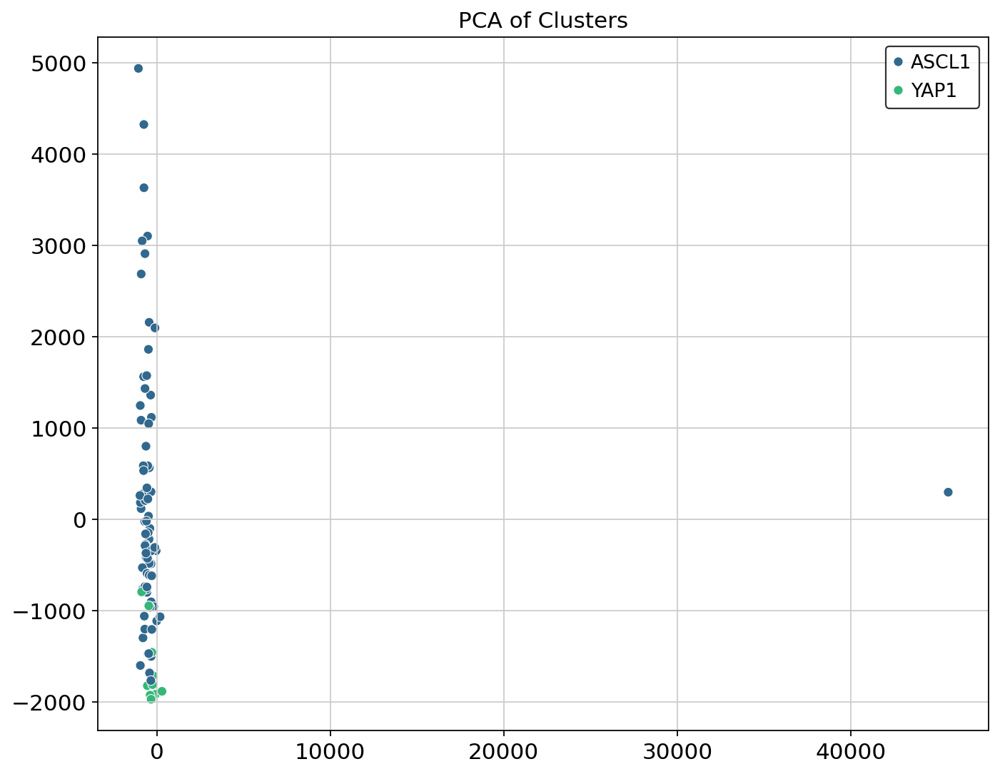

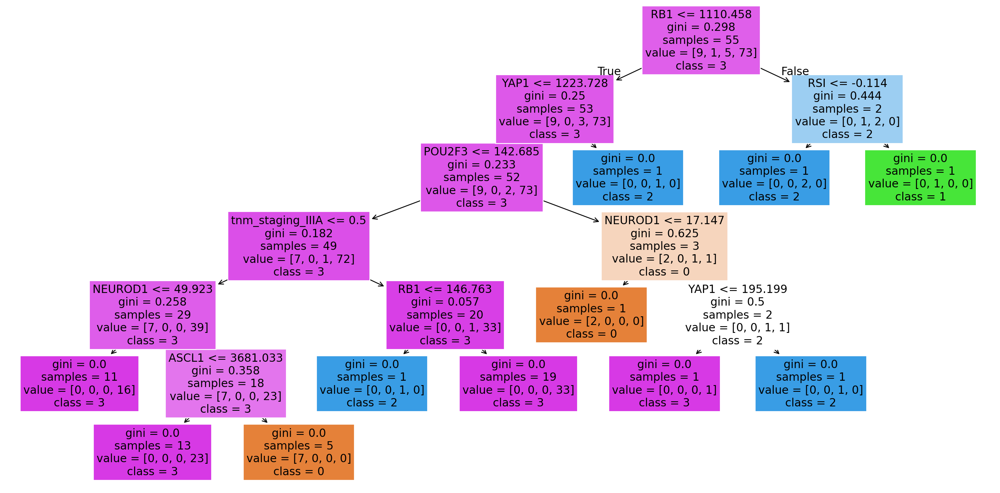

In [25]:
# Step 4: Cluster Validation
X_best = combined_data_preprocessed_df[best_vars]
cluster_labels = best_model.predict(X_best)
print(f"Best Variables: {best_vars}")
print(f"Silhouette Score: {silhouette_score(X_best, cluster_labels)}")
print(f"Davies-Bouldin Score: {davies_bouldin_score(X_best, cluster_labels)}")
print(f"Calinski-Harabasz Score: {calinski_harabasz_score(X_best, cluster_labels)}")

# Step 5: Assign Clusters to Subtypes
expr_data_cp = combined_data_preprocessed_df[mandatory_vars].copy()
expr_data_cp['Cluster'] = cluster_labels
cluster_profiles = expr_data_cp.groupby('Cluster').median()

# Automatically map clusters to subtypes based on the highest median gene expression
subtype_mapping = {}
for cluster in cluster_profiles.index:
    dominant_gene = cluster_profiles.loc[cluster].idxmax()
    
    if dominant_gene == 'ASCL1':
        subtype_mapping[cluster] = 'ASCL1'
    elif dominant_gene == 'NEUROD1':
        subtype_mapping[cluster] = 'NEUROD1'
    elif dominant_gene == 'YAP1':
        subtype_mapping[cluster] = 'YAP1'
    elif dominant_gene == 'POU2F3':
        subtype_mapping[cluster] = 'POU2F3'

# Print the final cluster profiles
print("Final Cluster Profiles (Median Gene Expression with Priors):")
print(cluster_profiles)
print("Subtype Mapping:", subtype_mapping)
    
# Step 6: Visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_best)
plt.figure(figsize=(10, 8))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=[subtype_mapping[cluster] for cluster in cluster_labels], palette='viridis')
plt.title('PCA of Clusters')
plt.show()

# Step 7: Supervised Learning
rf = RandomForestClassifier(random_state=42)
rf.fit(X_best, cluster_labels)

# Plot the decision tree
plt.figure(figsize=(20, 10))
plot_tree(rf.estimators_[0], feature_names=best_vars, class_names=[str(i) for i in range(4)], filled=True)
plt.show()

# TODO: try with gaussian kmeans and init using the median for each gene as initial_centroids...

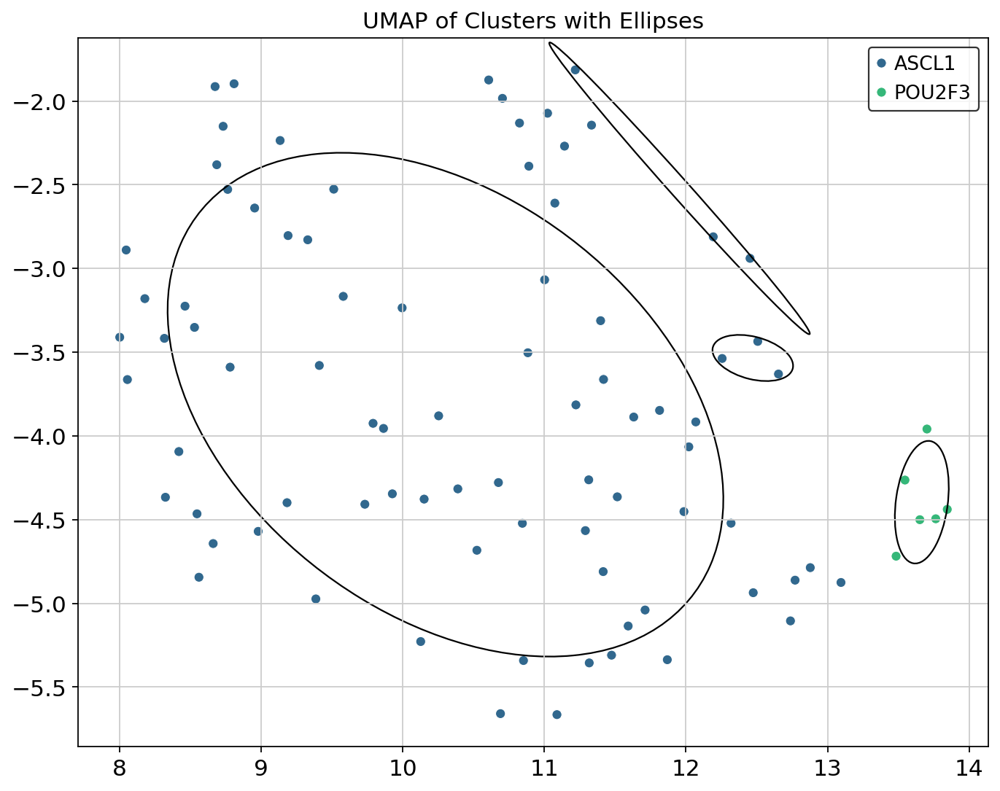

In [22]:

# Step 6: Visualization with UMAP
umap_reducer = umap.UMAP(n_components=2, random_state=42)
X_umap = umap_reducer.fit_transform(X_best)

# Function to plot ellipses
def plot_ellipses(ax, data, labels, n_clusters):
    for cluster in range(n_clusters):
        cluster_data = data[labels == cluster]
        if len(cluster_data) > 1:  # Need at least 2 points to fit an ellipse
            cov = np.cov(cluster_data, rowvar=False)
            mean = np.mean(cluster_data, axis=0)
            v, w = np.linalg.eigh(cov)
            v = 2.0 * np.sqrt(2.0) * np.sqrt(v)
            u = w[0] / np.linalg.norm(w[0])
            angle = np.arctan(u[1] / u[0])
            angle = 180.0 * angle / np.pi
            ell = Ellipse(mean, v[0], v[1], 180.0 + angle, edgecolor='black', facecolor='none')
            ax.add_patch(ell)

plt.figure(figsize=(10, 8))
ax = sns.scatterplot(x=X_umap[:, 0], y=X_umap[:, 1], hue=[subtype_mapping[cluster] for cluster in cluster_labels], palette='viridis')
plot_ellipses(ax, X_umap, cluster_labels, n_clusters=4)
plt.title('UMAP of Clusters with Ellipses')
plt.show()

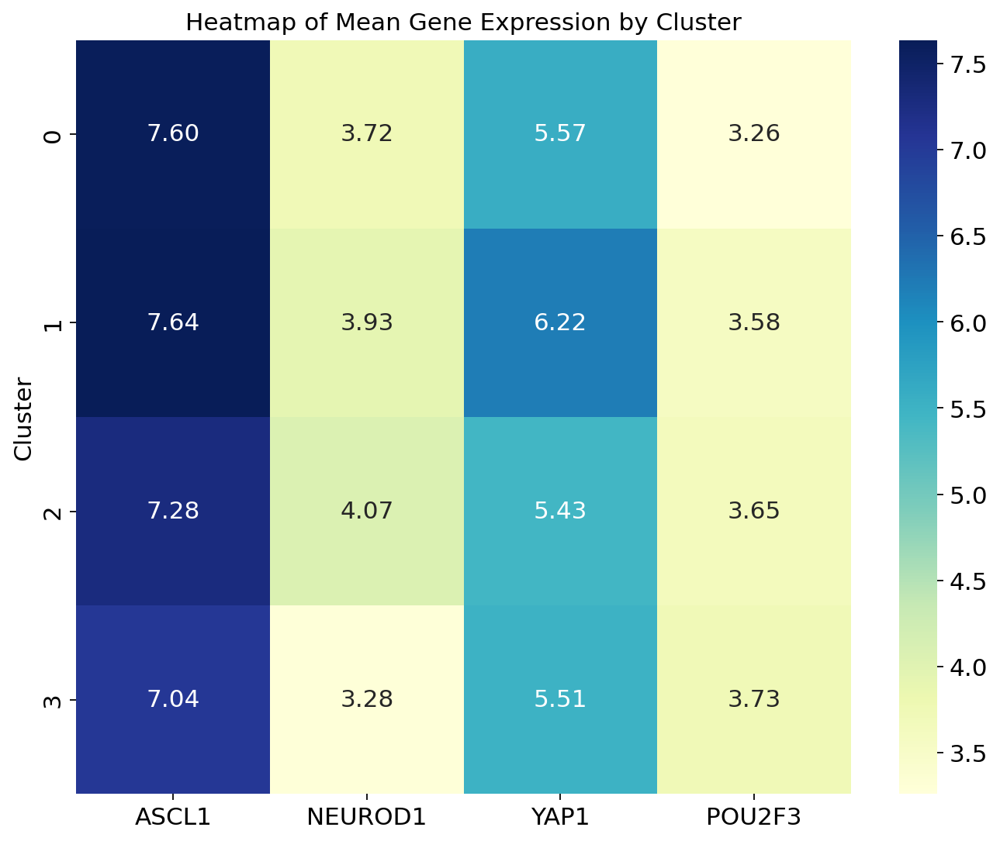

In [14]:
# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(cluster_profiles, annot=True, cmap='YlGnBu', fmt='.2f')
plt.title('Heatmap of Mean Gene Expression by Cluster')
plt.show()

# EM model

## Dotplot

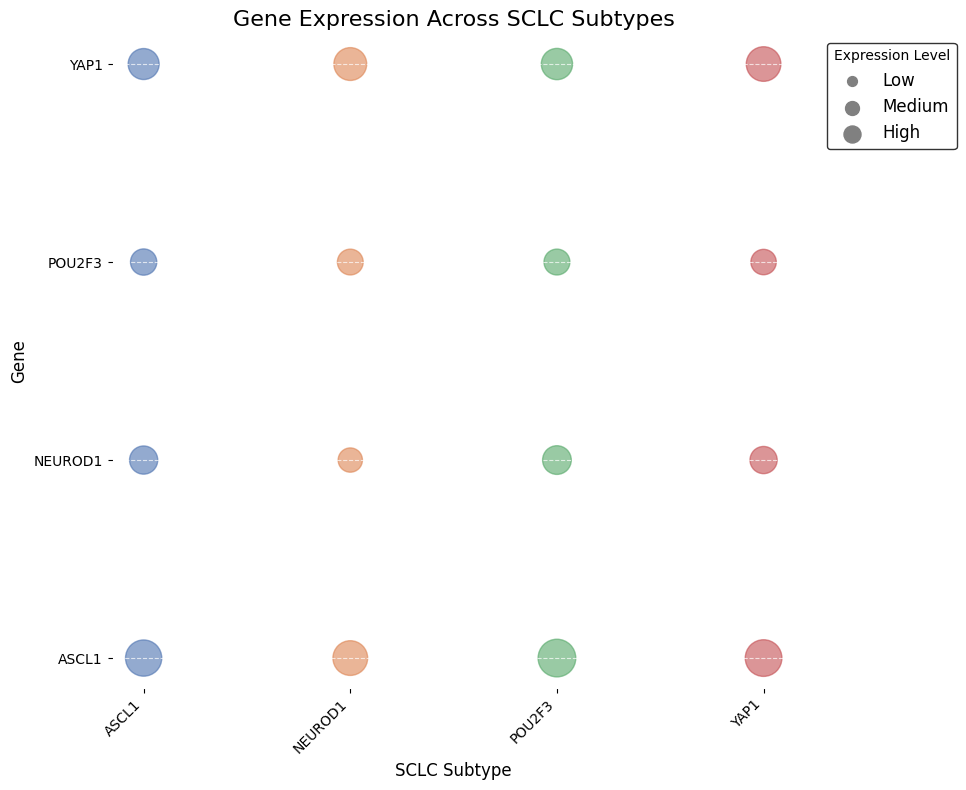

In [138]:


# Select the key genes for visualization
key_genes = ['YAP1', 'ASCL1', 'NEUROD1', 'POU2F3']
tagged_data = result['tagged_data']

# Melt the dataframe to long format for easier plotting
melted_df = tagged_data.melt(id_vars=['Sample_ID', 'Predicted_Class'], 
                             value_vars=key_genes, 
                             var_name='Gene', 
                             value_name='Expression')

# Create a pivot table for easier plotting
pivot_df = melted_df.pivot_table(values='Expression', index='Gene', columns='Predicted_Class', aggfunc='mean')

# Create the dot plot
fig, ax = plt.subplots(figsize=(10, 8))

# Define color palette
palette = sns.color_palette("deep", n_colors=len(pivot_df.columns))

# Plot dots
for i, subtype in enumerate(pivot_df.columns):
    sizes = pivot_df[subtype] * 100  # Adjust this multiplier to change overall dot sizes
    ax.scatter(y=pivot_df.index, x=[i]*len(pivot_df), s=sizes, color=palette[i], alpha=0.6, label=subtype)

# Customize the plot
ax.set_yticks(range(len(pivot_df.index)))
ax.set_yticklabels(pivot_df.index)
ax.set_xticks(range(len(pivot_df.columns)))
ax.set_xticklabels(pivot_df.columns, rotation=45, ha='right')

ax.set_xlabel("SCLC Subtype", fontsize=12)
ax.set_ylabel("Gene", fontsize=12)
ax.set_title('Gene Expression Across SCLC Subtypes', fontsize=16)

# Add gridlines
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Add legend
ax.legend(title='SCLC Subtype', loc='center left', bbox_to_anchor=(1, 0.5))

# Add a legend for dot sizes
sizes_legend = [50, 100, 150]
labels_legend = ['Low', 'Medium', 'High']
legend_elements = [plt.scatter([], [], s=size, c='gray', label=label) 
                   for size, label in zip(sizes_legend, labels_legend)]
ax.legend(handles=legend_elements, title='Expression Level', 
          loc='upper right', bbox_to_anchor=(1.25, 1))

plt.tight_layout()
plt.show()

## Hierarchical Clustering

In [ ]:
tagged_data = result['tagged_data']
grapher_subtype = pd.DataFrame(data=tagged_data["RSI"], index=tagged_data['Predicted_Class'].values, columns=tagged_data["Sample_ID"])
pivot_df = tagged_data.pivot_table(index='Predicted_Class', columns='Sample_ID', values='RSI', fill_value=0)
sorted_columns = sorted(pivot_df.columns, key=lambda x: tagged_data[tagged_data['Sample_ID'] == x]['Predicted_Class'].values[0])
pivot_df = pivot_df[sorted_columns]

sns.clustermap(pivot_df, 
				row_cluster=True, 
				col_cluster=False, 
				cmap="RdYlBu_r", 
				metric="euclidean",
				z_score=0, 
				yticklabels=pivot_df.index)

## Violing plot 

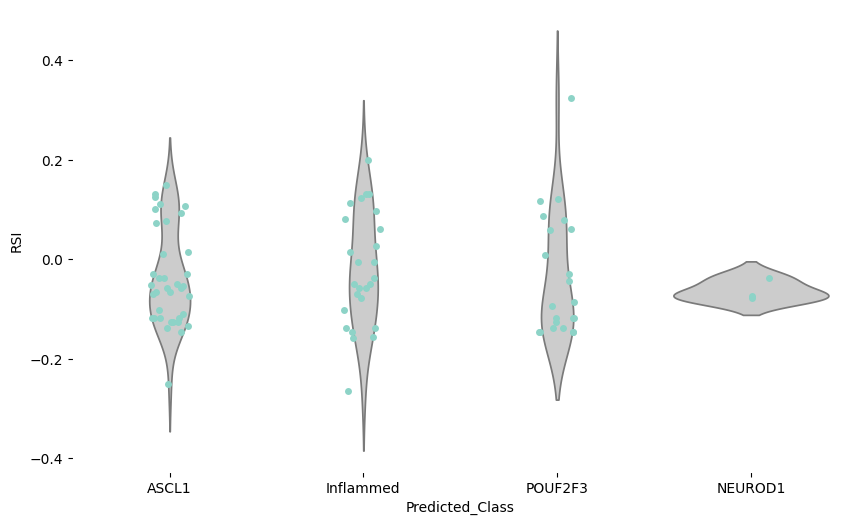

In [ ]:


# Example data

# Create a violin plot with Seaborn
plt.figure(figsize=(10, 6))
sns.violinplot(x="Predicted_Class", y="RSI", data=tagged_data, inner=None, color=".8")
sns.stripplot(x="Predicted_Class", y="RSI", data=tagged_data, jitter=True, zorder=1)
plt.show()

In [ ]:
tagged_data_cp = tagged_data.copy()

In [ ]:
tagged_data_cp

,Sample_ID,Organ,Arm,tnm_staging,RSI,age,brain_metastasis,os_corr,ttp_corr,ASCL1,NEUROD1,POU2F3,YAP1,BCL2,MYC,KRAS,Cluster,Predicted_Class
0,R1_79,Lymph Node,45 Gy/30 fraksjoner,IIIB,-0.118385,68.0,0.0,5.277267,4.032852,7.434639,5.759022,3.337348,5.402825,8.614557,3.633335,6.911153,2,ASCL1
1,R2_07,Lymph Node,60 Gy/40 fraksjoner,IIIA,-0.051521,72.0,0.0,17.689882,10.262812,3.835295,3.383670,7.122726,5.287066,8.618602,5.421601,7.320113,2,ASCL1
2,R2_22,Lung,60 Gy/40 fraksjoner,IIIB,-0.048989,71.0,0.0,96.427070,60.525624,7.631623,4.831283,3.769060,5.347347,7.021392,6.985320,6.811959,1,Inflammed
4,R1_19,Lung,60 Gy/40 fraksjoner,IIIA,0.077778,71.0,0.0,18.657030,17.427070,5.771913,6.495314,0.000000,6.411913,7.483867,5.221760,7.083203,2,ASCL1
5,R2_29,Lung,45 Gy/30 fraksjoner,IIIA,-0.118385,71.0,0.0,30.638633,11.131406,6.795968,2.973171,1.840723,6.058510,6.202539,3.989186,6.722173,0,POUF2F3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85,R2_56,Lymph Node,45 Gy/30 fraksjoner,IIIB,0.078759,77.0,0.0,33.229961,18.262812,8.269798,4.307581,3.061059,6.001249,6.603505,4.632307,6.864282,0,POUF2F3
86,R2_12,Lung,45 Gy/30 fraksjoner,IIIA,0.123612,66.0,0.0,73.408673,41.000000,6.542613,5.456406,3.535787,6.473037,7.664007,4.874860,6.746073,1,Inflammed
87,R2_33,Lung,60 Gy/40 fraksjoner,IIIA,-0.146623,61.0,0.0,33.886991,14.229961,7.613578,4.088452,3.449883,5.708024,7.586579,2.857694,6.470989,0,POUF2F3
88,R2_36,Lung,60 Gy/40 fraksjoner,IIIB,-0.145140,64.0,1.0,36.770039,29.901445,6.598059,4.730416,4.166635,6.496542,7.239267,3.134628,6.591380,0,POUF2F3


In [ ]:

# Step 1: Data Preparation
# Assuming tagged_data_cp is your DataFrame
# Example: tagged_data_cp = pd.DataFrame(...)

# Check if the target column exists
if 'Predicted_Class' not in tagged_data_cp.columns:
    raise ValueError("The target column 'Predicted_Class' does not exist in the DataFrame.")

exclude_cols = ["os_corr","ttp_corr", "Cluster"]
tagged_data_cp = tagged_data_cp[[col for col in tagged_data_cp.columns if col not in exclude_cols]]
try:
    # Set Sample_ID as the index
    tagged_data_cp.set_index('Sample_ID', inplace=True)
except:
    pass
# Identify categorical and numerical columns
categorical_cols = tagged_data_cp.select_dtypes(include=['object']).columns.tolist()
numerical_cols = tagged_data_cp.select_dtypes(include=[np.number]).columns.tolist()

# Add 'brain_metastasis' to categorical columns and remove from numerical columns
if 'brain_metastasis' in numerical_cols:
    numerical_cols.remove('brain_metastasis')
    categorical_cols.append('brain_metastasis')

# Define the target variable
target = 'Predicted_Class'  # Assuming 'Predicted_Class' is the target variable

# Step 2: Preprocessing
# Preprocessing for numerical data: standardize
numerical_transformer = StandardScaler()

# Preprocessing for categorical data: one-hot encode
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Preprocess the entire DataFrame
data_preprocessed = preprocessor.fit_transform(tagged_data_cp)

# Get feature names after one-hot encoding
feature_names = numerical_cols + preprocessor.transformers_[1][1].get_feature_names_out(categorical_cols).tolist()

# Convert the preprocessed data back to a DataFrame
data_preprocessed_df = pd.DataFrame(data_preprocessed, columns=feature_names)

# Add the target variable back to the DataFrame
data_preprocessed_df[target] = tagged_data_cp[target].values

# Step 3: Feature Selection
# Separate features and target
X = data_preprocessed_df.drop(columns=[target])
y = data_preprocessed_df[target]

# Step 4: Model Training
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the model
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)

# Evaluate the model
y_pred = model.predict_proba(X_test)[:, 1]

In [ ]:
y_pred

array([0.0270265 , 0.00164474, 0.00618608, 0.79920702, 0.98411189,
       0.91118383, 0.01991131, 0.03429318, 0.02295978, 0.00579524,
       0.04290652, 0.01482056, 0.95211708, 0.00955429, 0.77314593,
       0.0368301 , 0.00899095, 0.95391431])

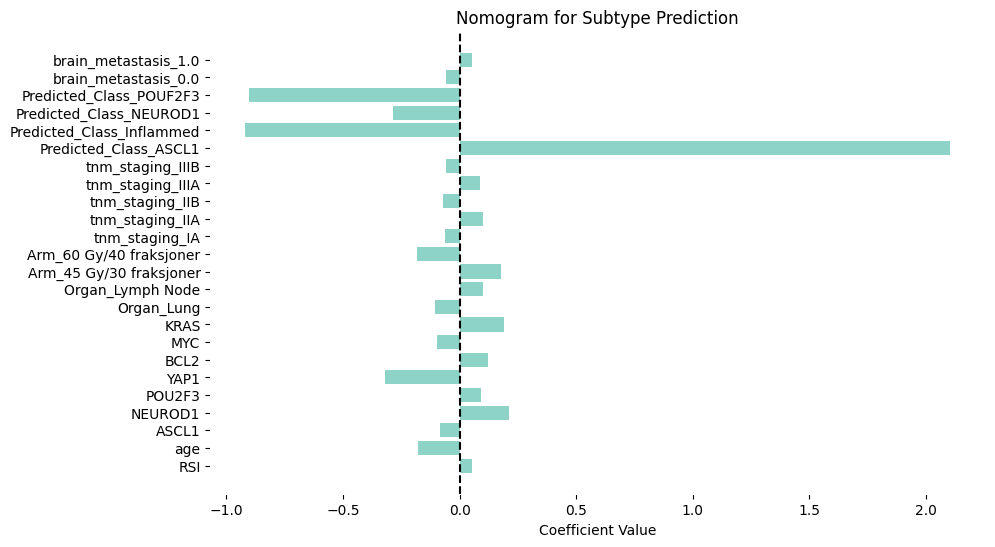

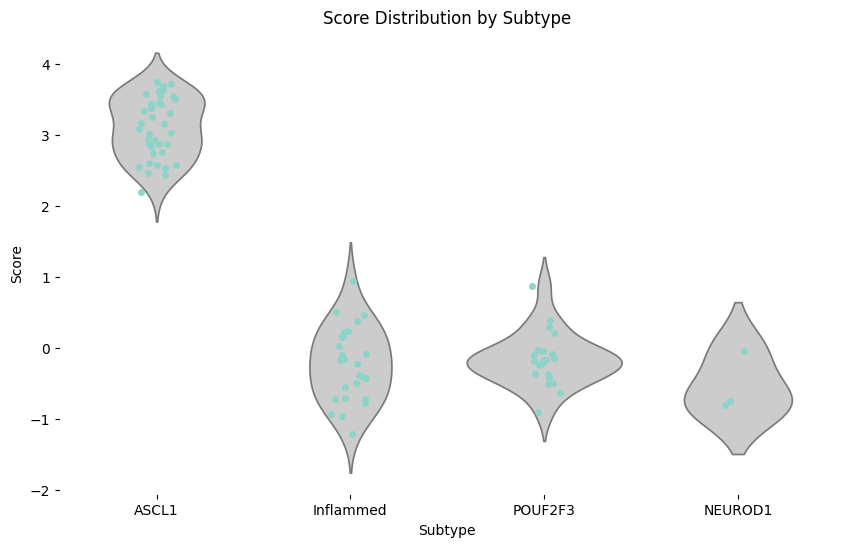

In [ ]:

#auc = roc_auc_score(y_test, y_pred)
#print(f'AUC: {auc:.2f}')

# Step 5: Nomogram Creation
# Extract the coefficients from the logistic regression model
coefficients = model.coef_[0]
intercept = model.intercept_[0]

# Plot the nomogram
plt.figure(figsize=(10, 6))
plt.barh(feature_names, coefficients)
plt.xlabel('Coefficient Value')
plt.title('Nomogram for Subtype Prediction')
plt.axvline(x=0, color='k', linestyle='--')
plt.show()

# Compute the score for each patient
data_preprocessed_df['score'] = np.dot(X, coefficients) + intercept

# Visualize the score distribution by subtype
plt.figure(figsize=(10, 6))
sns.violinplot(x=target, y='score', data=data_preprocessed_df, inner=None, color=".8")
sns.stripplot(x=target, y='score', data=data_preprocessed_df, jitter=True, zorder=1)
plt.xlabel('Subtype')
plt.ylabel('Score')
plt.title('Score Distribution by Subtype')
plt.show()